
# Mechuka Siang updated on 28 Jan 2025

### Topography Mechuka Siang, Converting DEM co-ordinate to swath line distance, 14 minute it takes

## Final code

In [5]:
print(f"Spatial resolution of the DEM_SRTM30: {tuple(round(x, 1) for x in rasterio.open(raster).res)}")

Spatial resolution of the DEM_SRTM30: (29.7, 29.1)


Topographic swath width 25 km
Topographic swath width 25 km
BS_swath_line
CRS of the shapefile: EPSG:32647
CRS of the DEM_SRTM30: EPSG:32647
CRS of the TRMM: EPSG:32647
Spatial resolution of the DEM_SRTM30: (29.6768727641321, 29.07642544082817)


/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/shapely/linear.py:88: RuntimeWarning: invalid value encountered in line_locate_point
  return lib.line_locate_point(line, other)
Calculating distances: 100%|█████| 14875995/14875995 [05:40<00:00, 43740.59it/s]
Calculating AHe distances: 0it [00:00, ?it/s]
/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/shapely/linear.py:88: RuntimeWarning: invalid value encountered in line_locate_point
  return lib.line_locate_point(line, other)
Calculating Age distances: 100%|████████████████| 3/3 [00:00<00:00, 8695.86it/s]
/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem

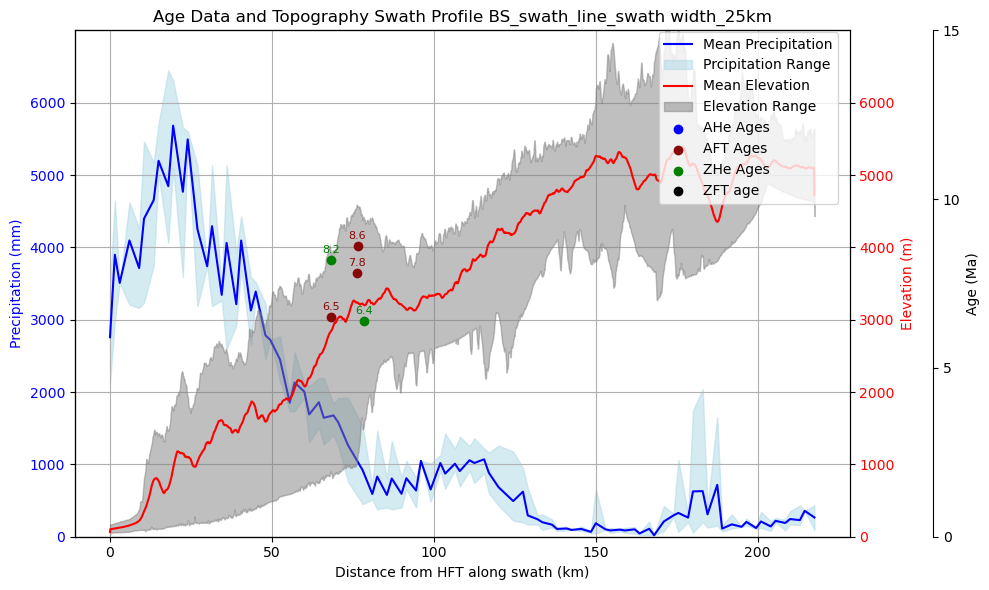

Swath profile data with AHe AFT ZHe ZFT saved to /home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_age/BS_swath_line_swath_Age_topography_with_AFT_ZFT.csv


In [3]:
## Load data from 1 to 10

# 1. Name of swath line of shape file (line)
shape ='BS_swath_line.shp'
# 2. Load swath line file
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
# 3. Name of DEM Geotiff file
DEM = 'Bhutan_Only_PROJ_EPSG_47N.tif'
# 4. Load the DEM Geotiff file
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+DEM
# 5. Name of precipitation Geotif file, (TRMM from Bookhagen et al., 2010)
DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
# 6. Load precipitation Geotif file, (TRMM from Bookhagen et al., 2010)
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip
# 7. Load AHe data (CSV with columns: Latitude, Longitude, Age)
AHe = 'AHe_after_2013.csv'
AHe_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AHe
# 8. Load AFT data (CSV with columns: Latitude, Longitude, Age)
AFT = 'AFT_after_2013.csv'
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT
# 9. Load ZFT data (CSV with columns: Latitude, Longitude, Age)
ZFT = 'ZFT_after_2013.csv'
ZFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + ZFT
# 10. Load ZHe data (CSV with columns: Latitude, Longitude, Age)
ZHe = 'ZHe_after_2013.csv'
ZHe_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + ZHe

############################--------------------------------##############################
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from tqdm import tqdm 
import os
import math


# Constants
fixed_Age_ymin = 0
fixed_Age_ymax = 15
fixed_precip_ymin = 0
fixed_precip_ymax = 7000
fixed_elevation_ymin = 0
fixed_elevation_ymax = 7000
precip_color_mean = "blue"
precip_color_fill = "skyblue"
elevation_color_mean = "red"
elevation_color_fill = "gray"
AHe_age_color = "Blue"
AFT_age_color = "#880808" # Blood red
ZHe_age_color = "Green"
ZFT_age_color = "Black"
Ylabel_age_color = "Black"
fixed_xmin = 0
fixed_xmax = 250000  # Assuming the maximum is in meters
dpi_fig = 500
swath_width_topo = 25000 # unit is in meter 1km = 1000m
print (f"Topographic swath width {round(swath_width_topo/1000)} km")
swath_width_precip = 25000 # unit is in meter 1km = 1000m
print (f'Topographic swath width {round(swath_width_precip/1000)} km')
bin_precip = 1500
bin_width_topo = 100 
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
print(shape_file_name)
print(f"CRS of the shapefile: EPSG:{gpd.read_file(baseline).crs.to_epsg()}" if gpd.read_file(baseline).crs.to_epsg() else "CRS of the shapefile: Unknown EPSG")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
print(f"CRS of the TRMM: {rasterio.open(raster_precip).crs}")
print(f"Spatial resolution of the DEM_SRTM30: {tuple(round(x, 1) for x in rasterio.open(raster).res)}")



##########################-------------------DEM-----------------------#############################
# Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Or define swath line manually 
# swath_coords = [(x1, y1), (x2, y2)]  # Replace with real coordinates x1 Longitude, y1 Latitude
# swath_line = LineString(swath_coords)

# (95.37871211904822, 28.095067581911987),  # Start (Longitude, Latitude)
#                (93.20151833453788, 29.005375617560578)

# Define width of swath line
buffer_width = swath_width_topo # Swath width in meters (e.g., 1000 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Elevation"])
bin_width = bin_width_topo  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary = df.groupby("Bin").agg(
    Mean_Elevation=("Elevation", "mean"),
    Min_Elevation=("Elevation", "min"),
    Max_Elevation=("Elevation", "max")
)
summary["Bin_Center"] = summary.index * bin_width

###############################-------------------------------------------AHe------------------------------------
# Load AHe data (CSV with columns: Latitude, Longitude, Age)
AHe_data = pd.read_csv(AHe_herman)  # Replace with the actual path to the AHe CSV file

# Convert AHe data to GeoDataFrame
AHe_geometry = [Point(xy) for xy in zip(AHe_data["Longitude"], AHe_data["Latitude"])]
AHe_gdf = gpd.GeoDataFrame(AHe_data, geometry=AHe_geometry, crs="EPSG:4326")

# Reproject AHe data to match DEM CRS
AHe_gdf = AHe_gdf.to_crs(dem.crs)

# Filter AHe points within the swath buffer
AHe_Ages_within_swath = AHe_gdf[AHe_gdf.geometry.within(swath_buffer)]

# Project AHe points to swath distances
AHe_distances = []
for point in tqdm(AHe_Ages_within_swath.geometry, desc="Calculating AHe distances", total=len(AHe_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    AHe_distances.append(distance)

AHe_Ages_within_swath["Distance"] = AHe_distances


###############################-------------------------------------------AFT------------------------------------
# Load Age data (CSV with columns: Latitude, Longitude, Age)
Age_data = pd.read_csv(AFT_herman)

# Convert to GeoDataFrame

geometry = [Point(xy) for xy in zip(Age_data["Longitude"], Age_data["Latitude"])]
Age_gdf = gpd.GeoDataFrame(Age_data, geometry=geometry, crs="EPSG:4326")

# Reproject Age data to match DEM CRS
Age_gdf = Age_gdf.to_crs(dem.crs)
# Age_gdf
# print(f"CRS of the Precipitation_TRMM: {Age_gdf.crs}")
#------------------------------------------------------------------------
# 
buffer_width = swath_width_precip   # 100 km buffer
swath_buffer = swath_line.buffer(buffer_width)

# Filter Age data points within the swath buffer
AFT_Ages_within_swath = Age_gdf[Age_gdf.geometry.within(swath_buffer)]

# Project points to swath distances
from shapely.ops import nearest_points

Age_distances = []
for point in tqdm(AFT_Ages_within_swath.geometry, desc="Calculating Age distances", total=len(AFT_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    Age_distances.append(distance)

AFT_Ages_within_swath["Distance"] = Age_distances

###############################-------------------------------------------ZHe------------------------------------
# Load ZHe data (CSV with columns: Latitude, Longitude, Age)
ZHe_data = pd.read_csv(ZHe_herman)  # Replace with the actual path to the ZHe CSV file

# Convert ZHe data to GeoDataFrame
ZHe_geometry = [Point(xy) for xy in zip(ZHe_data["Longitude"], ZHe_data["Latitude"])]
ZHe_gdf = gpd.GeoDataFrame(ZHe_data, geometry=ZHe_geometry, crs="EPSG:4326")

# Reproject ZHe data to match DEM CRS
ZHe_gdf = ZHe_gdf.to_crs(dem.crs)

# Filter ZHe points within the swath buffer
ZHe_Ages_within_swath = ZHe_gdf[ZHe_gdf.geometry.within(swath_buffer)]

# Project ZHe points to swath distances
ZHe_distances = []
for point in tqdm(ZHe_Ages_within_swath.geometry, desc="Calculating ZHe distances", total=len(ZHe_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    ZHe_distances.append(distance)

ZHe_Ages_within_swath["Distance"] = ZHe_distances

###############################-------------------------------------------ZFT------------------------------------


# Load ZFT data
ZFT_data = pd.read_csv(ZFT_herman)

# Convert ZFT data to GeoDataFrame
ZFT_geometry = [Point(xy) for xy in zip(ZFT_data["Longitude"], ZFT_data["Latitude"])]
ZFT_gdf = gpd.GeoDataFrame(ZFT_data, geometry=ZFT_geometry, crs="EPSG:4326")

# Reproject ZFT data to match DEM CRS
ZFT_gdf = ZFT_gdf.to_crs(dem.crs)

# Filter ZFT points within the swath buffer
ZFT_Ages_within_swath = ZFT_gdf[ZFT_gdf.geometry.within(swath_buffer)]

# Project ZFT points to swath distances
ZFT_distances = []
for point in tqdm(ZFT_Ages_within_swath.geometry, desc="Calculating ZFT distances", total=len(ZFT_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    ZFT_distances.append(distance)

ZFT_Ages_within_swath["Distance"] = ZFT_distances



###########--------------------------------AHe AFT ZHe ZFT---------------################
# Ensure all Age columns are numeric
AFT_Ages_within_swath["Age"] = pd.to_numeric(AFT_Ages_within_swath["Age"], errors="coerce")
ZFT_Ages_within_swath["Age"] = pd.to_numeric(ZFT_Ages_within_swath["Age"], errors="coerce")
AHe_Ages_within_swath["Age"] = pd.to_numeric(AHe_Ages_within_swath["Age"], errors="coerce")
ZHe_Ages_within_swath["Age"] = pd.to_numeric(ZHe_Ages_within_swath["Age"], errors="coerce")

# Drop rows with invalid (NaN) Ages if needed
AFT_Ages_within_swath.dropna(subset=["Age"], inplace=True)
ZFT_Ages_within_swath.dropna(subset=["Age"], inplace=True)
AHe_Ages_within_swath.dropna(subset=["Age"], inplace=True)
ZHe_Ages_within_swath.dropna(subset=["Age"], inplace=True)

#########-----------------------------------------Precipitation---------------------########################
# # Precipitation and Age

# # Load topographic data (e.g., DEM)
dem_path = raster_precip
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Define width of swath line
buffer_width = swath_width_topo # Swath width in meters (e.g., 1000 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Precipitation"])
bin_width = bin_precip  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary_precip = df.groupby("Bin").agg(
    Mean_Precipitation=("Precipitation", "mean"),
    Min_Precipitation=("Precipitation", "min"),
    Max_Precipitation=("Precipitation", "max")
)
summary_precip["Bin_Center"] = summary_precip.index * bin_width

##########----------------------------------Plotting-----------------------#############################


# plot swath profile
fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color="blue", label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color="lightblue",
    alpha=0.5,
    label="Prcipitation Range"
)

ax1.set_xticks(range(0, fixed_xmax + 50000, 50000))  # Set tick positions
ax1.set_xticklabels([f"{x//1000}" for x in range(0, fixed_xmax + 50000, 50000)])  # Set labels

ax1.set_xlabel("Distance from HFT along swath (km)")
ax1.set_ylim(fixed_precip_ymin, fixed_precip_ymax)
ax1.set_yticks(range(fixed_precip_ymin, fixed_precip_ymax + 0, 1000))
ax1.set_ylabel("Precipitation (mm)", color=precip_color_mean)
ax1.tick_params(axis="y", labelcolor=precip_color_mean)

# Plot elevation profile on a second y-axis-----------------
ax2 = ax1.twinx()
ax2.plot(
    summary["Bin_Center"],
    summary["Mean_Elevation"],
    color=elevation_color_mean,
    label="Mean Elevation"
)
ax2.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color=elevation_color_fill,
    alpha=0.5,
    label="Elevation Range"
)

ax2.set_ylabel("Elevation (m)", color=elevation_color_mean)
ax2.tick_params(axis="y", labelcolor=elevation_color_mean)

ax2.set_xticks(range(0, fixed_xmax + 50000, 50000))  # Set tick positions
ax2.set_xticklabels([f"{x//1000}" for x in range(0, fixed_xmax + 50000, 50000)])  # Set labels

ax2.set_ylim(fixed_precip_ymin, fixed_precip_ymax)
ax2.set_yticks(range(fixed_precip_ymin, fixed_precip_ymax + 0, 1000))
# ax1.set_ylabel("Precipitation (mm)", color=precip_color_mean)
# ax2.tick_params(axis="y", labelcolor=precip_color_mean)

# Plot AFT Ages on a third y-axis------------------------------------------
ax3 = ax1.twinx()
ax3.spines["right"].set_position(("outward", 60))  # Offset for third y-axis

# Plot AHe Ages
sc_ahe = ax3.scatter(
    AHe_Ages_within_swath["Distance"],
    AHe_Ages_within_swath["Age"],
    color=AHe_age_color,
    label="AHe Ages",
    alpha=1
)

# Annotate AHe Ages
for i, row in AHe_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color=AHe_age_color
        
    )

sc_aft = ax3.scatter(
    AFT_Ages_within_swath["Distance"],
    AFT_Ages_within_swath["Age"],
    color=AFT_age_color,
    label="AFT Ages",
    alpha=1
)
# Annotate AFT Ages
for i, row in AFT_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color=AFT_age_color
    )

# Plot ZHe Ages
sc_zhe = ax3.scatter(
    ZHe_Ages_within_swath["Distance"],
    ZHe_Ages_within_swath["Age"],
    color=ZHe_age_color,
    label="ZHe Ages",
    alpha=1
)

# Annotate ZHe Ages
for i, row in ZHe_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color=ZHe_age_color
    )

# Plot ZFT Ages
sc_zft = ax3.scatter(
    ZFT_Ages_within_swath["Distance"],
    ZFT_Ages_within_swath["Age"],
    color=ZFT_age_color,
    label="ZFT age",
    alpha=1
)

# Annotate ZFT Ages
for i, row in ZFT_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color=ZFT_age_color
    )


# Set Age y-axis
ax3.set_ylim(fixed_Age_ymin, fixed_Age_ymax)
ax3.set_yticks(range(fixed_Age_ymin, fixed_Age_ymax + 5, 5))
ax3.set_ylabel("Age (Ma)", color=Ylabel_age_color)
ax3.tick_params(axis="y", labelcolor=Ylabel_age_color)

# Add title, grid, and legend
plt.title(f"Age Data and Topography Swath Profile {shape_file_name}_swath width_{round(swath_width_topo/1000)}km")
ax1.grid()

# Combine legends
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.95))

# Layout adjustments and save figure
plt.tight_layout()
plt.show()

# Save figure
fig.savefig(
    f'/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_age/swath_output_figures/{shape_file_name}_Age_precip_topo_swath_width{swath_width_topo}km.pdf',
    dpi=dpi_fig
)

# Close the figure
plt.close(fig)


#####################-----------------------------------to csv all data-------------#############
# Combine Age data with topography profile
swath_profile_df = pd.DataFrame({
    "AHe_Distance(meter)": round(AHe_Ages_within_swath["Distance"],0).astype(int),
    "AHe_Age(Ma)": AHe_Ages_within_swath["Age"],
    "AFT_Distance(meter)": round(AFT_Ages_within_swath["Distance"],0).astype(int),
    "AFT_Age(Ma)": AFT_Ages_within_swath["Age"],
    "ZHe_Distance(meter)": round(ZHe_Ages_within_swath["Distance"]).astype(int),
    "ZHe_Age(Ma)": ZHe_Ages_within_swath["Age"],
    "ZFT_Distance(meter)": round(ZFT_Ages_within_swath["Distance"]).astype(int),
    "ZFT_Age(Ma)": ZFT_Ages_within_swath["Age"],
    "Elevation_Distance(meter)": summary["Bin_Center"].astype(int),
    "Mean_Elevation(m)": summary["Mean_Elevation"].astype(int),
    "Min_Elevation(m)": summary["Min_Elevation"].astype(int),
    "Max_Elevation(m)": summary["Max_Elevation"].astype(int),
    "Precipitation_Distance(meter)": summary_precip["Bin_Center"].astype(int),
    "Mean_Precipitation(mm)": summary_precip["Mean_Precipitation"].astype(int),
    "Min_Precipitation(mm)": summary_precip["Min_Precipitation"].astype(int),
    "Max_Precipitation(mm)": summary_precip["Max_Precipitation"].astype(int)
})

#Save the combined data to a CSV file
output_csv_path = f"/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_age/{shape_file_name}_swath_Age_topography_with_AFT_ZFT.csv"
swath_profile_df.to_csv(output_csv_path, index=False)

print(f"Swath profile data with AHe AFT ZHe ZFT saved to {output_csv_path}")



# Simple swath

Topographic swath width 25 km
Topographic swath width 25 km
swath_subansiri_siyom_NB_proj_47
CRS of the shapefile: EPSG:32647
CRS of the DEM_SRTM30: EPSG:32647
CRS of the TRMM: EPSG:32647
Spatial resolution of the DEM_SRTM30: (29.3, 29.2)
CRS of the shapefile: EPSG:32647
CRS of the DEM_SRTM30: EPSG:32647


Calculating distances: 100%|█████| 11601245/11601245 [04:31<00:00, 42719.58it/s]


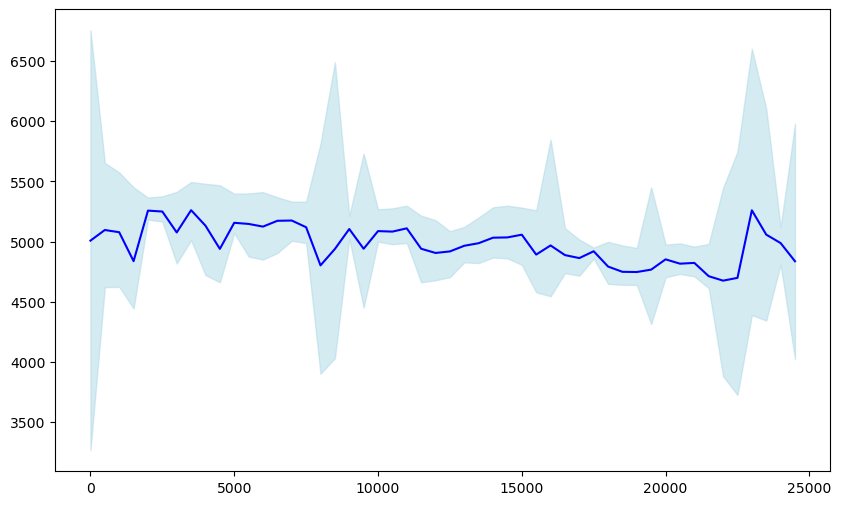

In [7]:
# Precipitation and Age
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from tqdm import tqdm 
import os

# Constants
fixed_Age_ymin = 0
fixed_Age_ymax = 15
fixed_precip_ymin = 0
fixed_precip_ymax = 7000
fixed_elevation_ymin = 0
fixed_elevation_ymax = 7000
precip_color_mean = "blue"
precip_color_fill = "skyblue"
elevation_color_mean = "red"
elevation_color_fill = "gray"
AHe_age_color = "Blue"
AFT_age_color = "#880808" # Blood red
ZHe_age_color = "Green"
ZFT_age_color = "Black"
Ylabel_age_color = "Black"
fixed_xmin = 0
fixed_xmax = 250000  # Assuming the maximum is in meters
dpi_fig = 500
swath_width_topo = 25000 # unit is in meter 1km = 1000m
print (f"Topographic swath width {round(swath_width_topo/1000)} km")
swath_width_precip = 25000 # unit is in meter 1km = 1000m
print (f'Topographic swath width {round(swath_width_precip/1000)} km')
bin_precip = 100
bin_width_topo = 100 
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
print(shape_file_name)
print(f"CRS of the shapefile: EPSG:{gpd.read_file(baseline).crs.to_epsg()}" if gpd.read_file(baseline).crs.to_epsg() else "CRS of the shapefile: Unknown EPSG")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
print(f"CRS of the TRMM: {rasterio.open(raster_precip).crs}")
print(f"Spatial resolution of the DEM_SRTM30: {tuple(round(x, 1) for x in rasterio.open(raster).res)}")

# shape= 'swath_subanshiri_middle_proj.shp'
# shape ='subanshiri_swath_middle_EPSG_47.shp'
# shape ='mechuka_siang.shp'
shape = 'swath_subansiri_siyom_NB_proj_47.shp'

DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
AFT = 'AFT_after_2013.csv'
# baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
baseline = '/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[3]_LSD_Topo_files/Tributary_Mechuka_Siang_Subansiri_Yarlung/'+shape
DEM = 'Bhutan_Arunachal_EPSG_47_PROJ.tif' # SRTM 30
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+DEM
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
# print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

swath_width_topo = 50000 # unit is in meter 1km = 1000m
swath_width_precip = 50000 # unit is in meter 1km = 1000m
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
shape_file_name
bin_precip = 500

# # Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Define width of swath line
buffer_width = swath_width_topo # Swath width in meters (e.g., 1000 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Precipitation"])
bin_width = bin_precip  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary_precip = df.groupby("Bin").agg(
    Mean_Precipitation=("Precipitation", "mean"),
    Min_Precipitation=("Precipitation", "min"),
    Max_Precipitation=("Precipitation", "max")
)
summary_precip["Bin_Center"] = summary_precip.index * bin_width


fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot topography profile
# ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
# ax1.set_ylabel("Elevation (m)", color="brown")
# ax1.tick_params(axis="y", labelcolor="brown")
ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color="blue", label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color="lightblue",
    alpha=0.5,
    label="Prcipitation Range"
)


Topographic swath width 25 km
Topographic swath width 25 km
swath_subansiri_siyom_NB_proj_47
CRS of the shapefile: EPSG:32647
CRS of the DEM_SRTM30: EPSG:32647
CRS of the TRMM: EPSG:32647
Spatial resolution of the DEM_SRTM30: (29.3, 29.2)
CRS of the shapefile: EPSG:32647
CRS of the DEM_SRTM30: EPSG:32647


Calculating distances: 100%|███████████| 92085/92085 [00:02<00:00, 42589.13it/s]


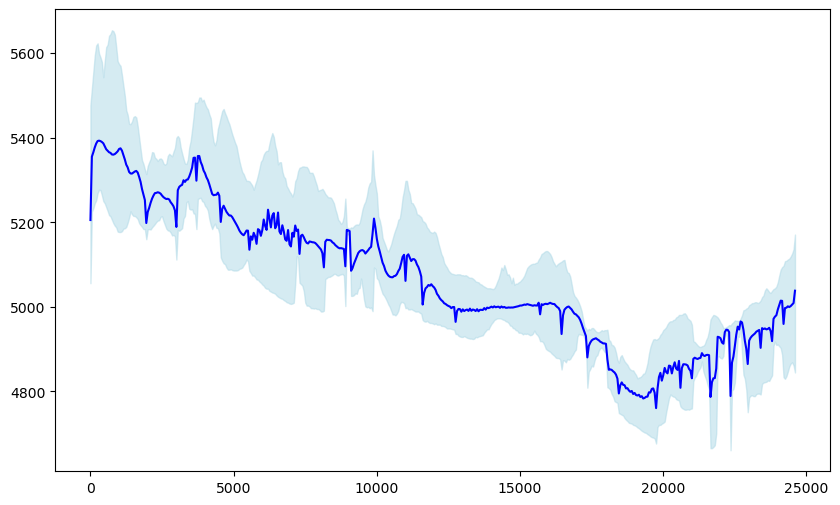

In [14]:
# Precipitation and Age
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from tqdm import tqdm 
import os

# Constants
fixed_Age_ymin = 0
fixed_Age_ymax = 15
fixed_precip_ymin = 0
fixed_precip_ymax = 7000
fixed_elevation_ymin = 0
fixed_elevation_ymax = 7000
precip_color_mean = "blue"
precip_color_fill = "skyblue"
elevation_color_mean = "red"
elevation_color_fill = "gray"
AHe_age_color = "Blue"
AFT_age_color = "#880808" # Blood red
ZHe_age_color = "Green"
ZFT_age_color = "Black"
Ylabel_age_color = "Black"
fixed_xmin = 0
fixed_xmax = 250000  # Assuming the maximum is in meters
dpi_fig = 500
swath_width_topo = 25000 # unit is in meter 1km = 1000m
print (f"Topographic swath width {round(swath_width_topo/1000)} km")
swath_width_precip = 25000 # unit is in meter 1km = 1000m
print (f'Topographic swath width {round(swath_width_precip/1000)} km')
bin_precip = 1500
bin_width_topo = 100 
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
print(shape_file_name)
print(f"CRS of the shapefile: EPSG:{gpd.read_file(baseline).crs.to_epsg()}" if gpd.read_file(baseline).crs.to_epsg() else "CRS of the shapefile: Unknown EPSG")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
print(f"CRS of the TRMM: {rasterio.open(raster_precip).crs}")
print(f"Spatial resolution of the DEM_SRTM30: {tuple(round(x, 1) for x in rasterio.open(raster).res)}")

# shape= 'swath_subanshiri_middle_proj.shp'
# shape ='subanshiri_swath_middle_EPSG_47.shp'
# shape ='mechuka_siang.shp'
shape = 'swath_subansiri_siyom_NB_proj_47.shp'

DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
AFT = 'AFT_after_2013.csv'
# baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
baseline = '/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[3]_LSD_Topo_files/Tributary_Mechuka_Siang_Subansiri_Yarlung/'+shape
DEM = 'Bhutan_Arunachal_EPSG_47_PROJ.tif' # SRTM 30
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+DEM
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
# print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

swath_width_topo = 1500 # unit is in meter 1km = 1000m
swath_width_precip = 1000 # unit is in meter 1km = 1000m
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
shape_file_name
bin_precip = 50

# # Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Define width of swath line
buffer_width = swath_width_topo # Swath width in meters (e.g., 1000 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Precipitation"])
bin_width = bin_precip  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary_precip = df.groupby("Bin").agg(
    Mean_Precipitation=("Precipitation", "mean"),
    Min_Precipitation=("Precipitation", "min"),
    Max_Precipitation=("Precipitation", "max")
)
summary_precip["Bin_Center"] = summary_precip.index * bin_width


fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot topography profile
# ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
# ax1.set_ylabel("Elevation (m)", color="brown")
# ax1.tick_params(axis="y", labelcolor="brown")
ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color="blue", label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color="lightblue",
    alpha=0.5,
    label="Prcipitation Range"
)


# Simple swath

CRS of the shapefile: EPSG:32647
CRS of the DEM_SRTM30: EPSG:32647


Calculating distances: 100%|█████| 18273382/18273382 [06:49<00:00, 44668.73it/s]


NameError: name 'fixed_xmax' is not defined

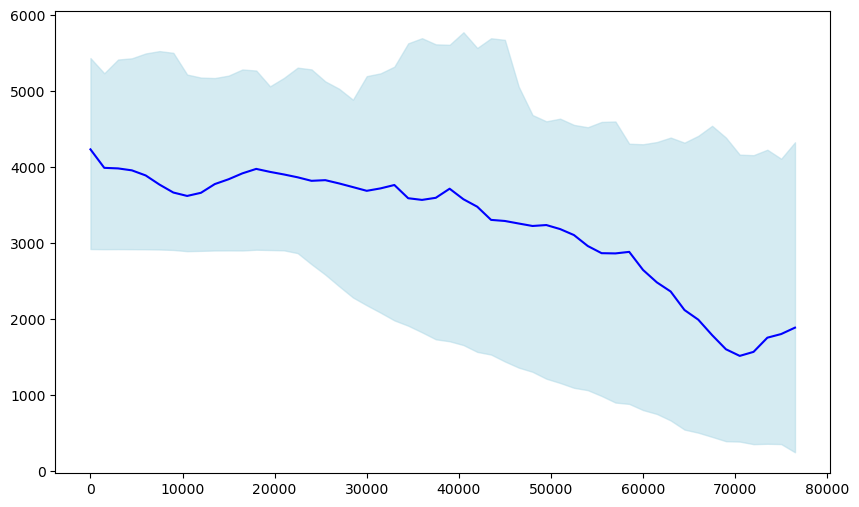

In [1]:
# Precipitation and Age
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from tqdm import tqdm 
import os


# shape= 'swath_subanshiri_middle_proj.shp'
# shape ='subanshiri_swath_middle_EPSG_47.shp'
#shape ='mechuka_siang.shp'
shape ='swath_27_3_4_proj.shp'

DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
AFT = 'AFT_after_2013.csv'
baseline = "/home/prayoga/prayoga_work_2025/jupyter-my/lsdtopo/Concavity_0.45/Swath_line_27_3_4/"+shape
#baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
DEM = 'Bhutan_Arunachal_EPSG_47_PROJ.tif' # SRTM 30
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+DEM
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
# print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

swath_width_topo = 50000 # unit is in meter 1km = 1000m
swath_width_precip = 50000 # unit is in meter 1km = 1000m
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
shape_file_name
bin_precip = 1500

# # Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Define width of swath line
buffer_width = swath_width_topo # Swath width in meters (e.g., 1000 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Precipitation"])
bin_width = bin_precip  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary_precip = df.groupby("Bin").agg(
    Mean_Precipitation=("Precipitation", "mean"),
    Min_Precipitation=("Precipitation", "min"),
    Max_Precipitation=("Precipitation", "max")
)
summary_precip["Bin_Center"] = summary_precip.index * bin_width




fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot topography profile
# ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
# ax1.set_ylabel("Elevation (m)", color="brown")
# ax1.tick_params(axis="y", labelcolor="brown")
ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color="blue", label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color="lightblue",
    alpha=0.5,
    label="Prcipitation Range"
)

ax1.set_xticklabels([f"{x//1000}" for x in range(0, fixed_xmax + 50000, 50000)])  # Set labels

In [78]:
print (f"Topographic swath width {round(swath_width_topo/1000)} km")
swath_width_precip = 25000 # unit is in meter 1km = 1000m
print (f'Topographic swath width {round(swath_width_precip/1000)} km')

Topographic swath width 25 km
Topographic swath width 25 km


In [86]:
print(f"Spatial resolution of the DEM_SRTM30: {tuple(round(rasterio.open(raster).res))}")

TypeError: type tuple doesn't define __round__ method

In [83]:
print(f"Spatial resolution of the DEM_SRTM30: {tuple(round(r) for r in rasterio.open(raster).res)}")


Spatial resolution of the DEM_SRTM30: (28, 28)


In [6]:
import geopandas as gpd
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from shapely.geometry import Polygon

# Load the swath line shapefile
swath_shapefile = baseline  # Replace with your shapefile path
gdf = gpd.read_file(swath_shapefile)

# Extract the swath line geometry
swath_line = gdf.geometry[0]  # Assuming only one line in the shapefile

# Define the swath width (25 km in meters)
swath_width = 25000  # 25 km in meters

# Create a buffered swath line (parallel offset)
left_buffer = swath_line.parallel_offset(distance=-swath_width / 2, side='left')
right_buffer = swath_line.parallel_offset(distance=swath_width / 2, side='right')

# Create a polygon (rectangle) from the buffered swath lines
swath_polygon = Polygon([list(left_buffer.coords), list(right_buffer.coords)])

# Load DEM using rasterio
raster = raster  # Replace with your DEM file path
with rasterio.open(raster) as src:
    dem = src.read(1)  # Read the first band (DEM)
    transform = src.transform  # Get the affine transform

# Plot the DEM
plt.figure(figsize=(10, 8))
plt.imshow(dem, cmap='terrain', extent=src.bounds)
plt.colorbar(label='Elevation (m)')

# Plot the swath box
x, y = swath_polygon.exterior.xy
plt.plot(x, y, color='red', linewidth=2)  # Red line for swath box

plt.title("DEM with Swath Box")
plt.xlabel("Longitude (m)")
plt.ylabel("Latitude (m)")
plt.show()


TypeError: float() argument must be a string or a real number, not 'tuple'

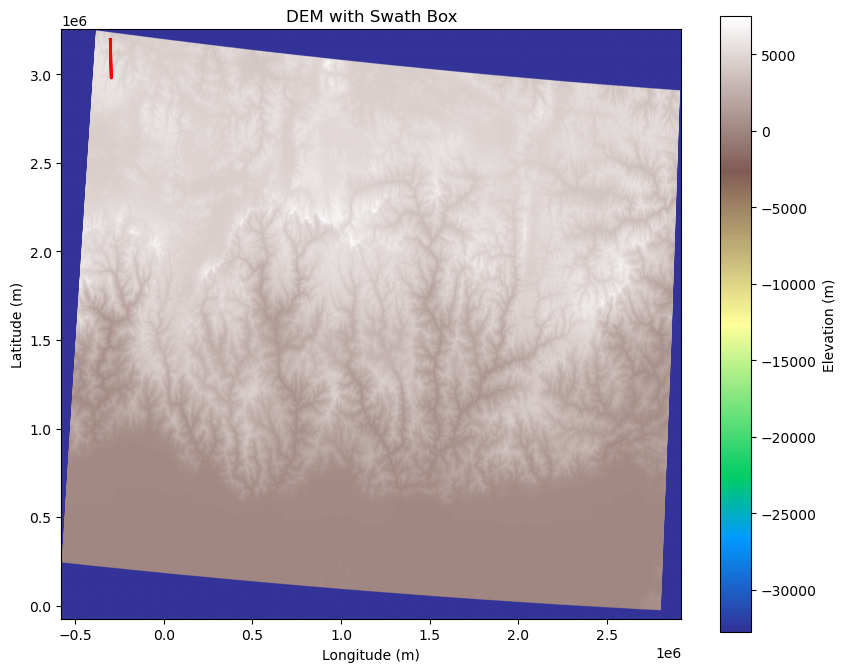

In [7]:
import geopandas as gpd
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from shapely.geometry import Polygon

# Load the swath line shapefile
swath_shapefile =baseline # Replace with your shapefile path
gdf = gpd.read_file(swath_shapefile)

# Extract the swath line geometry
swath_line = gdf.geometry[0]  # Assuming only one line in the shapefile

# Define the swath width (25 km in meters)
swath_width = 25000  # 25 km in meters

# Create a buffered swath line (parallel offset)
left_buffer = swath_line.parallel_offset(distance=-swath_width / 2, side='left')
right_buffer = swath_line.parallel_offset(distance=swath_width / 2, side='right')

# Convert the buffered lines to coordinates
left_coords = list(left_buffer.coords)
right_coords = list(right_buffer.coords)

# Make sure the polygon is closed by adding the first point of the left buffer to the end of the right buffer
right_coords.reverse()  # Reverse the right buffer coordinates to connect the lines
swath_coords = left_coords + right_coords

# Create a polygon (rectangle) from the buffered swath lines
swath_polygon = Polygon(swath_coords)

# Load DEM using rasterio
raster = raster # Replace with your DEM file path
with rasterio.open(raster) as src:
    dem = src.read(1)  # Read the first band (DEM)
    transform = src.transform  # Get the affine transform

# Plot the DEM
plt.figure(figsize=(10, 8))
plt.imshow(dem, cmap='terrain', extent=src.bounds)
plt.colorbar(label='Elevation (m)')

# Plot the swath box
x, y = swath_polygon.exterior.xy
plt.plot(x, y, color='red', linewidth=2)  # Red line for swath box

plt.title("DEM with Swath Box")
plt.xlabel("Longitude (m)")
plt.ylabel("Latitude (m)")
plt.show()


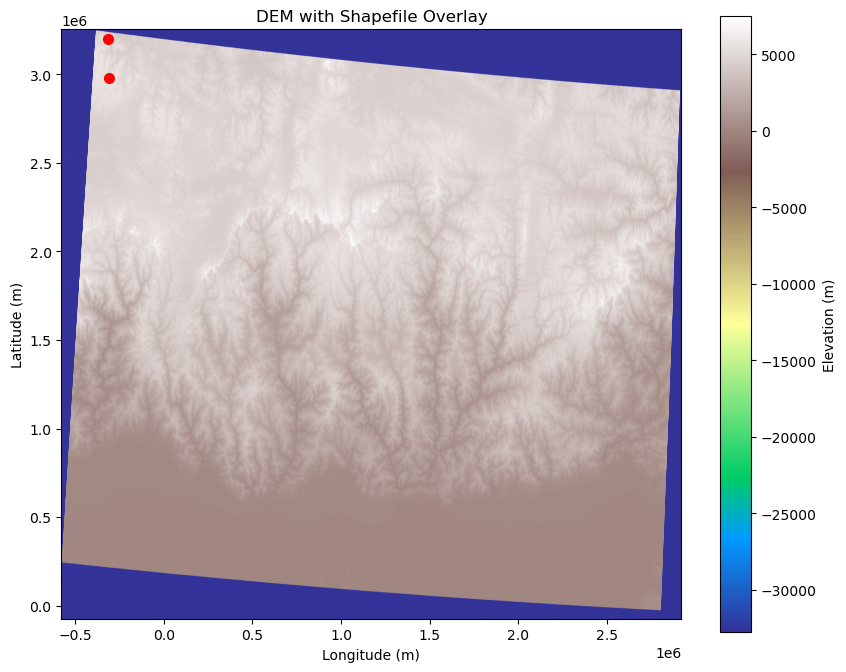

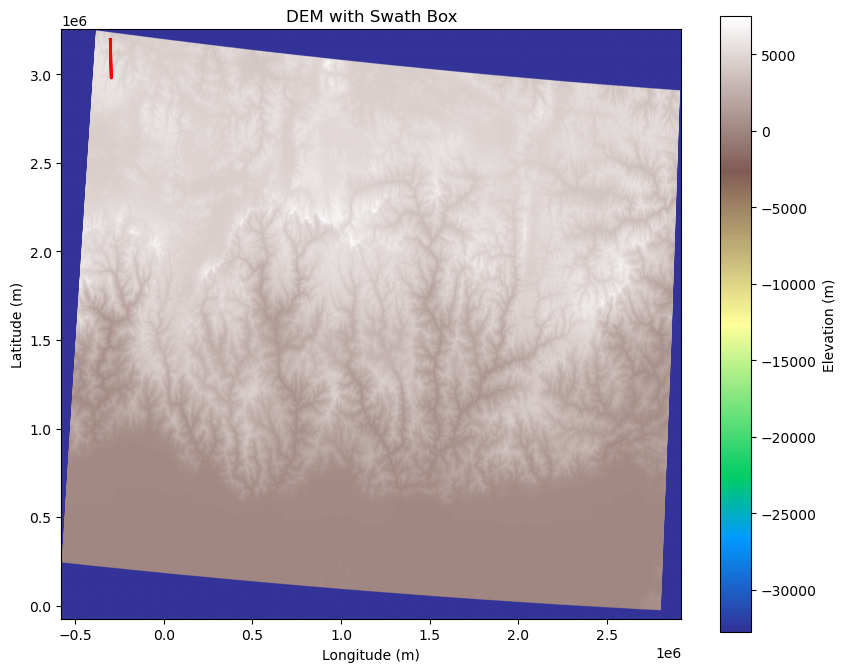

In [10]:
import geopandas as gpd
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from shapely.geometry import Polygon

# Load the swath line shapefile
swath_shapefile = baseline
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt
from shapely.geometry import Polygon

# Load DEM using rasterio
raster_path = raster  # Replace with your DEM file path
with rasterio.open(raster_path) as src:
    dem = src.read(1)  # Read the first band (DEM)
    transform = src.transform  # Get the affine transform
    crs_dem = src.crs  # Get CRS of DEM
    bounds = src.bounds  # Get the bounds for extent

# Load the shapefile using geopandas
shapefile_path = baseline  # Replace with your shapefile path
gdf = gpd.read_file(shapefile_path)

# Check if CRS of shapefile and DEM match
if gdf.crs != crs_dem:
    # Reproject shapefile to match DEM's CRS
    gdf = gdf.to_crs(crs_dem)

# Plotting the DEM
plt.figure(figsize=(10, 8))
plt.imshow(dem, cmap='terrain', extent=bounds)
plt.colorbar(label='Elevation (m)')

# Overlay shapefile geometry on top of DEM
gdf.boundary.plot(ax=plt.gca(), color='red', linewidth=2)  # Plot boundaries of shapefile in red

plt.title("DEM with Shapefile Overlay")
plt.xlabel("Longitude (m)")
plt.ylabel("Latitude (m)")
plt.show()
 # Replace with your shapefile path
gdf = gpd.read_file(swath_shapefile)

# Load DEM using rasterio
raster = raster  # Replace with your DEM file path
with rasterio.open(raster) as src:
    dem = src.read(1)  # Read the first band (DEM)
    transform = src.transform  # Get the affine transform
    crs_dem = src.crs  # Get CRS of DEM

# Check if CRS of shapefile and DEM match
if gdf.crs != crs_dem:
    # Reproject shapefile to match DEM's CRS
    gdf = gdf.to_crs(crs_dem)

# Extract the swath line geometry
swath_line = gdf.geometry[0]  # Assuming only one line in the shapefile

# Define the swath width (25 km in meters)
swath_width = 25000  # 25 km in meters

# Create a buffered swath line (parallel offset)
left_buffer = swath_line.parallel_offset(distance=-swath_width / 2, side='left')
right_buffer = swath_line.parallel_offset(distance=swath_width / 2, side='right')

# Convert the buffered lines to coordinates
left_coords = list(left_buffer.coords)
right_coords = list(right_buffer.coords)

# Ensure the polygon is closed by adding the first point of the right buffer to the end of the left buffer
right_coords.reverse()  # Reverse the right buffer coordinates to connect the lines
swath_coords = left_coords + right_coords

# Create a polygon (rectangle) from the buffered swath lines
swath_polygon = Polygon(swath_coords)

# Plot the DEM
plt.figure(figsize=(10, 8))
plt.imshow(dem, cmap='terrain', extent=src.bounds)
plt.colorbar(label='Elevation (m)')

# Plot the swath box
x, y = swath_polygon.exterior.xy
plt.plot(x, y, color='red', linewidth=2)  # Red line for swath box

plt.title("DEM with Swath Box")
plt.xlabel("Longitude (m)")
plt.ylabel("Latitude (m)")
plt.show()


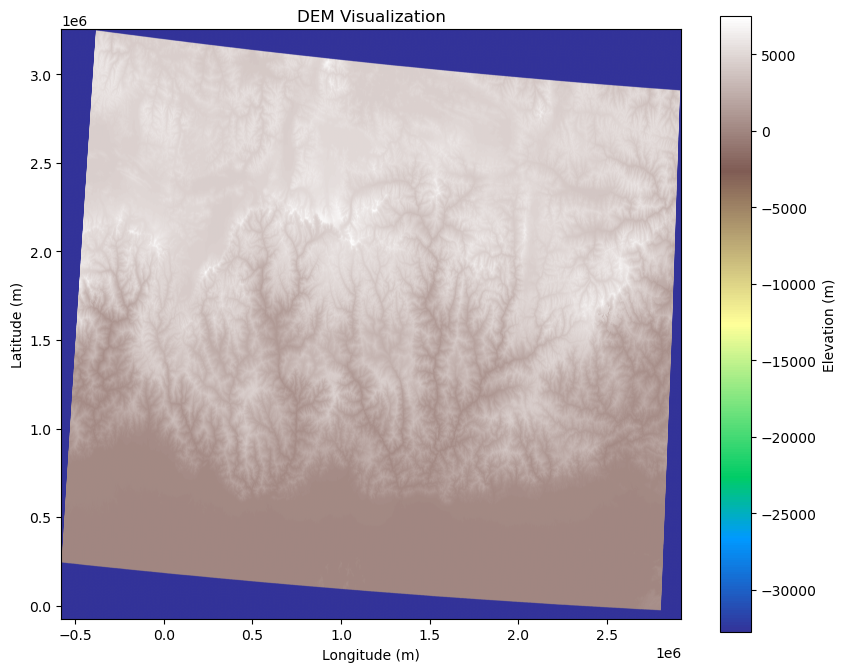

In [11]:
import rasterio
import matplotlib.pyplot as plt

# Path to your DEM file
raster_path = raster  # Replace with your DEM file path

# Open the DEM file using rasterio
with rasterio.open(raster_path) as src:
    dem = src.read(1)  # Read the first band (DEM data)
    bounds = src.bounds  # Get the bounds for extent

# Plotting the DEM
plt.figure(figsize=(10, 8))
plt.imshow(dem, cmap='terrain', extent=bounds)  # Use 'terrain' colormap for elevation
plt.colorbar(label='Elevation (m)')  # Add a color bar to indicate elevation

plt.title("DEM Visualization")
plt.xlabel("Longitude (m)")
plt.ylabel("Latitude (m)")
plt.show()


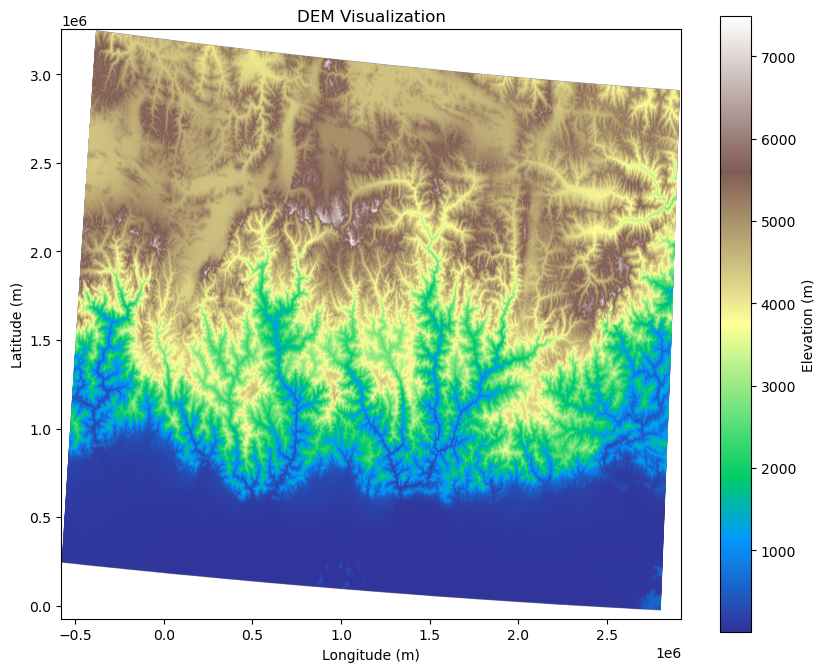

In [12]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np

# Path to your DEM file
raster_path = raster # Replace with your DEM file path

# Open the DEM file using rasterio
with rasterio.open(raster_path) as src:
    dem = src.read(1)  # Read the first band (DEM data)
    bounds = src.bounds  # Get the bounds for extent
    transform = src.transform  # Get the affine transform

# Masking the DEM to remove NoData values (optional)
no_data_value = src.nodata  # Get NoData value from the DEM
if no_data_value is not None:
    dem = np.ma.masked_equal(dem, no_data_value)  # Mask NoData values

# Plotting the DEM
plt.figure(figsize=(10, 8))
plt.imshow(dem, cmap='terrain', extent=bounds, origin='upper')  # Use 'terrain' colormap for elevation
plt.colorbar(label='Elevation (m)')  # Add a color bar to indicate elevation

# Set aspect ratio to 'equal' to prevent rotation
plt.gca().set_aspect('equal', adjustable='box')

# Set title and labels
plt.title("DEM Visualization")
plt.xlabel("Longitude (m)")
plt.ylabel("Latitude (m)")

# Show the plot
plt.show()


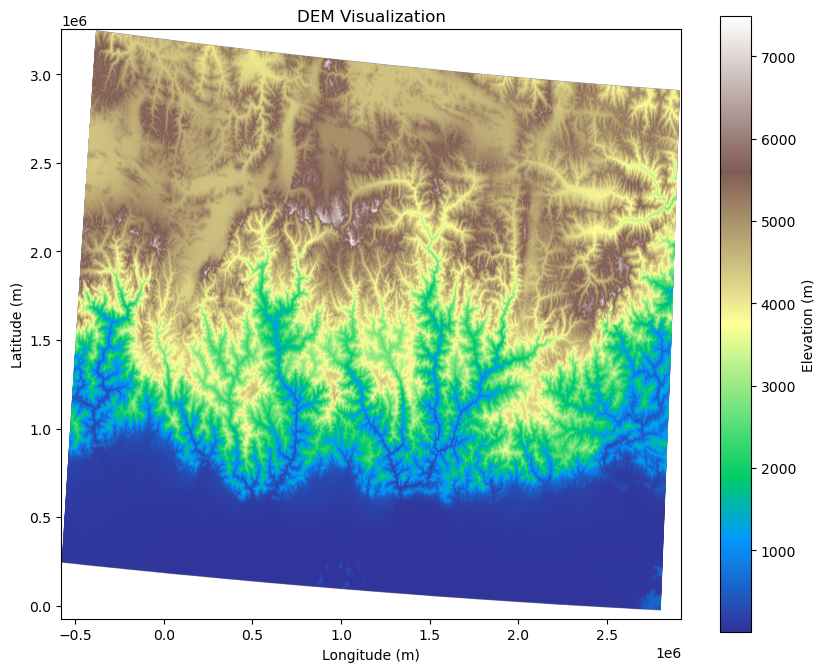

In [13]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np

# Path to your DEM file
raster_path = raster  # Replace with your DEM file path

# Open the DEM file using rasterio
with rasterio.open(raster_path) as src:
    dem = src.read(1)  # Read the first band (DEM data)
    bounds = src.bounds  # Get the bounds for extent
    transform = src.transform  # Get the affine transform

# Masking the DEM to remove NoData values (optional)
no_data_value = src.nodata  # Get NoData value from the DEM
if no_data_value is not None:
    dem = np.ma.masked_equal(dem, no_data_value)  # Mask NoData values

# Plotting the DEM
plt.figure(figsize=(10, 8))

# Use extent based on the bounds (to prevent rotation)
plt.imshow(dem, cmap='terrain', extent=bounds, origin='upper')  # 'upper' ensures correct orientation
plt.colorbar(label='Elevation (m)')  # Add a color bar to indicate elevation

# Set aspect ratio to 'equal' to prevent rotation
plt.gca().set_aspect('equal', adjustable='box')

# Set title and labels
plt.title("DEM Visualization")
plt.xlabel("Longitude (m)")
plt.ylabel("Latitude (m)")

# Show the plot
plt.show()


In [1]:
# Topography
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from tqdm import tqdm 
import os


# shape= 'swath_subanshiri_middle_proj.shp'
# shape ='subanshiri_swath_middle_EPSG_47.shp'
shape ='mechuka_siang.shp'
DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
# DEM = 'Bhutan_Arunachal_EPSG_47_PROJ.tif' # SRTM 30
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
# raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+DEM
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/DEM@PRAYOGA/'+DEM
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip

# Load AHe data (CSV with columns: Latitude, Longitude, Age)
AHe = 'AHe_after_2013.csv'
AHe_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AHe
# Load AFT data (CSV with columns: Latitude, Longitude, Age)
AFT = 'AFT_after_2013.csv'
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT
# Load ZFT data (CSV with columns: Latitude, Longitude, Age)
ZFT = 'ZFT_after_2013.csv'
ZFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + ZFT
# Load ZHe data (CSV with columns: Latitude, Longitude, Age)
ZHe = 'ZHe_after_2013.csv'
ZFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + ZHe


swath_width_topo = 25000 # unit is in meter 1km = 1000m
print (swath_width_topo)
swath_width_precip = 25000 # unit is in meter 1km = 1000m
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
shape_file_name
bin_precip = 1500
bin_width_topo = 100 

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
# print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

# Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Or define swath line manually 
# swath_coords = [(x1, y1), (x2, y2)]  # Replace with real coordinates x1 Longitude, y1 Latitude
# swath_line = LineString(swath_coords)

# (95.37871211904822, 28.095067581911987),  # Start (Longitude, Latitude)
#                (93.20151833453788, 29.005375617560578)

# Define width of swath line
buffer_width = swath_width_topo # Swath width in meters (e.g., 1000 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Elevation"])
bin_width = bin_width_topo  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary = df.groupby("Bin").agg(
    Mean_Elevation=("Elevation", "mean"),
    Min_Elevation=("Elevation", "min"),
    Max_Elevation=("Elevation", "max")
)
summary["Bin_Center"] = summary.index * bin_width

#---------------------------------------------------------------------

CRS of the shapefile: PROJCS["unknown",GEOGCS["GCS_unknown",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",99],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]
CRS of the DEM_SRTM30: EPSG:32647


Calculating distances: 100%|█████| 17421792/17421792 [06:20<00:00, 45732.81it/s]


### Load Age data Mechuka Siang - AHe, AFT, ZHe, ZFT

In [1]:

# Topography
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from tqdm import tqdm 
import os


swath_width_topo = 25000 # unit is in meter 1km = 1000m
print (swath_width_topo)
swath_width_precip = 25000 # unit is in meter 1km = 1000m
# shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
# shape_file_name
bin_precip = 1500
bin_width_topo = 100 

# Load AHe data (CSV with columns: Latitude, Longitude, Age)
AHe = 'AHe_after_2013.csv'
AHe_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AHe
# Load AFT data (CSV with columns: Latitude, Longitude, Age)
AFT = 'AFT_after_2013.csv'
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT
# Load ZFT data (CSV with columns: Latitude, Longitude, Age)
ZFT = 'ZFT_after_2013.csv'
ZFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + ZFT
# Load ZHe data (CSV with columns: Latitude, Longitude, Age)
ZHe = 'ZHe_after_2013.csv'
ZHe_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + ZHe

DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
# raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+DEM
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/DEM@PRAYOGA/'+DEM

# shape ='subanshiri_swath_middle_EPSG_47.shp'
shape ='mechuka_siang.shp'
# DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
###############################-------------------------------------------AFT------------------------------------


# Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform

# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line
    
# Load Age data (CSV with columns: Latitude, Longitude, Age)
Age_data = pd.read_csv(AFT_herman)

# Convert to GeoDataFrame

geometry = [Point(xy) for xy in zip(Age_data["Longitude"], Age_data["Latitude"])]
Age_gdf = gpd.GeoDataFrame(Age_data, geometry=geometry, crs="EPSG:4326")

# Reproject Age data to match DEM CRS
Age_gdf = Age_gdf.to_crs(dem.crs)
# Age_gdf
# print(f"CRS of the Precipitation_TRMM: {Age_gdf.crs}")
#------------------------------------------------------------------------
# 
buffer_width = swath_width_precip   # 100 km buffer
swath_buffer = swath_line.buffer(buffer_width)

# Filter Age data points within the swath buffer
AFT_Ages_within_swath = Age_gdf[Age_gdf.geometry.within(swath_buffer)]

# Project points to swath distances
from shapely.ops import nearest_points

Age_distances = []
for point in tqdm(AFT_Ages_within_swath.geometry, desc="Calculating Age distances", total=len(AFT_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    Age_distances.append(distance)

AFT_Ages_within_swath["Distance"] = Age_distances

###############################-------------------------------------------ZFT------------------------------------


# Load ZFT data
ZFT_data = pd.read_csv(ZFT_herman)

# Convert ZFT data to GeoDataFrame
ZFT_geometry = [Point(xy) for xy in zip(ZFT_data["Longitude"], ZFT_data["Latitude"])]
ZFT_gdf = gpd.GeoDataFrame(ZFT_data, geometry=ZFT_geometry, crs="EPSG:4326")

# Reproject ZFT data to match DEM CRS
ZFT_gdf = ZFT_gdf.to_crs(dem.crs)

# Filter ZFT points within the swath buffer
ZFT_Ages_within_swath = ZFT_gdf[ZFT_gdf.geometry.within(swath_buffer)]

# Project ZFT points to swath distances
ZFT_distances = []
for point in tqdm(ZFT_Ages_within_swath.geometry, desc="Calculating ZFT distances", total=len(ZFT_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    ZFT_distances.append(distance)

ZFT_Ages_within_swath["Distance"] = ZFT_distances


###############################-------------------------------------------AHe------------------------------------
# Load AHe data (CSV with columns: Latitude, Longitude, Age)
AHe_data = pd.read_csv(AHe_herman)  # Replace with the actual path to the AHe CSV file

# Convert AHe data to GeoDataFrame
AHe_geometry = [Point(xy) for xy in zip(AHe_data["Longitude"], AHe_data["Latitude"])]
AHe_gdf = gpd.GeoDataFrame(AHe_data, geometry=AHe_geometry, crs="EPSG:4326")

# Reproject AHe data to match DEM CRS
AHe_gdf = AHe_gdf.to_crs(dem.crs)

# Filter AHe points within the swath buffer
AHe_Ages_within_swath = AHe_gdf[AHe_gdf.geometry.within(swath_buffer)]

# Project AHe points to swath distances
AHe_distances = []
for point in tqdm(AHe_Ages_within_swath.geometry, desc="Calculating AHe distances", total=len(AHe_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    AHe_distances.append(distance)

AHe_Ages_within_swath["Distance"] = AHe_distances

###############################-------------------------------------------ZHe------------------------------------
# Load ZHe data (CSV with columns: Latitude, Longitude, Age)
ZHe_data = pd.read_csv(ZHe_herman)  # Replace with the actual path to the ZHe CSV file

# Convert ZHe data to GeoDataFrame
ZHe_geometry = [Point(xy) for xy in zip(ZHe_data["Longitude"], ZHe_data["Latitude"])]
ZHe_gdf = gpd.GeoDataFrame(ZHe_data, geometry=ZHe_geometry, crs="EPSG:4326")

# Reproject ZHe data to match DEM CRS
ZHe_gdf = ZHe_gdf.to_crs(dem.crs)

# Filter ZHe points within the swath buffer
ZHe_Ages_within_swath = ZHe_gdf[ZHe_gdf.geometry.within(swath_buffer)]

# Project ZHe points to swath distances
ZHe_distances = []
for point in tqdm(ZHe_Ages_within_swath.geometry, desc="Calculating ZHe distances", total=len(ZHe_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    ZHe_distances.append(distance)

ZHe_Ages_within_swath["Distance"] = ZHe_distances

# Ensure all Age columns are numeric
AFT_Ages_within_swath["Age"] = pd.to_numeric(AFT_Ages_within_swath["Age"], errors="coerce")
ZFT_Ages_within_swath["Age"] = pd.to_numeric(ZFT_Ages_within_swath["Age"], errors="coerce")
AHe_Ages_within_swath["Age"] = pd.to_numeric(AHe_Ages_within_swath["Age"], errors="coerce")
ZHe_Ages_within_swath["Age"] = pd.to_numeric(ZHe_Ages_within_swath["Age"], errors="coerce")

# Drop rows with invalid (NaN) Ages if needed
AFT_Ages_within_swath.dropna(subset=["Age"], inplace=True)
ZFT_Ages_within_swath.dropna(subset=["Age"], inplace=True)
AHe_Ages_within_swath.dropna(subset=["Age"], inplace=True)
ZHe_Ages_within_swath.dropna(subset=["Age"], inplace=True)


25000


Calculating Age distances: 100%|███████████████| 5/5 [00:00<00:00, 18204.44it/s]
/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
Calculating ZFT distances: 100%|███████████████| 4/4 [00:00<00:00, 16225.55it/s]
/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


# Swath def

In [9]:
import geopandas as gpd
import pandas as pd
import rasterio
from shapely.geometry import Point
from shapely.ops import nearest_points
from tqdm import tqdm
import os

def load_age_data(age_data_path, dem):
    """
    Loads the age data and reprojects it to match the CRS of the DEM.
    
    Parameters:
    age_data_path (str): Path to the CSV file containing age data.
    dem (rasterio.io.DatasetReader): The DEM to get its CRS for reprojection.
    
    Returns:
    GeoDataFrame: The reprojected age data as a GeoDataFrame.
    """
    # Load Age data (CSV with columns: Latitude, Longitude, Age)
    age_data = pd.read_csv(age_data_path)
    
    # Convert to GeoDataFrame
    geometry = [Point(xy) for xy in zip(age_data["Longitude"], age_data["Latitude"])]
    age_gdf = gpd.GeoDataFrame(age_data, geometry=geometry, crs="EPSG:4326")
    
    # Reproject Age data to match DEM CRS
    dem_crs = dem.crs  # Get the CRS of the DEM
    age_gdf = age_gdf.to_crs(dem_crs)  # Reproject to the DEM's CRS
    
    return age_gdf

def process_age_data_within_buffer(age_gdf, swath_line, swath_width_precip):
    """
    Processes the age data to select only the points within a buffer around the swath line.
    
    Parameters:
    age_gdf (GeoDataFrame): The age data to be processed.
    swath_line (LineString): The line representing the swath.
    swath_width_precip (float): The width of the buffer around the swath.
    
    Returns:
    GeoDataFrame: The filtered age data within the buffer.
    """
    # Create buffer around the swath line
    buffer = swath_line.buffer(swath_width_precip)
    
    # Select points within the buffer
    age_within_swath = age_gdf[age_gdf.geometry.within(buffer)]
    
    return age_within_swath

def process_data_for_all_age_groups(dem_path, shapefile_path, *age_data_paths):
    """
    Processes all datasets and calculates the distances of age data points from the swath line.
    
    Parameters:
    dem_path (str): Path to the DEM file.
    shapefile_path (str): Path to the shapefile containing the swath line.
    age_data_paths (str): Paths to the age data files to be processed.
    
    Returns:
    dict: A dictionary of processed age data GeoDataFrames for each age dataset.
    """
    results = {}
    
    # Load DEM to get its CRS
    with rasterio.open(dem_path) as dem:
        dem_data = dem.read(1)  # Topography data
        dem_crs = dem.crs  # CRS of DEM
    
    # Load swath line shapefile
    swath_gdf = gpd.read_file(shapefile_path)
    swath_line = swath_gdf.geometry[0]  # Assuming one line
    
    # Process each Age data set
    for age_data_path in age_data_paths:
        # Load and process Age data
        age_gdf = load_age_data(age_data_path, dem)  # Pass DEM to get CRS
        age_within_swath = process_age_data_within_buffer(age_gdf, swath_line, swath_width_precip=100000)
        
        # Calculate distances
        age_distances = []
        for point in tqdm(age_within_swath.geometry, desc=f"Calculating distances for {os.path.basename(age_data_path)}", total=len(age_within_swath)):
            nearest_point_on_swath = nearest_points(swath_line, point)[0]
            distance = swath_line.project(nearest_point_on_swath)
            age_distances.append(distance)
        
        # Add distances to the dataframe
        age_within_swath["Distance"] = age_distances
        
        # Store the results
        results[os.path.basename(age_data_path)] = age_within_swath
    
    return results

# Example usage
dem_path = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/DEM@PRAYOGA/projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
shapefile_path = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/mechuka_siang.shp'

AHe_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/AHe_after_2013.csv"
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/AFT_after_2013.csv"
ZFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/ZFT_after_2013.csv"
ZHe_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/ZHe_after_2013.csv"


# Process all datasets
results = process_data_for_all_age_groups(dem_path, shapefile_path, AHe_herman, AFT_herman, ZFT_herman, ZHe_herman)

# Now you can access the processed data for each dataset
AFT_result = results['AFT_after_2013.csv']
AHe_result = results['AHe_after_2013.csv']
AFT_result


Calculating distances for AHe_after_2013.csv: 100%|█| 35/35 [00:00<00:00, 42911.
/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
Calculating distances for AFT_after_2013.csv: 100%|█| 37/37 [00:00<00:00, 43975.
/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,Latitude,Longitude,Age,AgeType,geometry,Distance
63,28.808400,95.888300,9.4,NaN,POINT (196282.876 3190735.037),15944.230057
65,28.853600,95.862300,7.7,NaN,POINT (193876.271 3195813.524),20395.203558
66,28.781800,95.900600,5.5,NaN,POINT (197407.126 3187754.342),13588.629505
67,28.785600,95.904400,5.7,NaN,POINT (197789.284 3188165.996),13435.182057
68,28.588900,95.843300,4.3,NaN,POINT (191243.723 3166513.332),9430.160141
69,28.467900,95.850700,4.4,NaN,POINT (191615.369 3153078.323),2995.914097
70,28.414900,95.890200,3.6,NaN,POINT (195333.325 3147101.242),0.000000
71,28.279700,95.913900,5.6,NaN,POINT (197272.722 3132051.837),0.000000
72,28.240600,95.887700,3.7,NaN,POINT (194589.664 3127782.778),0.000000
73,29.054500,94.920500,0.9,NaN,POINT (102687.015 3220900.346),113028.563153


In [7]:
import geopandas as gpd
import pandas as pd
import rasterio
from shapely.geometry import Point
from shapely.ops import nearest_points
from tqdm import tqdm
import os

def load_age_data(age_data_path, dem):
    """
    Loads the age data and reprojects it to match the CRS of the DEM.
    
    Parameters:
    age_data_path (str): Path to the CSV file containing age data.
    dem (rasterio.io.DatasetReader): The DEM to get its CRS for reprojection.
    
    Returns:
    GeoDataFrame: The reprojected age data as a GeoDataFrame.
    """
    # Load Age data (CSV with columns: Latitude, Longitude, Age)
    age_data = pd.read_csv(age_data_path)
    
    # Convert to GeoDataFrame
    geometry = [Point(xy) for xy in zip(age_data["Longitude"], age_data["Latitude"])]
    age_gdf = gpd.GeoDataFrame(age_data, geometry=geometry, crs="EPSG:4326")
    
    # Reproject Age data to match DEM CRS
    dem_crs = dem.crs  # Get the CRS of the DEM
    age_gdf = age_gdf.to_crs(dem_crs)  # Reproject to the DEM's CRS
    
    return age_gdf

def process_age_data_within_buffer(age_gdf, swath_line, swath_width_precip):
    """
    Processes the age data to select only the points within a buffer around the swath line.
    
    Parameters:
    age_gdf (GeoDataFrame): The age data to be processed.
    swath_line (LineString): The line representing the swath.
    swath_width_precip (float): The width of the buffer around the swath.
    
    Returns:
    GeoDataFrame: The filtered age data within the buffer.
    """
    # Create buffer around the swath line
    buffer = swath_line.buffer(swath_width_precip)
    
    # Select points within the buffer
    age_within_swath = age_gdf[age_gdf.geometry.within(buffer)]
    
    # Debugging: Print how many points are within the buffer
    print(f"Number of points within buffer: {len(age_within_swath)}")
    
    return age_within_swath

def process_data_for_all_age_groups(dem_path, shapefile_path, *age_data_paths):
    """
    Processes all datasets and calculates the distances of age data points from the swath line.
    
    Parameters:
    dem_path (str): Path to the DEM file.
    shapefile_path (str): Path to the shapefile containing the swath line.
    age_data_paths (str): Paths to the age data files to be processed.
    
    Returns:
    dict: A dictionary of processed age data GeoDataFrames for each age dataset.
    """
    results = {}
    
    # Load DEM to get its CRS
    with rasterio.open(dem_path) as dem:
        dem_data = dem.read(1)  # Topography data
        dem_crs = dem.crs  # CRS of DEM
    
    # Load swath line shapefile
    swath_gdf = gpd.read_file(shapefile_path)
    swath_line = swath_gdf.geometry[0]  # Assuming one line
    
    # Process each Age data set
    for age_data_path in age_data_paths:
        # Load and process Age data
        age_gdf = load_age_data(age_data_path, dem)  # Pass DEM to get CRS
        age_within_swath = process_age_data_within_buffer(age_gdf, swath_line, swath_width_precip=1000)
        
        # Check if any points are within the swath before proceeding
        if len(age_within_swath) == 0:
            print(f"No points within swath for {os.path.basename(age_data_path)}.")
            continue
        
        # Calculate distances
        age_distances = []
        for point in tqdm(age_within_swath.geometry, desc=f"Calculating distances for {os.path.basename(age_data_path)}", total=len(age_within_swath)):
            nearest_point_on_swath = nearest_points(swath_line, point)[0]
            distance = swath_line.project(nearest_point_on_swath)
            age_distances.append(distance)
        
        # Add distances to the dataframe
        age_within_swath.loc[:, "Distance"] = age_distances  # Fix SettingWithCopyWarning by using .loc
        
        # Store the results
        results[os.path.basename(age_data_path)] = age_within_swath
    
    return results

# Example usage
dem_path = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/DEM@PRAYOGA/projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
shapefile_path = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/mechuka_siang.shp'

AHe_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/AHe_after_2013.csv"
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/AFT_after_2013.csv"
ZFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/ZFT_after_2013.csv"
ZHe_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/ZHe_after_2013.csv"

# Process all datasets
results = process_data_for_all_age_groups(dem_path, shapefile_path, AHe_herman, AFT_herman, ZFT_herman, ZHe_herman)

# Now you can access the processed data for each dataset
AFT_result = results.get('AFT_after_2013.csv', None)
AHe_result = results.get('AHe_after_2013.csv', None)
print (AFT_result)


Number of points within buffer: 0
No points within swath for AHe_after_2013.csv.
Number of points within buffer: 0
No points within swath for AFT_after_2013.csv.
Number of points within buffer: 0
No points within swath for ZFT_after_2013.csv.
Number of points within buffer: 1


Calculating distances for ZHe_after_2013.csv: 100%|█| 1/1 [00:00<00:00, 4975.45i

None



/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [8]:
import matplotlib.pyplot as plt

def plot_buffer_and_points(age_gdf, swath_line, buffer_width):
    """
    Plots the buffer around the swath line and the age points.
    
    Parameters:
    age_gdf (GeoDataFrame): The age data to be plotted.
    swath_line (LineString): The swath line to be plotted.
    buffer_width (float): The width of the buffer to be plotted.
    """
    # Create the buffer
    buffer = swath_line.buffer(buffer_width)
    
    # Plot the swath line and the buffer
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.set_title(f"Buffer and Age Points (Buffer Width = {buffer_width})")
    
    # Plot buffer
    ax.plot(*buffer.exterior.xy, color='blue', label='Buffer Area')
    
    # Plot the swath line
    ax.plot(*swath_line.xy, color='red', linewidth=2, label='Swath Line')
    
    # Plot age points
    age_gdf.plot(ax=ax, color='green', marker='o', label='Age Points')
    
    ax.legend()
    plt.show()

# Example usage to visualize buffer and points
buffer_width = 10000  # Try increasing the buffer width to see if more points fall inside
plot_buffer_and_points(age_gdf, swath_line, buffer_width)


NameError: name 'age_gdf' is not defined

/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipykernel_6241/51453135.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  AFT_ages_within_swath.dropna(subset=["age"], inplace=True)
/tmp/ipykernel_6241/51453135.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ve

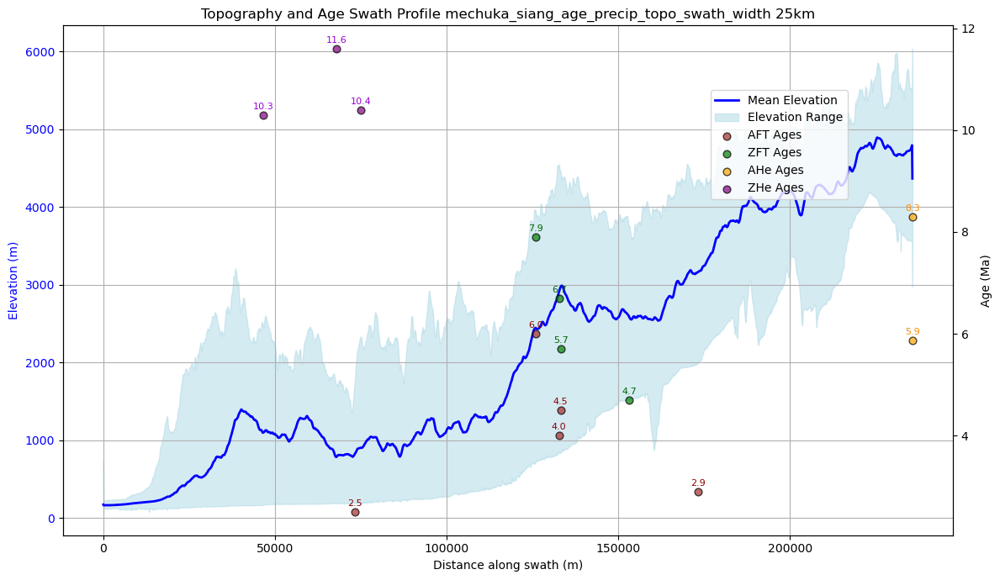

In [11]:
# Ensure all Age columns are numeric
AFT_Ages_within_swath["Age"] = pd.to_numeric(AFT_Ages_within_swath["Age"], errors="coerce")
ZFT_Ages_within_swath["Age"] = pd.to_numeric(ZFT_Ages_within_swath["Age"], errors="coerce")
AHe_Ages_within_swath["Age"] = pd.to_numeric(AHe_Ages_within_swath["Age"], errors="coerce")
ZHe_Ages_within_swath["Age"] = pd.to_numeric(ZHe_Ages_within_swath["Age"], errors="coerce")

# Drop rows with invalid (NaN) Ages if needed
AFT_Ages_within_swath.dropna(subset=["Age"], inplace=True)
ZFT_Ages_within_swath.dropna(subset=["Age"], inplace=True)
AHe_Ages_within_swath.dropna(subset=["Age"], inplace=True)
ZHe_Ages_within_swath.dropna(subset=["Age"], inplace=True)


# Plot swath profile with AFT, ZFT, AHe, and ZHe
fig, ax1 = plt.subplots(figsize=(12, 7))

# Plot topography profile
ax1.plot(
    summary["Bin_Center"],
    summary["Mean_Elevation"],
    color="blue",
    label="Mean Elevation",
    linewidth=2,
)
ax1.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color="lightblue",
    alpha=0.5,
    label="Elevation Range",
)
ax1.set_ylabel("Elevation (m)", color="blue")
ax1.tick_params(axis="y", labelcolor="blue")

# Add AFT, ZFT, AHe, and ZHe Ages on a secondary y-axis
ax2 = ax1.twinx()

# AFT
aft_scatter = ax2.scatter(
    AFT_Ages_within_swath["Distance"],
    AFT_Ages_within_swath["Age"],
    color="brown",
    label="AFT Ages",
    alpha=0.7,
    s=40,
    edgecolor="black",
)
for i, row in AFT_Ages_within_swath.iterrows():
    ax2.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color="darkred",
    )

# ZFT
zft_scatter = ax2.scatter(
    ZFT_Ages_within_swath["Distance"],
    ZFT_Ages_within_swath["Age"],
    color="green",
    label="ZFT Ages",
    alpha=0.7,
    s=40,
    edgecolor="black",
)
for i, row in ZFT_Ages_within_swath.iterrows():
    ax2.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color="darkgreen",
    )

# AHe
ahe_scatter = ax2.scatter(
    AHe_Ages_within_swath["Distance"],
    AHe_Ages_within_swath["Age"],
    color="orange",
    label="AHe Ages",
    alpha=0.7,
    s=40,
    edgecolor="black",
)
for i, row in AHe_Ages_within_swath.iterrows():
    ax2.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color="darkorange",
    )

# ZHe
zhe_scatter = ax2.scatter(
    ZHe_Ages_within_swath["Distance"],
    ZHe_Ages_within_swath["Age"],
    color="purple",
    label="ZHe Ages",
    alpha=0.7,
    s=40,
    edgecolor="black",
)
for i, row in ZHe_Ages_within_swath.iterrows():
    ax2.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color="darkviolet",
    )

# Set secondary y-axis labels
ax2.set_ylabel("Age (Ma)", color="black")
ax2.tick_params(axis="y", labelcolor="black")

# Add grid, legend, and title
ax1.set_xlabel("Distance along swath (m)")
ax1.grid()
fig.legend(
    loc="upper right", bbox_to_anchor=(0.85, 0.85), frameon=True, fontsize=10
)
plt.title(f"Topography and Age Swath Profile {shape_file_name}_Age_precip_topo_swath_width {round(swath_width_topo/1000)}km")
plt.tight_layout()

# Show plot
plt.show()


### PLot Topography Age all together

NameError: name 'ax3' is not defined

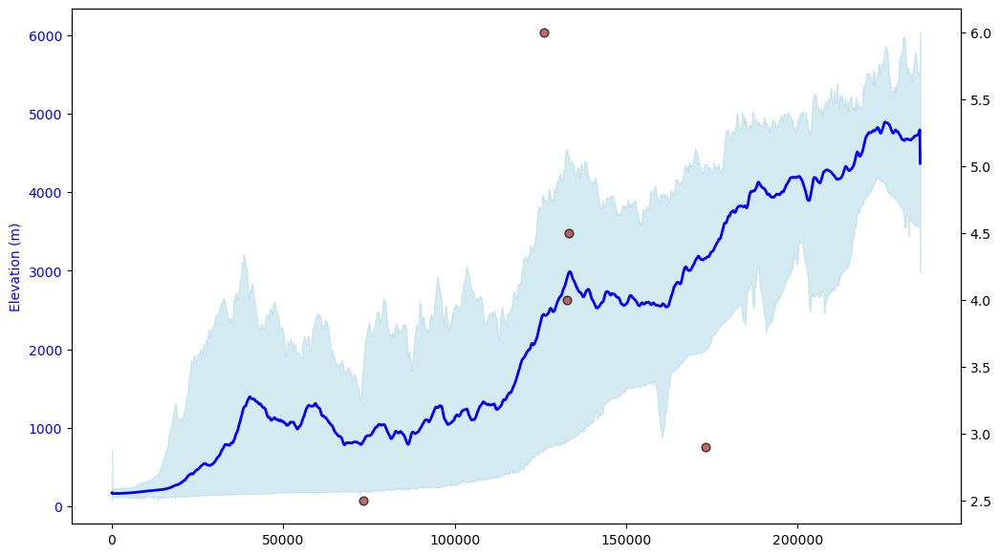

In [12]:
# Plot swath profile with AFT and ZFT
fig, ax1 = plt.subplots(figsize=(12, 7))

# Plot topography profile
ax1.plot(
    summary["Bin_Center"],
    summary["Mean_Elevation"],
    color="blue",
    label="Mean Elevation",
    linewidth=2,
)
ax1.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color="lightblue",
    alpha=0.5,
    label="Elevation Range",
)
ax1.set_ylabel("Elevation (m)", color="blue")
ax1.tick_params(axis="y", labelcolor="blue")

# Add AFT Ages on a secondary y-axis
ax2 = ax1.twinx()
#### AFT ------------------------------
ax2.scatter(
    AFT_Ages_within_swath["Distance"],
    AFT_Ages_within_swath["Age"],
    color="brown",
    label="AFT Ages",
    alpha=0.7,
    s=40,
    edgecolor="black",
)

# Annotate AFT Ages
for i, row in AFT_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color="darkred"
    )


### ZFT -----------------------
ax2.scatter(
    ZFT_Ages_within_swath["Distance"],
    ZFT_Ages_within_swath["Age"],
    color="green",
    label="ZFT Ages",
    alpha=0.7,
    s=40,
    edgecolor="black",
)

### ----------------------------
ax2.set_ylabel("Age (Ma)", color="black")
ax2.tick_params(axis="y", labelcolor="black")

# Add grid, legend, and title
ax1.set_xlabel("Distance along swath (m)")
ax1.grid()
fig.legend(
    loc="upper right", bbox_to_anchor=(0.85, 0.85), frameon=True, fontsize=10
)
plt.title(f"Topography and Age Swath Profile/{shape_file_name}_Age_precip_topo_swath_width{swath_width_topo}km")
plt.tight_layout()

# Save figure
# fig.savefig(
#     f'/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/swath_output_figures/{shape_file_name}_Age_precip_topo_swath_width{swath_width_topo}km.pdf',
#     dpi=dpi_fig
# )

# Close the figure
plt.close(fig)
# Show plot
plt.show()


### Precipitation

CRS of the shapefile: PROJCS["unknown",GEOGCS["GCS_unknown",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",99],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]
CRS of the DEM_SRTM30: EPSG:32647


Calculating distances: 100%|█████████████| 1787/1787 [00:00<00:00, 41704.53it/s]


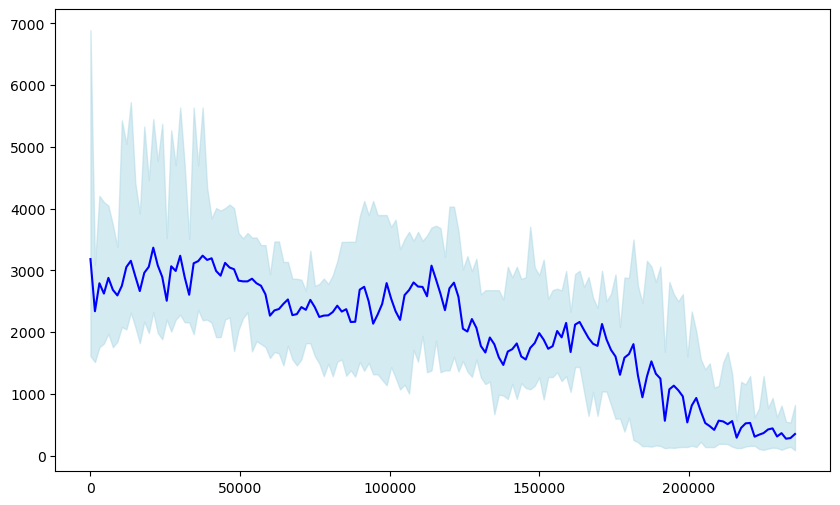

In [2]:
# Precipitation and Age
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from tqdm import tqdm 
import os


# shape= 'swath_subanshiri_middle_proj.shp'
# shape ='subanshiri_swath_middle_EPSG_47.shp'
shape ='mechuka_siang.shp'

DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
DEM = 'Bhutan_Arunachal_EPSG_47_PROJ.tif' # SRTM 30
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+DEM
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
# print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

swath_width_topo = 50000 # unit is in meter 1km = 1000m
swath_width_precip = 50000 # unit is in meter 1km = 1000m
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
shape_file_name
bin_precip = 1500

# # Load topographic data (e.g., DEM)
dem_path = raster_precip
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Define width of swath line
buffer_width = swath_width_topo # Swath width in meters (e.g., 1000 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Precipitation"])
bin_width = bin_precip  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary_precip = df.groupby("Bin").agg(
    Mean_Precipitation=("Precipitation", "mean"),
    Min_Precipitation=("Precipitation", "min"),
    Max_Precipitation=("Precipitation", "max")
)
summary_precip["Bin_Center"] = summary_precip.index * bin_width

# #---------------------------------------------------------------------
# # Load Age data (CSV with columns: Latitude, Longitude, Age)
# Age_data = pd.read_csv(AFT_herman)

# # Convert to GeoDataFrame

# geometry = [Point(xy) for xy in zip(Age_data["Longitude"], Age_data["Latitude"])]
# Age_gdf = gpd.GeoDataFrame(Age_data, geometry=geometry, crs="EPSG:4326")

# # Reproject Age data to match DEM CRS
# Age_gdf = Age_gdf.to_crs(dem.crs)
# # Age_gdf
# # print(f"CRS of the Precipitation_TRMM: {Age_gdf.crs}")
# #------------------------------------------------------------------------
# # 
# buffer_width = swath_width_precip  # 100 km buffer
# swath_buffer = swath_line.buffer(buffer_width)

# # # Filter Age data points within the swath buffer
# # AFT_Ages_within_swath = Age_gdf[Age_gdf.geometry.within(swath_buffer)]

# # # Project points to swath distances
# # from shapely.ops import nearest_points

# Age_distances = []
# for point in tqdm(AFT_Ages_within_swath.geometry, desc="Calculating Age distances", total=len(AFT_Ages_within_swath)):
#     nearest_point_on_swath = nearest_points(swath_line, point)[0]
#     nearest_point_on_swath = nearest_points(swath_line, point)[0]
#     distance = swath_line.project(nearest_point_on_swath)
#     Age_distances.append(distance)

# AFT_Ages_within_swath["Distance"] = Age_distances
# #-----------------------------------------------------------------------
# plot swath profile
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot topography profile
# ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
# ax1.set_ylabel("Elevation (m)", color="brown")
# ax1.tick_params(axis="y", labelcolor="brown")
ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color="blue", label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color="lightblue",
    alpha=0.5,
    label="Prcipitation Range"
)

# #-------------------------------------------------------------------------------------
# # Plot the Swath Profile
# # Plot Age data on secondary y-axis
# ax2 = ax1.twinx()

# ### AFT
# ax2.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
#             color="blue", label="Age Data", alpha=0.7)
# ax2.set_ylabel("Age (Ma)", color="blue")
# ax2.tick_params(axis="y", labelcolor="blue")


# ## ZFT
# ax2.scatter(
#     ZFT_Ages_within_swath["Distance"],
#     ZFT_Ages_within_swath["Age"],
#     color="green",
#     label="ZFT Ages",
#     alpha=0.7,
#     s=40,
#     edgecolor="black",
# )
# ax2.set_ylabel("Age (Ma)", color="black")
# ax2.tick_params(axis="y", labelcolor="black")

# # Add labels, legend, and title
# ax1.set_xlabel("Distance along swath (m)")
# plt.title(f"Age Data and Topography Swath Profile {shape_file_name}")
# ax1.grid()
# fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

# plt.tight_layout()
# # plt.show()
# # Combine Age and Precipitation data into a single DataFrame
# swath_profile_df = pd.DataFrame({
#     "AFT_Age_Distance": AFT_Ages_within_swath["Distance"],
#     "AFT_Age": AFT_Ages_within_swath["Age"],
#     "Precipitation_Distance": summary_precip["Bin_Center"],
#     "Mean_Precipitation": summary_precip["Mean_Precipitation"],
#     "Min_Precipitation": summary_precip["Min_Precipitation"],
#     "Max_Precipitation": summary_precip["Max_Precipitation"]
# })
# swath_profile_df 

# # import os
# # shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
# # shape_file_name
# # output_csv_path = f"/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/{shape_file_name}_swath_Age_precip.csv"  # Replace with desired directory

# # Save the combined data to the CSV file
# swath_profile_df.to_csv(output_csv_path, index=False)

# print(f"Swath profile data saved to {output_csv_path}")


In [2]:
# Precipitation and Age
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from tqdm import tqdm 
import os


# shape= 'swath_subanshiri_middle_proj.shp'
# shape ='subanshiri_swath_middle_EPSG_47.shp'
shape ='mechuka_siang.shp'

DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
DEM = 'Bhutan_Arunachal_EPSG_47_PROJ.tif' # SRTM 30
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+DEM
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
# print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

swath_width_topo = 50000 # unit is in meter 1km = 1000m
swath_width_precip = 50000 # unit is in meter 1km = 1000m
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
shape_file_name
bin_precip = 1500

# # Load topographic data (e.g., DEM)
dem_path = raster_precip
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Define width of swath line
buffer_width = swath_width_topo # Swath width in meters (e.g., 1000 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Precipitation"])
bin_width = bin_precip  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary_precip = df.groupby("Bin").agg(
    Mean_Precipitation=("Precipitation", "mean"),
    Min_Precipitation=("Precipitation", "min"),
    Max_Precipitation=("Precipitation", "max")
)
summary_precip["Bin_Center"] = summary_precip.index * bin_width




CRS of the shapefile: PROJCS["unknown",GEOGCS["GCS_unknown",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",99],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]
CRS of the DEM_SRTM30: EPSG:32647


Calculating distances: 100%|█████████████| 1787/1787 [00:00<00:00, 39515.08it/s]


# precipitaion def

Calculating distances: 100%|█████████████| 1787/1787 [00:00<00:00, 41899.19it/s]


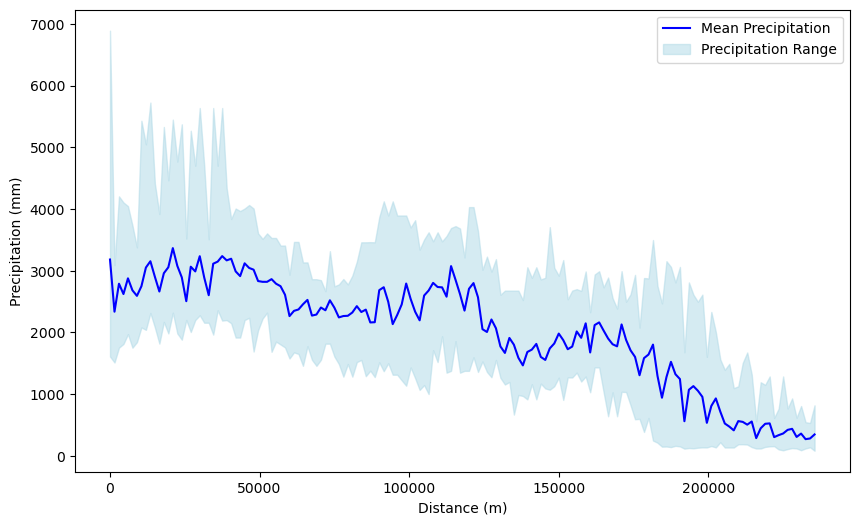

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio
import geopandas as gpd
from shapely.geometry import Point
from shapely.ops import nearest_points
from rasterio.features import geometry_mask
import pandas as pd
from tqdm import tqdm 
import os

def load_dem(dem_path):
    with rasterio.open(dem_path) as dem:
        dem_data = dem.read(1)  # Topography data
        dem_transform = dem.transform
    return dem_data, dem_transform

def load_swath_line(shape_file_path):
    swath_gdf = gpd.read_file(shape_file_path)
    return swath_gdf.geometry[0]  # Assuming one line

def create_buffer_and_mask(swath_line, buffer_width, dem_data, dem_transform):
    swath_buffer = swath_line.buffer(buffer_width)
    buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
    masked_dem = np.where(buffer_mask, dem_data, np.nan)
    return buffer_mask, masked_dem

def calculate_distances(swath_line, xs, ys, zs):
    distances = []
    for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
        point = nearest_points(swath_line, Point(x, y))[0]
        distances.append((swath_line.project(point), z))
    return np.array(sorted(distances, key=lambda d: d[0]))

def create_summary(df, bin_width):
    df["Bin"] = (df["Distance"] // bin_width).astype(int)
    summary_precip = df.groupby("Bin").agg(
        Mean_Precipitation=("Precipitation", "mean"),
        Min_Precipitation=("Precipitation", "min"),
        Max_Precipitation=("Precipitation", "max")
    )
    summary_precip["Bin_Center"] = summary_precip.index * bin_width
    return summary_precip

def main():
    # Input paths
    # DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
    shape = 'mechuka_siang.shp'
    baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/' + shape

    shape ='mechuka_siang.shp'

    DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
    AFT = 'AFT_after_2013.csv'
    baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
    # DEM = 'Bhutan_Arunachal_EPSG_47_PROJ.tif' # SRTM 30
    # raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+DEM
    DEM_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip
  

    # Swath width in meters
    swath_width_topo = 50000  # 50km
    bin_precip = 1500  # Precipitation bin width in meters

    # Load DEM and Swath line
    dem_data, dem_transform = load_dem(DEM_precip)
    swath_line = load_swath_line(baseline)

    # Create buffer and mask
    buffer_mask, masked_dem = create_buffer_and_mask(swath_line, swath_width_topo, dem_data, dem_transform)

    # Get coordinates of the buffer's rasterized pixels
    rows, cols = np.where(buffer_mask)
    xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
    zs = masked_dem[rows, cols]

    # Calculate distances along swath line
    distances = calculate_distances(swath_line, xs, ys, zs)

    # Create a DataFrame and summary
    df = pd.DataFrame(distances, columns=["Distance", "Precipitation"])
    summary_precip = create_summary(df, bin_precip)

    # Plot the summary (optional, if you need visualization)
    fig, ax1 = plt.subplots(figsize=(10, 6))
    ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color="blue", label="Mean Precipitation")
    ax1.fill_between(
        summary_precip["Bin_Center"],
        summary_precip["Min_Precipitation"],
        summary_precip["Max_Precipitation"],
        color="lightblue",
        alpha=0.5,
        label="Precipitation Range"
    )
    ax1.set_xlabel("Distance (m)")
    ax1.set_ylabel("Precipitation (mm)")
    ax1.legend()
    plt.show()

# Run the main function
if __name__ == "__main__":
    main()


In [12]:
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from tqdm import tqdm

def configure_plot_params():
    """Sets up fixed constants for plotting."""
    params = {
        "fixed_Age_ymin": 0,
        "fixed_Age_ymax": 15,
        "fixed_precip_ymin": 0,
        "fixed_precip_ymax": 7000,
        "fixed_elevation_ymin": 0,
        "fixed_elevation_ymax": 7000,
        "precip_color_mean": "blue",
        "precip_color_fill": "skyblue",
        "elevation_color_mean": "black",
        "elevation_color_fill": "gray",
        "fixed_xmin": 0,
        "fixed_xmax": 250000,
        "dpi_fig": 500
    }
    return params

def ensure_numeric_ages(dfs):
    """Ensures Age columns are numeric in the given dataframes."""
    for df in dfs:
        df["Age"] = pd.to_numeric(df["Age"], errors="coerce")

def plot_precipitation(ax1, summary_precip, params):
    """Plots the precipitation profile on the primary y-axis."""
    ax1.plot(
        summary_precip["Bin_Center"],
        summary_precip["Mean_Precipitation"],
        color=params["precip_color_mean"],
        label="Mean Precipitation"
    )
    ax1.fill_between(
        summary_precip["Bin_Center"],
        summary_precip["Min_Precipitation"],
        summary_precip["Max_Precipitation"],
        color=params["precip_color_fill"],
        alpha=0.8,
        label="Precipitation Range"
    )
    ax1.set_xticklabels([f"{x/1000:.0f}" for x in range(params["fixed_xmin"], params["fixed_xmax"] + 50000, 50000)])
    ax1.set_xlabel("Distance along swath (km)")
    ax1.set_ylim(params["fixed_precip_ymin"], params["fixed_precip_ymax"])
    ax1.set_yticks(range(params["fixed_precip_ymin"], params["fixed_precip_ymax"] + 500, 1000))
    ax1.set_ylabel("Precipitation (mm)", color=params["precip_color_mean"])
    ax1.tick_params(axis="y", labelcolor=params["precip_color_mean"])

def plot_elevation(ax2, summary, params):
    """Plots the elevation profile on a secondary y-axis."""
    ax2.plot(
        summary["Bin_Center"],
        summary["Mean_Elevation"],
        color=params["elevation_color_mean"],
        label="Mean Elevation"
    )
    ax2.fill_between(
        summary["Bin_Center"],
        summary["Min_Elevation"],
        summary["Max_Elevation"],
        color=params["elevation_color_fill"],
        alpha=0.5,
        label="Elevation Range"
    )
    ax2.set_ylabel("Elevation (m)", color=params["elevation_color_mean"])
    ax2.tick_params(axis="y", labelcolor=params["elevation_color_mean"])

def plot_ages(ax3, ages_df, color, label, annotate_color):
    """Plots and annotates ages on a tertiary y-axis."""
    scatter = ax3.scatter(
        ages_df["Distance"],
        ages_df["Age"],
        color=color,
        label=label,
        alpha=0.7
    )
    for i, row in ages_df.iterrows():
        ax3.annotate(
            f"{row['Age']:.1f}",
            (row["Distance"], row["Age"]),
            textcoords="offset points",
            xytext=(0, 5),
            ha="center",
            fontsize=8,
            color=annotate_color
        )
    return scatter

def main(AFT_Ages_within_swath, ZFT_Ages_within_swath, AHe_Ages_within_swath, ZHe_Ages_within_swath, summary_precip, summary, shape_file_name, swath_width_topo):
    """Main function to orchestrate the plotting of swath profile and ages."""
    params = configure_plot_params()

    # Ensure Age columns are numeric
    ensure_numeric_ages([AFT_Ages_within_swath, ZFT_Ages_within_swath, AHe_Ages_within_swath, ZHe_Ages_within_swath])

    # Plot setup
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Plot precipitation
    plot_precipitation(ax1, summary_precip, params)

    # Plot elevation
    ax2 = ax1.twinx()
    plot_elevation(ax2, summary, params)

    # Plot ages
    ax3 = ax1.twinx()
    ax3.spines["right"].set_position(("outward", 60))
    plot_ages(ax3, AFT_Ages_within_swath, "red", "AFT Ages", "darkred")
    plot_ages(ax3, ZFT_Ages_within_swath, "green", "ZFT Ages", "darkgreen")
    plot_ages(ax3, AHe_Ages_within_swath, "orange", "AHe Ages", "darkorange")
    plot_ages(ax3, ZHe_Ages_within_swath, "purple", "ZHe Ages", "darkviolet")

    # Set Age y-axis
    ax3.set_ylim(params["fixed_Age_ymin"], params["fixed_Age_ymax"])
    ax3.set_yticks(range(params["fixed_Age_ymin"], params["fixed_Age_ymax"] + 5, 5))
    ax3.set_ylabel("Age (Ma)", color="red")
    ax3.tick_params(axis="y", labelcolor="red")

    # Add title, grid, and legend
    plt.title(f"Age Data and Topography Swath Profile {shape_file_name}_swath width_{round(swath_width_topo/1000)}km")
    ax1.grid()

    # Combine legends
    fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

    # Layout adjustments and save figure
    plt.tight_layout()
    plt.show()

    # Save figure
    fig.savefig(
        f'/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/swath_output_figures/{shape_file_name}_Age_precip_topo_swath_width{swath_width_topo}km.pdf',
        dpi=params["dpi_fig"]
    )

    # Close the figure
    plt.close(fig)


### plot all three 

/tmp/ipykernel_53724/3436322458.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels([f"{x/1000:.0f}" for x in range(fixed_xmin, fixed_xmax + 50000, 50000)])


NameError: name 'summary' is not defined

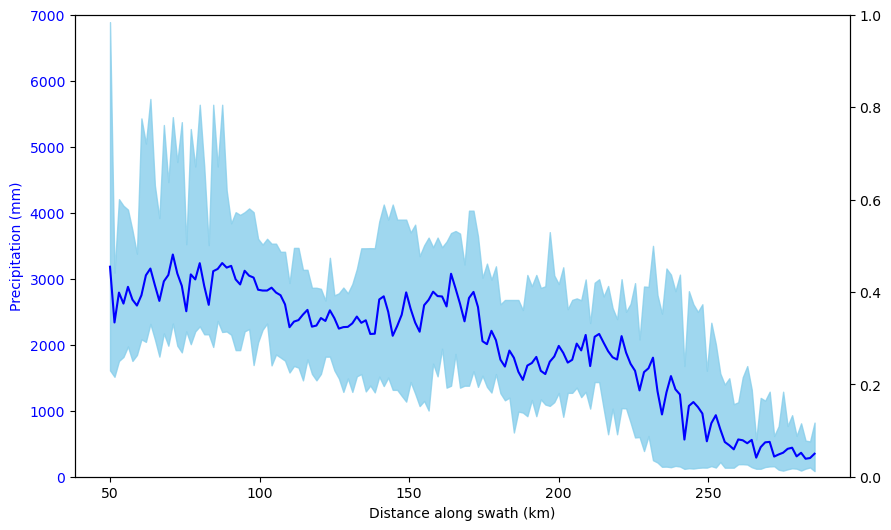

In [14]:
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from tqdm import tqdm

# Constants
fixed_Age_ymin = 0
fixed_Age_ymax = 15
fixed_precip_ymin = 0
fixed_precip_ymax = 7000
fixed_elevation_ymin = 0
fixed_elevation_ymax = 7000
precip_color_mean = "blue"
precip_color_fill = "skyblue"
elevation_color_mean = "black"
elevation_color_fill = "gray"
fixed_xmin = 0
fixed_xmax = 250000  # Assuming the maximum is in meters
dpi_fig = 500

# # Ensure all Age columns are numeric
# AFT_Ages_within_swath["Age"] = pd.to_numeric(AFT_Ages_within_swath["Age"], errors="coerce")
# ZFT_Ages_within_swath["Age"] = pd.to_numeric(ZFT_Ages_within_swath["Age"], errors="coerce")
# AHe_Ages_within_swath["Age"] = pd.to_numeric(AHe_Ages_within_swath["Age"], errors="coerce")
# ZHe_Ages_within_swath["Age"] = pd.to_numeric(ZHe_Ages_within_swath["Age"], errors="coerce")

# Plot setup
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot precipitation profile
ax1.plot(
    summary_precip["Bin_Center"],
    summary_precip["Mean_Precipitation"],
    color=precip_color_mean,
    label="Mean Precipitation"
)
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color=precip_color_fill,
    alpha=0.8,
    label="Precipitation Range"
)

ax1.set_xticklabels([f"{x/1000:.0f}" for x in range(fixed_xmin, fixed_xmax + 50000, 50000)])
ax1.set_xlabel("Distance along swath (km)")

# Set precipitation y-axis
ax1.set_ylim(fixed_precip_ymin, fixed_precip_ymax)
ax1.set_yticks(range(fixed_precip_ymin, fixed_precip_ymax + 500, 1000))
ax1.set_ylabel("Precipitation (mm)", color=precip_color_mean)
ax1.tick_params(axis="y", labelcolor=precip_color_mean)

# Plot elevation profile on a second y-axis
ax2 = ax1.twinx()
ax2.plot(
    summary["Bin_Center"],
    summary["Mean_Elevation"],
    color=elevation_color_mean,
    label="Mean Elevation"
)
ax2.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color=elevation_color_fill,
    alpha=0.5,
    label="Elevation Range"
)

ax2.set_ylabel("Elevation (m)", color=elevation_color_mean)
ax2.tick_params(axis="y", labelcolor=elevation_color_mean)

# Plot AFT Ages on a third y-axis
ax3 = ax1.twinx()
ax3.spines["right"].set_position(("outward", 60))  # Offset for third y-axis
sc_aft = ax3.scatter(
    AFT_Ages_within_swath["Distance"],
    AFT_Ages_within_swath["Age"],
    color="red",
    label="AFT Ages",
    alpha=0.7
)

# Annotate AFT Ages
for i, row in AFT_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color="darkred"
    )

# Plot ZFT Ages
sc_zft = ax3.scatter(
    ZFT_Ages_within_swath["Distance"],
    ZFT_Ages_within_swath["Age"],
    color="green",
    label="ZFT Ages",
    alpha=0.7
)

# Annotate ZFT Ages
for i, row in ZFT_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color="darkgreen"
    )

# Plot AHe Ages
sc_ahe = ax3.scatter(
    AHe_Ages_within_swath["Distance"],
    AHe_Ages_within_swath["Age"],
    color="orange",
    label="AHe Ages",
    alpha=0.7
)

# Annotate AHe Ages
for i, row in AHe_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color="darkorange"
    )

# Plot ZHe Ages
sc_zhe = ax3.scatter(
    ZHe_Ages_within_swath["Distance"],
    ZHe_Ages_within_swath["Age"],
    color="purple",
    label="ZHe Ages",
    alpha=0.7
)

# Annotate ZHe Ages
for i, row in ZHe_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color="darkviolet"
    )

# Set Age y-axis
ax3.set_ylim(fixed_Age_ymin, fixed_Age_ymax)
ax3.set_yticks(range(fixed_Age_ymin, fixed_Age_ymax + 5, 5))
ax3.set_ylabel("Age (Ma)", color="red")
ax3.tick_params(axis="y", labelcolor="red")

# Add title, grid, and legend
plt.title(f"Age Data and Topography Swath Profile {shape_file_name}_swath width_{round(swath_width_topo/1000)}km")
ax1.grid()

# Combine legends
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

# Layout adjustments and save figure
plt.tight_layout()
plt.show()

# Save figure
fig.savefig(
    f'/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/swath_output_figures/{shape_file_name}_Age_precip_topo_swath_width{swath_width_topo}km.pdf',
    dpi=dpi_fig
)

# Close the figure
plt.close(fig)


In [11]:
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from tqdm import tqdm

def configure_plot_params():
    """Sets up fixed constants for plotting."""
    params = {
        "fixed_Age_ymin": 0,
        "fixed_Age_ymax": 15,
        "fixed_precip_ymin": 0,
        "fixed_precip_ymax": 7000,
        "fixed_elevation_ymin": 0,
        "fixed_elevation_ymax": 7000,
        "precip_color_mean": "blue",
        "precip_color_fill": "skyblue",
        "elevation_color_mean": "black",
        "elevation_color_fill": "gray",
        "fixed_xmin": 0,
        "fixed_xmax": 250000,
        "dpi_fig": 500
    }
    return params

def ensure_numeric_ages(dfs):
    """Ensures Age columns are numeric in the given dataframes."""
    for df in dfs:
        df["Age"] = pd.to_numeric(df["Age"], errors="coerce")

def plot_precipitation(ax1, summary_precip, params):
    """Plots the precipitation profile on the primary y-axis."""
    ax1.plot(
        summary_precip["Bin_Center"],
        summary_precip["Mean_Precipitation"],
        color=params["precip_color_mean"],
        label="Mean Precipitation"
    )
    ax1.fill_between(
        summary_precip["Bin_Center"],
        summary_precip["Min_Precipitation"],
        summary_precip["Max_Precipitation"],
        color=params["precip_color_fill"],
        alpha=0.8,
        label="Precipitation Range"
    )
    ax1.set_xticklabels([f"{x/1000:.0f}" for x in range(params["fixed_xmin"], params["fixed_xmax"] + 50000, 50000)])
    ax1.set_xlabel("Distance along swath (km)")
    ax1.set_ylim(params["fixed_precip_ymin"], params["fixed_precip_ymax"])
    ax1.set_yticks(range(params["fixed_precip_ymin"], params["fixed_precip_ymax"] + 500, 1000))
    ax1.set_ylabel("Precipitation (mm)", color=params["precip_color_mean"])
    ax1.tick_params(axis="y", labelcolor=params["precip_color_mean"])

def plot_elevation(ax2, summary, params):
    """Plots the elevation profile on a secondary y-axis."""
    ax2.plot(
        summary["Bin_Center"],
        summary["Mean_Elevation"],
        color=params["elevation_color_mean"],
        label="Mean Elevation"
    )
    ax2.fill_between(
        summary["Bin_Center"],
        summary["Min_Elevation"],
        summary["Max_Elevation"],
        color=params["elevation_color_fill"],
        alpha=0.5,
        label="Elevation Range"
    )
    ax2.set_ylabel("Elevation (m)", color=params["elevation_color_mean"])
    ax2.tick_params(axis="y", labelcolor=params["elevation_color_mean"])

def plot_ages(ax3, ages_df, color, label, annotate_color):
    """Plots and annotates ages on a tertiary y-axis."""
    scatter = ax3.scatter(
        ages_df["Distance"],
        ages_df["Age"],
        color=color,
        label=label,
        alpha=0.7
    )
    for i, row in ages_df.iterrows():
        ax3.annotate(
            f"{row['Age']:.1f}",
            (row["Distance"], row["Age"]),
            textcoords="offset points",
            xytext=(0, 5),
            ha="center",
            fontsize=8,
            color=annotate_color
        )
    return scatter

def main(AFT_Ages_within_swath, ZFT_Ages_within_swath, AHe_Ages_within_swath, ZHe_Ages_within_swath, summary_precip, summary, shape_file_name, swath_width_topo):
    """Main function to orchestrate the plotting of swath profile and ages."""
    params = configure_plot_params()

    # Ensure Age columns are numeric
    ensure_numeric_ages([AFT_Ages_within_swath, ZFT_Ages_within_swath, AHe_Ages_within_swath, ZHe_Ages_within_swath])

    # Plot setup
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Plot precipitation
    plot_precipitation(ax1, summary_precip, params)

    # Plot elevation
    ax2 = ax1.twinx()
    plot_elevation(ax2, summary, params)

    # Plot ages
    ax3 = ax1.twinx()
    ax3.spines["right"].set_position(("outward", 60))
    plot_ages(ax3, AFT_Ages_within_swath, "red", "AFT Ages", "darkred")
    plot_ages(ax3, ZFT_Ages_within_swath, "green", "ZFT Ages", "darkgreen")
    plot_ages(ax3, AHe_Ages_within_swath, "orange", "AHe Ages", "darkorange")
    plot_ages(ax3, ZHe_Ages_within_swath, "purple", "ZHe Ages", "darkviolet")

    # Set Age y-axis
    ax3.set_ylim(params["fixed_Age_ymin"], params["fixed_Age_ymax"])
    ax3.set_yticks(range(params["fixed_Age_ymin"], params["fixed_Age_ymax"] + 5, 5))
    ax3.set_ylabel("Age (Ma)", color="red")
    ax3.tick_params(axis="y", labelcolor="red")

    # Add title, grid, and legend
    plt.title(f"Age Data and Topography Swath Profile {shape_file_name}_swath width_{round(swath_width_topo/1000)}km")
    ax1.grid()

    # Combine legends
    fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

    # Layout adjustments and save figure
    plt.tight_layout()
    plt.show()

    # Save figure
    fig.savefig(
        f'/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/swath_output_figures/{shape_file_name}_Age_precip_topo_swath_width{swath_width_topo}km.pdf',
        dpi=params["dpi_fig"]
    )

    # Close the figure
    plt.close(fig)


# BS(Bumthang_surface)_Chamkhar_chu BHUTAN

25000
25000
mechuka_siang
CRS of the shapefile: EPSG:32647
CRS of the DEM_SRTM30: EPSG:32647
CRS of the TRMM: EPSG:32647
CRS of the DEM_SRTM30: (28.089121215762503, 28.089121216262388)


Calculating AHe distances: 100%|████████████████| 2/2 [00:00<00:00, 9500.12it/s]
/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
Calculating Age distances: 100%|███████████████| 5/5 [00:00<00:00, 14112.73it/s]
/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


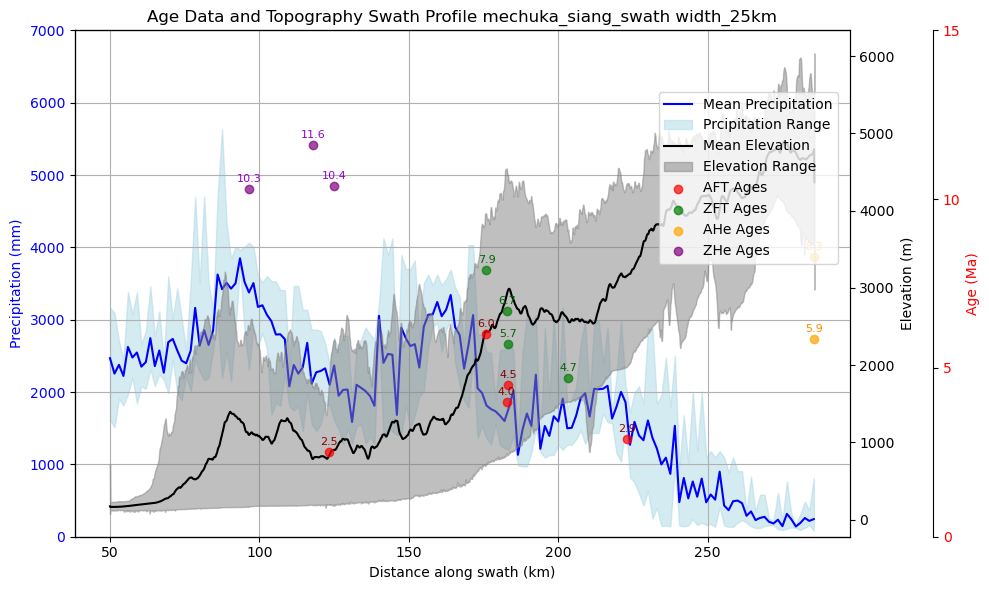

Swath profile data with AHe AFT ZHe ZFT saved to /home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_age/mechuka_siang_swath_Age_topography_with_AFT_ZFT.csv


In [15]:

# 1. Name of swath line of shape file (line)
shape ='mechuka_siang.shp'
# 2. Load swath line file
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
# 3. Name of DEM Geotiff file
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
# 4. Load the DEM Geotiff file
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/DEM@PRAYOGA/'+DEM
# 5. Name of precipitation Geotif file, (TRMM from Bookhagen et al., 2010)
DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
# 6. Load precipitation Geotif file, (TRMM from Bookhagen et al., 2010)
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip

# 7. Load AHe data (CSV with columns: Latitude, Longitude, Age)
AHe = 'AHe_after_2013.csv'
AHe_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AHe
# 8. Load AFT data (CSV with columns: Latitude, Longitude, Age)
AFT = 'AFT_after_2013.csv'
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT
# 9. Load ZFT data (CSV with columns: Latitude, Longitude, Age)
ZFT = 'ZFT_after_2013.csv'
ZFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + ZFT
# 10. Load ZHe data (CSV with columns: Latitude, Longitude, Age)
ZHe = 'ZHe_after_2013.csv'
ZHe_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + ZHe

############################--------------------------------##############################
# Topography
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from tqdm import tqdm 
import os
import math


# Constants
fixed_Age_ymin = 0
fixed_Age_ymax = 15
fixed_precip_ymin = 0
fixed_precip_ymax = 7000
fixed_elevation_ymin = 0
fixed_elevation_ymax = 7000
precip_color_mean = "blue"
precip_color_fill = "skyblue"
elevation_color_mean = "red"
elevation_color_fill = "gray"
AHe_age_color = "Blue"
AFT_age_color = "#880808" # Blood red
ZHe_age_color = "Green"
ZFT_age_color = "Black"
Ylabel_age_color = "Black"
fixed_xmin = 0
fixed_xmax = 250000  # Assuming the maximum is in meters
dpi_fig = 500

swath_width_topo = 25000 # unit is in meter 1km = 1000m
print (swath_width_topo)
swath_width_precip = 25000 # unit is in meter 1km = 1000m
print (swath_width_precip)

bin_precip = 1500
bin_width_topo = 100 


shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
print(shape_file_name)
print(f"CRS of the shapefile: EPSG:{gpd.read_file(baseline).crs.to_epsg()}" if gpd.read_file(baseline).crs.to_epsg() else "CRS of the shapefile: Unknown EPSG")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
print(f"CRS of the TRMM: {rasterio.open(raster_precip).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).res}")
# print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

##########################------------------------------------------#############################
# Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Or define swath line manually 
# swath_coords = [(x1, y1), (x2, y2)]  # Replace with real coordinates x1 Longitude, y1 Latitude
# swath_line = LineString(swath_coords)

# (95.37871211904822, 28.095067581911987),  # Start (Longitude, Latitude)
#                (93.20151833453788, 29.005375617560578)

# Define width of swath line
buffer_width = swath_width_topo # Swath width in meters (e.g., 1000 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Elevation"])
bin_width = bin_width_topo  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary = df.groupby("Bin").agg(
    Mean_Elevation=("Elevation", "mean"),
    Min_Elevation=("Elevation", "min"),
    Max_Elevation=("Elevation", "max")
)
summary["Bin_Center"] = summary.index * bin_width

###############################-------------------------------------------AHe------------------------------------
# Load AHe data (CSV with columns: Latitude, Longitude, Age)
AHe_data = pd.read_csv(AHe_herman)  # Replace with the actual path to the AHe CSV file

# Convert AHe data to GeoDataFrame
AHe_geometry = [Point(xy) for xy in zip(AHe_data["Longitude"], AHe_data["Latitude"])]
AHe_gdf = gpd.GeoDataFrame(AHe_data, geometry=AHe_geometry, crs="EPSG:4326")

# Reproject AHe data to match DEM CRS
AHe_gdf = AHe_gdf.to_crs(dem.crs)

# Filter AHe points within the swath buffer
AHe_Ages_within_swath = AHe_gdf[AHe_gdf.geometry.within(swath_buffer)]

# Project AHe points to swath distances
AHe_distances = []
for point in tqdm(AHe_Ages_within_swath.geometry, desc="Calculating AHe distances", total=len(AHe_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    AHe_distances.append(distance)

AHe_Ages_within_swath["Distance"] = AHe_distances


###############################-------------------------------------------AFT------------------------------------
# Load Age data (CSV with columns: Latitude, Longitude, Age)
Age_data = pd.read_csv(AFT_herman)

# Convert to GeoDataFrame

geometry = [Point(xy) for xy in zip(Age_data["Longitude"], Age_data["Latitude"])]
Age_gdf = gpd.GeoDataFrame(Age_data, geometry=geometry, crs="EPSG:4326")

# Reproject Age data to match DEM CRS
Age_gdf = Age_gdf.to_crs(dem.crs)
# Age_gdf
# print(f"CRS of the Precipitation_TRMM: {Age_gdf.crs}")
#------------------------------------------------------------------------
# 
buffer_width = swath_width_precip   # 100 km buffer
swath_buffer = swath_line.buffer(buffer_width)

# Filter Age data points within the swath buffer
AFT_Ages_within_swath = Age_gdf[Age_gdf.geometry.within(swath_buffer)]

# Project points to swath distances
from shapely.ops import nearest_points

Age_distances = []
for point in tqdm(AFT_Ages_within_swath.geometry, desc="Calculating Age distances", total=len(AFT_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    Age_distances.append(distance)

AFT_Ages_within_swath["Distance"] = Age_distances

###############################-------------------------------------------ZHe------------------------------------
# Load ZHe data (CSV with columns: Latitude, Longitude, Age)
ZHe_data = pd.read_csv(ZHe_herman)  # Replace with the actual path to the ZHe CSV file

# Convert ZHe data to GeoDataFrame
ZHe_geometry = [Point(xy) for xy in zip(ZHe_data["Longitude"], ZHe_data["Latitude"])]
ZHe_gdf = gpd.GeoDataFrame(ZHe_data, geometry=ZHe_geometry, crs="EPSG:4326")

# Reproject ZHe data to match DEM CRS
ZHe_gdf = ZHe_gdf.to_crs(dem.crs)

# Filter ZHe points within the swath buffer
ZHe_Ages_within_swath = ZHe_gdf[ZHe_gdf.geometry.within(swath_buffer)]

# Project ZHe points to swath distances
ZHe_distances = []
for point in tqdm(ZHe_Ages_within_swath.geometry, desc="Calculating ZHe distances", total=len(ZHe_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    ZHe_distances.append(distance)

ZHe_Ages_within_swath["Distance"] = ZHe_distances

###############################-------------------------------------------ZFT------------------------------------


# Load ZFT data
ZFT_data = pd.read_csv(ZFT_herman)

# Convert ZFT data to GeoDataFrame
ZFT_geometry = [Point(xy) for xy in zip(ZFT_data["Longitude"], ZFT_data["Latitude"])]
ZFT_gdf = gpd.GeoDataFrame(ZFT_data, geometry=ZFT_geometry, crs="EPSG:4326")

# Reproject ZFT data to match DEM CRS
ZFT_gdf = ZFT_gdf.to_crs(dem.crs)

# Filter ZFT points within the swath buffer
ZFT_Ages_within_swath = ZFT_gdf[ZFT_gdf.geometry.within(swath_buffer)]

# Project ZFT points to swath distances
ZFT_distances = []
for point in tqdm(ZFT_Ages_within_swath.geometry, desc="Calculating ZFT distances", total=len(ZFT_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    ZFT_distances.append(distance)

ZFT_Ages_within_swath["Distance"] = ZFT_distances



###########--------------------------------AHe AFT ZHe ZFT---------------################
# Ensure all Age columns are numeric
AFT_Ages_within_swath["Age"] = pd.to_numeric(AFT_Ages_within_swath["Age"], errors="coerce")
ZFT_Ages_within_swath["Age"] = pd.to_numeric(ZFT_Ages_within_swath["Age"], errors="coerce")
AHe_Ages_within_swath["Age"] = pd.to_numeric(AHe_Ages_within_swath["Age"], errors="coerce")
ZHe_Ages_within_swath["Age"] = pd.to_numeric(ZHe_Ages_within_swath["Age"], errors="coerce")

# Drop rows with invalid (NaN) Ages if needed
AFT_Ages_within_swath.dropna(subset=["Age"], inplace=True)
ZFT_Ages_within_swath.dropna(subset=["Age"], inplace=True)
AHe_Ages_within_swath.dropna(subset=["Age"], inplace=True)
ZHe_Ages_within_swath.dropna(subset=["Age"], inplace=True)

#########-----------------------------------------Precipitation---------------------########################
# # Precipitation and Age

# # Load topographic data (e.g., DEM)
dem_path = raster_precip
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Define width of swath line
buffer_width = swath_width_topo # Swath width in meters (e.g., 1000 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Precipitation"])
bin_width = bin_precip  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary_precip = df.groupby("Bin").agg(
    Mean_Precipitation=("Precipitation", "mean"),
    Min_Precipitation=("Precipitation", "min"),
    Max_Precipitation=("Precipitation", "max")
)
summary_precip["Bin_Center"] = summary_precip.index * bin_width

##########----------------------------------Plotting-----------------------#############################


# plot swath profile
fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color="blue", label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color="lightblue",
    alpha=0.5,
    label="Prcipitation Range"
)

ax1.set_xticks(range(0, fixed_xmax + 50000, 50000))  # Set tick positions
ax1.set_xticklabels([f"{x//1000}" for x in range(0, fixed_xmax + 50000, 50000)])  # Set labels

ax1.set_xlabel("Distance from HFT along swath (km)")
ax1.set_ylim(fixed_precip_ymin, fixed_precip_ymax)
ax1.set_yticks(range(fixed_precip_ymin, fixed_precip_ymax + 0, 1000))
ax1.set_ylabel("Precipitation (mm)", color=precip_color_mean)
ax1.tick_params(axis="y", labelcolor=precip_color_mean)

# Plot elevation profile on a second y-axis-----------------
ax2 = ax1.twinx()
ax2.plot(
    summary["Bin_Center"],
    summary["Mean_Elevation"],
    color=elevation_color_mean,
    label="Mean Elevation"
)
ax2.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color=elevation_color_fill,
    alpha=0.5,
    label="Elevation Range"
)

ax2.set_ylabel("Elevation (m)", color=elevation_color_mean)
ax2.tick_params(axis="y", labelcolor=elevation_color_mean)

ax2.set_xticks(range(0, fixed_xmax + 50000, 50000))  # Set tick positions
ax2.set_xticklabels([f"{x//1000}" for x in range(0, fixed_xmax + 50000, 50000)])  # Set labels

ax2.set_ylim(fixed_precip_ymin, fixed_precip_ymax)
ax2.set_yticks(range(fixed_precip_ymin, fixed_precip_ymax + 0, 1000))
# ax1.set_ylabel("Precipitation (mm)", color=precip_color_mean)
# ax2.tick_params(axis="y", labelcolor=precip_color_mean)

# Plot AFT Ages on a third y-axis------------------------------------------
ax3 = ax1.twinx()
ax3.spines["right"].set_position(("outward", 60))  # Offset for third y-axis

# Plot AHe Ages
sc_ahe = ax3.scatter(
    AHe_Ages_within_swath["Distance"],
    AHe_Ages_within_swath["Age"],
    color=AHe_age_color,
    label="AHe Ages",
    alpha=1
)

# Annotate AHe Ages
for i, row in AHe_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color=AHe_age_color
        
    )

sc_aft = ax3.scatter(
    AFT_Ages_within_swath["Distance"],
    AFT_Ages_within_swath["Age"],
    color=AFT_age_color,
    label="AFT Ages",
    alpha=1
)
# Annotate AFT Ages
for i, row in AFT_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color=AFT_age_color
    )

# Plot ZHe Ages
sc_zhe = ax3.scatter(
    ZHe_Ages_within_swath["Distance"],
    ZHe_Ages_within_swath["Age"],
    color=ZHe_age_color,
    label="ZHe Ages",
    alpha=1
)

# Annotate ZHe Ages
for i, row in ZHe_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color=ZHe_age_color
    )

# Plot ZFT Ages
sc_zft = ax3.scatter(
    ZFT_Ages_within_swath["Distance"],
    ZFT_Ages_within_swath["Age"],
    color=ZFT_age_color,
    label="ZFT age",
    alpha=1
)

# Annotate ZFT Ages
for i, row in ZFT_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color=ZFT_age_color
    )


# Set Age y-axis
ax3.set_ylim(fixed_Age_ymin, fixed_Age_ymax)
ax3.set_yticks(range(fixed_Age_ymin, fixed_Age_ymax + 5, 5))
ax3.set_ylabel("Age (Ma)", color=Ylabel_age_color)
ax3.tick_params(axis="y", labelcolor=Ylabel_age_color)

# Add title, grid, and legend
plt.title(f"Age Data and Topography Swath Profile {shape_file_name}_swath width_{round(swath_width_topo/1000)}km")
ax1.grid()

# Combine legends
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.95))

# Layout adjustments and save figure
plt.tight_layout()
plt.show()

# Save figure
fig.savefig(
    f'/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_age/swath_output_figures/{shape_file_name}_Age_precip_topo_swath_width{swath_width_topo}km.pdf',
    dpi=dpi_fig
)

# Close the figure
plt.close(fig)


#####################-----------------------------------to csv all data-------------#############
# Combine Age data with topography profile
swath_profile_df = pd.DataFrame({
    "AHe_Distance(meter)": round(AHe_Ages_within_swath["Distance"],0).astype(int),
    "AHe_Age(Ma)": AHe_Ages_within_swath["Age"],
    "AFT_Distance(meter)": round(AFT_Ages_within_swath["Distance"],0).astype(int),
    "AFT_Age(Ma)": AFT_Ages_within_swath["Age"],
    "ZHe_Distance(meter)": round(ZHe_Ages_within_swath["Distance"]).astype(int),
    "ZHe_Age(Ma)": ZHe_Ages_within_swath["Age"],
    "ZFT_Distance(meter)": round(ZFT_Ages_within_swath["Distance"]).astype(int),
    "ZFT_Age(Ma)": ZFT_Ages_within_swath["Age"],
    "Elevation_Distance(meter)": summary["Bin_Center"].astype(int),
    "Mean_Elevation(m)": summary["Mean_Elevation"].astype(int),
    "Min_Elevation(m)": summary["Min_Elevation"].astype(int),
    "Max_Elevation(m)": summary["Max_Elevation"].astype(int),
    "Precipitation_Distance(meter)": summary_precip["Bin_Center"].astype(int),
    "Mean_Precipitation(mm)": summary_precip["Mean_Precipitation"].astype(int),
    "Min_Precipitation(mm)": summary_precip["Min_Precipitation"].astype(int),
    "Max_Precipitation(mm)": summary_precip["Max_Precipitation"].astype(int)
})

#Save the combined data to a CSV file
output_csv_path = f"/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_age/{shape_file_name}_swath_Age_topography_with_AFT_ZFT.csv"
swath_profile_df.to_csv(output_csv_path, index=False)

print(f"Swath profile data with AHe AFT ZHe ZFT saved to {output_csv_path}")



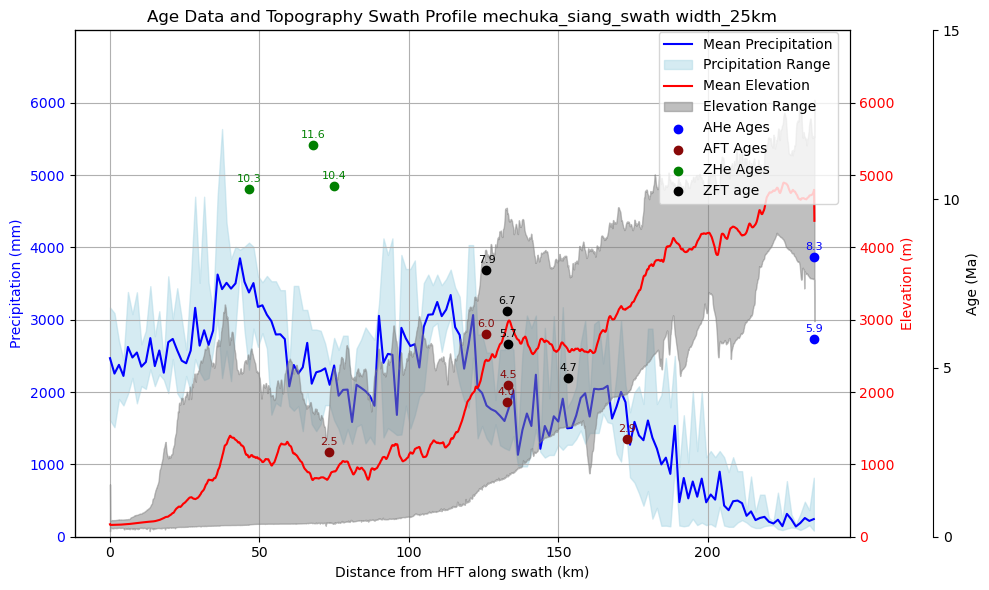

Swath profile data with AHe AFT ZHe ZFT saved to /home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_age/mechuka_siang_swath_Age_topography_with_AFT_ZFT.csv


In [56]:
##########----------------------------------Plotting-----------------------#############################

precip_color_mean = "blue"
precip_color_fill = "skyblue"
elevation_color_mean = "red"
elevation_color_fill = "gray"
AHe_age_color = "Blue"
AFT_age_color = "#880808" # Blood red
ZHe_age_color = "Green"
ZFT_age_color = "Black"
Ylabel_age_color = "Black"
fixed_xmin = 0
# plot swath profile
fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color="blue", label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color="lightblue",
    alpha=0.5,
    label="Prcipitation Range"
)

ax1.set_xticks(range(0, fixed_xmax + 50000, 50000))  # Set tick positions
ax1.set_xticklabels([f"{x//1000}" for x in range(0, fixed_xmax + 50000, 50000)])  # Set labels

ax1.set_xlabel("Distance from HFT along swath (km)")
ax1.set_ylim(fixed_precip_ymin, fixed_precip_ymax)
ax1.set_yticks(range(fixed_precip_ymin, fixed_precip_ymax + 0, 1000))
ax1.set_ylabel("Precipitation (mm)", color=precip_color_mean)
ax1.tick_params(axis="y", labelcolor=precip_color_mean)

# Plot elevation profile on a second y-axis-----------------
ax2 = ax1.twinx()
ax2.plot(
    summary["Bin_Center"],
    summary["Mean_Elevation"],
    color=elevation_color_mean,
    label="Mean Elevation"
)
ax2.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color=elevation_color_fill,
    alpha=0.5,
    label="Elevation Range"
)

ax2.set_ylabel("Elevation (m)", color=elevation_color_mean)
ax2.tick_params(axis="y", labelcolor=elevation_color_mean)

ax2.set_xticks(range(0, fixed_xmax + 50000, 50000))  # Set tick positions
ax2.set_xticklabels([f"{x//1000}" for x in range(0, fixed_xmax + 50000, 50000)])  # Set labels

ax2.set_ylim(fixed_precip_ymin, fixed_precip_ymax)
ax2.set_yticks(range(fixed_precip_ymin, fixed_precip_ymax + 0, 1000))
# ax1.set_ylabel("Precipitation (mm)", color=precip_color_mean)
# ax2.tick_params(axis="y", labelcolor=precip_color_mean)

# Plot AFT Ages on a third y-axis------------------------------------------
ax3 = ax1.twinx()
ax3.spines["right"].set_position(("outward", 60))  # Offset for third y-axis

# Plot AHe Ages
sc_ahe = ax3.scatter(
    AHe_Ages_within_swath["Distance"],
    AHe_Ages_within_swath["Age"],
    color=AHe_age_color,
    label="AHe Ages",
    alpha=1
)

# Annotate AHe Ages
for i, row in AHe_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color=AHe_age_color
        
    )

sc_aft = ax3.scatter(
    AFT_Ages_within_swath["Distance"],
    AFT_Ages_within_swath["Age"],
    color=AFT_age_color,
    label="AFT Ages",
    alpha=1
)
# Annotate AFT Ages
for i, row in AFT_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color=AFT_age_color
    )

# Plot ZHe Ages
sc_zhe = ax3.scatter(
    ZHe_Ages_within_swath["Distance"],
    ZHe_Ages_within_swath["Age"],
    color=ZHe_age_color,
    label="ZHe Ages",
    alpha=1
)

# Annotate ZHe Ages
for i, row in ZHe_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color=ZHe_age_color
    )

# Plot ZFT Ages
sc_zft = ax3.scatter(
    ZFT_Ages_within_swath["Distance"],
    ZFT_Ages_within_swath["Age"],
    color=ZFT_age_color,
    label="ZFT age",
    alpha=1
)

# Annotate ZFT Ages
for i, row in ZFT_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color=ZFT_age_color
    )


# Set Age y-axis
ax3.set_ylim(fixed_Age_ymin, fixed_Age_ymax)
ax3.set_yticks(range(fixed_Age_ymin, fixed_Age_ymax + 5, 5))
ax3.set_ylabel("Age (Ma)", color=Ylabel_age_color)
ax3.tick_params(axis="y", labelcolor=Ylabel_age_color)

# Add title, grid, and legend
plt.title(f"Age Data and Topography Swath Profile {shape_file_name}_swath width_{round(swath_width_topo/1000)}km")
ax1.grid()

# Combine legends
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.95))

# Layout adjustments and save figure
plt.tight_layout()
plt.show()

# Save figure
fig.savefig(
    f'/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_age/swath_output_figures/{shape_file_name}_Age_precip_topo_swath_width{swath_width_topo}km.pdf',
    dpi=dpi_fig
)

# Close the figure
plt.close(fig)


#####################-----------------------------------to csv all data-------------#############
# Combine Age data with topography profile
swath_profile_df = pd.DataFrame({
    "AHe_Distance(meter)": round(AHe_Ages_within_swath["Distance"],0).astype(int),
    "AHe_Age(Ma)": AHe_Ages_within_swath["Age"],
    "AFT_Distance(meter)": round(AFT_Ages_within_swath["Distance"],0).astype(int),
    "AFT_Age(Ma)": AFT_Ages_within_swath["Age"],
    "ZHe_Distance(meter)": round(ZHe_Ages_within_swath["Distance"]).astype(int),
    "ZHe_Age(Ma)": ZHe_Ages_within_swath["Age"],
    "ZFT_Distance(meter)": round(ZFT_Ages_within_swath["Distance"]).astype(int),
    "ZFT_Age(Ma)": ZFT_Ages_within_swath["Age"],
    "Elevation_Distance(meter)": summary["Bin_Center"].astype(int),
    "Mean_Elevation(m)": summary["Mean_Elevation"].astype(int),
    "Min_Elevation(m)": summary["Min_Elevation"].astype(int),
    "Max_Elevation(m)": summary["Max_Elevation"].astype(int),
    "Precipitation_Distance(meter)": summary_precip["Bin_Center"].astype(int),
    "Mean_Precipitation(mm)": summary_precip["Mean_Precipitation"].astype(int),
    "Min_Precipitation(mm)": summary_precip["Min_Precipitation"].astype(int),
    "Max_Precipitation(mm)": summary_precip["Max_Precipitation"].astype(int)
})

#Save the combined data to a CSV file
output_csv_path = f"/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_age/{shape_file_name}_swath_Age_topography_with_AFT_ZFT.csv"
swath_profile_df.to_csv(output_csv_path, index=False)

print(f"Swath profile data with AHe AFT ZHe ZFT saved to {output_csv_path}")



/tmp/ipykernel_124154/768517520.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels([f"{x/1000:.0f}" for x in range(fixed_xmin, fixed_xmax + 50000, 50000)])


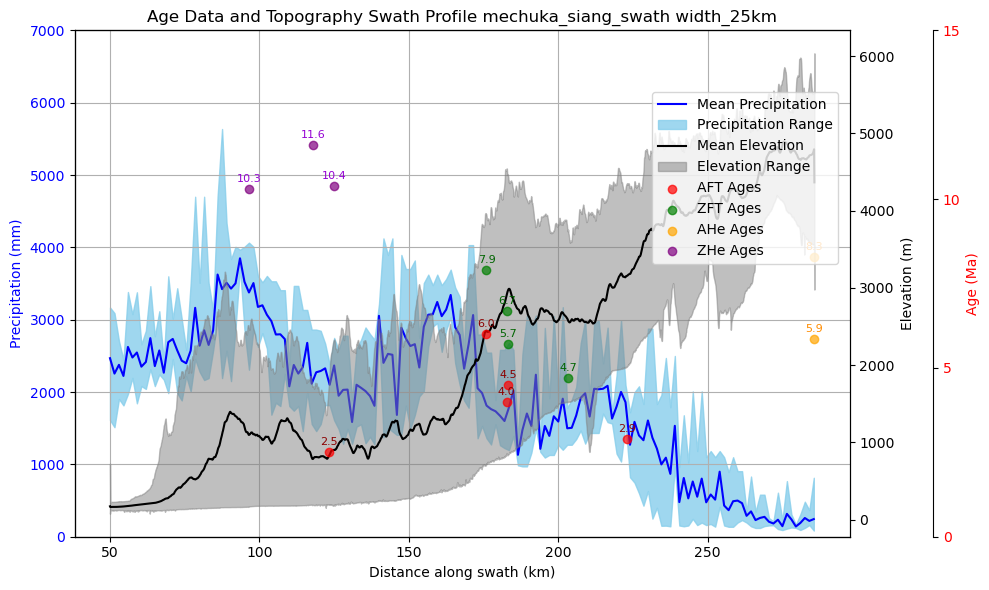

Swath profile data with ZFT saved to /home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_age/mechuka_siang_swath_Age_topography_with_AFT_ZFT.csv


In [10]:
# Plot setup
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot precipitation profile
ax1.plot(
    summary_precip["Bin_Center"],
    summary_precip["Mean_Precipitation"],
    color=precip_color_mean,
    label="Mean Precipitation"
)
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color=precip_color_fill,
    alpha=0.8,
    label="Precipitation Range"
)

ax1.set_xticklabels([f"{x/1000:.0f}" for x in range(fixed_xmin, fixed_xmax + 50000, 50000)])
ax1.set_xlabel("Distance along swath (km)")

# Set precipitation y-axis
ax1.set_ylim(fixed_precip_ymin, fixed_precip_ymax)
ax1.set_yticks(range(fixed_precip_ymin, fixed_precip_ymax + 500, 1000))
ax1.set_ylabel("Precipitation (mm)", color=precip_color_mean)
ax1.tick_params(axis="y", labelcolor=precip_color_mean)

# Plot elevation profile on a second y-axis
ax2 = ax1.twinx()
ax2.plot(
    summary["Bin_Center"],
    summary["Mean_Elevation"],
    color=elevation_color_mean,
    label="Mean Elevation"
)
ax2.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color=elevation_color_fill,
    alpha=0.5,
    label="Elevation Range"
)

ax2.set_ylabel("Elevation (m)", color=elevation_color_mean)
ax2.tick_params(axis="y", labelcolor=elevation_color_mean)

# Plot AFT Ages on a third y-axis
ax3 = ax1.twinx()
ax3.spines["right"].set_position(("outward", 60))  # Offset for third y-axis
sc_aft = ax3.scatter(
    AFT_Ages_within_swath["Distance"],
    AFT_Ages_within_swath["Age"],
    color="red",
    label="AFT Ages",
    alpha=0.7
)

# Annotate AFT Ages
for i, row in AFT_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color="darkred"
    )

# Plot ZFT Ages
sc_zft = ax3.scatter(
    ZFT_Ages_within_swath["Distance"],
    ZFT_Ages_within_swath["Age"],
    color="green",
    label="ZFT Ages",
    alpha=0.7
)

# Annotate ZFT Ages
for i, row in ZFT_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color="darkgreen"
    )

# Plot AHe Ages
sc_ahe = ax3.scatter(
    AHe_Ages_within_swath["Distance"],
    AHe_Ages_within_swath["Age"],
    color="orange",
    label="AHe Ages",
    alpha=0.7
)

# Annotate AHe Ages
for i, row in AHe_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color="darkorange"
    )

# Plot ZHe Ages
sc_zhe = ax3.scatter(
    ZHe_Ages_within_swath["Distance"],
    ZHe_Ages_within_swath["Age"],
    color="purple",
    label="ZHe Ages",
    alpha=0.7
)

# Annotate ZHe Ages
for i, row in ZHe_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),
        ha="center",
        fontsize=8,
        color="darkviolet"
    )

# Set Age y-axis
ax3.set_ylim(fixed_Age_ymin, fixed_Age_ymax)
ax3.set_yticks(range(fixed_Age_ymin, fixed_Age_ymax + 5, 5))
ax3.set_ylabel("Age (Ma)", color="red")
ax3.tick_params(axis="y", labelcolor="red")

# Add title, grid, and legend
plt.title(f"Age Data and Topography Swath Profile {shape_file_name}_swath width_{round(swath_width_topo/1000)}km")
ax1.grid()

# Combine legends
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

# Layout adjustments and save figure
plt.tight_layout()
plt.show()

# Save figure
fig.savefig(
    f'/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_age/swath_output_figures/{shape_file_name}_Age_precip_topo_swath_width{swath_width_topo}km.pdf',
    dpi=dpi_fig
)

# Close the figure
plt.close(fig)


#####################-----------------------------------
import math
# Combine Age data with topography profile
swath_profile_df = pd.DataFrame({
    "AHe_Distance(meter)": round(AHe_Ages_within_swath["Distance"],0).astype(int),
    "AHe_Age(Ma)": AHe_Ages_within_swath["Age"],
    "AFT_Distance(meter)": round(AFT_Ages_within_swath["Distance"],0).astype(int),
    "AFT_Age(Ma)": AFT_Ages_within_swath["Age"],
    "ZHe_Distance(meter)": round(ZHe_Ages_within_swath["Distance"]).astype(int),
    "ZHe_Age(Ma)": ZHe_Ages_within_swath["Age"],
    "ZFT_Distance(meter)": round(ZFT_Ages_within_swath["Distance"]).astype(int),
    "ZFT_Age(Ma)": ZFT_Ages_within_swath["Age"],
    "Elevation_Distance(meter)": summary["Bin_Center"].astype(int),
    "Mean_Elevation(m)": summary["Mean_Elevation"].astype(int),
    "Min_Elevation(m)": summary["Min_Elevation"].astype(int),
    "Max_Elevation(m)": summary["Max_Elevation"].astype(int),
    "Precipitation_Distance(meter)": summary_precip["Bin_Center"].astype(int),
    "Mean_Precipitation(mm)": summary_precip["Mean_Precipitation"].astype(int),
    "Min_Precipitation(mm)": summary_precip["Min_Precipitation"].astype(int),
    "Max_Precipitation(mm)": summary_precip["Max_Precipitation"].astype(int)
})

#Save the combined data to a CSV file
output_csv_path = f"/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_age/{shape_file_name}_swath_Age_topography_with_AFT_ZFT.csv"
swath_profile_df.to_csv(output_csv_path, index=False)

print(f"Swath profile data with AHe AFT ZHe ZFT saved to {output_csv_path}")


In [ ]:
# Read the shapefile
gdf = gpd.read_file(baseline)

# Convert CRS to EPSG format (if it's defined correctly)
if gdf.crs is not None:
    epsg_code = gdf.crs.to_epsg()
    if epsg_code:
        print(f"CRS of the shapefile: EPSG:{epsg_code}")
    else:
        print("CRS of the shapefile: Unknown EPSG")
else:
    print("CRS is not defined for the shapefile.")

In [5]:
print(f"CRS of the shapefile: EPSG:{gpd.read_file(baseline).crs.to_epsg()}" if gpd.read_file(baseline).crs.to_epsg() else "CRS of the shapefile: Unknown EPSG")


CRS of the shapefile: EPSG:32647


In [22]:
# File paths
DEM_PATH = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/DEM@PRAYOGA/projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
SHAPE_PATH = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/mechuka_siang.shp'
AHe_PATH = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/AHe_after_2013.csv'
AFT_PATH = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/AFT_after_2013.csv'
ZFT_PATH = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/ZFT_after_2013.csv'
ZHe_PATH = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/ZHe_after_2013.csv'

SWATH_WIDTH = 25000
BIN_WIDTH = 100

In [23]:
import numpy as np
import rasterio
import geopandas as gpd
from rasterio.features import geometry_mask
from shapely.geometry import LineString

def load_dem_and_buffer(dem_path, shape_path, swath_width):
    with rasterio.open(dem_path) as dem:
        dem_data = dem.read(1)
        dem_transform = dem.transform
    swath_gdf = gpd.read_file(shape_path)
    swath_line = swath_gdf.geometry[0]
    swath_buffer = swath_line.buffer(swath_width)
    buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
    masked_dem = np.where(buffer_mask, dem_data, np.nan)
    return masked_dem, swath_line, buffer_mask, dem_transform

In [18]:
# Load DEM and buffer
masked_dem, swath_line, buffer_mask, dem_transform = dem_loader.load_dem_and_buffer(DEM_PATH, SHAPE_PATH, SWATH_WIDTH)

NameError: name 'dem_loader' is not defined

In [24]:
dem_path

'/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'

### save to .csv

In [33]:
#####################-----------------------------------
import math
# Combine Age data with topography profile
swath_profile_df = pd.DataFrame({
    "AFT_Distance(meter)": round(AFT_Ages_within_swath["Distance"],0).astype(int),
    "AFT_Age(Ma)": AFT_Ages_within_swath["Age"],
    "ZFT_Distance(meter)": round(ZFT_Ages_within_swath["Distance"]).astype(int),
    "ZFT_Age(Ma)": ZFT_Ages_within_swath["Age"],
    "Elevation_Distance(meter)": summary["Bin_Center"].astype(int),
    "Mean_Elevation(m)": summary["Mean_Elevation"].astype(int),
    "Min_Elevation(m)": summary["Min_Elevation"].astype(int),
    "Max_Elevation(m)": summary["Max_Elevation"].astype(int)
})

#Save the combined data to a CSV file
output_csv_path = f"/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/{shape_file_name}_swath_Age_topography_with_AFT_ZFT.csv"
swath_profile_df.to_csv(output_csv_path, index=False)

print(f"Swath profile data with ZFT saved to {output_csv_path}")

Swath profile data with ZFT saved to /home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_age/mechuka_siang_swath_age_topography_with_AFT_ZFT.csv


In [25]:
type(round(ZFT_Ages_within_swath["Distance"]))

pandas.core.series.Series

In [29]:
round(ZFT_Ages_within_swath["Distance"]).astype(int)

4     194479
5     180626
6     156172
9     153213
10    133217
11    132781
12    125971
Name: Distance, dtype: int64

# Subanshiri 

In [8]:
## Topography

CRS of the shapefile: EPSG:32647
CRS of the DEM_SRTM30: EPSG:32647


/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/shapely/linear.py:88: RuntimeWarning: invalid value encountered in line_locate_point
  return lib.line_locate_point(line, other)
Calculating distances: 100%|███████| 4682118/4682118 [01:49<00:00, 42878.15it/s]
/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/shapely/linear.py:88: RuntimeWarning: invalid value encountered in line_locate_point
  return lib.line_locate_point(line, other)
Calculating age distances: 100%|█████████████| 32/32 [00:00<00:00, 23497.50it/s]

Swath profile data saved to /home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_age/subanshiri_swath_middle_EPSG_47_swath_age_topography.csv



/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


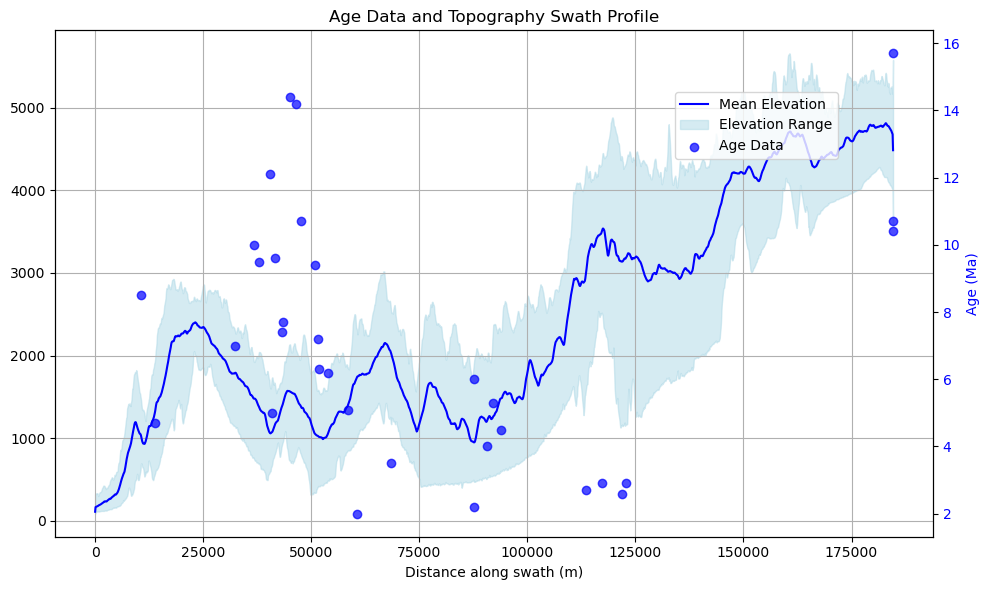

In [12]:
# Topography
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from tqdm import tqdm 


# shape= 'swath_subanshiri_middle_proj.shp'
# shape ='subanshiri_swath_middle_EPSG_47.shp'
shape ='subanshiri_swath_middle_EPSG_47.shp'

DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
DEM = 'Bhutan_Arunachal_EPSG_47_PROJ.tif' # SRTM 30
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+DEM
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
# print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

# Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Or define swath line manually 
# swath_coords = [(x1, y1), (x2, y2)]  # Replace with real coordinates x1 Longitude, y1 Latitude
# swath_line = LineString(swath_coords)

# (95.37871211904822, 28.095067581911987),  # Start (Longitude, Latitude)
#                (93.20151833453788, 29.005375617560578)

# Define width of swath line
buffer_width = 10000 # Swath width in meters (e.g., 1000 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Elevation"])
bin_width = 100  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary = df.groupby("Bin").agg(
    Mean_Elevation=("Elevation", "mean"),
    Min_Elevation=("Elevation", "min"),
    Max_Elevation=("Elevation", "max")
)
summary["Bin_Center"] = summary.index * bin_width

#---------------------------------------------------------------------
# Load Age data (CSV with columns: Latitude, Longitude, Age)
Age_data = pd.read_csv(AFT_herman)

# Convert to GeoDataFrame

geometry = [Point(xy) for xy in zip(Age_data["Longitude"], Age_data["Latitude"])]
Age_gdf = gpd.GeoDataFrame(Age_data, geometry=geometry, crs="EPSG:4326")

# Reproject Age data to match DEM CRS
Age_gdf = Age_gdf.to_crs(dem.crs)
# Age_gdf
# print(f"CRS of the Precipitation_TRMM: {Age_gdf.crs}")
#------------------------------------------------------------------------
# 
buffer_width = 100000  # 100 km buffer
swath_buffer = swath_line.buffer(buffer_width)

# Filter Age data points within the swath buffer
AFT_Ages_within_swath = Age_gdf[Age_gdf.geometry.within(swath_buffer)]

# Project points to swath distances
from shapely.ops import nearest_points

Age_distances = []
for point in tqdm(AFT_Ages_within_swath.geometry, desc="Calculating Age distances", total=len(AFT_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    Age_distances.append(distance)

AFT_Ages_within_swath["Distance"] = Age_distances
#-----------------------------------------------------------------------
# plot swath profile
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot topography profile
# ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
# ax1.set_ylabel("Elevation (m)", color="brown")
# ax1.tick_params(axis="y", labelcolor="brown")
ax1.plot(summary["Bin_Center"], summary["Mean_Elevation"], color="blue", label="Mean Elevation")
ax1.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color="lightblue",
    alpha=0.5,
    label="Elevation Range"
)

#-------------------------------------------------------------------------------------
# Plot the Swath Profile
# Plot Age data on secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
            color="blue", label="Age Data", alpha=0.7)
ax2.set_ylabel("Age (Ma)", color="blue")
ax2.tick_params(axis="y", labelcolor="blue")

# Add labels, legend, and title
ax1.set_xlabel("Distance along swath (m)")
plt.title("Age Data and Topography Swath Profile")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
# plt.show()
# print(f"Age",AFT_Ages_within_swath["Age"])
# print(f'Age distance x',AFT_Ages_within_swath["Distance"])
# print(f'Precip y',summary["Mean_Elevation"])
# print(f'prcip x',AFT_Ages_within_swath["Distance"])

# Combine Age and elevation data into a single DataFrame
swath_profile_df = pd.DataFrame({
    "Age_Distance": AFT_Ages_within_swath["Distance"],
    "Age": AFT_Ages_within_swath["Age"],
    "Elevation_Distance": summary["Bin_Center"],
    "Mean_Elevation": summary["Mean_Elevation"],
    "Min_Elevation": summary["Min_Elevation"],
    "Max_Elevation": summary["Max_Elevation"]
})
swath_profile_df 
import os
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
shape_file_name
output_csv_path = f"/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/{shape_file_name}_swath_Age_topography.csv"  # Replace with desired directory

# Save the combined data to the CSV file
swath_profile_df.to_csv(output_csv_path, index=False)

print(f"Swath profile data saved to {output_csv_path}")

In [10]:
## Prcipitation

CRS of the shapefile: EPSG:32647
CRS of the DEM_SRTM30: EPSG:32647


/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/shapely/linear.py:88: RuntimeWarning: invalid value encountered in line_locate_point
  return lib.line_locate_point(line, other)
Calculating distances: 100%|█████████████| 1498/1498 [00:00<00:00, 41485.81it/s]
/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/shapely/linear.py:88: RuntimeWarning: invalid value encountered in line_locate_point
  return lib.line_locate_point(line, other)
Calculating age distances: 100%|█████████████| 24/24 [00:00<00:00, 22585.44it/s]

Swath profile data saved to /home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_age/subanshiri_swath_middle_EPSG_47_swath_age_topography.csv



/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


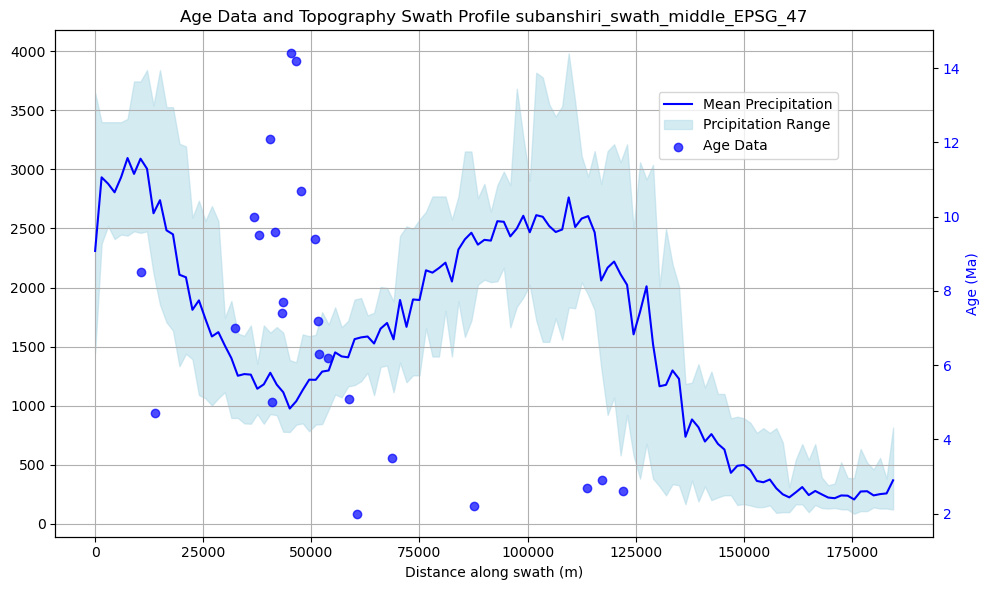

In [13]:
# Precipitation and Age
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from tqdm import tqdm 
import os


# shape= 'swath_subanshiri_middle_proj.shp'
# shape ='subanshiri_swath_middle_EPSG_47.shp'
shape ='subanshiri_swath_middle_EPSG_47.shp'
DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
DEM = 'Bhutan_Arunachal_EPSG_47_PROJ.tif' # SRTM 30
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+DEM
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
# print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

swath_width_topo = 50000 # unit is in meter 1km = 1000m
swath_width_precip = 50000 # unit is in meter 1km = 1000m
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
shape_file_name
bin_precip = 1500

# Load topographic data (e.g., DEM)
dem_path = raster_precip
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Or define swath line manually 
# swath_coords = [(x1, y1), (x2, y2)]  # Replace with real coordinates x1 Longitude, y1 Latitude
# swath_line = LineString(swath_coords)

# (95.37871211904822, 28.095067581911987),  # Start (Longitude, Latitude)
#                (93.20151833453788, 29.005375617560578)

# Define width of swath line
buffer_width = swath_width_topo # Swath width in meters (e.g., 1000 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Precipitation"])
bin_width = bin_precip  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary_precip = df.groupby("Bin").agg(
    Mean_Precipitation=("Precipitation", "mean"),
    Min_Precipitation=("Precipitation", "min"),
    Max_Precipitation=("Precipitation", "max")
)
summary_precip["Bin_Center"] = summary_precip.index * bin_width

#---------------------------------------------------------------------
# Load Age data (CSV with columns: Latitude, Longitude, Age)
Age_data = pd.read_csv(AFT_herman)

# Convert to GeoDataFrame

geometry = [Point(xy) for xy in zip(Age_data["Longitude"], Age_data["Latitude"])]
Age_gdf = gpd.GeoDataFrame(Age_data, geometry=geometry, crs="EPSG:4326")

# Reproject Age data to match DEM CRS
Age_gdf = Age_gdf.to_crs(dem.crs)
# Age_gdf
# print(f"CRS of the Precipitation_TRMM: {Age_gdf.crs}")
#------------------------------------------------------------------------
# 
buffer_width = swath_width_precip  # 100 km buffer
swath_buffer = swath_line.buffer(buffer_width)

# Filter Age data points within the swath buffer
AFT_Ages_within_swath = Age_gdf[Age_gdf.geometry.within(swath_buffer)]

# Project points to swath distances
from shapely.ops import nearest_points

Age_distances = []
for point in tqdm(AFT_Ages_within_swath.geometry, desc="Calculating Age distances", total=len(AFT_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    Age_distances.append(distance)

AFT_Ages_within_swath["Distance"] = Age_distances
#-----------------------------------------------------------------------
# plot swath profile
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot topography profile
# ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
# ax1.set_ylabel("Elevation (m)", color="brown")
# ax1.tick_params(axis="y", labelcolor="brown")
ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color="blue", label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color="lightblue",
    alpha=0.5,
    label="Prcipitation Range"
)

#-------------------------------------------------------------------------------------
# Plot the Swath Profile
# Plot Age data on secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
            color="blue", label="Age Data", alpha=0.7)
ax2.set_ylabel("Age (Ma)", color="blue")
ax2.tick_params(axis="y", labelcolor="blue")

# Add labels, legend, and title
ax1.set_xlabel("Distance along swath (m)")
plt.title(f"Age Data and Topography Swath Profile {shape_file_name}")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
# plt.show()
# Combine Age and Precipitation data into a single DataFrame
swath_profile_df = pd.DataFrame({
    "Age_Distance": AFT_Ages_within_swath["Distance"],
    "Age": AFT_Ages_within_swath["Age"],
    "Precipitation_Distance": summary_precip["Bin_Center"],
    "Mean_Precipitation": summary_precip["Mean_Precipitation"],
    "Min_Precipitation": summary_precip["Min_Precipitation"],
    "Max_Precipitation": summary_precip["Max_Precipitation"]
})
swath_profile_df 

# import os
# shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
# shape_file_name
# output_csv_path = f"/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/{shape_file_name}_swath_Age_precip.csv"  # Replace with desired directory

# Save the combined data to the CSV file
swath_profile_df.to_csv(output_csv_path, index=False)

print(f"Swath profile data saved to {output_csv_path}")


In [ ]:
# All plot 

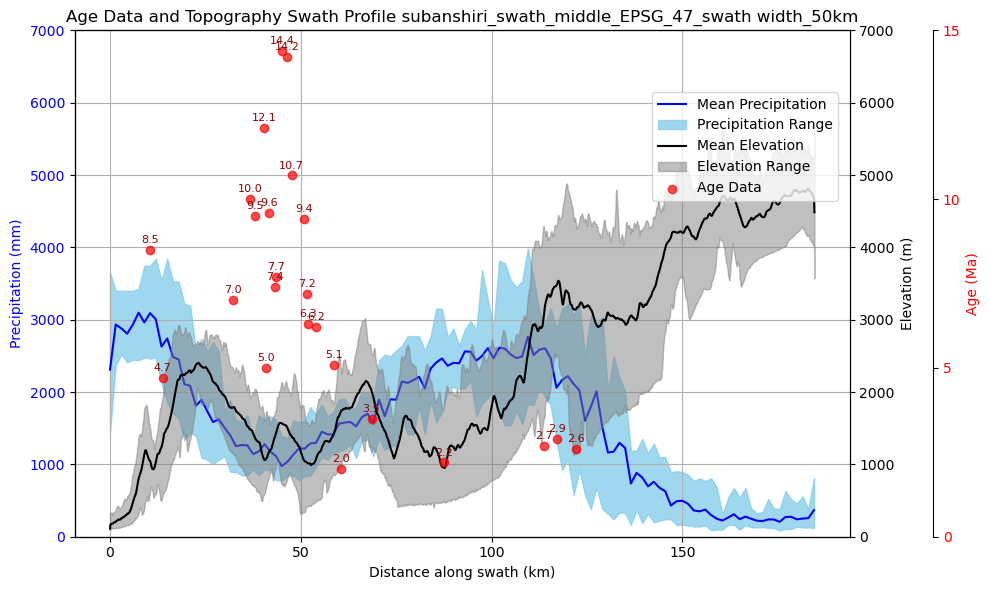

In [16]:
fig, ax1 = plt.subplots(figsize=(10, 6))
fixed_Age_ymin = 0
fixed_Age_ymax = 15
fixed_precip_ymin = 0
fixed_precip_ymax = 7000
fixed_elevation_ymin = 0
fixed_elevation_ymax = 7000 
precip_color_mean = "blue"
precip_color_fill = "skyblue"
elevation_color_mean = "black"
elevation_color_fill = "gray"
fixed_xmin = 0
fixed_xmax = 250000  # Assuming the maximum is in meters, you can adjust as needed

# Plot precipitation profile
ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color=precip_color_mean, label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color=precip_color_fill,
    alpha=0.8,
    label="Precipitation Range"
)

# # Set fixed x-axis limits (convert to kilometers)

# ax1.set_xlim(fixed_xmin, fixed_xmax)

# Convert x-axis ticks to kilometers
ax1.set_xticks(range(fixed_xmin, fixed_xmax + 1, 50000))  # Ticks every 50 km (50,000 meters)
ax1.set_xticklabels([f"{x/1000:.0f}" for x in range(fixed_xmin, fixed_xmax + 50000, 50000)])  # Convert to kilometers

# Fixed y-axis for precipitation
fixed_precip_ymin = fixed_precip_ymin
fixed_precip_ymax = fixed_precip_ymax  # Adjust based on data range
ax1.set_ylim(fixed_precip_ymin, fixed_precip_ymax)
ax1.set_yticks(range(fixed_precip_ymin, fixed_precip_ymax + 500, 1000))  # Tick interval of 1000 mm
ax1.set_ylabel("Precipitation (mm)", color=precip_color_mean)
ax1.tick_params(axis="y", labelcolor=precip_color_mean)

# Create a second y-axis for elevation data
ax2 = ax1.twinx()
ax2.plot(summary["Bin_Center"], summary["Mean_Elevation"], color=elevation_color_mean , label="Mean Elevation")
ax2.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color=elevation_color_fill,
    alpha=0.5,
    label="Elevation Range"
)

# Fixed y-axis for elevation
fixed_elevation_ymin = fixed_elevation_ymin
fixed_elevation_ymax = fixed_elevation_ymax  # Adjust as necessary
ax2.set_ylim(fixed_elevation_ymin, fixed_elevation_ymax)
ax2.set_yticks(range(fixed_elevation_ymin, fixed_elevation_ymax + 500, 1000))  # Tick interval of 500 m
ax2.set_ylabel("Elevation (m)", color=elevation_color_mean )
ax2.tick_params(axis="y", labelcolor=elevation_color_mean )

# Plot Age data on a third y-axis
ax3 = ax1.twinx()
ax3.spines["right"].set_position(("outward", 60))  # Offset third y-axis
sc = ax3.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
                 color="red", label="Age Data", alpha=0.7)

# Annotate Ages
for i, row in AFT_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",  # Format Age to 1 decimal place
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),  # Offset position of text
        ha="center",
        fontsize=8,
        color="darkred"
    )

# Fixed y-axis for Age
fixed_Age_ymin = fixed_Age_ymin
fixed_Age_ymax = fixed_Age_ymax   # Adjust as necessary
ax3.set_ylim(fixed_Age_ymin, fixed_Age_ymax)
ax3.set_yticks(range(fixed_Age_ymin, fixed_Age_ymax + 5, 5))  # Tick interval of 10 Ma
ax3.set_ylabel("Age (Ma)", color="red")
ax3.tick_params(axis="y", labelcolor="red")

# Add title, grid, and legend
ax1.set_xlabel("Distance along swath (km)")
plt.title(f"Age Data and Topography Swath Profile {shape_file_name}_swath width_{round(swath_width_topo/1000)}km")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
plt.show()
# dpi_fig =500
fig.savefig(f'/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/swath_output_figures/{shape_file_name}_Age_precip_topo_swath_width-{round(swath_width_topo/1000)}km.pdf', dpi = dpi_fig)

# Kameng

## Topography Kameng

CRS of the shapefile: EPSG:32647
CRS of the DEM_SRTM30: EPSG:32647


Calculating age distances: 100%|█████████████| 79/79 [00:00<00:00, 26012.72it/s]
/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Swath profile data saved to /home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_age/kameng_EPSG_47_swath_age_topography.csv


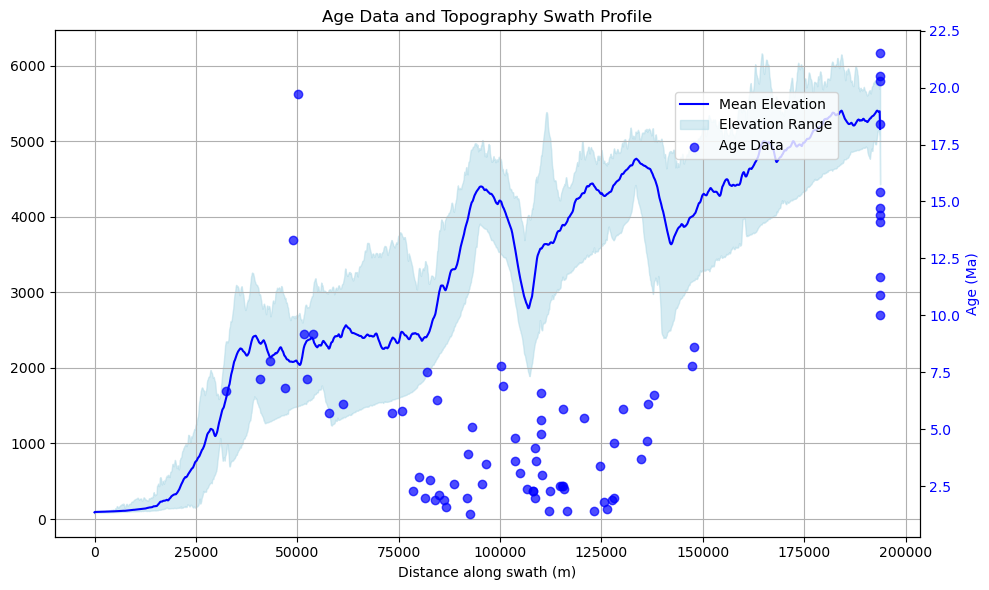

In [2]:
# Topography
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from tqdm import tqdm 


# shape= 'swath_subanshiri_middle_proj.shp'
# shape ='subanshiri_swath_middle_EPSG_47.shp'
shape ='kameng_EPSG_47.shp'
DEM = 'Bhutan_Arunachal_EPSG_47_PROJ.tif' # SRTM 30
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+DEM
DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape

raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
# print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

# Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Or define swath line manually 
# swath_coords = [(x1, y1), (x2, y2)]  # Replace with real coordinates x1 Longitude, y1 Latitude
# swath_line = LineString(swath_coords)

# (95.37871211904822, 28.095067581911987),  # Start (Longitude, Latitude)
#                (93.20151833453788, 29.005375617560578)

# Define width of swath line
buffer_width = 10000 # Swath width in meters (e.g., 1000 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Elevation"])
bin_width = 100  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary = df.groupby("Bin").agg(
    Mean_Elevation=("Elevation", "mean"),
    Min_Elevation=("Elevation", "min"),
    Max_Elevation=("Elevation", "max")
)
summary["Bin_Center"] = summary.index * bin_width

#---------------------------------------------------------------------
# Load Age data (CSV with columns: Latitude, Longitude, Age)
Age_data = pd.read_csv(AFT_herman)

# Convert to GeoDataFrame

geometry = [Point(xy) for xy in zip(Age_data["Longitude"], Age_data["Latitude"])]
Age_gdf = gpd.GeoDataFrame(Age_data, geometry=geometry, crs="EPSG:4326")

# Reproject Age data to match DEM CRS
Age_gdf = Age_gdf.to_crs(dem.crs)
# Age_gdf
# print(f"CRS of the Precipitation_TRMM: {Age_gdf.crs}")
#------------------------------------------------------------------------
# 
buffer_width = 100000  # 100 km buffer
swath_buffer = swath_line.buffer(buffer_width)

# Filter Age data points within the swath buffer
AFT_Ages_within_swath = Age_gdf[Age_gdf.geometry.within(swath_buffer)]

# Project points to swath distances
from shapely.ops import nearest_points

Age_distances = []
for point in tqdm(AFT_Ages_within_swath.geometry, desc="Calculating Age distances", total=len(AFT_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    Age_distances.append(distance)

AFT_Ages_within_swath["Distance"] = Age_distances
#-----------------------------------------------------------------------
# plot swath profile
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot topography profile
# ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
# ax1.set_ylabel("Elevation (m)", color="brown")
# ax1.tick_params(axis="y", labelcolor="brown")
ax1.plot(summary["Bin_Center"], summary["Mean_Elevation"], color="blue", label="Mean Elevation")
ax1.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color="lightblue",
    alpha=0.5,
    label="Elevation Range"
)

#-------------------------------------------------------------------------------------
# Plot the Swath Profile
# Plot Age data on secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
            color="blue", label="Age Data", alpha=0.7)
ax2.set_ylabel("Age (Ma)", color="blue")
ax2.tick_params(axis="y", labelcolor="blue")

# Add labels, legend, and title
ax1.set_xlabel("Distance along swath (m)")
plt.title("Age Data and Topography Swath Profile")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
# plt.show()
# print(f"Age",AFT_Ages_within_swath["Age"])
# print(f'Age distance x',AFT_Ages_within_swath["Distance"])
# print(f'Precip y',summary["Mean_Elevation"])
# print(f'prcip x',AFT_Ages_within_swath["Distance"])

# Combine Age and elevation data into a single DataFrame
swath_profile_df = pd.DataFrame({
    "Age_Distance": AFT_Ages_within_swath["Distance"],
    "Age": AFT_Ages_within_swath["Age"],
    "Elevation_Distance": summary["Bin_Center"],
    "Mean_Elevation": summary["Mean_Elevation"],
    "Min_Elevation": summary["Min_Elevation"],
    "Max_Elevation": summary["Max_Elevation"]
})
swath_profile_df 
import os
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
shape_file_name
output_csv_path = f"/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/{shape_file_name}_swath_Age_topography.csv"  # Replace with desired directory

# Save the combined data to the CSV file
swath_profile_df.to_csv(output_csv_path, index=False)

print(f"Swath profile data saved to {output_csv_path}")

## Precipittation Kameng

CRS of the shapefile: EPSG:32647
CRS of the DEM_SRTM30: EPSG:32647


Calculating age distances: 100%|█████████████| 48/48 [00:00<00:00, 27492.37it/s]

Swath profile data saved to /home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_age/kameng_EPSG_47_swath_age_topography.csv



/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


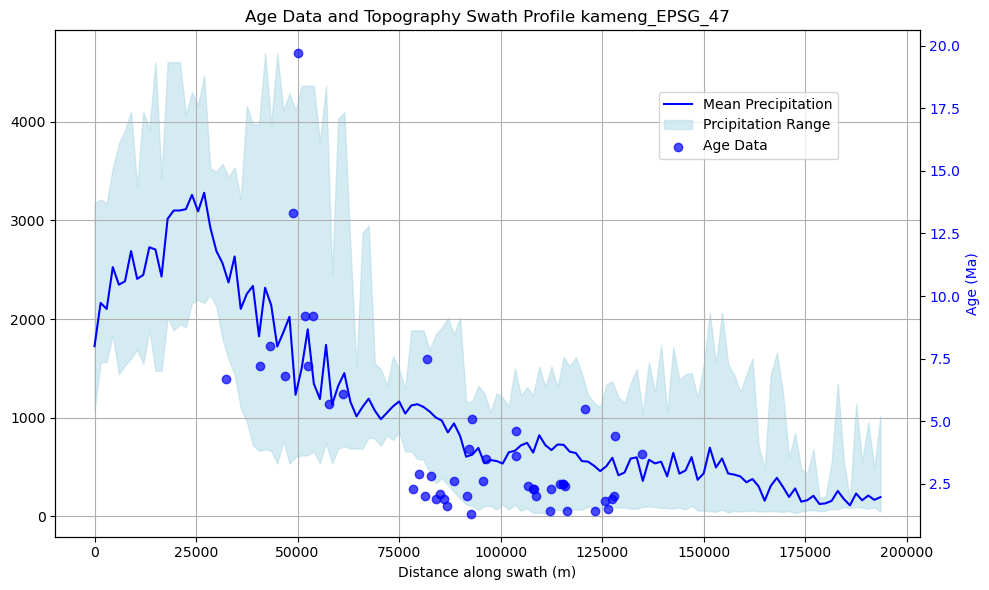

In [3]:
# Precipitation and Age
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from tqdm import tqdm 
import os


# shape= 'swath_subanshiri_middle_proj.shp'
# shape ='subanshiri_swath_middle_EPSG_47.shp'
shape ='kameng_EPSG_47.shp'
# DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+DEM
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
# print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

swath_width_topo = 50000 # unit is in meter 1km = 1000m
swath_width_precip = 50000 # unit is in meter 1km = 1000m
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
shape_file_name
bin_precip = 1500

# Load topographic data (e.g., DEM)
dem_path = raster_precip
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Or define swath line manually 
# swath_coords = [(x1, y1), (x2, y2)]  # Replace with real coordinates x1 Longitude, y1 Latitude
# swath_line = LineString(swath_coords)

# (95.37871211904822, 28.095067581911987),  # Start (Longitude, Latitude)
#                (93.20151833453788, 29.005375617560578)

# Define width of swath line
buffer_width = swath_width_topo # Swath width in meters (e.g., 1000 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Precipitation"])
bin_width = bin_precip  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary_precip = df.groupby("Bin").agg(
    Mean_Precipitation=("Precipitation", "mean"),
    Min_Precipitation=("Precipitation", "min"),
    Max_Precipitation=("Precipitation", "max")
)
summary_precip["Bin_Center"] = summary_precip.index * bin_width

#---------------------------------------------------------------------
# Load Age data (CSV with columns: Latitude, Longitude, Age)
Age_data = pd.read_csv(AFT_herman)

# Convert to GeoDataFrame

geometry = [Point(xy) for xy in zip(Age_data["Longitude"], Age_data["Latitude"])]
Age_gdf = gpd.GeoDataFrame(Age_data, geometry=geometry, crs="EPSG:4326")

# Reproject Age data to match DEM CRS
Age_gdf = Age_gdf.to_crs(dem.crs)
# Age_gdf
# print(f"CRS of the Precipitation_TRMM: {Age_gdf.crs}")
#------------------------------------------------------------------------
# 
buffer_width = swath_width_precip  # 100 km buffer
swath_buffer = swath_line.buffer(buffer_width)

# Filter Age data points within the swath buffer
AFT_Ages_within_swath = Age_gdf[Age_gdf.geometry.within(swath_buffer)]

# Project points to swath distances
from shapely.ops import nearest_points

Age_distances = []
for point in tqdm(AFT_Ages_within_swath.geometry, desc="Calculating Age distances", total=len(AFT_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    Age_distances.append(distance)

AFT_Ages_within_swath["Distance"] = Age_distances
#-----------------------------------------------------------------------
# plot swath profile
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot topography profile
# ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
# ax1.set_ylabel("Elevation (m)", color="brown")
# ax1.tick_params(axis="y", labelcolor="brown")
ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color="blue", label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color="lightblue",
    alpha=0.5,
    label="Prcipitation Range"
)

#-------------------------------------------------------------------------------------
# Plot the Swath Profile
# Plot Age data on secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
            color="blue", label="Age Data", alpha=0.7)
ax2.set_ylabel("Age (Ma)", color="blue")
ax2.tick_params(axis="y", labelcolor="blue")

# Add labels, legend, and title
ax1.set_xlabel("Distance along swath (m)")
plt.title(f"Age Data and Topography Swath Profile {shape_file_name}")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
# plt.show()
# Combine Age and Precipitation data into a single DataFrame
swath_profile_df = pd.DataFrame({
    "Age_Distance": AFT_Ages_within_swath["Distance"],
    "Age": AFT_Ages_within_swath["Age"],
    "Precipitation_Distance": summary_precip["Bin_Center"],
    "Mean_Precipitation": summary_precip["Mean_Precipitation"],
    "Min_Precipitation": summary_precip["Min_Precipitation"],
    "Max_Precipitation": summary_precip["Max_Precipitation"]
})
swath_profile_df 

# import os
# shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
# shape_file_name
# output_csv_path = f"/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/{shape_file_name}_swath_Age_precip.csv"  # Replace with desired directory

# Save the combined data to the CSV file
swath_profile_df.to_csv(output_csv_path, index=False)

print(f"Swath profile data saved to {output_csv_path}")


## All plot kameng

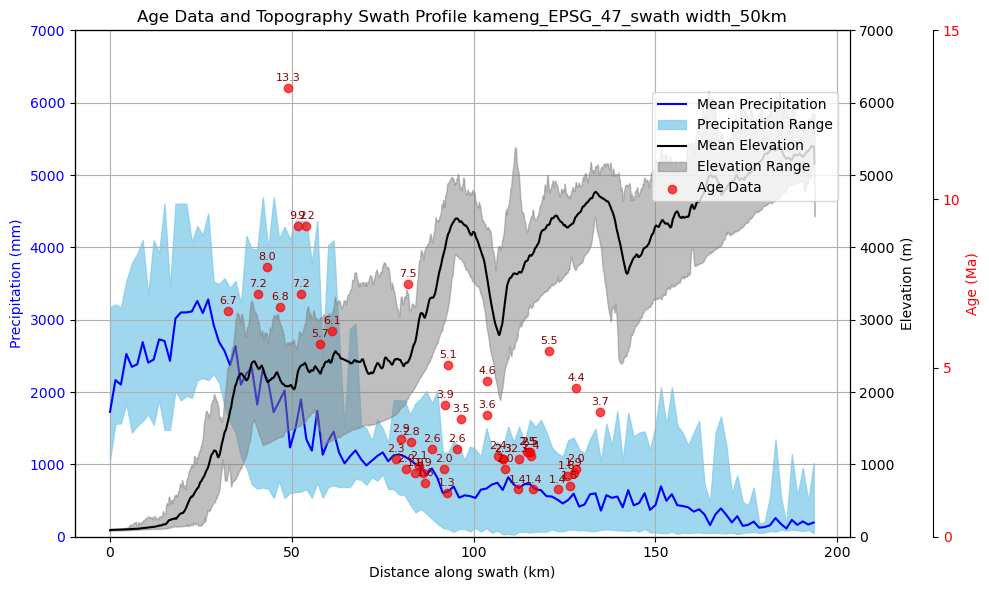

In [11]:
fig, ax1 = plt.subplots(figsize=(10, 6))
fixed_Age_ymin = 0
fixed_Age_ymax = 15
fixed_precip_ymin = 0
fixed_precip_ymax = 7000
fixed_elevation_ymin = 0
fixed_elevation_ymax = 7000 
precip_color_mean = "blue"
precip_color_fill = "skyblue"
elevation_color_mean = "black"
elevation_color_fill = "gray"
fixed_xmin = 0
fixed_xmax = 250000  # Assuming the maximum is in meters, you can adjust as needed
dpi_fig=500

# Plot precipitation profile
ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color=precip_color_mean, label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color=precip_color_fill,
    alpha=0.8,
    label="Precipitation Range"
)

# # Set fixed x-axis limits (convert to kilometers)

# ax1.set_xlim(fixed_xmin, fixed_xmax)

# Convert x-axis ticks to kilometers
ax1.set_xticks(range(fixed_xmin, fixed_xmax + 1, 50000))  # Ticks every 50 km (50,000 meters)
ax1.set_xticklabels([f"{x/1000:.0f}" for x in range(fixed_xmin, fixed_xmax + 50000, 50000)])  # Convert to kilometers

# Fixed y-axis for precipitation
fixed_precip_ymin = fixed_precip_ymin
fixed_precip_ymax = fixed_precip_ymax  # Adjust based on data range
ax1.set_ylim(fixed_precip_ymin, fixed_precip_ymax)
ax1.set_yticks(range(fixed_precip_ymin, fixed_precip_ymax + 500, 1000))  # Tick interval of 1000 mm
ax1.set_ylabel("Precipitation (mm)", color=precip_color_mean)
ax1.tick_params(axis="y", labelcolor=precip_color_mean)

# Create a second y-axis for elevation data
ax2 = ax1.twinx()
ax2.plot(summary["Bin_Center"], summary["Mean_Elevation"], color=elevation_color_mean , label="Mean Elevation")
ax2.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color=elevation_color_fill,
    alpha=0.5,
    label="Elevation Range"
)

# Fixed y-axis for elevation
fixed_elevation_ymin = fixed_elevation_ymin
fixed_elevation_ymax = fixed_elevation_ymax  # Adjust as necessary
ax2.set_ylim(fixed_elevation_ymin, fixed_elevation_ymax)
ax2.set_yticks(range(fixed_elevation_ymin, fixed_elevation_ymax + 500, 1000))  # Tick interval of 500 m
ax2.set_ylabel("Elevation (m)", color=elevation_color_mean )
ax2.tick_params(axis="y", labelcolor=elevation_color_mean )

# Plot Age data on a third y-axis
ax3 = ax1.twinx()
ax3.spines["right"].set_position(("outward", 60))  # Offset third y-axis
sc = ax3.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
                 color="red", label="Age Data", alpha=0.7)

# Annotate Ages
for i, row in AFT_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",  # Format Age to 1 decimal place
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),  # Offset position of text
        ha="center",
        fontsize=8,
        color="darkred"
    )

# Fixed y-axis for Age
fixed_Age_ymin = fixed_Age_ymin
fixed_Age_ymax = fixed_Age_ymax   # Adjust as necessary
ax3.set_ylim(fixed_Age_ymin, fixed_Age_ymax)
ax3.set_yticks(range(fixed_Age_ymin, fixed_Age_ymax + 5, 5))  # Tick interval of 10 Ma
ax3.set_ylabel("Age (Ma)", color="red")
ax3.tick_params(axis="y", labelcolor="red")

# Add title, grid, and legend
ax1.set_xlabel("Distance along swath (km)")
plt.title(f"Age Data and Topography Swath Profile {shape_file_name}_swath width_{round(swath_width_topo/1000)}km")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
plt.show()
fig.savefig(f'/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/swath_output_figures/{shape_file_name}_Age_precip_topo_swath_width-{round(swath_width_topo/1000)}km.pdf', dpi=dpi_fig)

# BS(Bumthang_surface)_Chamkhar_chu

### Topography BS(Bumthang_surface)_Chamkhar_chu

### plot all three with annoted Ages

In [ ]:
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot precipitation profile
ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color="blue", label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color="lightblue",
    alpha=0.5,
    label="Precipitation Range"
)

# Create a second y-axis for elevation data
ax2 = ax1.twinx()
ax2.plot(summary["Bin_Center"], summary["Mean_Elevation"], color="green", label="Mean Elevation")
ax2.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color="lightgreen",
    alpha=0.5,
    label="Elevation Range"
)

# Plot Age data on secondary y-axis
ax3 = ax1.twinx()
ax3.spines["right"].set_position(("outward", 60))  # Offset third y-axis
sc = ax3.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
                 color="red", label="Age Data", alpha=0.7)

# Annotate Ages
for i, row in AFT_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",  # Format Age to 1 decimal place
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),  # Offset position of text
        ha="center",
        fontsize=8,
        color="darkred"
    )

# Add labels and legend
ax1.set_xlabel("Distance along swath (m)")
ax1.set_ylabel("Precipitation (mm)", color="blue")
ax1.tick_params(axis="y", labelcolor="blue")
ax2.set_ylabel("Elevation (m)", color="green")
ax2.tick_params(axis="y", labelcolor="green")
ax3.set_ylabel("Age (Ma)", color="red")
ax3.tick_params(axis="y", labelcolor="red")

plt.title(f"Age Data and Topography Swath Profile {shape_file_name}")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
plt.show()


# Mechuka HFT 

In [ ]:
# Topography
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from tqdm import tqdm 


# shape= 'swath_subanshiri_middle_proj.shp'
shape ='mechuka_HFT_swath_EPSG_47.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/DEM@PRAYOGA/'+DEM
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
# print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

swath_width_topo = 50000 # unit is in meter 1km = 1000m
swath_width_precip = 50000 # unit is in meter 1km = 1000m
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
shape_file_name

# Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Or define swath line manually 
# swath_coords = [(x1, y1), (x2, y2)]  # Replace with real coordinates x1 Longitude, y1 Latitude
# swath_line = LineString(swath_coords)

# (95.37871211904822, 28.095067581911987),  # Start (Longitude, Latitude)
#                (93.20151833453788, 29.005375617560578)

# Define width of swath line
buffer_width = swath_width_topo # Swath width in meters (e.g., 1000 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Elevation"])
bin_width = 100  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary = df.groupby("Bin").agg(
    Mean_Elevation=("Elevation", "mean"),
    Min_Elevation=("Elevation", "min"),
    Max_Elevation=("Elevation", "max")
)
summary["Bin_Center"] = summary.index * bin_width

#---------------------------------------------------------------------
# Load Age data (CSV with columns: Latitude, Longitude, Age)
Age_data = pd.read_csv(AFT_herman)

# Convert to GeoDataFrame

geometry = [Point(xy) for xy in zip(Age_data["Longitude"], Age_data["Latitude"])]
Age_gdf = gpd.GeoDataFrame(Age_data, geometry=geometry, crs="EPSG:4326")

# Reproject Age data to match DEM CRS
Age_gdf = Age_gdf.to_crs(dem.crs)
# Age_gdf
# print(f"CRS of the Precipitation_TRMM: {Age_gdf.crs}")
#------------------------------------------------------------------------
# 
buffer_width = swath_width_precip  # 100 km buffer
swath_buffer = swath_line.buffer(buffer_width)

# Filter Age data points within the swath buffer
AFT_Ages_within_swath = Age_gdf[Age_gdf.geometry.within(swath_buffer)]

# Project points to swath distances
from shapely.ops import nearest_points

Age_distances = []
for point in tqdm(AFT_Ages_within_swath.geometry, desc="Calculating Age distances", total=len(AFT_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    Age_distances.append(distance)

AFT_Ages_within_swath["Distance"] = Age_distances
#-----------------------------------------------------------------------
# plot swath profile
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot topography profile
# ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
# ax1.set_ylabel("Elevation (m)", color="brown")
# ax1.tick_params(axis="y", labelcolor="brown")
ax1.plot(summary["Bin_Center"], summary["Mean_Elevation"], color="blue", label="Mean Elevation")
ax1.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color="lightblue",
    alpha=0.5,
    label="Elevation Range"
)

#-------------------------------------------------------------------------------------
# Plot the Swath Profile
# Plot Age data on secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
            color="blue", label="Age Data", alpha=0.7)
ax2.set_ylabel("Age (Ma)", color="blue")
ax2.tick_params(axis="y", labelcolor="blue")

# Add labels, legend, and title
ax1.set_xlabel("Distance along swath (m)")
plt.title("Age Data and Topography Swath Profile")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
# plt.show()
# print(f"Age",AFT_Ages_within_swath["Age"])
# print(f'Age distance x',AFT_Ages_within_swath["Distance"])
# print(f'Precip y',summary["Mean_Elevation"])
# print(f'prcip x',AFT_Ages_within_swath["Distance"])

# Combine Age and elevation data into a single DataFrame
swath_profile_df = pd.DataFrame({
    "Age_Distance": AFT_Ages_within_swath["Distance"],
    "Age": AFT_Ages_within_swath["Age"],
    "Elevation_Distance": summary["Bin_Center"],
    "Mean_Elevation": summary["Mean_Elevation"],
    "Min_Elevation": summary["Min_Elevation"],
    "Max_Elevation": summary["Max_Elevation"]
})
swath_profile_df 
import os
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
shape_file_name
output_csv_path = f"/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/{shape_file_name}_swath_Age_topography.csv"  # Replace with desired directory

# Save the combined data to the CSV file
swath_profile_df.to_csv(output_csv_path, index=False)

print(f"Swath profile data saved to {output_csv_path}")


# Precipitation and Age
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from tqdm import tqdm 
import os


# shape= 'swath_subanshiri_middle_proj.shp'

baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/DEM@PRAYOGA/'+DEM
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
# print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")



# Load topographic data (e.g., DEM)
dem_path = raster_precip
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Or define swath line manually 
# swath_coords = [(x1, y1), (x2, y2)]  # Replace with real coordinates x1 Longitude, y1 Latitude
# swath_line = LineString(swath_coords)

# (95.37871211904822, 28.095067581911987),  # Start (Longitude, Latitude)
#                (93.20151833453788, 29.005375617560578)

# Define width of swath line
buffer_width = swath_width_topo # Swath width in meters (e.g., 1000 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Precipitation"])
bin_width = 100  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary_precip = df.groupby("Bin").agg(
    Mean_Precipitation=("Precipitation", "mean"),
    Min_Precipitation=("Precipitation", "min"),
    Max_Precipitation=("Precipitation", "max")
)
summary_precip["Bin_Center"] = summary_precip.index * bin_width

#---------------------------------------------------------------------
# Load Age data (CSV with columns: Latitude, Longitude, Age)
Age_data = pd.read_csv(AFT_herman)

# Convert to GeoDataFrame

geometry = [Point(xy) for xy in zip(Age_data["Longitude"], Age_data["Latitude"])]
Age_gdf = gpd.GeoDataFrame(Age_data, geometry=geometry, crs="EPSG:4326")

# Reproject Age data to match DEM CRS
Age_gdf = Age_gdf.to_crs(dem.crs)
# Age_gdf
# print(f"CRS of the Precipitation_TRMM: {Age_gdf.crs}")
#------------------------------------------------------------------------
# 
buffer_width = swath_width_precip  # 100 km buffer
swath_buffer = swath_line.buffer(buffer_width)

# Filter Age data points within the swath buffer
AFT_Ages_within_swath = Age_gdf[Age_gdf.geometry.within(swath_buffer)]

# Project points to swath distances
from shapely.ops import nearest_points

Age_distances = []
for point in tqdm(AFT_Ages_within_swath.geometry, desc="Calculating Age distances", total=len(AFT_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    Age_distances.append(distance)

AFT_Ages_within_swath["Distance"] = Age_distances
#-----------------------------------------------------------------------
# plot swath profile
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot topography profile
# ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
# ax1.set_ylabel("Elevation (m)", color="brown")
# ax1.tick_params(axis="y", labelcolor="brown")
ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color="blue", label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color="lightblue",
    alpha=0.5,
    label="Prcipitation Range"
)

#-------------------------------------------------------------------------------------
# Plot the Swath Profile
# Plot Age data on secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
            color="blue", label="Age Data", alpha=0.7)
ax2.set_ylabel("Age (Ma)", color="blue")
ax2.tick_params(axis="y", labelcolor="blue")

# Add labels, legend, and title
ax1.set_xlabel("Distance along swath (m)")
plt.title(f"Age Data and Topography Swath Profile {shape_file_name}")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
# plt.show()
# Combine Age and Precipitation data into a single DataFrame
swath_profile_df = pd.DataFrame({
    "Age_Distance": AFT_Ages_within_swath["Distance"],
    "Age": AFT_Ages_within_swath["Age"],
    "Precipitation_Distance": summary_precip["Bin_Center"],
    "Mean_Precipitation": summary_precip["Mean_Precipitation"],
    "Min_Precipitation": summary_precip["Min_Precipitation"],
    "Max_Precipitation": summary_precip["Max_Precipitation"]
})
swath_profile_df 

import os
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
shape_file_name
output_csv_path = f"/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/{shape_file_name}_swath_Age_precip.csv"  # Replace with desired directory

# Save the combined data to the CSV file
swath_profile_df.to_csv(output_csv_path, index=False)

print(f"Swath profile data saved to {output_csv_path}")


# All plot Topography, Precipitation and Age
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot precipitation profile
ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color="blue", label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color="lightblue",
    alpha=0.5,
    label="Precipitation Range"
)

# Create a second y-axis for elevation data
ax2 = ax1.twinx()
ax2.plot(summary["Bin_Center"], summary["Mean_Elevation"], color="green", label="Mean Elevation")
ax2.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color="lightgreen",
    alpha=0.5,
    label="Elevation Range"
)

# Plot Age data on secondary y-axis
ax3 = ax1.twinx()
ax3.spines["right"].set_position(("outward", 60))  # Offset third y-axis
ax3.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
            color="red", label="Age Data", alpha=0.7)
ax3.set_ylabel("Age (Ma)", color="red")
ax3.tick_params(axis="y", labelcolor="red")

# Add labels, legend, and title
ax1.set_xlabel("Distance along swath (m)")
ax1.set_ylabel("Precipitation (mm)", color="blue")
ax1.tick_params(axis="y", labelcolor="blue")
ax2.set_ylabel("Elevation (m)", color="green")
ax2.tick_params(axis="y", labelcolor="green")

plt.title(f"Age Data and Topography Swath Profile {shape_file_name}")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
plt.show()

fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot precipitation profile
ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color="blue", label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color="lightblue",
    alpha=0.5,
    label="Precipitation Range"
)

# Create a second y-axis for elevation data
ax2 = ax1.twinx()
ax2.plot(summary["Bin_Center"], summary["Mean_Elevation"], color="green", label="Mean Elevation")
ax2.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color="lightgreen",
    alpha=0.5,
    label="Elevation Range"
)

# Plot Age data on secondary y-axis
ax3 = ax1.twinx()
ax3.spines["right"].set_position(("outward", 60))  # Offset third y-axis
sc = ax3.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
                 color="red", label="Age Data", alpha=0.7)

# Annotate Ages
for i, row in AFT_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",  # Format Age to 1 decimal place
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),  # Offset position of text
        ha="center",
        fontsize=8,
        color="darkred"
    )

# Add labels and legend
ax1.set_xlabel("Distance along swath (m)")
ax1.set_ylabel("Precipitation (mm)", color="blue")
ax1.tick_params(axis="y", labelcolor="blue")
ax2.set_ylabel("Elevation (m)", color="green")
ax2.tick_params(axis="y", labelcolor="green")
ax3.set_ylabel("Age (Ma)", color="red")
ax3.tick_params(axis="y", labelcolor="red")

plt.title(f"Age Data and Topography Swath Profile {shape_file_name}")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
plt.show()


# Mechuka Siang

In [ ]:
# Topography
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from tqdm import tqdm 
import os



# shape= 'swath_subanshiri_middle_proj.shp'
shape ='mechuka_siang.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/DEM@PRAYOGA/'+DEM
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
# print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

swath_width_topo = 25000 # unit is in meter 1km = 1000m
swath_width_precip = 25000 # unit is in meter 1km = 1000m
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
shape_file_name

# Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Or define swath line manually 
# swath_coords = [(x1, y1), (x2, y2)]  # Replace with real coordinates x1 Longitude, y1 Latitude
# swath_line = LineString(swath_coords)

# (95.37871211904822, 28.095067581911987),  # Start (Longitude, Latitude)
#                (93.20151833453788, 29.005375617560578)

# Define width of swath line
buffer_width = swath_width_topo # Swath width in meters (e.g., 1000 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Elevation"])
bin_width = 100  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary = df.groupby("Bin").agg(
    Mean_Elevation=("Elevation", "mean"),
    Min_Elevation=("Elevation", "min"),
    Max_Elevation=("Elevation", "max")
)
summary["Bin_Center"] = summary.index * bin_width

#---------------------------------------------------------------------
# Load Age data (CSV with columns: Latitude, Longitude, Age)
Age_data = pd.read_csv(AFT_herman)

# Convert to GeoDataFrame

geometry = [Point(xy) for xy in zip(Age_data["Longitude"], Age_data["Latitude"])]
Age_gdf = gpd.GeoDataFrame(Age_data, geometry=geometry, crs="EPSG:4326")

# Reproject Age data to match DEM CRS
Age_gdf = Age_gdf.to_crs(dem.crs)
# Age_gdf
# print(f"CRS of the Precipitation_TRMM: {Age_gdf.crs}")
#------------------------------------------------------------------------
# 
buffer_width = swath_width_precip  # 100 km buffer
swath_buffer = swath_line.buffer(buffer_width)

# Filter Age data points within the swath buffer
AFT_Ages_within_swath = Age_gdf[Age_gdf.geometry.within(swath_buffer)]

# Project points to swath distances
from shapely.ops import nearest_points

Age_distances = []
for point in tqdm(AFT_Ages_within_swath.geometry, desc="Calculating Age distances", total=len(AFT_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    Age_distances.append(distance)

AFT_Ages_within_swath["Distance"] = Age_distances
#-----------------------------------------------------------------------
# plot swath profile
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot topography profile
# ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
# ax1.set_ylabel("Elevation (m)", color="brown")
# ax1.tick_params(axis="y", labelcolor="brown")
ax1.plot(summary["Bin_Center"], summary["Mean_Elevation"], color="blue", label="Mean Elevation")
ax1.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color="lightblue",
    alpha=0.5,
    label="Elevation Range"
)

#-------------------------------------------------------------------------------------
# Plot the Swath Profile
# Plot Age data on secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
            color="blue", label="Age Data", alpha=0.7)
ax2.set_ylabel("Age (Ma)", color="blue")
ax2.tick_params(axis="y", labelcolor="blue")

# Add labels, legend, and title
ax1.set_xlabel("Distance along swath (m)")
plt.title("Age Data and Topography Swath Profile")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
# plt.show()
# print(f"Age",AFT_Ages_within_swath["Age"])
# print(f'Age distance x',AFT_Ages_within_swath["Distance"])
# print(f'Precip y',summary["Mean_Elevation"])
# print(f'prcip x',AFT_Ages_within_swath["Distance"])

# Combine Age and elevation data into a single DataFrame
swath_profile_df = pd.DataFrame({
    "Age_Distance": AFT_Ages_within_swath["Distance"],
    "Age": AFT_Ages_within_swath["Age"],
    "Elevation_Distance": summary["Bin_Center"],
    "Mean_Elevation": summary["Mean_Elevation"],
    "Min_Elevation": summary["Min_Elevation"],
    "Max_Elevation": summary["Max_Elevation"]
})
swath_profile_df 
import os
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
shape_file_name
output_csv_path = f"/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/{shape_file_name}_swath_Age_topo_width{swath_width_topo}km.csv"  # Replace with desired directory

# Save the combined data to the CSV file
swath_profile_df.to_csv(output_csv_path, index=False)

print(f"Swath profile data saved to {output_csv_path}")


# Precipitation and Age
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from tqdm import tqdm 


# shape= 'swath_subanshiri_middle_proj.shp'

baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/DEM@PRAYOGA/'+DEM
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
# print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

# swath_width_topo = 50000 # unit is in meter 1km = 1000m
# swath_width_precip = 50000 # unit is in meter 1km = 1000m
# shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
# shape_file_name

# Load topographic data (e.g., DEM)
dem_path = raster_precip
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Or define swath line manually 
# swath_coords = [(x1, y1), (x2, y2)]  # Replace with real coordinates x1 Longitude, y1 Latitude
# swath_line = LineString(swath_coords)

# (95.37871211904822, 28.095067581911987),  # Start (Longitude, Latitude)
#                (93.20151833453788, 29.005375617560578)

# Define width of swath line
buffer_width = swath_width_topo # Swath width in meters (e.g., 1000 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in tqdm(list(zip(xs, ys, zs)), total=len(xs), desc="Calculating distances"):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Precipitation"])
bin_width = 100  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary_precip = df.groupby("Bin").agg(
    Mean_Precipitation=("Precipitation", "mean"),
    Min_Precipitation=("Precipitation", "min"),
    Max_Precipitation=("Precipitation", "max")
)
summary_precip["Bin_Center"] = summary_precip.index * bin_width

#---------------------------------------------------------------------
# Load Age data (CSV with columns: Latitude, Longitude, Age)
Age_data = pd.read_csv(AFT_herman)

# Convert to GeoDataFrame

geometry = [Point(xy) for xy in zip(Age_data["Longitude"], Age_data["Latitude"])]
Age_gdf = gpd.GeoDataFrame(Age_data, geometry=geometry, crs="EPSG:4326")

# Reproject Age data to match DEM CRS
Age_gdf = Age_gdf.to_crs(dem.crs)
# Age_gdf
# print(f"CRS of the Precipitation_TRMM: {Age_gdf.crs}")
#------------------------------------------------------------------------
# 
buffer_width = swath_width_precip  # 100 km buffer
swath_buffer = swath_line.buffer(buffer_width)

# Filter Age data points within the swath buffer
AFT_Ages_within_swath = Age_gdf[Age_gdf.geometry.within(swath_buffer)]

# Project points to swath distances
from shapely.ops import nearest_points

Age_distances = []
for point in tqdm(AFT_Ages_within_swath.geometry, desc="Calculating Age distances", total=len(AFT_Ages_within_swath)):
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    Age_distances.append(distance)

AFT_Ages_within_swath["Distance"] = Age_distances
#-----------------------------------------------------------------------
# plot swath profile
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot topography profile
# ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
# ax1.set_ylabel("Elevation (m)", color="brown")
# ax1.tick_params(axis="y", labelcolor="brown")
ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color="blue", label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color="lightblue",
    alpha=0.5,
    label="Prcipitation Range"
)

#-------------------------------------------------------------------------------------
# Plot the Swath Profile
# Plot Age data on secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
            color="blue", label="Age Data", alpha=0.7)
ax2.set_ylabel("Age (Ma)", color="blue")
ax2.tick_params(axis="y", labelcolor="blue")

# Add labels, legend, and title
ax1.set_xlabel("Distance along swath (m)")
plt.title(f"Age Data and Topography Swath Profile {shape_file_name}")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
# plt.show()
# Combine Age and Precipitation data into a single DataFrame
swath_profile_df = pd.DataFrame({
    "Age_Distance": AFT_Ages_within_swath["Distance"],
    "Age": AFT_Ages_within_swath["Age"],
    "Precipitation_Distance": summary_precip["Bin_Center"],
    "Mean_Precipitation": summary_precip["Mean_Precipitation"],
    "Min_Precipitation": summary_precip["Min_Precipitation"],
    "Max_Precipitation": summary_precip["Max_Precipitation"]
})
swath_profile_df 

import os
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
shape_file_name
output_csv_path = f"/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/{shape_file_name}_swath_Age_precip_width{swath_width_topo}km.csv"  # Replace with desired directory

# Save the combined data to the CSV file
swath_profile_df.to_csv(output_csv_path, index=False)

print(f"Swath profile data saved to {output_csv_path}")

#####################################################################################
# All plot Topography, Precipitation and Age
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot precipitation profile
ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color="blue", label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color="lightblue",
    alpha=0.5,
    label="Precipitation Range"
)

# Create a second y-axis for elevation data
ax2 = ax1.twinx()
ax2.plot(summary["Bin_Center"], summary["Mean_Elevation"], color="green", label="Mean Elevation")
ax2.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color="lightgreen",
    alpha=0.5,
    label="Elevation Range"
)

# Plot Age data on secondary y-axis
ax3 = ax1.twinx()
ax3.spines["right"].set_position(("outward", 60))  # Offset third y-axis
ax3.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
            color="red", label="Age Data", alpha=0.7)
ax3.set_ylabel("Age (Ma)", color="red")
ax3.tick_params(axis="y", labelcolor="red")

# Add labels, legend, and title
ax1.set_xlabel("Distance along swath (m)")
ax1.set_ylabel("Precipitation (mm)", color="blue")
ax1.tick_params(axis="y", labelcolor="blue")
ax2.set_ylabel("Elevation (m)", color="green")
ax2.tick_params(axis="y", labelcolor="green")

plt.title(f"Age Data and Topography Swath Profile {shape_file_name}")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
plt.show()


################################################################
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot precipitation profile
ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color="blue", label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color="lightblue",
    alpha=0.5,
    label="Precipitation Range"
)



# Create a second y-axis for elevation data
ax2 = ax1.twinx()
ax2.plot(summary["Bin_Center"], summary["Mean_Elevation"], color="green", label="Mean Elevation")
ax2.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color="lightgreen",
    alpha=0.5,
    label="Elevation Range"
)

# Plot Age data on secondary y-axis
ax3 = ax1.twinx()
ax3.spines["right"].set_position(("outward", 60))  # Offset third y-axis
sc = ax3.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
                 color="red", label="Age Data", alpha=0.7)

# Annotate Ages
for i, row in AFT_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",  # Format Age to 1 decimal place
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),  # Offset position of text
        ha="center",
        fontsize=8,
        color="darkred"
    )

# Add labels and legend
ax1.set_xlabel("Distance along swath (m)")
ax1.set_ylabel("Precipitation (mm)", color="blue")
ax1.tick_params(axis="y", labelcolor="blue")
ax2.set_ylabel("Elevation (m)", color="green")
ax2.tick_params(axis="y", labelcolor="green")
ax3.set_ylabel("Age (Ma)", color="red")
ax3.tick_params(axis="y", labelcolor="red")

plt.title(f"Age Data and Topography Swath Profile {shape_file_name}")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
plt.show()


## Final all plot save fig

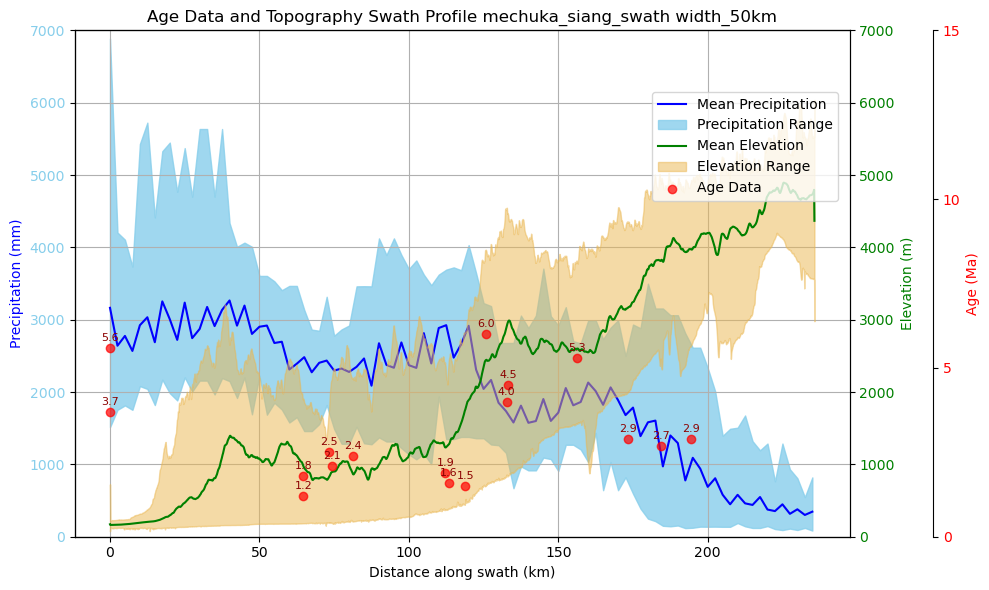

<Figure size 640x480 with 0 Axes>

In [60]:
fig, ax1 = plt.subplots(figsize=(10, 6))
fixed_Age_ymin = 0
fixed_Age_ymax = 15
fixed_precip_ymin = 0
fixed_precip_ymax = 7000
fixed_elevation_ymin = 0
fixed_elevation_ymax = 7000 
precip_color_mean = "blue"
precip_color_fill = "skyblue"
# Plot precipitation profile
ax1.plot(summary_precip["Bin_Center"], summary_precip["Mean_Precipitation"], color=precip_color_mean, label="Mean Precipitation")
ax1.fill_between(
    summary_precip["Bin_Center"],
    summary_precip["Min_Precipitation"],
    summary_precip["Max_Precipitation"],
    color=precip_color_fill,
    alpha=0.8,
    label="Precipitation Range"
)

# # Set fixed x-axis limits (convert to kilometers)
# fixed_xmin = 0
# fixed_xmax = 250000  # Assuming the maximum is in meters, you can adjust as needed
# ax1.set_xlim(fixed_xmin, fixed_xmax)

# Convert x-axis ticks to kilometers
ax1.set_xticks(range(fixed_xmin, fixed_xmax + 1, 50000))  # Ticks every 50 km (50,000 meters)
ax1.set_xticklabels([f"{x/1000:.0f}" for x in range(fixed_xmin, fixed_xmax + 50000, 50000)])  # Convert to kilometers

# Fixed y-axis for precipitation
fixed_precip_ymin = fixed_precip_ymin
fixed_precip_ymax = fixed_precip_ymax  # Adjust based on data range
ax1.set_ylim(fixed_precip_ymin, fixed_precip_ymax)
ax1.set_yticks(range(fixed_precip_ymin, fixed_precip_ymax + 500, 1000))  # Tick interval of 1000 mm
ax1.set_ylabel("Precipitation (mm)", color="blue")
ax1.tick_params(axis="y", labelcolor=precip_color_fill)

# Create a second y-axis for elevation data
ax2 = ax1.twinx()
ax2.plot(summary["Bin_Center"], summary["Mean_Elevation"], color="green", label="Mean Elevation")
ax2.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color="#eab64f",
    alpha=0.5,
    label="Elevation Range"
)

# Fixed y-axis for elevation
fixed_elevation_ymin = fixed_elevation_ymin
fixed_elevation_ymax = fixed_elevation_ymax  # Adjust as necessary
ax2.set_ylim(fixed_elevation_ymin, fixed_elevation_ymax)
ax2.set_yticks(range(fixed_elevation_ymin, fixed_elevation_ymax + 500, 1000))  # Tick interval of 500 m
ax2.set_ylabel("Elevation (m)", color="green")
ax2.tick_params(axis="y", labelcolor="green")

# Plot Age data on a third y-axis
ax3 = ax1.twinx()
ax3.spines["right"].set_position(("outward", 60))  # Offset third y-axis
sc = ax3.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
                 color="red", label="Age Data", alpha=0.7)

# Annotate Ages
for i, row in AFT_Ages_within_swath.iterrows():
    ax3.annotate(
        f"{row['Age']:.1f}",  # Format Age to 1 decimal place
        (row["Distance"], row["Age"]),
        textcoords="offset points",
        xytext=(0, 5),  # Offset position of text
        ha="center",
        fontsize=8,
        color="darkred"
    )

# Fixed y-axis for Age
fixed_Age_ymin = fixed_Age_ymin
fixed_Age_ymax = fixed_Age_ymax   # Adjust as necessary
ax3.set_ylim(fixed_Age_ymin, fixed_Age_ymax)
ax3.set_yticks(range(fixed_Age_ymin, fixed_Age_ymax + 5, 5))  # Tick interval of 10 Ma
ax3.set_ylabel("Age (Ma)", color="red")
ax3.tick_params(axis="y", labelcolor="red")

# Add title, grid, and legend
ax1.set_xlabel("Distance along swath (km)")
plt.title(f"Age Data and Topography Swath Profile {shape_file_name}_swath width_{round(swath_width_topo/1000)}km")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
plt.show()
plt.savefig(f'/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/swath_outpu_figures/{shape_file_name}_Age_precip_topo_swath_width{swath_width_topo}km')

In [ ]:

# Save the combined data to a CSV file
output_csv_path = "/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/output_swath_profile.csv"  # Replace with your desired path
swath_profile_df.to_csv(output_csv_path, index=False)

print(f"Swath profile data saved to {output_csv_path}")

In [19]:
import os
shape_file_name = os.path.splitext(os.path.basename(baseline))[0]
shape_file_name
output_csv_path = f"/home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_Age/{shape_file_name}_swath_Age_precip.csv"  # Replace with desired directory

# Save the combined data to the CSV file
swath_profile_df.to_csv(output_csv_path, index=False)

print(f"Swath profile data saved to {output_csv_path}")

Swath profile data saved to /home/prayoga/prayoga_work_2025/Mechuka/[2]_Data_Mechuka/[1]_swath_topography_precipitation_age/subanshiri_swath_middle_EPSG_47_swath_age_precip.csv


In [14]:
baseline

'/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/subanshiri_swath_middle_EPSG_47.shp'

In [19]:
summary["Mean_Elevation"]

Bin
0       2562.777778
10      2682.000000
14      2985.000000
30      2734.000000
34      2534.000000
           ...     
1821     176.000000
1825     173.000000
1838     129.000000
1841     141.000000
1846     192.375000
Name: Mean_Elevation, Length: 214, dtype: float64

In [17]:
Age_distances 

[36817.440051000754, 37983.82271061545, 122000.82088647541]

In [18]:
summary["Bin_Center"]

Bin
0            0
10        1000
14        1400
30        3000
34        3400
         ...  
1821    182100
1825    182500
1838    183800
1841    184100
1846    184600
Name: Bin_Center, Length: 214, dtype: int64

CRS of the shapefile: EPSG:32647
CRS of the DEM_SRTM30: EPSG:32647


Calculating distances and precipitation:   0%| | 0/229 [00:00<?/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/shapely/linear.py:88: RuntimeWarning: invalid value encountered in line_locate_point
  return lib.line_locate_point(line, other)
Calculating distances and precipitation: 100%|█| 229/229 [00:00


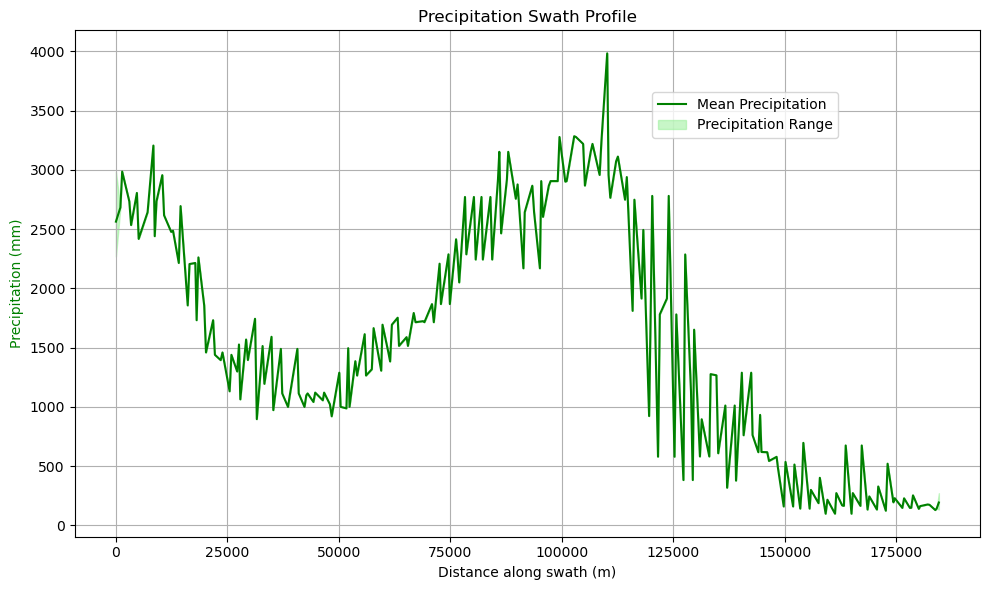

Precipitation values: 0      2635.0
1      2440.0
2      2682.0
3      2635.0
4      2985.0
        ...  
224     271.0
225     183.0
226     140.0
227     149.0
228     134.0
Name: Precipitation, Length: 229, dtype: float64
Precipitation distances: 0           0.000000
1           0.000000
2           0.000000
3           0.000000
4           0.000000
           ...      
224    184606.307309
225    184606.307309
226    184606.307309
227    184606.307309
228    184606.307309
Name: Distance, Length: 229, dtype: float64


In [13]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio
import geopandas as gpd
from shapely.geometry import LineString, Point
from rasterio.features import geometry_mask
import pandas as pd
from shapely.ops import nearest_points
from tqdm import tqdm

# File paths (replace with your actual file paths)
shape = 'subanshiri_swath_middle_EPSG_47.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/' + shape
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/DEM@PRAYOGA/' + DEM
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/' + DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")

# Load Precipitation Data (TRMM)
precip_path = raster_precip
with rasterio.open(precip_path) as precip:
    precip_data = precip.read(1)  # Precipitation data
    precip_transform = precip.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Define swath buffer
buffer_width = 10000  # Swath width in meters (10 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask precipitation data outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=precip_transform, invert=True, out_shape=precip_data.shape)
masked_precip = np.where(buffer_mask, precip_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(precip_transform, rows, cols)
zs = masked_precip[rows, cols]

# Convert coordinates to distances along the swath line
distances = []
for x, y, z in tqdm(zip(xs, ys, zs), desc="Calculating distances and precipitation", total=len(xs)):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))

# Create summary DataFrame for Precipitation
df_precip = pd.DataFrame(distances, columns=["Distance", "Precipitation"])
bin_width = 100  # Bin width in meters
df_precip["Bin"] = (df_precip["Distance"] // bin_width).astype(int)

# Aggregate precipitation statistics
precip_summary = df_precip.groupby("Bin").agg(
    Mean_Precipitation=("Precipitation", "mean"),
    Min_Precipitation=("Precipitation", "min"),
    Max_Precipitation=("Precipitation", "max")
)
precip_summary["Bin_Center"] = precip_summary.index * bin_width

# Plot precipitation swath profile
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot precipitation profile
ax1.plot(precip_summary["Bin_Center"], precip_summary["Mean_Precipitation"], color="green", label="Mean Precipitation")
ax1.fill_between(
    precip_summary["Bin_Center"],
    precip_summary["Min_Precipitation"],
    precip_summary["Max_Precipitation"],
    color="lightgreen",
    alpha=0.5,
    label="Precipitation Range"
)

# Add labels, legend, and title
ax1.set_xlabel("Distance along swath (m)")
ax1.set_ylabel("Precipitation (mm)", color="green")
plt.title("Precipitation Swath Profile")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
plt.show()

# Print output to verify
print(f"Precipitation values: {df_precip['Precipitation']}")
print(f'Precipitation distances: {df_precip["Distance"]}')


In [21]:
import numpy as np
import pandas as pd
import rasterio
import geopandas as gpd
from shapely.geometry import LineString, Point
from rasterio.features import geometry_mask
from shapely.ops import nearest_points
from tqdm import tqdm

# File paths (replace with your actual file paths)
shape = 'subanshiri_swath_middle_EPSG_47.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/' + shape
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/DEM@PRAYOGA/' + DEM
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/' + DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

# Load Precipitation Data (TRMM)
precip_path = raster_precip
with rasterio.open(precip_path) as precip:
    precip_data = precip.read(1)  # Precipitation data
    precip_transform = precip.transform

# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Define swath buffer
buffer_width = 10000  # Swath width in meters (10 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask precipitation data outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=precip_transform, invert=True, out_shape=precip_data.shape)
masked_precip = np.where(buffer_mask, precip_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(precip_transform, rows, cols)
zs = masked_precip[rows, cols]

# Convert coordinates to distances along the swath line
distances = []
for x, y, z in tqdm(zip(xs, ys, zs), desc="Calculating distances and precipitation", total=len(xs)):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))

# Create summary DataFrame for Precipitation
df_precip = pd.DataFrame(distances, columns=["Distance", "Precipitation"])
bin_width = 100  # Bin width in meters
df_precip["Bin"] = (df_precip["Distance"] // bin_width).astype(int)

# Aggregate precipitation statistics
precip_summary = df_precip.groupby("Bin").agg(
    Mean_Precipitation=("Precipitation", "mean"),
    Min_Precipitation=("Precipitation", "min"),
    Max_Precipitation=("Precipitation", "max")
)
precip_summary["Bin_Center"] = precip_summary.index * bin_width

# Create output column (e.g., ratio of mean precipitation to max precipitation)
precip_summary["Precipitation_Ratio"] = precip_summary["Mean_Precipitation"] / precip_summary["Max_Precipitation"]

# Save DataFrame to CSV
output_csv = "precipitation_swath_profile.csv"
precip_summary.to_csv(output_csv)

# Print confirmation and output file path
print(f"Output saved to {output_csv}")


Calculating distances and precipitation:   0%|     | 0/229 [00:00<?, ?it/s]/home/prayoga/miniconda3/envs/swath/lib/python3.10/site-packages/shapely/linear.py:88: RuntimeWarning: invalid value encountered in line_locate_point
  return lib.line_locate_point(line, other)
Calculating distances and precipitation: 100%|█| 229/229 [00:00<00:00, 3727

Output saved to precipitation_swath_profile.csv


KeyError: 'Precipitation_Ratio'

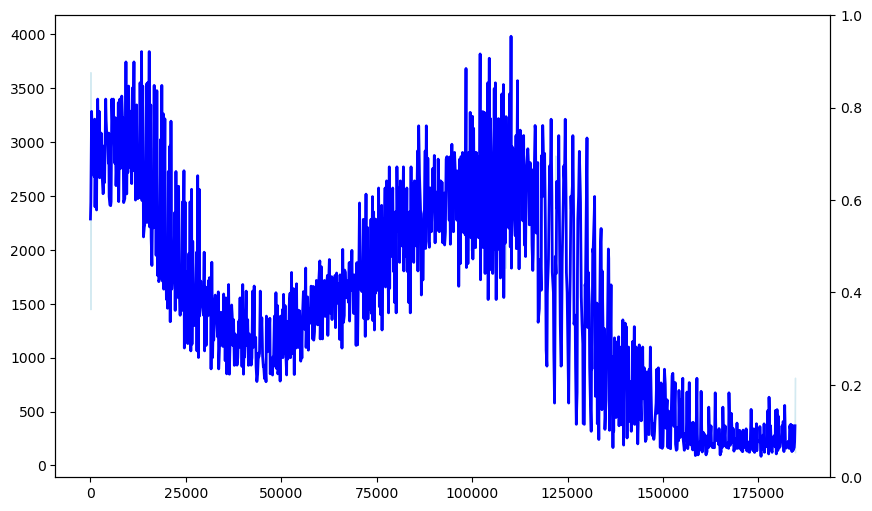

In [10]:
import matplotlib.pyplot as plt

# Plot Precipitation Swath Profile
fig, ax = plt.subplots(figsize=(10, 6))

# Plot mean precipitation
ax.plot(
    precip_summary["Bin_Center"],
    precip_summary["Mean_Precipitation"],
    label="Mean Precipitation",
    color="blue",
    linewidth=2,
)

# Fill area for precipitation range
ax.fill_between(
    precip_summary["Bin_Center"],
    precip_summary["Min_Precipitation"],
    precip_summary["Max_Precipitation"],
    color="lightblue",
    alpha=0.5,
    label="Precipitation Range",
)

# Plot ratio of mean to max precipitation on secondary axis
ax2 = ax.twinx()
ax2.plot(
    precip_summary["Bin_Center"],
    precip_summary["Precipitation_Ratio"],
    label="Precipitation Ratio",
    color="green",
    linestyle="--",
    linewidth=2,
)

# Labels and grid
ax.set_xlabel("Distance along swath (m)")
ax.set_ylabel("Precipitation (mm)", color="blue")
ax2.set_ylabel("Precipitation Ratio (Mean/Max)", color="green")

# Tick color alignment
ax.tick_params(axis="y", labelcolor="blue")
ax2.tick_params(axis="y", labelcolor="green")

# Title and legends
plt.title("Precipitation Swath Profile")
ax.legend(loc="upper left")
ax2.legend(loc="upper right")

# Grid and layout
ax.grid()
plt.tight_layout()

# Show plot
plt.show()


# Topography, Precipitation, Age data together

In [1]:
import numpy as np
import matAge_distances plotlib.pyplot as plt
import rasterio
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, LineString
from rasterio.plot import show

In [2]:
shape ='subanshiri_swath_middle_EPSG_47.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/DEM@PRAYOGA/'+DEM
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT
print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

CRS of the shapefile: EPSG:32647
CRS of the DEM_SRTM30: EPSG:32647
CRS of the Precipitation_TRMM: EPSG:32647


In [3]:
# 1. Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    dem_crs = dem.crs
    

In [4]:
# 2. Load TRMM (precipitation swath) data
trmm_path = raster_precip
with rasterio.open(trmm_path) as trmm:
    trmm_data = trmm.read(1)
    trmm_transform = trmm.transform
    trmm_crs = trmm.crs

In [5]:
# 3. Load Age data from CSV (Latitude, Longitude, Age)
Age_data_path = AFT_herman
Age_df = pd.read_csv(Age_data_path)

# Ensure that the Age data is in the same CRS as the DEM and TRMM data
# If necessary, convert it using GeoPandas
gdf_Age = gpd.GeoDataFrame(Age_df, 
                            geometry=gpd.points_from_xy(Age_df['Longitude'], Age_df['Latitude']),
                            crs="EPSG:4326")  # Assuming original CRS is WGS84 (lat/lon)

# If the CRS of the DEM and TRMM data is different, reproject the Age data
gdf_Age = gdf_Age.to_crs(dem_crs)
epsg_code = gdf_Age.crs.to_string()  # Or simply use gdf_Age.crs.epsg
print(f"EPSG code for Age Data: {epsg_code}")


EPSG code for Age Data: EPSG:32647


In [12]:
# 4. Load the line shapefile (swath path)
line_shapefile = baseline
line_gdf = gpd.read_file(line_shapefile)

# Make sure the line shapefile's CRS matches the DEM and TRMM data
line_gdf = line_gdf.to_crs(dem_crs)

epsg_code = line_gdf.crs.to_string()  # Or simply use gdf_Age.crs.epsg
print(f"EPSG code for Shape file: {epsg_code}")

# Assuming the shapefile contains only one line geometry
swath_line = line_gdf.geometry.iloc[0]

EPSG code for Shape file: EPSG:32647


In [8]:
# 5. Create a buffer around the line (e.g., 1 km buffer)
buffer_distance = 100  # Buffer distance in meters (e.g., 1 km)
buffer = swath_line.buffer(buffer_distance)

In [10]:
!pip install tqdm


In [11]:
from tqdm import tqdm
from shapely.geometry import Point

# Ensure `buffer`, `dem_transform`, `dem_data`, and `trmm_data` are defined
dem_values = []
trmm_values = []

# Create a mask for the buffer area
transform = dem_transform  # Use DEM's transformation for both
height, width = dem_data.shape  # Ensure height and width are correctly set

# Wrap the outer loop with tqdm for progress tracking
for i in tqdm(range(width), desc="Processing swath data"):
    for j in range(height):
        # Convert pixel coordinates to spatial coordinates
        x, y = transform * (i, j)

        # Check if the point is inside the buffer
        point = Point(x, y)
        if buffer.contains(point):
            dem_values.append(dem_data[j, i])
            trmm_values.append(trmm_data[j, i])  # Fixed variable from "I" to "i"

Processing swath data:  15%|█▏      | 4268/28295 [13:43<1:17:13,  5.18it/s]


IndexError: index 12924 is out of bounds for axis 0 with size 129

In [ ]:
# 7. Plotting everything together
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot DEM swath (topography)
ax1.plot(dem_values, label='Topographic Swath (DEM)', color='tab:blue', linewidth=2)
ax1.set_xlabel('Distance Along Swath (km)')
ax1.set_ylabel('Elevation (m)', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Plot TRMM swath (precipitation)
ax2 = ax1.twinx()  # Create a second y-axis to plot precipitation
ax2.plot(trmm_values, label='Precipitation Swath (TRMM)', color='tab:green', linewidth=2)
ax2.set_ylabel('Precipitation (mm)', color='tab:green')
ax2.tick_params(axis='y', labelcolor='tab:green')

# Plot Age data
ax1.scatter(gdf_Age['Longitude'], gdf_Age['Latitude'], c=gdf_Age['Age'], cmap='viridis', label='Age Data', s=50, marker='o', edgecolors='k', alpha=0.7)

# Title and labels
plt.title('Topographic Swath, Precipitation Swath, and Age Data with Buffer')
fig.tight_layout()  # Ensure everything fits without overlap

# Show the plot
plt.legend()
plt.show()

In [13]:
print(f"DEM data dimensions: {dem_data.shape}")
print(f"TRMM data dimensions: {trmm_data.shape}")


DEM data dimensions: (20489, 28295)
TRMM data dimensions: (129, 217)


In [ ]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling

# Resample TRMM to match DEM
with rasterio.open(raster_precip) as src:
    with rasterio.open(raster) as dem_src:
        dem_transform = dem_src.transform
        dem_crs = dem_src.crs
        dem_width = dem_src.width
        dem_height = dem_src.height

        # Calculate transform and dimensions
        transform, width, height = calculate_default_transform(
            src.crs, dem_crs, src.width, src.height, *src.bounds
        )
        profile = src.profile
        profile.update(transform=dem_transform, crs=dem_crs, width=dem_width, height=dem_height)

        # Save resampled TRMM
        with rasterio.open("TRMM_resampled.tiff", "w", **profile) as dst:
            reproject(
                source=rasterio.band(src, 1),
                destination=rasterio.band(dst, 1),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=dem_transform,
                dst_crs=dem_crs,
                resampling=Resampling.bilinear,
            )


In [15]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
from tqdm import tqdm

# Resample TRMM to match DEM
with rasterio.open(raster_precip) as src:
    with rasterio.open(raster) as dem_src:
        dem_transform = dem_src.transform
        dem_crs = dem_src.crs
        dem_width = dem_src.width
        dem_height = dem_src.height

        # Calculate transform and dimensions
        transform, width, height = calculate_default_transform(
            src.crs, dem_crs, src.width, src.height, *src.bounds
        )
        profile = src.profile
        profile.update(transform=dem_transform, crs=dem_crs, width=dem_width, height=dem_height)

        # Create an empty array for the destination
        destination = np.empty((height, width), dtype=profile["dtype"])

        # Save resampled TRMM
        with rasterio.open("TRMM_resampled.tiff", "w", **profile) as dst:
            # Use a progress bar with `tqdm`
            with tqdm(total=src.height, desc="Resampling TRMM") as pbar:
                reproject(
                    source=rasterio.band(src, 1),
                    destination=destination,
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=dem_transform,
                    dst_crs=dem_crs,
                    resampling=Resampling.bilinear,
                    init_dest_nodata=True,
                    # Update progress after each window
                    progress_callback=lambda _, window, __: pbar.update(window[0][1] - window[0][0]),
                )

                dst.write(destination, 1)


Resampling TRMM:   0%|                             | 0/129 [00:02<?, ?it/s]


In [ ]:
from tqdm import tqdm
from shapely.geometry import Point

# Load resampled TRMM data
with rasterio.open("TRMM_resampled.tiff") as trmm_resampled:
    trmm_data = trmm_resampled.read(1)
    transform = trmm_resampled.transform

# Process swath with buffer
dem_values = []
trmm_values = []

# Use tqdm for the outer loop to track progress
for i in tqdm(range(dem_data.shape[1]), desc="Processing swath data"):
    for j in range(dem_data.shape[0]):
        # Convert pixel coordinates to spatial coordinates
        x, y = transform * (i, j)
        point = Point(x, y)
        
        # Check if the point is inside the buffer
        if buffer.contains(point):
            dem_values.append(dem_data[j, i])
            trmm_values.append(trmm_data[j, i])  # Fixed typo from `I` to `i`



Processing swath data:  30%|██▍     | 8603/28295 [29:27<1:02:41,  5.24it/s]

In [ ]:
# 7. Plotting everything together
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot DEM swath (topography)
ax1.plot(dem_values, label='Topographic Swath (DEM)', color='tab:blue', linewidth=2)
ax1.set_xlabel('Distance Along Swath (km)')
ax1.set_ylabel('Elevation (m)', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Plot TRMM swath (precipitation)
ax2 = ax1.twinx()  # Create a second y-axis to plot precipitation
ax2.plot(trmm_values, label='Precipitation Swath (TRMM)', color='tab:green', linewidth=2)
ax2.set_ylabel('Precipitation (mm)', color='tab:green')
ax2.tick_params(axis='y', labelcolor='tab:green')

# Plot Age data
ax1.scatter(gdf_Age['Longitude'], gdf_Age['Latitude'], c=gdf_Age['Age'], cmap='viridis', label='Age Data', s=50, marker='o', edgecolors='k', alpha=0.7)

# Title and labels
plt.title('Topographic Swath, Precipitation Swath, and Age Data with Buffer')
fig.tight_layout()  # Ensure everything fits without overlap

# Show the plot
plt.legend()
plt.show()

In [ ]:
# Test 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Point
from tqdm import tqdm
import geopandas as gpd
import rasterio

In [2]:
shape ='subanshiri_swath_middle_EPSG_47.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
DEM_precip = 'eastern_Arunachal_Himalaya_TRMM_proj_EPSG_47.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/DEM@PRAYOGA/'+DEM
raster_precip = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT
print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

CRS of the shapefile: EPSG:32647
CRS of the DEM_SRTM30: EPSG:32647
CRS of the Precipitation_TRMM: EPSG:32647


In [3]:
# 1. Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    dem_crs = dem.crs

In [4]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
from tqdm import tqdm

# Define your raster file paths

# Resample TRMM to match DEM
with rasterio.open(raster_precip) as src:
    with rasterio.open(raster) as dem_src:
        dem_transform = dem_src.transform
        dem_crs = dem_src.crs
        dem_width = dem_src.width
        dem_height = dem_src.height

        # Calculate transform and dimensions for resampling
        transform, width, height = calculate_default_transform(
            src.crs, dem_crs, src.width, src.height, *src.bounds
        )
        
        # Update profile for output file
        profile = src.profile
        profile.update(transform=dem_transform, crs=dem_crs, width=dem_width, height=dem_height)

        # Save resampled TRMM
        with rasterio.open("TRMM_resampled.tiff", "w", **profile) as dst:
            # Initialize tqdm with total lines to process (height of the DEM)
            with tqdm(total=height, desc="Resampling TRMM") as pbar:
                # Loop through each line of the raster
                for i in range(height):
                    # Reproject each line one at a time
                    reproject(
                        source=rasterio.band(src, 1),
                        destination=rasterio.band(dst, 1),
                        src_transform=src.transform,
                        src_crs=src.crs,
                        dst_transform=dem_transform,
                        dst_crs=dem_crs,
                        resampling=Resampling.bilinear,
                        src_nodata=src.nodata,
                        dst_nodata=dst.nodata,
                        offset=(0, i),  # Process one line at a time
                        size=(dem_width, 1),  # Each line has the same width as the DEM
                    )
                    pbar.update(1)  # Update the tqdm progress bar after each line is processed


Resampling TRMM: 100%|███████| 131/131 [22:08<00:00, 10.14s/it]


In [5]:
with rasterio.open("TRMM_resampled.tiff") as trmm_src:
    trmm_data = trmm_src.read(1)
    trmm_transform = trmm_src.transform

In [6]:
# Load Age data
Age_data_path = AFT_herman # Replace with your actual CSV file path
Age_df = pd.read_csv(Age_data_path)
gdf_Age = gpd.GeoDataFrame(
    Age_df, 
    geometry=gpd.points_from_xy(Age_df['Longitude'], Age_df['Latitude']),
    crs="EPSG:4326"  # Assuming WGS84 for Latitude/Longitude
)

# Reproject Age data to match DEM/TRMM CRS
dem_crs = dem_src.crs
gdf_Age = gdf_Age.to_crs(dem_crs)

In [7]:
# Define swath buffer (replace `line_shape` with your actual line shapefile)
line_shape = gpd.read_file(baseline)  # Replace with your actual shapefile path
line_shape = line_shape.to_crs(dem_crs)
swath_buffer = line_shape.buffer(1000)  # Adjust buffer size as needed

# Create a mask for DEM and TRMM data within the swath buffer
buffer_mask = np.zeros_like(dem_data, dtype=bool)

# Process mask using tqdm
height, width = dem_data.shape
for j in tqdm(range(height), desc="Processing swath mask"):
    for i in range(width):
        x, y = dem_transform * (i, j)
        point = Point(x, y)
        buffer_mask[j, i] = swath_buffer.contains(point).any()

# Mask DEM and TRMM data
masked_dem = np.where(buffer_mask, dem_data, np.nan)
masked_trmm = np.where(buffer_mask, trmm_data, np.nan)

Processing swath mask: 100%|█| 20489/20489 [6:24:14<00:00,  1.1


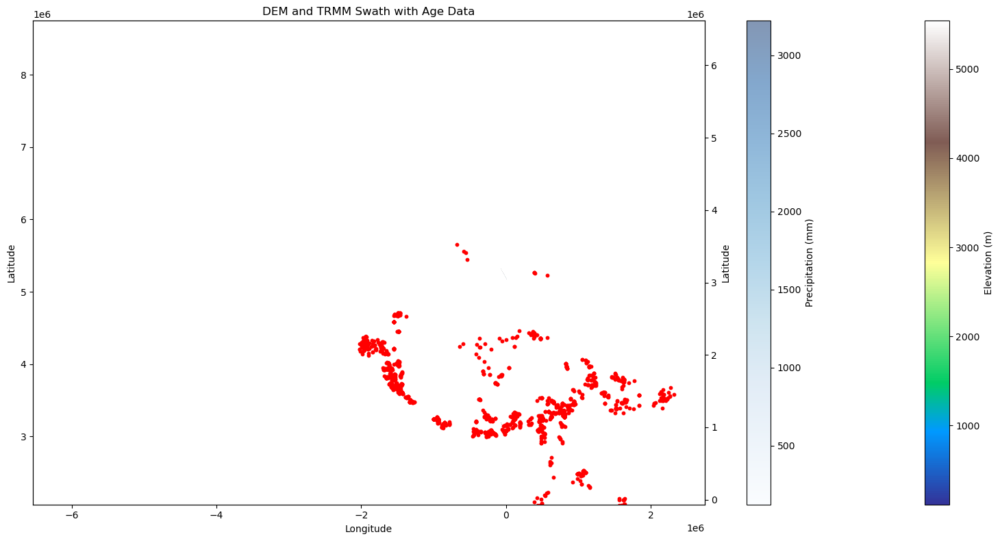

In [9]:
# Plotting using twin axes
fig, ax1 = plt.subplots(figsize=(16, 8))
# Plot the DEM on the first axis
ax1.set_title("DEM and TRMM Swath with Age Data")
cax1 = ax1.imshow(masked_dem, cmap="terrain", extent=[
    dem_transform[2],  # xmin
    dem_transform[2] + dem_transform[0] * dem_data.shape[1],  # xmax
    dem_transform[5] + dem_transform[4] * dem_data.shape[0],  # ymin
    dem_transform[5]  # ymax
])
ax1.set_xlabel("Longitude")
ax1.set_ylabel("Latitude")
fig.colorbar(cax1, ax=ax1, label="Elevation (m)")

# Create a second axis for the TRMM data
ax2 = ax1.twinx()
cax2 = ax2.imshow(masked_trmm, cmap="Blues", alpha=0.5, extent=[
    trmm_transform[2],  # xmin
    trmm_transform[2] + trmm_transform[0] * trmm_data.shape[1],  # xmax
    trmm_transform[5] + trmm_transform[4] * trmm_data.shape[0],  # ymin
    trmm_transform[5]  # ymax
])
ax2.set_ylabel("Latitude")  # Shared y-axis
fig.colorbar(cax2, ax=ax2, label="Precipitation (mm)")

# Plot the Age data points on the DEM and TRMM swath
for _, row in gdf_Age.iterrows():
    ax1.scatter(row.geometry.x, row.geometry.y, c="red", label=f"Age: {row.Age:.1f} Ma", s=10)

# Adjust layout
fig.tight_layout()
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString
from shapely.ops import nearest_points
from tqdm import tqdm
import geopandas as gpd
import rasterio
from rasterio.warp import reproject, Resampling

# Load DEM data
with rasterio.open(raster) as dem_src:
    dem_data = dem_src.read(1)
    dem_transform = dem_src.transform
    dem_crs = dem_src.crs
    dem_meta = dem_src.meta

# Load TRMM data
with rasterio.open(raster_precip) as trmm_src:
    trmm_data = trmm_src.read(1)
    trmm_transform = trmm_src.transform
    trmm_crs = trmm_src.crs

# Align TRMM to DEM grid
aligned_trmm = np.empty_like(dem_data)
reproject(
    source=trmm_data,
    destination=aligned_trmm,
    src_transform=trmm_transform,
    src_crs=trmm_crs,
    dst_transform=dem_transform,
    dst_crs=dem_crs,
    resampling=Resampling.bilinear
)

# Load Age data
Age_data_path = AFT_herman  # Replace with your actual CSV file path
Age_df = pd.read_csv(Age_data_path)
gdf_Age = gpd.GeoDataFrame(
    Age_df, 
    geometry=gpd.points_from_xy(Age_df['Longitude'], Age_df['Latitude']),
    crs="EPSG:4326"  # Assuming WGS84 for Latitude/Longitude
)

# Reproject Age data to match DEM/TRMM CRS
gdf_Age = gdf_Age.to_crs(dem_crs)

# Define swath line and buffer
line_shape = gpd.read_file(baseline)  # Replace with your actual shapefile path
line_shape = line_shape.to_crs(dem_crs)
swath_line = line_shape.geometry[0]  # Assuming a single swath line
swath_buffer = swath_line.buffer(1000)  # Adjust buffer size as needed

# Extract distances and values for DEM and aligned TRMM data
height, width = dem_data.shape
distances = []
elevations = []
precipitations = []

for j in tqdm(range(height), desc="Processing DEM and TRMM data"):
    for i in range(width):
        x, y = dem_transform * (i, j)
        point = Point(x, y)
        if swath_buffer.contains(point):
            # Compute distance along the swath line
            nearest_point = nearest_points(swath_line, point)[0]
            distance = swath_line.project(nearest_point)

            distances.append(distance)
            elevations.append(dem_data[j, i])
            precipitations.append(aligned_trmm[j, i])

# Create DataFrame for DEM and TRMM values along the swath
df = pd.DataFrame({
    "Distance": distances,
    "Elevation": elevations,
    "Precipitation": precipitations
})

# Process Age data within the swath buffer
Age_distances = []
Age_values = []

for _, row in gdf_Age.iterrows():
    if swath_buffer.contains(row.geometry):
        # Compute distance along the swath line
        nearest_point = nearest_points(swath_line, row.geometry)[0]
        distance = swath_line.project(nearest_point)

        Age_distances.append(distance)
        Age_values.append(row["Age"])  # Assuming "Age" column contains Age data

# Add Age data to the DataFrame
Age_df = pd.DataFrame({
    "Distance": Age_distances,
    "Age": Age_values
})

# Merge Age data into the main DataFrame
df = pd.merge_asof(
    df.sort_values("Distance"), 
    Age_df.sort_values("Distance"), 
    on="Distance", 
    direction="nearest"
)

# Plotting the swath profile
fig, ax1 = plt.subplots(figsize=(12, 6))

# Elevation and Precipitation on the first y-axis
ax1.plot(df["Distance"], df["Elevation"], color="brown", label="Elevation (m)")
ax1.set_ylabel("Elevation (m)", color="brown")
ax1.tick_params(axis="y", labelcolor="brown")
ax1.set_xlabel("Distance along swath (m)")

ax1.plot(df["Distance"], df["Precipitation"], color="blue", label="Precipitation (mm)")
ax1.tick_params(axis="y", labelcolor="blue")

# Age data on a secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(df["Distance"], df["Age"], color="red", label="Age (Ma)", alpha=0.7)
ax2.set_ylabel("Age (Ma)", color="red")
ax2.tick_params(axis="y", labelcolor="red")

# Add legend and grid
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))
ax1.grid()
plt.title("Swath Profile: Elevation, Precipitation, and Age")
plt.tight_layout()
plt.show()


Processing DEM and TRMM data:  12%| | 2383/20489 [10:11<1:21:18

In [ ]:
# 6. Extract swath data from DEM and TRMM within the buffer
# You would need to implement a proper swath extraction logic here, possibly using the rasterio `sample` method

# Example: Extract DEM and TRMM values within the buffer region
dem_values = []
trmm_values = []

# Create a mask for the buffer area
transform = dem_transform  # Use DEM's transformation for both
width, height = dem_data.shape

for i in range(width):
    for j in range(height):
        # Convert pixel coordinates to spatial coordinates
        x, y = transform * (i, j)
        
        # Check if the point is inside the buffer
        point = Point(x, y)
        if buffer.contains(point):
            dem_values.append(dem_data[j, i])
            trmm_values.append(trmm_data[j, i])

In [18]:
import re
match = re.search(r'EPSG"(\d+)"', gdf_Age.crs)
if match:
    epsg_code = match.group(1)
    print(f"EPSG code: {epsg_code}")

TypeError: expected string or bytes-like object

In [19]:
epsg_code = gdf_Age.crs.to_string()  # Or simply use gdf_Age.crs.epsg
print(f"EPSG code: {epsg_code}")

EPSG code: EPSG:32647


In [ ]:
# Mechuka Siang

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd

# shape= 'swath_subanshiri_middle_proj.shp'
shape ='mechuka_siang.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
DEM_precip = 'trmm_anual_mm_yr_wg84.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/DEM@PRAYOGA/'+DEM
# raster_precip = '/home/prayoga/prayoga_work_2025/TRMM/TRMM_Proj/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
# print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

# Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Or define swath line manually 
# swath_coords = [(x1, y1), (x2, y2)]  # Replace with real coordinates x1 Longitude, y1 Latitude
# swath_line = LineString(swath_coords)

# (95.37871211904822, 28.095067581911987),  # Start (Longitude, Latitude)
#                (93.20151833453788, 29.005375617560578)

# Define width of swath line
buffer_width = 100000  # Swath width in meters (e.g., 100 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in zip(xs, ys, zs):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Elevation"])
bin_width = 100  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary = df.groupby("Bin").agg(
    Mean_Elevation=("Elevation", "mean"),
    Min_Elevation=("Elevation", "min"),
    Max_Elevation=("Elevation", "max")
)
summary["Bin_Center"] = summary.index * bin_width

#---------------------------------------------------------------------
# Load Age data (CSV with columns: Latitude, Longitude, Age)
Age_data = pd.read_csv(AFT_herman)

# Convert to GeoDataFrame
from shapely.geometry import Point

geometry = [Point(xy) for xy in zip(Age_data["Longitude"], Age_data["Latitude"])]
Age_gdf = gpd.GeoDataFrame(Age_data, geometry=geometry, crs="EPSG:4326")

# Reproject Age data to match DEM CRS
Age_gdf = Age_gdf.to_crs(dem.crs)
# Age_gdf
# print(f"CRS of the Precipitation_TRMM: {Age_gdf.crs}")
#------------------------------------------------------------------------
# 
buffer_width = 10000  # 10 km buffer
swath_buffer = swath_line.buffer(buffer_width)

# Filter Age data points within the swath buffer
AFT_Ages_within_swath = Age_gdf[Age_gdf.geometry.within(swath_buffer)]

# Project points to swath distances
from shapely.ops import nearest_points

Age_distances = []
for point in AFT_Ages_within_swath.geometry:
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    Age_distances.append(distance)

AFT_Ages_within_swath["Distance"] = Age_distances
#-----------------------------------------------------------------------
# plot swath profile
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot topography profile
# ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
# ax1.set_ylabel("Elevation (m)", color="brown")
# ax1.tick_params(axis="y", labelcolor="brown")
ax1.plot(summary["Bin_Center"], summary["Mean_Elevation"], color="blue", label="Mean Elevation")
ax1.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color="lightblue",
    alpha=0.5,
    label="Elevation Range"
)

#-------------------------------------------------------------------------------------
# Plot the Swath Profile
# Plot Age data on secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
            color="blue", label="Age Data", alpha=0.7)
ax2.set_ylabel("Age (Ma)", color="blue")
ax2.tick_params(axis="y", labelcolor="blue")

# Add labels, legend, and title
ax1.set_xlabel("Distance along swath (m)")
plt.title("Mechuka Siang Age Data and Topography Swath Profile")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
plt.show()


CRS of the shapefile: PROJCS["unknown",GEOGCS["GCS_unknown",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",99],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]
CRS of the DEM_SRTM30: EPSG:32647


In [5]:
print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

CRS of the shapefile: PROJCS["unknown",GEOGCS["unknown",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",99],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]
CRS of the DEM_SRTM30: EPSG:32647
CRS of the Precipitation_TRMM: EPSG:4326


In [5]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd

In [8]:

shape= 'swath_subanshiri_middle_proj.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
DEM_precip = 'trmm_anual_mm_yr_wg84.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
raster = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/DEM@PRAYOGA/'+DEM
raster_precip = '/home/prayoga/prayoga_work_2025/TRMM/TRMM_Proj/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga_work_2025/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
# print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

CRS of the shapefile: PROJCS["unknown",GEOGCS["GCS_unknown",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",99],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]
CRS of the DEM_SRTM30: EPSG:32647


In [19]:
print(f"File path: {baseline}")
# print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")

File path: /home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/swath_subanshiri_middle_proj.shp


In [4]:
import geopandas
# %%bash
print(geopandas.__version__)

0.14.3


In [3]:
shape= 'swath_subanshiri_middle_proj.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
DEM_precip = 'trmm_anual_mm_yr_wg84.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga_work_2025/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025'+shape


# Topography swath with Age in one code file- MECHUKA-SIANG

CRS of the shapefile: EPSG:32646
CRS of the DEM_SRTM30: EPSG:32647
CRS of the Precipitation_TRMM: EPSG:4326


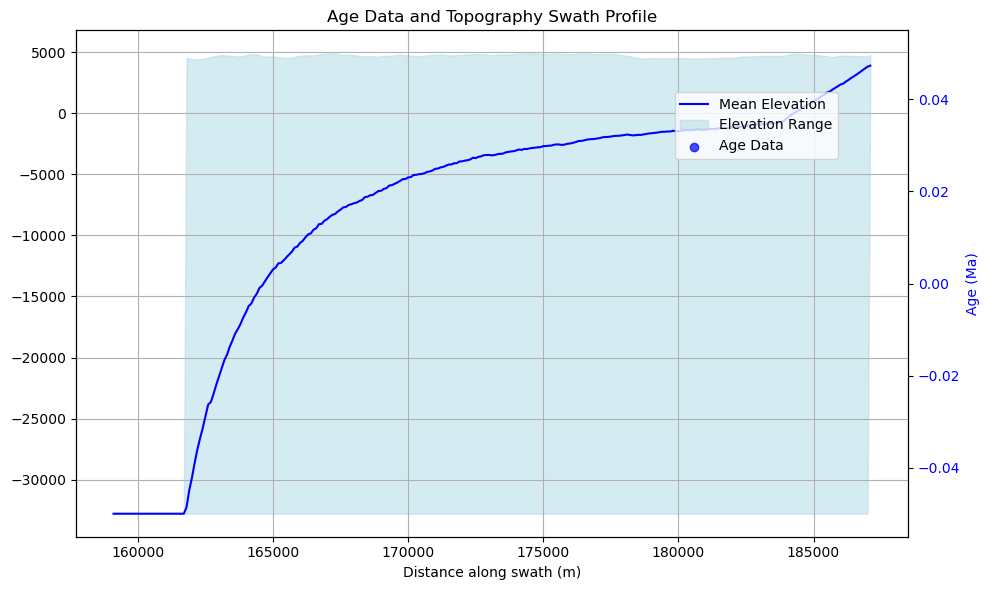

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd



shape= 'mechuka_HFT_swath.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
DEM_precip = 'trmm_anual_mm_yr_wg84.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
raster = '/home/prayoga/prayoga/QGIS_prayoga/DEM@PRAYOGA/'+DEM
raster_precip = '/home/prayoga/prayoga/TRMM/TRMM_Proj/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

# Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform
    
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

# Or define swath line manually 
# swath_coords = [(x1, y1), (x2, y2)]  # Replace with real coordinates x1 Longitude, y1 Latitude
# swath_line = LineString(swath_coords)

# (95.37871211904822, 28.095067581911987),  # Start (Longitude, Latitude)
#                (93.20151833453788, 29.005375617560578)

# Define width of swath line
buffer_width = 10000  # Swath width in meters (e.g., 5 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in zip(xs, ys, zs):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Elevation"])
bin_width = 100  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary = df.groupby("Bin").agg(
    Mean_Elevation=("Elevation", "mean"),
    Min_Elevation=("Elevation", "min"),
    Max_Elevation=("Elevation", "max")
)
summary["Bin_Center"] = summary.index * bin_width

#---------------------------------------------------------------------
# Load Age data (CSV with columns: Latitude, Longitude, Age)
Age_data = pd.read_csv(AFT_herman)

# Convert to GeoDataFrame
from shapely.geometry import Point

geometry = [Point(xy) for xy in zip(Age_data["Longitude"], Age_data["Latitude"])]
Age_gdf = gpd.GeoDataFrame(Age_data, geometry=geometry, crs="EPSG:4326")

# Reproject Age data to match DEM CRS
Age_gdf = Age_gdf.to_crs(dem.crs)
# Age_gdf
# print(f"CRS of the Precipitation_TRMM: {Age_gdf.crs}")
#------------------------------------------------------------------------
# 
buffer_width = 10000  # 10 km buffer
swath_buffer = swath_line.buffer(buffer_width)

# Filter Age data points within the swath buffer
AFT_Ages_within_swath = Age_gdf[Age_gdf.geometry.within(swath_buffer)]

# Project points to swath distances
from shapely.ops import nearest_points

Age_distances = []
for point in AFT_Ages_within_swath.geometry:
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    Age_distances.append(distance)

AFT_Ages_within_swath["Distance"] = Age_distances
#-----------------------------------------------------------------------
# plot swath profile
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot topography profile
# ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
# ax1.set_ylabel("Elevation (m)", color="brown")
# ax1.tick_params(axis="y", labelcolor="brown")
ax1.plot(summary["Bin_Center"], summary["Mean_Elevation"], color="blue", label="Mean Elevation")
ax1.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color="lightblue",
    alpha=0.5,
    label="Elevation Range"
)
# ax1.set_ylim(0,5000)

#-------------------------------------------------------------------------------------
# Plot the Swath Profile
# Plot Age data on secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
            color="blue", label="Age Data", alpha=0.7)
ax2.set_ylabel("Age (Ma)", color="blue")
ax2.tick_params(axis="y", labelcolor="blue")

# Add labels, legend, and title
ax1.set_xlabel("Distance along swath (m)")
plt.title("Age Data and Topography Swath Profile")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
plt.show()


# Only Topographic swath profile

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from osgeo import gdal




In [4]:
shape= 'swath_subanshiri_middle_proj.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
DEM_precip = 'trmm_anual_mm_yr_wg84.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
raster = '/home/prayoga/prayoga/QGIS_prayoga/DEM@PRAYOGA/'+DEM
raster_precip = '/home/prayoga/prayoga/TRMM/TRMM_Proj/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

CRS of the shapefile: PROJCS["unknown",GEOGCS["unknown",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",99],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]
CRS of the DEM_SRTM30: EPSG:32647
CRS of the Precipitation_TRMM: EPSG:4326


In [6]:

%%bash
raster_precip="${raster_precip}"
gdal_translate -projwin 91.53193913332123 26.256483654467146 95.6222889874443 31.005142674147375, $raster_precip clipped.tif



FAILURE: No target dataset specified.


Usage: gdal_translate [--help-general] [--long-usage]
       [-ot {Byte/Int8/Int16/UInt16/UInt32/Int32/UInt64/Int64/Float32/Float64/
             CInt16/CInt32/CFloat32/CFloat64}] [-strict]
       [-if format]* [-of format]
       [-b band] [-mask band] [-expand {gray|rgb|rgba}]
       [-outsize xsize[%]|0 ysize[%]|0] [-tr xres yres]
       [-ovr level|AUTO|AUTO-n|NONE]
       [-r {nearest,bilinear,cubic,cubicspline,lanczos,average,mode}]
       [-unscale] [-scale[_bn] [src_min src_max [dst_min dst_max]]]* [-exponent[_bn] exp_val]*
       [-srcwin xoff yoff xsize ysize] [-epo] [-eco]
       [-projwin ulx uly lrx lry] [-projwin_srs srs_def]
       [-a_srs srs_def] [-a_coord_epoch epoch]
       [-a_ullr ulx uly lrx lry] [-a_nodata value]
       [-a_scale value] [-a_offset value]
       [-nogcp] [-gcp pixel line easting northing [elevation]]*
       |-colorinterp{_bn} {red|green|blue|alpha|gray|undefined}]
       |-colorinterp {red|green|blue|alpha|gray|undefined},...]
       [-mo "META-T

CalledProcessError: Command 'b'raster_precip="${raster_precip}"\ngdal_translate -projwin 91.53193913332123 26.256483654467146 95.6222889874443 31.005142674147375, $raster_precip clipped.tif\n'' returned non-zero exit status 1.

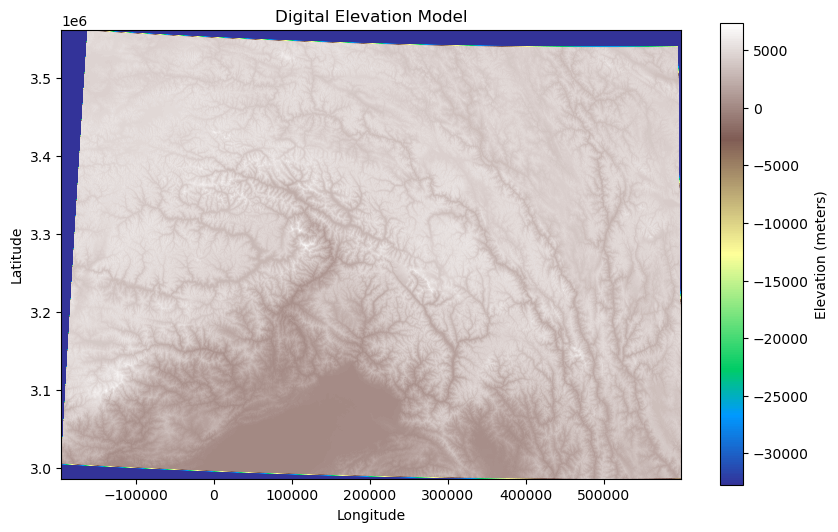

In [5]:
import rasterio
import matplotlib.pyplot as plt

# Load DEM
dem_path = raster
with rasterio.open(dem_path) as src:
    dem = src.read(1)  # Read the first band
    extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]

# Display DEM
plt.figure(figsize=(10, 6))
plt.imshow(dem, extent=extent, cmap='terrain')
plt.colorbar(label="Elevation (meters)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Digital Elevation Model")
plt.show()


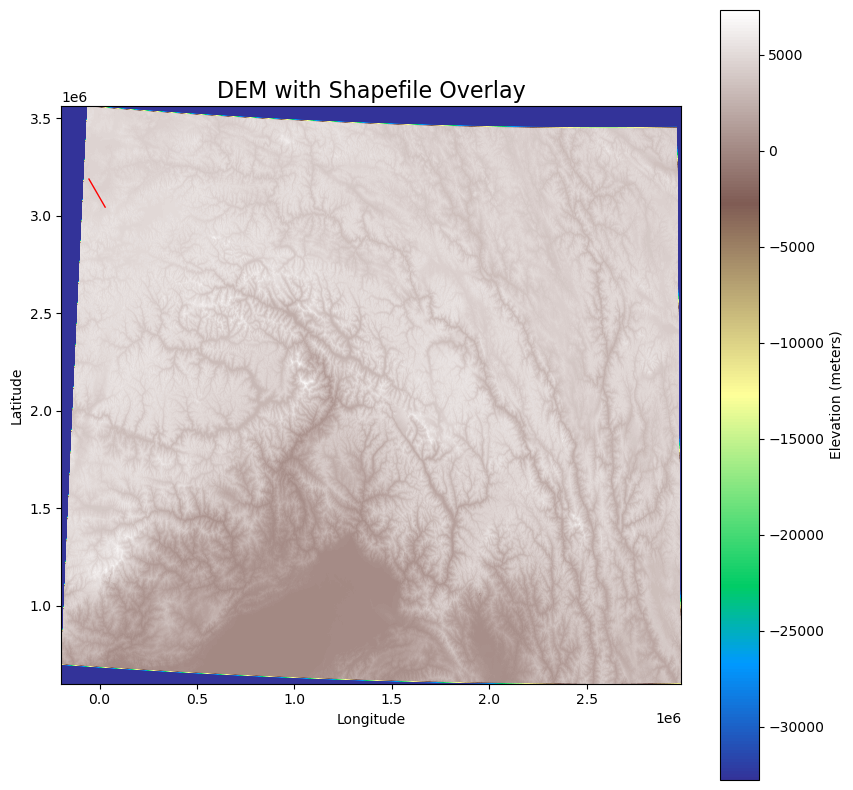

In [6]:
import rasterio
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from rasterio.plot import show
from matplotlib import colors

# Path to your DEM and shapefile
dem_path = raster
shapefile_path = baseline

# Read the DEM data using Rasterio
with rasterio.open(dem_path) as dem_src:
    dem = dem_src.read(1)  # Read the first band (DEM data)
    dem_extent = dem_src.bounds  # Get DEM bounds for plotting

# Read the shapefile data using Geopandas
shapefile = gpd.read_file(shapefile_path)

# Plot the DEM using Matplotlib
fig, ax = plt.subplots(figsize=(10, 10))

# Display DEM as an imAge
cmap = plt.cm.terrain  # Choose a color map (e.g., terrain, viridis, etc.)
show(dem, ax=ax, cmap=cmap, extent=dem_extent)

# Optionally, add shapefiles (e.g., boundaries, contours) on top of DEM
shapefile.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=1)

# Customize the plot
ax.set_title("DEM with Shapefile Overlay", fontsize=16)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.colorbar(ax.imAges[0], ax=ax, label='Elevation (meters)')

# Show the plot
plt.show()


In [18]:
# Check the Coordinate Reference System (CRS)
print(f"CRS of the shapefile: {shapefile.crs}")
print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")

CRS of the shapefile: epsg:32647
CRS of the DEM_SRTM30: EPSG:32647
CRS of the Precipitation_TRMM: EPSG:4326


In [9]:
dem_path = raster_precip
shapefile_path = baseline
# Open the DEM file using Rasterio
with rasterio.open(dem_path) as dem_src:
    # Get the Coordinate Reference System (CRS)
    crs = dem_src.crs
    print(f"CRS of the DEM: {crs}")
    
    # Get the bounds (coordinates of the corners of the DEM)
    bounds = dem_src.bounds
    print(f"Bounds of the DEM: {bounds}")
    # bounds = (left, bottom, right, top)
    
    # If you want to know the spatial resolution (pixel size)
    resolution = dem_src.res
    print(f"Spatial Resolution (Pixel Size): {resolution}")

CRS of the DEM: EPSG:4326
Bounds of the DEM: BoundingBox(left=-180.0, bottom=-36.0, right=180.0, top=36.0)
Spatial Resolution (Pixel Size): (0.04, 0.04)


### Load DEM

In [30]:
# Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform

### Define swath line using shape file

In [33]:
# Define swath line using shape file
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

### Or define line manually (not recomended)

### Define width of swath line

In [34]:
# Define width of swath line
buffer_width = 10000  # Swath width in meters (e.g., 5 km)
swath_buffer = swath_line.buffer(buffer_width)

### Extract elevation values from the DEM within the swath width

In [35]:
# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in zip(xs, ys, zs):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


### To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:

In [36]:

# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Elevation"])
bin_width = 100  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary = df.groupby("Bin").agg(
    Mean_Elevation=("Elevation", "mean"),
    Min_Elevation=("Elevation", "min"),
    Max_Elevation=("Elevation", "max")
)
summary["Bin_Center"] = summary.index * bin_width


### Plot the Swath Profile

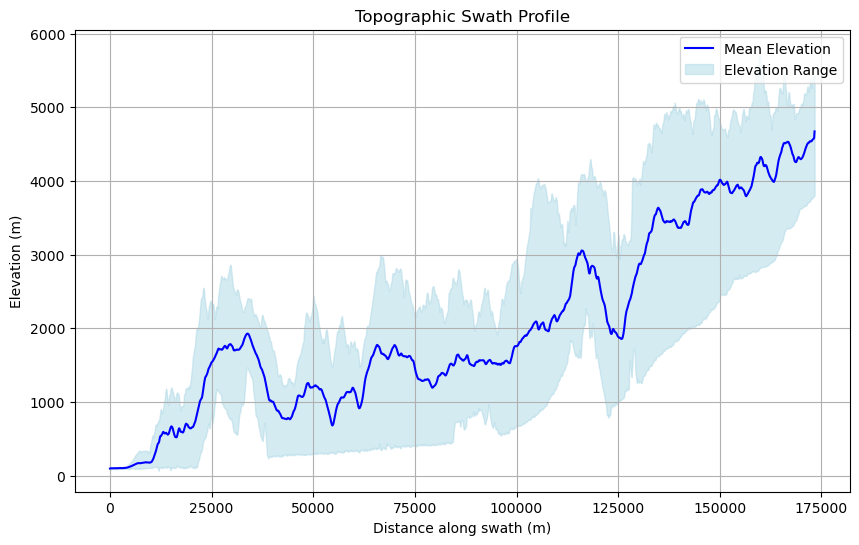

In [37]:
import matplotlib.pyplot as plt
# Plot the Swath Profile
plt.figure(figsize=(10, 6))
plt.plot(summary["Bin_Center"], summary["Mean_Elevation"], color="blue", label="Mean Elevation")
plt.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color="lightblue",
    alpha=0.5,
    label="Elevation Range"
)
plt.xlabel("Distance along swath (m)")
plt.ylabel("Elevation (m)")
plt.title("Topographic Swath Profile")
plt.legend()
plt.grid()
plt.show()


In [ ]:
# Load Age data (CSV with columns: Latitude, Longitude, Age)
Age_data = pd.read_csv(AFT_herman)

# Convert to GeoDataFrame
from shapely.geometry import Point

geometry = [Point(xy) for xy in zip(Age_data["Longitude"], Age_data["Latitude"])]
Age_gdf = gpd.GeoDataFrame(Age_data, geometry=geometry, crs="EPSG:4326")

# Reproject Age data to match DEM CRS
Age_gdf = Age_gdf.to_crs(dem.crs)
Age_gdf
print(f"CRS of the Precipitation_TRMM: {Age_gdf.crs}")

In [40]:
buffer_width = 10000  # 10 km buffer
swath_buffer = swath_line.buffer(buffer_width)

# Filter Age data points within the swath buffer
AFT_Ages_within_swath = Age_gdf[Age_gdf.geometry.within(swath_buffer)]

# Project points to swath distances
from shapely.ops import nearest_points

Age_distances = []
for point in AFT_Ages_within_swath.geometry:
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    Age_distances.append(distance)

AFT_Ages_within_swath["Distance"] = Age_distances

/home/prayoga/anaconda3/envs/pcraster/lib/python3.11/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


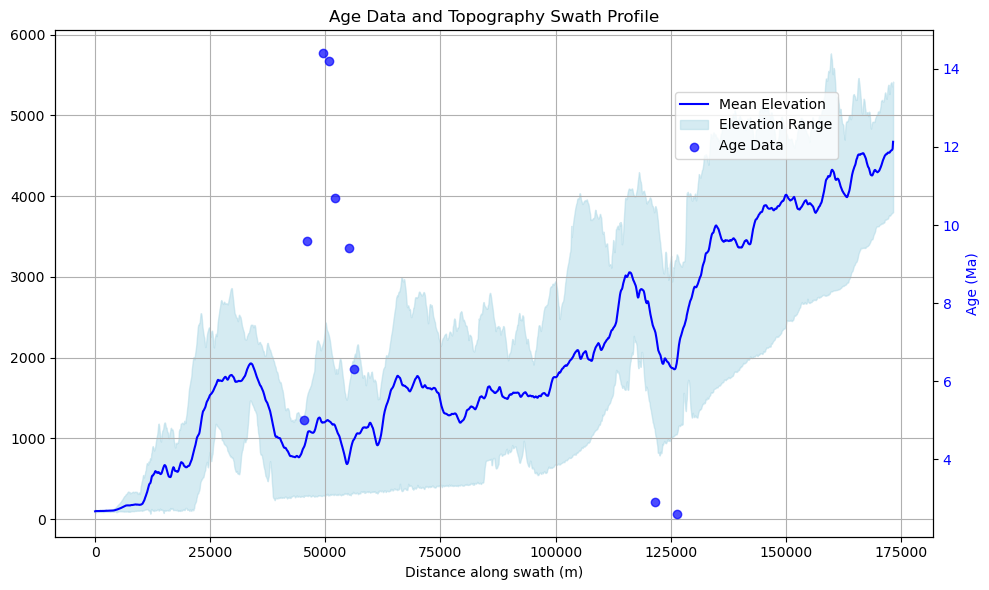

In [42]:
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot topography profile
# ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
# ax1.set_ylabel("Elevation (m)", color="brown")
# ax1.tick_params(axis="y", labelcolor="brown")
ax1.plot(summary["Bin_Center"], summary["Mean_Elevation"], color="blue", label="Mean Elevation")
ax1.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color="lightblue",
    alpha=0.5,
    label="Elevation Range"
)


# Plot Age data on secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
            color="blue", label="Age Data", alpha=0.7)
ax2.set_ylabel("Age (Ma)", color="blue")
ax2.tick_params(axis="y", labelcolor="blue")

# Add labels, legend, and title
ax1.set_xlabel("Distance along swath (m)")
plt.title("Age Data and Topography Swath Profile")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
plt.show()

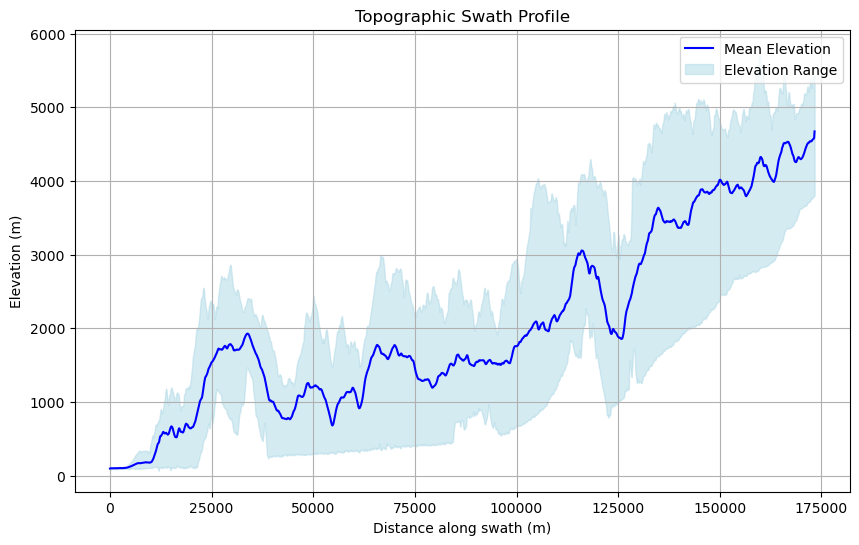

In [38]:
import matplotlib.pyplot as plt
# Plot the Swath Profile
plt.figure(figsize=(10, 6))
plt.plot(summary["Bin_Center"], summary["Mean_Elevation"], color="blue", label="Mean Elevation")
plt.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color="lightblue",
    alpha=0.5,
    label="Elevation Range"
)
plt.xlabel("Distance along swath (m)")
plt.ylabel("Elevation (m)")
plt.title("Topographic Swath Profile")
plt.legend()
plt.grid()
plt.show()


# Save the Results

In [12]:
pwd

'/home/prayoga/prayoga/jupyter-my'

In [13]:
summary.to_csv("swath_profile.csv", index=False)
plt.savefig("swath_profile.png", dpi=300)

<Figure size 640x480 with 0 Axes>

/home/prayoga/anaconda3/envs/pcraster/lib/python3.11/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


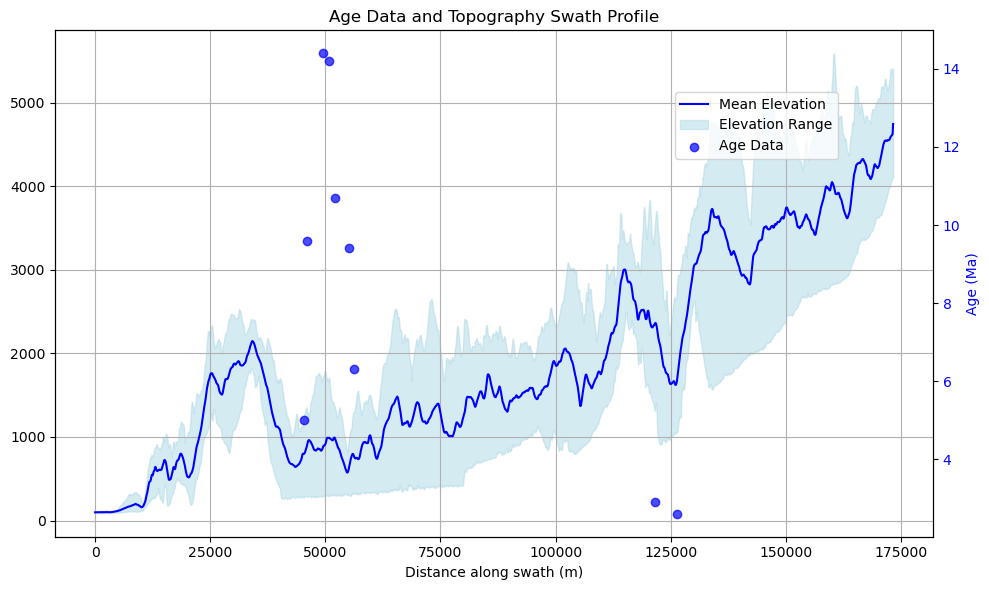

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd



shape= 'swath_subanshiri_middle_proj.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
DEM_precip = 'trmm_anual_mm_yr_wg84.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
raster = '/home/prayoga/prayoga/QGIS_prayoga/DEM@PRAYOGA/'+DEM
raster_precip = '/home/prayoga/prayoga/TRMM/TRMM_Proj/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

# Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform

#----------------------------------------------------
# Define swath line using shape file
# swath_gdf = gpd.read_file(baseline)
# swath_line = swath_gdf.geometry[0]  # Assuming one line

# Or define swath line manually 
swath_coords = [(95.37871211904822, 28.095067581911987), (93.20151833453788, 29.005375617560578)]  # Replace with real coordinates x1 Longitude, y1 Latitude
swath_line = LineString(swath_coords)

# (95.37871211904822, 28.095067581911987),  # Start (Longitude, Latitude)
#                (93.20151833453788, 29.005375617560578)

# ---------------------------------------------------------------
# Define width of swath line
buffer_width = 10000  # Swath width in meters (e.g., 5 km)
swath_buffer = swath_line.buffer(buffer_width)

# Mask DEM outside the buffer
buffer_mask = geometry_mask([swath_buffer], transform=dem_transform, invert=True, out_shape=dem_data.shape)
masked_dem = np.where(buffer_mask, dem_data, np.nan)

# Get coordinates of the buffer's rasterized pixels
rows, cols = np.where(buffer_mask)
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)
zs = masked_dem[rows, cols]

# Convert coordinates to distances along the swath line
from shapely.ops import nearest_points

distances = []
for x, y, z in zip(xs, ys, zs):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))

# Sort by distance
distances = np.array(sorted(distances, key=lambda d: d[0]))


# To create a summary (e.g., mean, min, max) of elevation at each distance along the swath:
df = pd.DataFrame(distances, columns=["Distance", "Elevation"])
bin_width = 100  # Bin width in meters
df["Bin"] = (df["Distance"] // bin_width).astype(int)

# Aggregate elevation statistics
summary = df.groupby("Bin").agg(
    Mean_Elevation=("Elevation", "mean"),
    Min_Elevation=("Elevation", "min"),
    Max_Elevation=("Elevation", "max")
)
summary["Bin_Center"] = summary.index * bin_width

#---------------------------------------------------------------------
# Load Age data (CSV with columns: Latitude, Longitude, Age)
Age_data = pd.read_csv(AFT_herman)

# Convert to GeoDataFrame
from shapely.geometry import Point

geometry = [Point(xy) for xy in zip(Age_data["Longitude"], Age_data["Latitude"])]
Age_gdf = gpd.GeoDataFrame(Age_data, geometry=geometry, crs="EPSG:4326")

# Reproject Age data to match DEM CRS
Age_gdf = Age_gdf.to_crs(dem.crs)
# Age_gdf
# print(f"CRS of the Precipitation_TRMM: {Age_gdf.crs}")
#------------------------------------------------------------------------
# 
buffer_width = 10000  # 10 km buffer
swath_buffer = swath_line.buffer(buffer_width)

# Filter Age data points within the swath buffer
AFT_Ages_within_swath = Age_gdf[Age_gdf.geometry.within(swath_buffer)]

# Project points to swath distances
from shapely.ops import nearest_points

Age_distances = []
for point in AFT_Ages_within_swath.geometry:
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    Age_distances.append(distance)

AFT_Ages_within_swath["Distance"] = Age_distances
#-----------------------------------------------------------------------
# plot swath profile
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot topography profile
# ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
# ax1.set_ylabel("Elevation (m)", color="brown")
# ax1.tick_params(axis="y", labelcolor="brown")
ax1.plot(summary["Bin_Center"], summary["Mean_Elevation"], color="blue", label="Mean Elevation")
ax1.fill_between(
    summary["Bin_Center"],
    summary["Min_Elevation"],
    summary["Max_Elevation"],
    color="lightblue",
    alpha=0.5,
    label="Elevation Range"
)

#-------------------------------------------------------------------------------------
# Plot the Swath Profile
# Plot Age data on secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
            color="blue", label="Age Data", alpha=0.7)
ax2.set_ylabel("Age (Ma)", color="blue")
ax2.tick_params(axis="y", labelcolor="blue")

# Add labels, legend, and title
ax1.set_xlabel("Distance along swath (m)")
plt.title("Age Data and Topography Swath Profile")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
plt.show()


ValueError: Shape of passed values is (0, 1), indices imply (0, 2)

DEM bounds: BoundingBox(left=-195544.1962, bottom=2986426.6017, right=599237.4886, top=3561944.6063)
Buffered swath bounds: (-65356.85569974258, 3112934.3830768946, 144226.0507408693, 3222580.764242271)


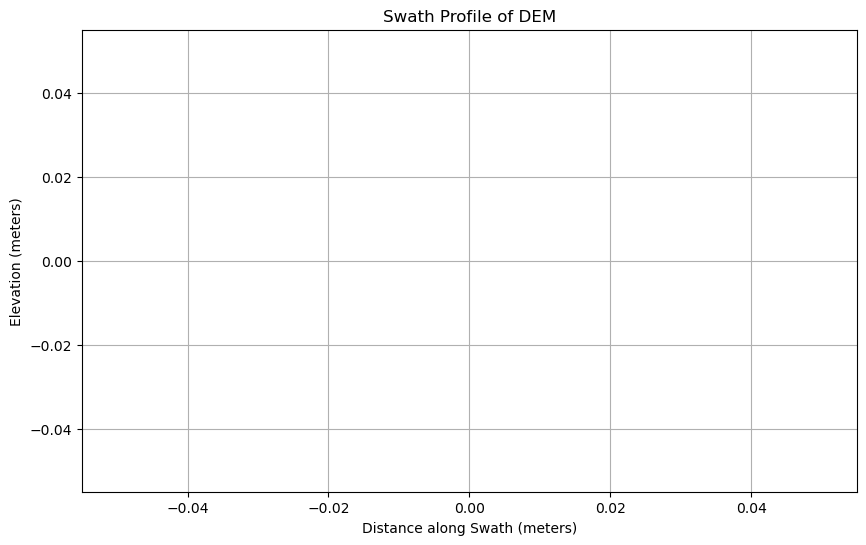

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from rasterio.mask import mask 
from pyproj import Proj, Transformer
from shapely.ops import transform 

shape= 'swath_subanshiri_middle_proj.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
DEM_precip = 'trmm_anual_mm_yr_wg84.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
raster = '/home/prayoga/prayoga/QGIS_prayoga/DEM@PRAYOGA/'+DEM
raster_precip = '/home/prayoga/prayoga/TRMM/TRMM_Proj/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT
# Check the Coordinate Reference System (CRS)
# print(f"CRS of the shapefile: {gpd.read_file(baseline).crs}")
# print(f"CRS of the DEM_SRTM30: {rasterio.open(raster).crs}")
# print(f"CRS of the Precipitation_TRMM: {rasterio.open(raster_precip).crs}")
# Load topographic data (e.g., DEM)
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import LineString
import rasterio
from rasterio.mask import mask
from shapely.ops import transform  # Ensure this is imported
from pyproj import Transformer

# Define the swath points (Assumed to be in EPSG:4326 - WGS84)
swath_points = [(144126.05499524082, 3113034.378822523),  (-65256.85995411407, 3222480.7684966424)]
swath_line = LineString(swath_points)

# Manually set the CRS of the LineString (WGS84 - EPSG:4326)
swath_crs = "EPSG:32647"  # Assuming the points are in WGS84

# Define the buffer distance in meters (e.g., 100 meters)
buffer_distance = 100  # meters
buffered_swath = swath_line.buffer(buffer_distance)  # Create buffer around the line

# Load the DEM
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_crs = dem.crs  # CRS of the DEM data
    dem_transform = dem.transform  # Get affine transformation for coordinate conversion
    dem_bounds = dem.bounds  # Get DEM bounds for debugging
    
    print("DEM bounds:", dem_bounds)
    
    # Reproject the swath line buffer to the DEM's CRS (if needed)
    # Check if the swath line's CRS matches the DEM's CRS
    if swath_crs != dem_crs:
        # If the CRS is different, use pyproj to reproject the geometry
        transformer = Transformer.from_crs(swath_crs, dem_crs, always_xy=True)
        reprojected_swath = transform(transformer.transform, buffered_swath)
    else:
        reprojected_swath = buffered_swath
    
    # Print the bounds of the buffered swath
    print("Buffered swath bounds:", reprojected_swath.bounds)
    
    # Create a mask where the buffer defines the area of interest
    mask_geom = [reprojected_swath]
    
    try:
        out_imAge, out_transform = mask(dem, mask_geom, crop=True)
        
        # Flatten the DEM and apply the mask to get the data inside the buffer region
        masked_dem_data = out_imAge[0]  # Assuming one band (grayscale DEM)

        # Extract coordinates of the points along the swath line
        line_coords = list(swath_line.coords)
        
        # Extract the elevation values along the line
        elevations = []
        distances = []
        
        # Iterate over points along the swath line and extract elevation values
        for i, (lon, lat) in enumerate(line_coords):
            # Transform the coordinates to pixel indices (row, col)
            row, col = ~dem_transform * (lon, lat)
            row, col = int(row), int(col)
            
            # Extract the elevation at the corresponding pixel
            if 0 <= row < masked_dem_data.shape[0] and 0 <= col < masked_dem_data.shape[1]:
                elevation = masked_dem_data[row, col]
                elevations.append(elevation)
                # Calculate the cumulative distance along the line for the profile
                if i > 0:
                    prev_lon, prev_lat = line_coords[i - 1]
                    distance = np.sqrt((lon - prev_lon) ** 2 + (lat - prev_lat) ** 2)
                    distances.append(distances[-1] + distance if distances else 0)
                else:
                    distances.append(0)

        # Plot the Swath Profile (Elevation vs. Distance)
        plt.figure(figsize=(10, 6))
        plt.plot(distances, elevations, marker='o', color='b', linestyle='-', markersize=5)
        plt.xlabel('Distance along Swath (meters)')
        plt.ylabel('Elevation (meters)')
        plt.title('Swath Profile of DEM')
        plt.grid(True)
        plt.show()
    
    except ValueError:
        print("No overlap between the swath buffer and the DEM.")


In [7]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.features import geometry_mask
from shapely.geometry import Point
import pandas as pd
from pyproj import Proj, Transformer


shape= 'swath_subanshiri_middle_proj.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
DEM_precip = 'trmm_anual_mm_yr_wg84.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
raster = '/home/prayoga/prayoga/QGIS_prayoga/DEM@PRAYOGA/'+DEM
raster_precip = '/home/prayoga/prayoga/TRMM/TRMM_Proj/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

# Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform


In [3]:
# Define swath line (for example, two points)
swath_points = [(95.37871211904822, 28.095067581911987), (93.20151833453788, 29.005375617560578)]  # (Longitude, Latitude)
swath_line = LineString(swath_points)

# Define buffer distance in meters (e.g., 100 meters)
buffer_distance = 10000  # meters
buffered_swath = swath_line.buffer(buffer_distance)  # Create buffer around the line

In [ ]:
from shapely.ops import nearest_points

# Get the row/column indices of non-NaN values
rows, cols = np.where(~np.isnan(dem_data))

# Convert row/column indices to geographic coordinates
xs, ys = rasterio.transform.xy(dem_transform, rows, cols)

# Initialize lists to store the distance along the swath and the corresponding elevation
distances = []
elevations = []

for x, y in zip(xs, ys):
    point = Point(x, y)
    # Check if the point lies within the buffered swath region
    if buffered_swath.contains(point):
        # Find the nearest point on the swath line
        nearest_point_on_swath = nearest_points(swath_line, point)[0]
        # Calculate the distance from the point to the start of the swath
        distance = swath_line.project(nearest_point_on_swath)
        elevation = dem_data[rows[0], cols[0]]  # Get elevation at that point
        distances.append(distance)
        elevations.append(elevation)


In [ ]:
# Plot the topographic profile
plt.figure(figsize=(10, 6))
plt.plot(distances, elevations, color='brown', label='Topography Profile')
plt.xlabel('Distance along Swath (meters)')
plt.ylabel('Elevation (meters)')
plt.title('Topographic Swath Profile')
plt.grid(True)
plt.legend()
plt.show()


In [ ]:
import pandas as pd

# Create DataFrame
df = pd.DataFrame({'Distance': distances, 'Elevation': elevations})

# Bin the distances into intervals (e.g., every 100 meters)
bin_width = 100  # meters
df['Bin'] = (df['Distance'] // bin_width).astype(int)

# Aggregate elevation statistics (mean, min, max)
elevation_summary = df.groupby('Bin').agg(
    Mean_Elevation=('Elevation', 'mean'),
    Min_Elevation=('Elevation', 'min'),
    Max_Elevation=('Elevation', 'max')
).reset_index()

# Plot binned elevation data
plt.figure(figsize=(10, 6))
plt.plot(elevation_summary['Bin'] * bin_width, elevation_summary['Mean_Elevation'], label='Mean Elevation', color='blue')
plt.fill_between(
    elevation_summary['Bin'] * bin_width,
    elevation_summary['Min_Elevation'],
    elevation_summary['Max_Elevation'],
    color='lightblue', alpha=0.5, label='Elevation Range'
)
plt.xlabel('Distance along Swath (meters)')
plt.ylabel('Elevation (meters)')
plt.title('Binned Topographic Swath Profile')
plt.legend()
plt.grid(True)
plt.show()


In [17]:
print(distances)
print(xs)
print(ys)
print(zs)
distances = []
for x, y, z in zip(xs, ys, zs):
    point = nearest_points(swath_line, Point(x, y))[0]
    distances.append((swath_line.project(point), z))
distances = []
for x, y, z in zip(xs, ys, zs):
    point = nearest_points(swath_line, Point(x, y))[0]
    dist = swath_line.project(point)
    distances.append((dist, z))
    print(f"Processed point: ({x}, {y}, {z}) -> Distance: {dist}")

# Create a DataFrame
df = pd.DataFrame(distances, columns=["Distance", "Elevation"])

# Further operations...
df


[]
[]
[]
[]


,Distance,Elevation


Bounds of the DEM: BoundingBox(left=-195544.1962, bottom=2986426.6017, right=599237.4886, top=3561944.6063)
Line shapefile saved as line_shapefile.shp


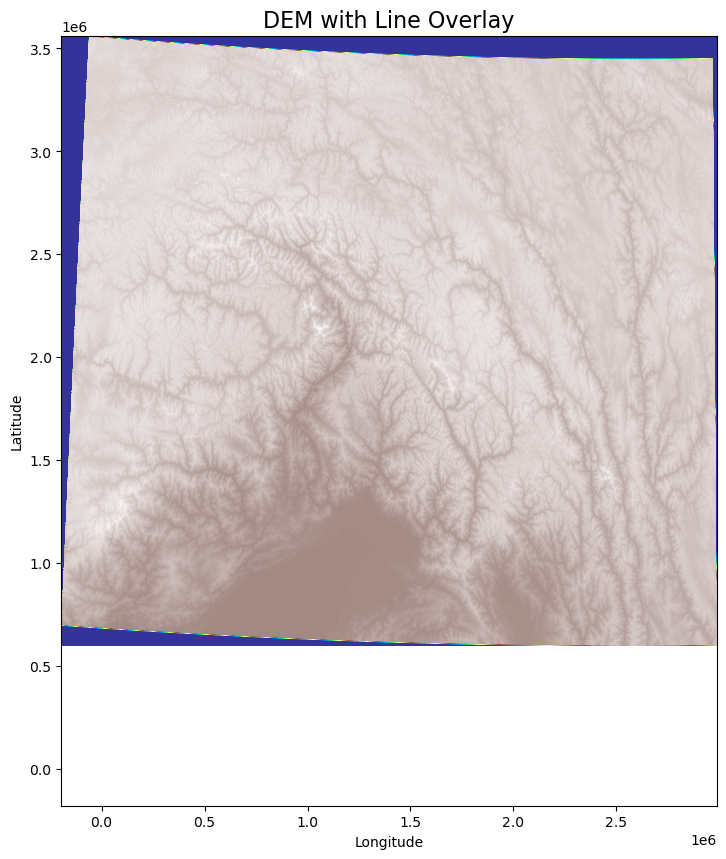

In [8]:
import rasterio
import geopandas as gpd
from shapely.geometry import LineString
import matplotlib.pyplot as plt

# Path to your DEM file
dem_path = raster

# Open the DEM file using Rasterio
with rasterio.open(dem_path) as dem_src:
    # Get the bounds (coordinates of the corners of the DEM)
    bounds = dem_src.bounds
    print(f"Bounds of the DEM: {bounds}")

# Example: Create a line manually (you can also extract features from the DEM)
# Let's create a simple line (start point, end point)
line_coords = [(95.37871211904822, 28.095067581911987),  # Start (Longitude, Latitude)
               (93.20151833453788, 29.005375617560578)]  # End (Longitude, Latitude)

# 29.005375617560578, 93.20151833453788
# 28.095067581911987, 95.37871211904822

# Create a LineString from the coordinates
line = LineString(line_coords)

# Create a GeoDataFrame
gdf = gpd.GeoDataFrame({'geometry': [line]})

# Set the same CRS as the DEM (if known), assuming WGS 84 (EPSG:4326)
gdf.set_crs('EPSG:32647', allow_override=True, inplace=True)

# Save the line as a shapefile
line_shapefile = "line_shapefile.shp"
gdf.to_file(line_shapefile)

print(f"Line shapefile saved as {line_shapefile}")

# Plot the DEM and the line together
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the DEM (use imshow or show)
with rasterio.open(dem_path) as dem_src:
    # Plot the DEM as an imAge
    dem = dem_src.read(1)
    ax.imshow(dem, cmap='terrain', extent=dem_src.bounds)
    
# Plot the line
gdf.plot(ax=ax, color='red', linewidth=2)

# Customize the plot
ax.set_title("DEM with Line Overlay", fontsize=16)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.show()


In [47]:
!pip install --upgrade pandas geopandas


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 1.6 MB/s eta 0:00:00 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 6.4 MB/s eta 0:00:00m eta 0:00:010:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.6/323.6 kB 6.1 MB/s eta 0:00:00 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.1/24.1 MB 6.4 MB/s eta 0:00:00m eta 0:00:010:00:01
  Attempting uninstall: pandas
    Found existing installation: pandas 2.1.3
    Uninstalling pandas-2.1.3:
      Successfully uninstalled pandas-2.1.3
  Attempting uninstall: geopandas
    Found existing installation: geopandas 0.9.0
    Uninstalling geopandas-0.9.0:
      Successfully uninstalled geopandas-0.9.0


In [48]:
import geopandas as gpd
from shapely.geometry import LineString

# Create a simple line manually (replace with your coordinates)
line_coords = [(91.53193913332123, 26.256483654467146), (95.6222889874443, 31.005142674147375)]
line = LineString(line_coords)

# Create a GeoDataFrame
gdf = gpd.GeoDataFrame({'geometry': [line]})

# Set CRS (if necessary)
gdf.set_crs('EPSG:4326', allow_override=True, inplace=True)

# Save the line as a shapefile
line_shapefile = "line_shapefile.shp"
gdf.to_file(line_shapefile)

print(f"Line shapefile saved as {line_shapefile}")


AttributeError: module 'pandas' has no attribute 'Int64Index'

# Topographic Swath with Age data

## Load DEM

In [24]:
shape= 'swath_subanshiri_middle_proj.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
DEM_precip = 'trmm_anual_mm_yr_wg84.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
raster = '/home/prayoga/prayoga/QGIS_prayoga/DEM@PRAYOGA/'+DEM
raster_precip = '/home/prayoga/prayoga/TRMM/TRMM_Proj/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

In [25]:
# Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)  # Topography data
    dem_transform = dem.transform

## Load Age data

In [39]:
import pandas as pd

# Load Age data (CSV with columns: Latitude, Longitude, Age)
Age_data = pd.read_csv(AFT_herman)

# Convert to GeoDataFrame
from shapely.geometry import Point

geometry = [Point(xy) for xy in zip(Age_data["Longitude"], Age_data["Latitude"])]
Age_gdf = gpd.GeoDataFrame(Age_data, geometry=geometry, crs="EPSG:4326")

# Reproject Age data to match DEM CRS
Age_gdf = Age_gdf.to_crs(dem.crs)
Age_gdf
print(f"CRS of the Precipitation_TRMM: {Age_gdf.crs}")

CRS of the Precipitation_TRMM: PROJCS["WGS 84 / UTM zone 47N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",99],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32647"]]


# Define swath profile

In [ ]:
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line

## Extract DEM Profile Along Swath

In [29]:
from rasterio.sample import sample_gen

def extract_profile(dem_dataset, swath_line, num_points=100):
    # Interpolate points along the swath line
    points = [swath_line.interpolate(i / (num_points - 1), normalized=True) for i in range(num_points)]
    coords = [(point.x, point.y) for point in points]

    # Extract raster values at the coordinates
    values = list(sample_gen(dem_dataset, coords))
    return np.array(values).squeeze()


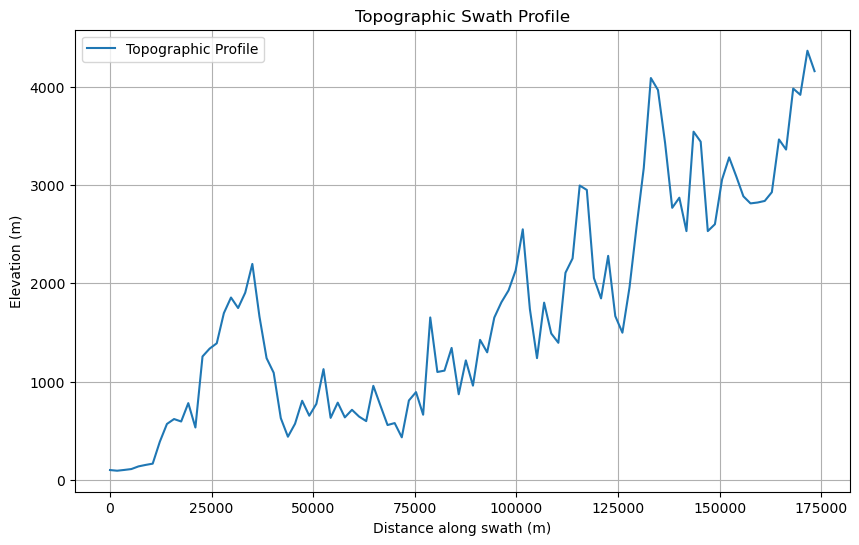

In [30]:
import rasterio

# Open DEM dataset
dem_path = raster # Replace with your DEM file path
with rasterio.open(dem_path) as dem_dataset:
    dem_profile = extract_profile(dem_dataset, swath_line)

# Generate distances for the profile
distances = np.linspace(0, swath_line.length, len(dem_profile))

# Plot the profile
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(distances, dem_profile, label="Topographic Profile")
plt.xlabel("Distance along swath (m)")
plt.ylabel("Elevation (m)")
plt.title("Topographic Swath Profile")
plt.grid()
plt.legend()
plt.show()


In [31]:
buffer_width = 10000  # 10 km buffer
swath_buffer = swath_line.buffer(buffer_width)

# Filter Age data points within the swath buffer
AFT_Ages_within_swath = Age_gdf[Age_gdf.geometry.within(swath_buffer)]

# Project points to swath distances
from shapely.ops import nearest_points

Age_distances = []
for point in AFT_Ages_within_swath.geometry:
    nearest_point_on_swath = nearest_points(swath_line, point)[0]
    distance = swath_line.project(nearest_point_on_swath)
    Age_distances.append(distance)

AFT_Ages_within_swath["Distance"] = Age_distances


/home/prayoga/anaconda3/envs/pcraster/lib/python3.11/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


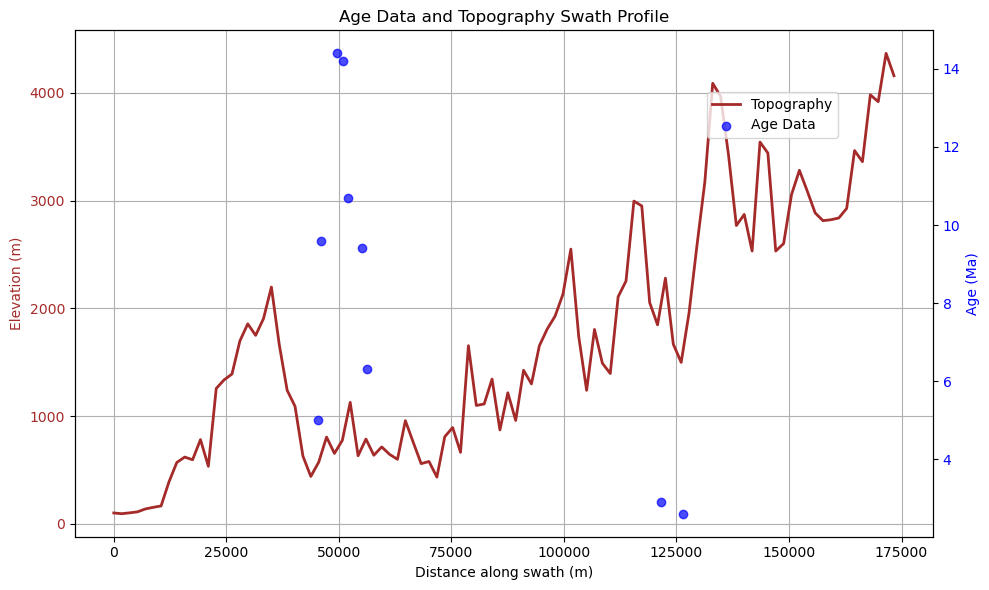

In [32]:
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot topography profile
ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
ax1.set_ylabel("Elevation (m)", color="brown")
ax1.tick_params(axis="y", labelcolor="brown")

# Plot Age data on secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(AFT_Ages_within_swath["Distance"], AFT_Ages_within_swath["Age"], 
            color="blue", label="Age Data", alpha=0.7)
ax2.set_ylabel("Age (Ma)", color="blue")
ax2.tick_params(axis="y", labelcolor="blue")

# Add labels, legend, and title
ax1.set_xlabel("Distance along swath (m)")
plt.title("Age Data and Topography Swath Profile")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
plt.show()


# Create swath profile with (a) extracted elevation values from the DEM with buffer, (b) extract precipitation values from the precipitation data .geotiff with buffer and (c) Age data in .csv within the swath width in python

# Data path

In [50]:
shape= 'swath_subanshiri_middle_proj.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
DEM_precip = 'trmm_anual_mm_yr_wg84.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
raster = '/home/prayoga/prayoga/QGIS_prayoga/DEM@PRAYOGA/'+DEM
raster_precip = '/home/prayoga/prayoga/TRMM/TRMM_Proj/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

# Import libreries

In [43]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString
from rasterio.sample import sample_gen
import pandas as pd
from shapely.geometry import Point

# Load DEM file

In [35]:
dem_path = raster  # Replace with your DEM file path
with rasterio.open(dem_path) as dem_dataset:
    dem_data = dem_dataset.read(1)  # Read DEM data (elevation)
    dem_transform = dem_dataset.transform  # Get transformation matrix


# Load Precipitation data

In [36]:
# Load Precipitation data
precip_path = raster_precip  # Replace with your precipitation file path
with rasterio.open(precip_path) as precip_dataset:
    precip_data = precip_dataset.read(1)  # Read Precipitation data
    precip_transform = precip_dataset.transform  # Get transformation matrix


# Load Age data (CSV)

In [51]:
Age_csv_path = AFT_herman # Replace with your Age data CSV file path
Age_data = pd.read_csv(Age_csv_path)
Age_data

,latitude,longitude,age
0,28.379600,98.961600,56.6
1,28.372780,98.968700,39.3
2,28.375300,98.926300,43.8
3,28.376200,98.917600,43.8
4,28.379700,98.909100,39.4
...,...,...,...
1611,22.696667,104.489667,16.0
1612,22.717500,104.534500,19.0
1613,22.732833,104.703333,19.0
1614,22.745833,104.594667,19.0


# Define the Swath Line and Apply Buffer

In [39]:
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line
buffer_width = 5000  # Swath width in meters (e.g., 5 km)
swath_buffer = swath_line.buffer(buffer_width)


# Extract Data Within the Buffer

In [40]:
def extract_raster_values_within_buffer(raster_dataset, buffer_polygon, transform, num_points=100):
    # Interpolate points along the buffer polygon
    # Get the coordinates within the buffer
    bounds = buffer_polygon.bounds
    x_min, y_min, x_max, y_max = bounds

    # Generate a grid of points within the bounding box
    x_coords = np.linspace(x_min, x_max, num_points)
    y_coords = np.linspace(y_min, y_max, num_points)
    coords = [(x, y) for x in x_coords for y in y_coords]

    # Filter points that fall within the buffer polygon
    valid_coords = [coord for coord in coords if buffer_polygon.contains(Point(coord))]

    # Extract raster values at the valid coordinates
    values = list(sample_gen(raster_dataset, valid_coords))
    return np.array(values).squeeze()

# Extract DEM profile
with rasterio.open(dem_path) as dem_dataset:
    dem_profile = extract_raster_values_within_buffer(dem_dataset, swath_buffer, dem_transform)


#  Extract Precipitation from the Precipitation Data

In [41]:
def extract_precipitation_within_buffer(precip_dataset, buffer_polygon, transform, num_points=100):
    # Interpolate points along the buffer polygon
    bounds = buffer_polygon.bounds
    x_min, y_min, x_max, y_max = bounds
    x_coords = np.linspace(x_min, x_max, num_points)
    y_coords = np.linspace(y_min, y_max, num_points)
    coords = [(x, y) for x in x_coords for y in y_coords]

    # Filter points that fall within the buffer polygon
    valid_coords = [coord for coord in coords if buffer_polygon.contains(Point(coord))]

    # Extract precipitation values
    precip_values = []
    for (x, y) in valid_coords:
        precip_values.append(precip_dataset.sample([(x, y)]).next())
    
    return np.array(precip_values)

# Extract Precipitation profile
with rasterio.open(precip_path) as precip_dataset:
    precip_profile = extract_precipitation_within_buffer(precip_dataset, swath_buffer, precip_transform)


AttributeError: 'generator' object has no attribute 'next'

In [42]:
def extract_precipitation_within_buffer(precip_dataset, buffer_polygon, transform, num_points=100):
    # Interpolate points along the buffer polygon
    bounds = buffer_polygon.bounds
    x_min, y_min, x_max, y_max = bounds
    x_coords = np.linspace(x_min, x_max, num_points)
    y_coords = np.linspace(y_min, y_max, num_points)
    coords = [(x, y) for x in x_coords for y in y_coords]

    # Filter points that fall within the buffer polygon
    valid_coords = [coord for coord in coords if buffer_polygon.contains(Point(coord))]

    # Extract precipitation values
    precip_values = []
    for (x, y) in valid_coords:
        # Use a generator, and collect the value by iterating over it
        for value in precip_dataset.sample([(x, y)]):
            precip_values.append(value[0])  # Unwrap the value from the tuple
    
    return np.array(precip_values)

# Extract Precipitation profile
with rasterio.open(precip_path) as precip_dataset:
    precip_profile = extract_precipitation_within_buffer(precip_dataset, swath_buffer, precip_transform)


# Extract Age Data

In [63]:
def extract_Age_within_buffer(Age_data, buffer_polygon):
    Age_values = []
    for index, row in Age_data.iterrows():
        # Use the correct column names, e.g., 'Longitude' and 'Latitude'
        point = Point(row['Longitude'], row['Latitude'])
        if buffer_polygon.contains(point):
            Age_values.append(row['Age'])
    return np.array(Age_values)
Age_profile = extract_Age_within_buffer(Age_data, swath_buffer)
print(Age_profile)  # Check if it is defined and has values
Age_profile

[]


array([], dtype=float64)

In [56]:
def extract_Age_within_buffer(Age_data, buffer_polygon):
    Age_values = []
    for index, row in Age_data.iterrows():
        point = Point(row['Longitude'], row['Latitude'])
        if buffer_polygon.contains(point):
            Age_values.append(row['Age'])
    print(Age_values)  # Print the extracted Age values for debugging
    return np.array(Age_values)


In [61]:
def extract_Age_within_buffer(Age_data, buffer_polygon):
    Age_values = []
    for index, row in Age_data.iterrows():
        point = Point(row['Longitude'], row['Latitude'])
        if buffer_polygon.contains(point):
            print(f"Point {point} is within buffer")  # Debugging
            Age_values.append(row['Age'])
    print(f"Extracted Age Values: {Age_values}")  # Debugging
    return np.array(Age_values)
Age_data

,latitude,longitude,age
0,28.379600,98.961600,56.6
1,28.372780,98.968700,39.3
2,28.375300,98.926300,43.8
3,28.376200,98.917600,43.8
4,28.379700,98.909100,39.4
...,...,...,...
1611,22.696667,104.489667,16.0
1612,22.717500,104.534500,19.0
1613,22.732833,104.703333,19.0
1614,22.745833,104.594667,19.0


In [62]:
distances

array([0.00000000e+00, 3.31917205e+02, 6.63834410e+02, ...,
       3.77389862e+05, 3.77721779e+05, 3.78053697e+05])

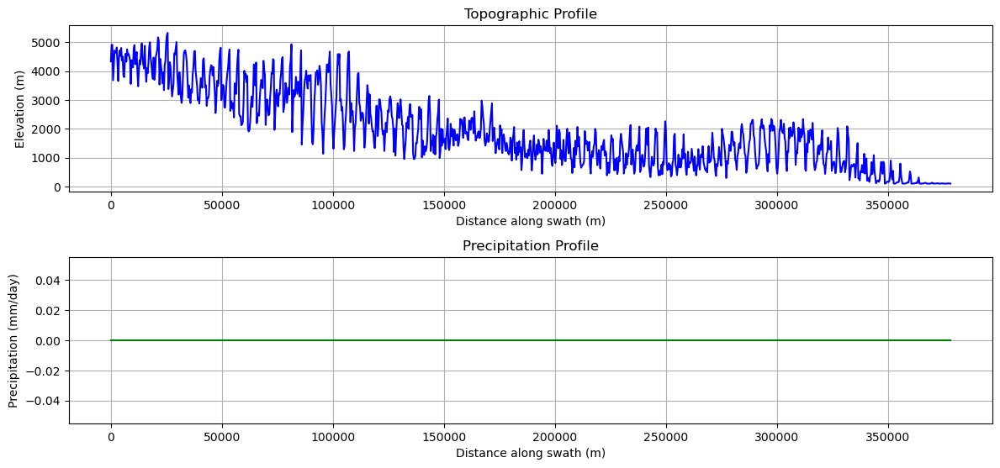

In [64]:
import numpy as np
import matplotlib.pyplot as plt

# Generate distances for the profile
distances = np.linspace(0, swath_buffer.length, len(dem_profile))

# Plot the profiles
plt.figure(figsize=(12, 8))

# Plot elevation profile
plt.subplot(3, 1, 1)
plt.plot(distances, dem_profile, color='b', label='Elevation (m)')
plt.xlabel("Distance along swath (m)")
plt.ylabel("Elevation (m)")
plt.title("Topographic Profile")
plt.grid()

# Plot precipitation profile
plt.subplot(3, 1, 2)
plt.plot(distances, precip_profile, color='g', label='Precipitation (mm/day)')
plt.xlabel("Distance along swath (m)")
plt.ylabel("Precipitation (mm/day)")
plt.title("Precipitation Profile")
plt.grid()

# Plot Age profile
# plt.subplot(3, 1, 3)
# plt.plot(distances, Age_profile, color='r', label='Age (Ma)')
# plt.xlabel("Distance along swath (m)")
# plt.ylabel("Age (Ma)")
# plt.title("Age Profile")
# plt.grid()

plt.tight_layout()
plt.show()


In [49]:
def extract_Age_within_buffer(Age_data, buffer_polygon):
    Age_values = []
    for index, row in Age_data.iterrows():
        point = Point(row['x'], row['y'])
        if buffer_polygon.contains(point):
            Age_values.append(row['Age'])
    return np.array(Age_values)

# Extract Age profile
Age_profile = extract_Age_within_buffer(Age_data, swath_buffer)


KeyError: 'x'

# Together plot swath profiles (a) extracted elevation values from the DEM with buffer, (b) extract precipitation values from the precipitation data .geotiff with buffer 

In [76]:
shape= 'swath_subanshiri_middle_proj.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
DEM_precip = 'projected_TRMM_Eastern_Himalaya_Tibet.tif'
AFT = 'AFT_after_2013.csv'
baseline = '/home/prayoga/prayoga/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
raster = '/home/prayoga/prayoga/QGIS_prayoga/DEM@PRAYOGA/'+DEM
raster_precip = '/home/prayoga/prayoga/QGIS_prayoga/DEM@PRAYOGA/'+ DEM_precip
AFT_herman = "/home/prayoga/prayoga/QGIS_prayoga/QGIS_excel/Data_excel/Mechuka project/" + AFT

In [78]:
# Load precipitation data (e.g., GeoTIFF)
precip_path = raster_precip
with rasterio.open(precip_path) as precip:
    precip_data = precip.read(1)  # Assuming a single band
    precip_transform = precip.transform

# Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)
    dem_transform = dem.transform

In [79]:
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line
buffer_width = 5000  # Swath width in meters (e.g., 5 km)
swath_buffer = swath_line.buffer(buffer_width)


In [80]:
from rasterio.sample import sample_gen

def extract_profile(raster, transform, swath_line, num_points=100):
    """
    Extracts values along a swath line from a raster dataset.
    """
    x, y = swath_line.interpolate(num_points, normalized=True).xy
    coords = [(xi, yi) for xi, yi in zip(x, y)]
    values = list(raster.sample(coords))
    return np.array(values).squeeze()

# Extract precipitation and DEM profiles
precip_profile = extract_profile(precip_data, precip_transform, swath_line)
dem_profile = extract_profile(dem_data, dem_transform, swath_line)


AttributeError: 'numpy.ndarray' object has no attribute 'sample'

In [81]:
import rasterio
import numpy as np
from rasterio.sample import sample_gen

def extract_profile(raster_dataset, transform, swath_line, num_points=100):
    """
    Extracts values along a swath line from a raster dataset using rasterio.
    """
    x, y = swath_line.interpolate(num_points, normalized=True).xy
    coords = [(xi, yi) for xi, yi in zip(x, y)]
    
    # Use rasterio's sample method to extract values
    values = list(raster_dataset.sample(coords))
    
    return np.array(values).squeeze()

# Open the precipitation dataset using rasterio
with rasterio.open(precip_path) as precip_dataset:
    precip_transform = precip_dataset.transform  # Get the affine transform
    precip_profile = extract_profile(precip_dataset, precip_transform, swath_line)

# Open the DEM dataset using rasterio
with rasterio.open(dem_path) as dem_dataset:
    dem_transform = dem_dataset.transform  # Get the affine transform
    dem_profile = extract_profile(dem_dataset, dem_transform, swath_line)

# Now, you can use precip_profile and dem_profile to plot the profiles.


In [87]:
# Check the length of the profiles
print(f"Length of Precipitation Profile: {len(precip_profile)}")
print(f"Length of DEM Profile: {len(dem_profile)}")

# Generate distances along the swath if profiles are properly extracted
if len(precip_profile) > 0:
    distances = np.linspace(0, swath_line.length, len(precip_profile))
    
    # Now plot the profiles
    plt.figure(figsize=(10, 6))

    # Plot Precipitation profile
    plt.subplot(2, 1, 1)
    plt.plot(distances, precip_profile, label="Precipitation (mm)", color='b')
    plt.title('Precipitation Profile')
    plt.xlabel("Distance along Swath (m)")
    plt.ylabel("Precipitation (mm)")

    # Plot DEM profile
    plt.subplot(2, 1, 2)
    plt.plot(distances, dem_profile, label="Elevation (m)", color='g')
    plt.title('Elevation Profile')
    plt.xlabel("Distance along Swath (m)")
    plt.ylabel("Elevation (m)")

    plt.tight_layout()
    plt.show()
else:
    print("Error: No data in the profiles.")


TypeError: len() of unsized object

In [83]:
distances = np.linspace(0, swath_line.length, len(precip_profile))


TypeError: len() of unsized object

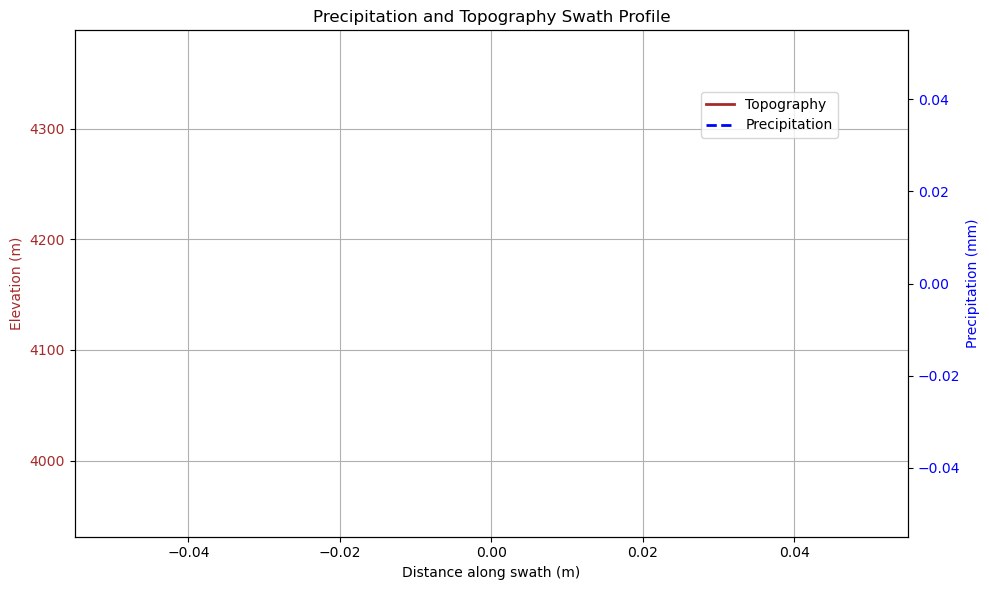

In [84]:
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot DEM profile
ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
ax1.set_ylabel("Elevation (m)", color="brown")
ax1.tick_params(axis="y", labelcolor="brown")

# Plot precipitation profile on secondary axis
ax2 = ax1.twinx()
ax2.plot(distances, precip_profile, color="blue", label="Precipitation", linewidth=2, linestyle="--")
ax2.set_ylabel("Precipitation (mm)", color="blue")
ax2.tick_params(axis="y", labelcolor="blue")

# Add labels, legend, and title
plt.title("Precipitation and Topography Swath Profile")
ax1.set_xlabel("Distance along swath (m)")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
plt.show()


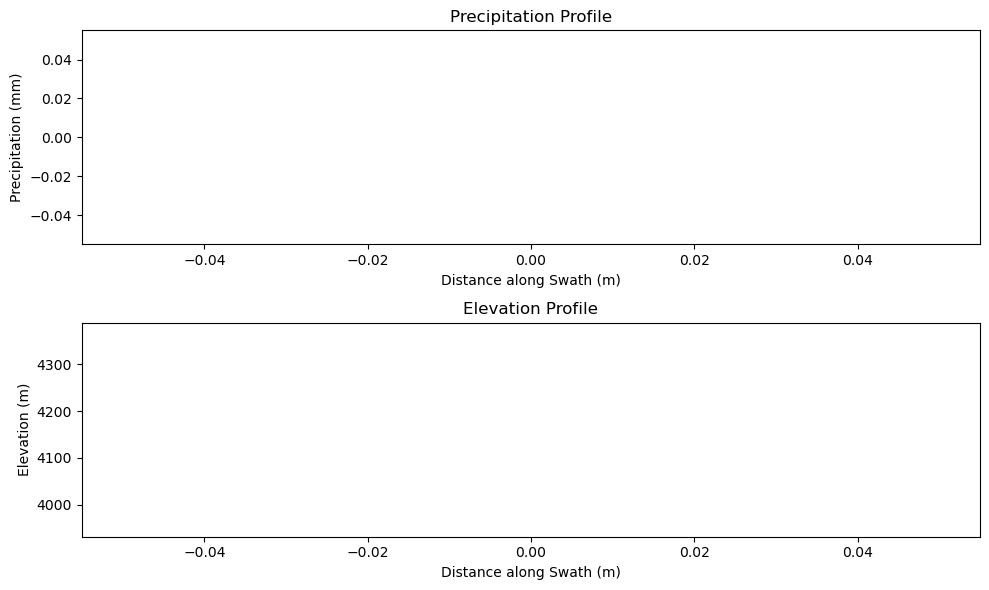

In [82]:
import matplotlib.pyplot as plt

# Plot the profiles
plt.figure(figsize=(10, 6))

# Plot the Precipitation profile
plt.subplot(2, 1, 1)
plt.plot(precip_profile, label="Precipitation (mm)", color='b')
plt.title('Precipitation Profile')
plt.xlabel("Distance along Swath (m)")
plt.ylabel("Precipitation (mm)")

# Plot the DEM profile
plt.subplot(2, 1, 2)
plt.plot(dem_profile, label="Elevation (m)", color='g')
plt.title('Elevation Profile')
plt.xlabel("Distance along Swath (m)")
plt.ylabel("Elevation (m)")

plt.tight_layout()
plt.show()


In [77]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from shapely.geometry import LineString
from shapely.geometry import Point

# Function to extract elevation values from the DEM within the buffer
def extract_elevation_within_buffer(dem_dataset, buffer_polygon, transform):
    elevation_values = []
    # Iterate through the buffer polygon coordinates
    for x, y in zip(buffer_polygon.exterior.xy[0], buffer_polygon.exterior.xy[1]):
        row, col = ~transform * (x, y)  # Apply inverse of the transform
        row, col = int(row), int(col)
        # Extract the DEM value
        elevation_values.append(dem_dataset.read(1)[row, col])
    
    return np.array(elevation_values)

# Function to extract precipitation values within the buffer
def extract_precipitation_within_buffer(precip_dataset, buffer_polygon, transform):
    precip_values = []
    # Iterate through the buffer polygon coordinates
    for x, y in zip(buffer_polygon.exterior.xy[0], buffer_polygon.exterior.xy[1]):
        row, col = ~transform * (x, y)  # Apply inverse of the transform
        row, col = int(row), int(col)
        # Extract the precipitation value
        precip_values.append(precip_dataset.read(1)[row, col])
    
    return np.array(precip_values)

# Set paths to your DEM and precipitation GeoTIFF files
dem_path = raster
precip_path = raster_precip

# Create a swath line (for demonstration, using a simple line)
start_point = (10, 10)  # Example coordinates
end_point = (50, 50)    # Example coordinates

# Create a LineString object for the swath line
swath_line = LineString([start_point, end_point])

# Create a buffer around the swath line
buffer_width = 200  # Buffer width in meters
swath_buffer = swath_line.buffer(buffer_width)

# Open the DEM dataset
with rasterio.open(dem_path) as dem_dataset:
    dem_transform = dem_dataset.transform
    # Extract DEM profile within the swath buffer
    dem_profile = extract_elevation_within_buffer(dem_dataset, swath_buffer, dem_transform)

# Open the Precipitation dataset
with rasterio.open(precip_path) as precip_dataset:
    precip_transform = precip_dataset.transform
    # Extract precipitation profile within the swath buffer
    precip_profile = extract_precipitation_within_buffer(precip_dataset, swath_buffer, precip_transform)

# Generate distances for plotting (distance along the swath line)
distances = np.linspace(0, swath_line.length, len(dem_profile))

# Plot both swath profiles together
plt.figure(figsize=(10, 8))

# Plot Elevation Profile
plt.plot(distances, dem_profile, color='b', label='Elevation (m)')

# Plot Precipitation Profile
plt.plot(distances, precip_profile, color='g', label='Precipitation (mm)')

# Add labels and legend
plt.xlabel("Distance along swath (m)")
plt.ylabel("Value")
plt.title("Swath Profiles: Elevation & Precipitation")
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


IndexError: index 126801 is out of bounds for axis 1 with size 28295

In [69]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import LineString

# Load precipitation data (e.g., GeoTIFF)
precip_path = raster_precip
with rasterio.open(precip_path) as precip:
    precip_data = precip.read(1)  # Assuming a single band
    precip_transform = precip.transform

# Load topographic data (e.g., DEM)
dem_path = raster
with rasterio.open(dem_path) as dem:
    dem_data = dem.read(1)
    dem_transform = dem.transform


In [70]:
swath_gdf = gpd.read_file(baseline)
swath_line = swath_gdf.geometry[0]  # Assuming one line
buffer_width = 5000  # Swath width in meters (e.g., 5 km)
swath_buffer = swath_line.buffer(buffer_width)


In [71]:
from rasterio.sample import sample_gen

def extract_profile(raster, transform, swath_line, num_points=100):
    """
    Extracts values along a swath line from a raster dataset.
    """
    x, y = swath_line.interpolate(num_points, normalized=True).xy
    coords = [(xi, yi) for xi, yi in zip(x, y)]
    values = list(raster.sample(coords))
    return np.array(values).squeeze()

# Extract precipitation and DEM profiles
precip_profile = extract_profile(precip_data, precip_transform, swath_line)
dem_profile = extract_profile(dem_data, dem_transform, swath_line)


AttributeError: 'numpy.ndarray' object has no attribute 'sample'

In [72]:
import rasterio
import numpy as np

def extract_profile(raster, transform, swath_line, num_points=100):
    # Generate points along the swath line
    x, y = swath_line.interpolate(num_points, normalized=True).xy
    coords = [(xi, yi) for xi, yi in zip(x, y)]
    
    # Get the row and column indices of each point using the transform
    row_col_coords = [transform * (point[0], point[1]) for point in coords]
    
    # Sample the raster at these coordinates
    values = []
    for coord in row_col_coords:
        row, col = int(coord[1]), int(coord[0])
        if row >= 0 and row < raster.shape[0] and col >= 0 and col < raster.shape[1]:
            values.append(raster[row, col])
        else:
            values.append(np.nan)  # For out-of-bound coordinates, append NaN
    
    return np.array(values)

# Example usAge
with rasterio.open(precip_path) as precip_dataset:
    precip_data = precip_dataset.read(1)  # Read the first band of the precipitation data
    precip_transform = precip_dataset.transform  # Get the affine transform
    
    precip_profile = extract_profile(precip_data, precip_transform, swath_line)

# Extracting DEM profile in a similar manner
with rasterio.open(dem_path) as dem_dataset:
    dem_data = dem_dataset.read(1)  # Read the first band of the DEM data
    dem_transform = dem_dataset.transform  # Get the affine transform
    
    dem_profile = extract_profile(dem_data, dem_transform, swath_line)

# Now, you can use precip_profile and dem_profile to plot the profiles.


In [74]:
distances = np.linspace(0, swath_line.length, len(precip_profile))


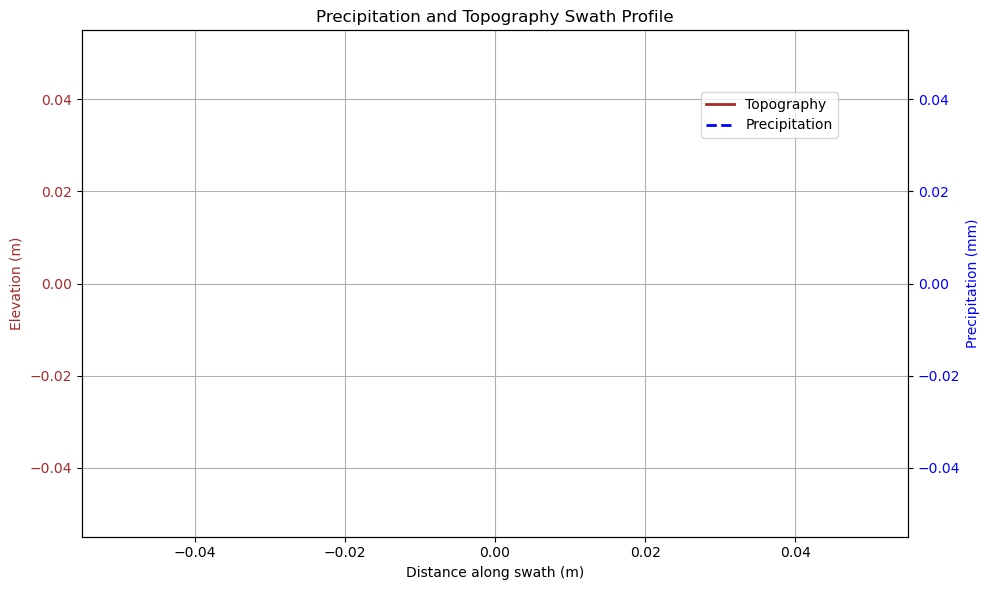

In [75]:
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot DEM profile
ax1.plot(distances, dem_profile, color="brown", label="Topography", linewidth=2)
ax1.set_ylabel("Elevation (m)", color="brown")
ax1.tick_params(axis="y", labelcolor="brown")

# Plot precipitation profile on secondary axis
ax2 = ax1.twinx()
ax2.plot(distances, precip_profile, color="blue", label="Precipitation", linewidth=2, linestyle="--")
ax2.set_ylabel("Precipitation (mm)", color="blue")
ax2.tick_params(axis="y", labelcolor="blue")

# Add labels, legend, and title
plt.title("Precipitation and Topography Swath Profile")
ax1.set_xlabel("Distance along swath (m)")
ax1.grid()
fig.legend(loc="upper right", bbox_to_anchor=(0.85, 0.85))

plt.tight_layout()
plt.show()


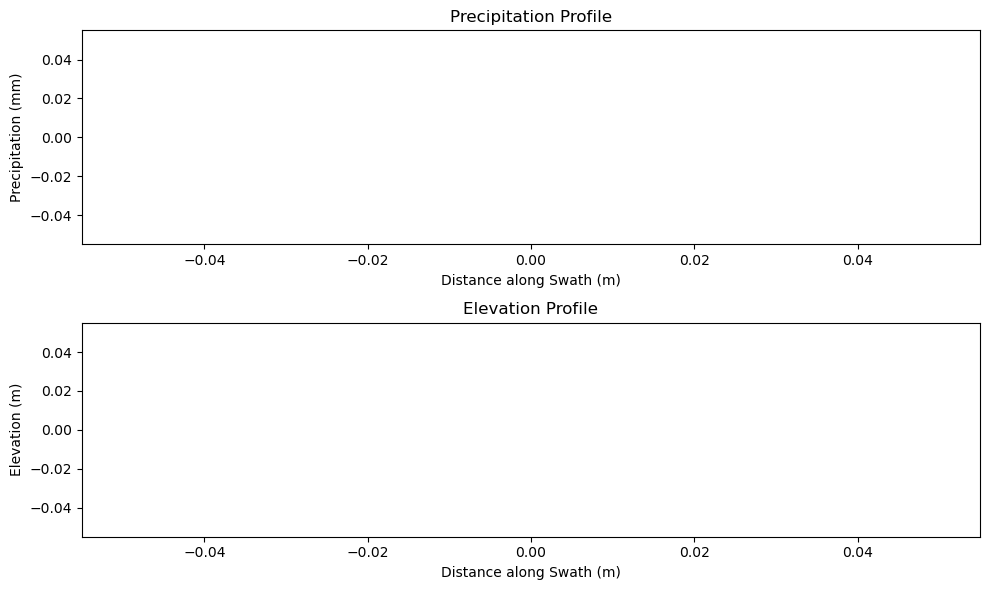

In [73]:
import matplotlib.pyplot as plt

# Plot the profiles
plt.figure(figsize=(10, 6))

# Plot the DEM profile
plt.subplot(2, 1, 1)
plt.plot(precip_profile, label="Precipitation (mm)", color='b')
plt.title('Precipitation Profile')
plt.xlabel("Distance along Swath (m)")
plt.ylabel("Precipitation (mm)")

# Plot the DEM profile
plt.subplot(2, 1, 2)
plt.plot(dem_profile, label="Elevation (m)", color='g')
plt.title('Elevation Profile')
plt.xlabel("Distance along Swath (m)")
plt.ylabel("Elevation (m)")

plt.tight_layout()
plt.show()


In [23]:
swath_gdf = swath_gdf.to_crs(dem.crs)
swath_gdf

,id,geometry
0,None,"LINESTRING (30704.062 3041793.628, -55904.263 ..."


In [23]:
width_topo = 50000
line_stepsize_topo = 100
width_precip = 50000
line_stepsize_precip = 100
ylim_topo = [0,6000]
xlim_topo = [0, 200000]
ylim_precip = [0,10000]
ylim_slope = [0, 90]
ylim_AFT = [0,20]

# Generate Swath

In [24]:
shape= 'swath_subanshiri_middle_proj.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/prayoga/prayoga/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/'+shape
raster = '/home/prayoga/prayoga/QGIS_prayoga/DEM@PRAYOGA/'+DEM
baseline
orig = pyosp.Orig_curv(baseline, raster, width=width_topo,
                       line_stepsize=line_stepsize_topo , cross_stepsize=None)

Processing: [#########################] 1734 of 1734 lineSteps

In [1]:
import matplotlib.pyplot as plt
from pyosp import read_shape

# read the baseline shape
line_shape = read_shape(baseline)
lx, ly = line_shape.xy

# Plot the swath polygon
fig, ax = plt.subplots()
swath_polygon = orig.out_polygon()
px, py = swath_polygon.exterior.xy
ax.plot(px, py)
ax.plot(lx, ly, color='C3', label="Baseline")
ax.set_aspect('equal', adjustable='box')
ax.set_title("Swath polygon")
ax.legend()

# Plot the swath profile lines
fig, ax = plt.subplots()
swath_polylines = orig.out_polylines()
for line in swath_polylines:
    x, y = line.xy
    ax.plot(x, y, color='C1')

ax.plot(lx, ly, color='C3', label="Baseline")
ax.set_aspect('equal', adjustable='box')
ax.set_title("Swath profile lines")
ax.legend()

NameError: name 'baseline' is not defined

In [26]:
import numpy as np
import gdal

ds = gdal.Open(raster)
data = ds.ReadAsArray()
gt = ds.GetGeoTransform()

xRes = gt[1]
yRes = gt[5]

# get the edge coordinates and add half the resolution
# to go to center coordinates
xmin = gt[0] + xRes * 0.5
xmax = gt[0] + (xRes * ds.RasterXSize) - xRes * 0.5
ymin = gt[3] + (yRes * ds.RasterYSize) + yRes * 0.5
ymax = gt[3] - yRes * 0.5

ds = None

# create a grid of xy coordinates
xy = np.mgrid[xmin:xmax+xRes:xRes, ymax+yRes:ymin:yRes]

fig, ax = plt.subplots()
ax.plot(px, py, color="gold", label='swath polygon')
im = ax.pcolormesh(xy[0], xy[1], data.T, cmap=plt.cm.terrain)
ax.plot(lx, ly, color='C3', label="Baseline")
ax.set_aspect('equal', adjustable='box')
ax.set_xlim([-10, 210])
ax.set_ylim([-10, 210])
plt.colorbar(im)

ModuleNotFoundError: No module named 'gdal'

In [15]:

baseline = pyosp.datasets.get_path(baseline) # the path to baseline shapefile
raster = pyosp.datasets.get_path(raster)  # the path to raster file

ValueError: The dataset '/home/prayoga/prayoga/QGIS_prayoga/shapefile_prayoga/Shape files/Mechuka_project_shape_2025/swath_subanshiri_middle.shp' is not available. Available datasets are homo_baseline.shp, homo_start_end.shp.xml, homo_baseline.sbx, homo_baseline.shp.xml, center.dbf, homo_start_end.dbf, homo_elev10.tfw, homo_start_end.sbn, checking_points.shp.xml, crater.tif, homo_start_end.shp, homo_baseline.dbf, crater.tif.aux.xml, homo_baselineOffset.sbn, homo_start_end.sbx, center.sbx, homo_start_end.shx, checking_points.shp, homo_elev10.tif.ovr, checking_points.CPG, homo_elev10.tif.aux.xml, homo_baselineOffset.CPG, tpi_valid.txt, homo_mount.tif, center.shp, center.shp.xml, checking_points.sbn, checking_points.shx, homo_baselineOffset.shp, homo_baselineOffset.shx, crater.tif.ovr, homo_baseline.shx, elev_valid.txt, homo_baselineOffset.sbx, cross_data.txt, homo_baseline.CPG, homo_elev10.tif, center.sbn, checking_points.dbf, center.shx, homo_start_end.CPG, center.CPG, homo_baseline.sbn, homo_baselineOffset.dbf, slope_valid.txt, crater.tfw, crater.tif.xml, checking_points.sbx

In [6]:
shape= 'swath_subanshiri_middle.shp'
DEM = 'projected_Eastern_Himalaya_Tibet_SRTM_30'
# baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
# raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM
baseline = '/home/prayoga/prayoga/QGIS_prayoga/DEM@PRAYOGA/projected_Eastern_Himalaya_Tibet_SRTM_30.tif/'+shape
raster = '/home/prayoga/prayoga/QGIS_prayoga/DEM@PRAYOGA/projected_Eastern_Himalaya_Tibet_SRTM_30.tif/'+DEM

baseline = pyosp.datasets.get_path("homo_baseline.shp") # the path to baseline shapefile
raster = pyosp.datasets.get_path("homo_mount.tif")  # the path to raster file

orig = pyosp.Orig_curv(baseline, raster, width=100,
                       line_stepsize=3, cross_stepsize=None)


Processing: [#########################] 71 of 71 lineSteps

/home/prayoga/anaconda3/envs/pyosp/lib/python3.13/site-packages/osgeo/ogr.py:601: FutureWarning: Neither ogr.UseExceptions() nor ogr.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


In [6]:
shape= 'subanshiri.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
# baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
# raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM
baseline = '/home/prayoga/prayoga/QGIS_prayoga/DEM@PRAYOGA/projected_Eastern_Himalaya_Tibet_SRTM_30.tif/'+shape
raster = '/home/prayoga/prayoga/QGIS_prayoga/DEM@PRAYOGA/projected_Eastern_Himalaya_Tibet_SRTM_30.tif/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_topo)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic Subanshiri swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/subanshiri_topography.pdf')

shape = 'subanshiri.shp'
TRMM = 'TRMM_subn_Dibang.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/QGIS work space/TRMM/Subanshiri_Dibang/'+TRMM
orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_precip, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_precip)
plt.xlim(xlim_topo)
plt.ylabel('Precipitation (mm/yr)')
plt.xlabel('Distane (m)')
plt.title('Precepitation Subanshiri swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/subanshiri_precipitation.pdf')


AFT = pd.read_csv("/home/biraj/Dropbox/Mechuka/Figure_Map_Table/Table/swath_subanshiri_AFT.csv")
plt.scatter(AFT.distance_km, AFT.Age)

/home/prayoga/anaconda3/envs/pyosp/lib/python3.13/site-packages/osgeo/ogr.py:601: FutureWarning: Neither ogr.UseExceptions() nor ogr.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


AttributeError: 'NoneType' object has no attribute 'GetLayer'

# AFT Sunbanshiri

In [16]:
AFT

,distance_km,age,erro,elevation,lithology,system
0,22.3,8.5,1.1,795,sandstone,NaN
1,25.2,4.7,0.8,728,gneiss,NaN
2,40.5,7.0,2.9,1213,granit+gnesis,NaN
3,48.5,10.0,1.1,1694,granit+gnesis,NaN
4,50.5,9.5,1.8,1406,phyllite,NaN
5,51.5,12.1,1.2,1449,granite+gneiss,NaN
6,53.5,5.0,0.8,316,not recorded,NaN
7,54.0,7.7,0.7,1169,gneiss,NaN
8,55.0,9.6,1.6,326,not recorded,NaN
9,57.0,14.4,1.3,368,not recorded,NaN


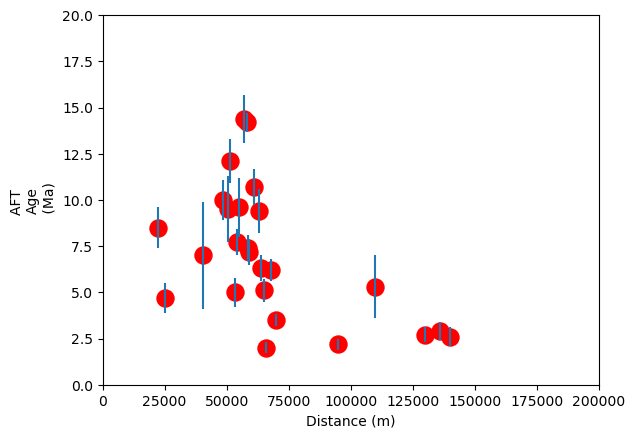

In [41]:
AFT = pd.read_csv("/home/biraj/Dropbox/Mechuka/Figure_Map_Table/Table/swath_subanshiri_AFT.csv")
plt.scatter(AFT.distance_km*1000, AFT.Age,  s =150, c= 'red')
plt.errorbar(AFT.distance_km*1000, AFT.Age, AFT.erro, fmt =' ')
plt.xlim(xlim_topo)
plt.ylim(ylim_AFT)
plt.ylabel('AFT \nAge\n (Ma)')
plt.xlabel('Distance (m)')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/subanshiri_AFT.pdf')

# siang

Processing: [#########################] 2065 of 2065 lineSteps

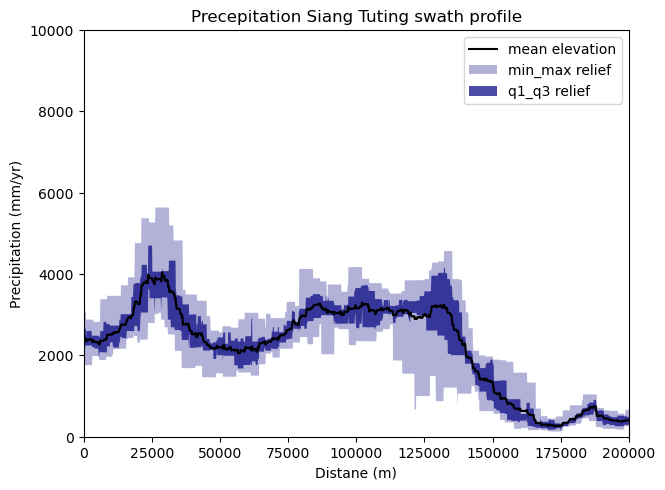

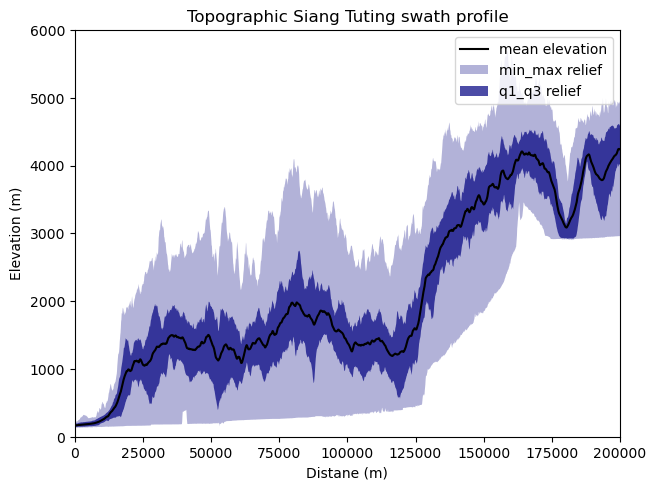

In [42]:
#####-------------------------------Prcipitation-----------------

shape= 'siang_tuting.shp'
TRMM = 'TRMM_subn_Dibang.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/QGIS work space/TRMM/Subanshiri_Dibang/'+TRMM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_precip, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_precip)
plt.xlim(xlim_topo)
plt.ylabel('Precipitation (mm/yr)')
plt.xlabel('Distane (m)')
plt.title('Precepitation Siang Tuting swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/siang-tuting_precipitation.pdf')
# -----------------------------------------Topography---------------------
shape= 'siang_tuting.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_topo)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic Siang Tuting swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/siang-tuting_topography.pdf')

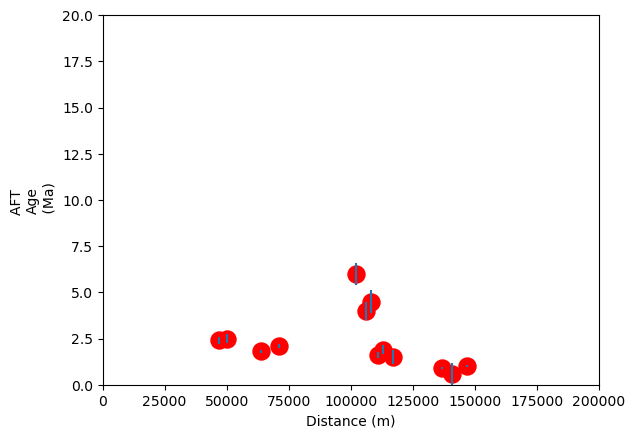

In [39]:
AFT = pd.read_csv("/home/biraj/Dropbox/Mechuka/Figure_Map_Table/Table/swath_siang_AFT.csv")
plt.scatter(AFT.distance_km*1000, AFT.Age, s =150, c= 'red')
plt.errorbar(AFT.distance_km*1000, AFT.Age, AFT.erro, fmt =' ')
plt.xlim(xlim_topo)
plt.ylim(ylim_AFT)
plt.ylabel('AFT \nAge\n (Ma)')
plt.xlabel('Distance (m)')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/siang_AFT.pdf')

Processing: [#########################] 232 of 232 lineSteps

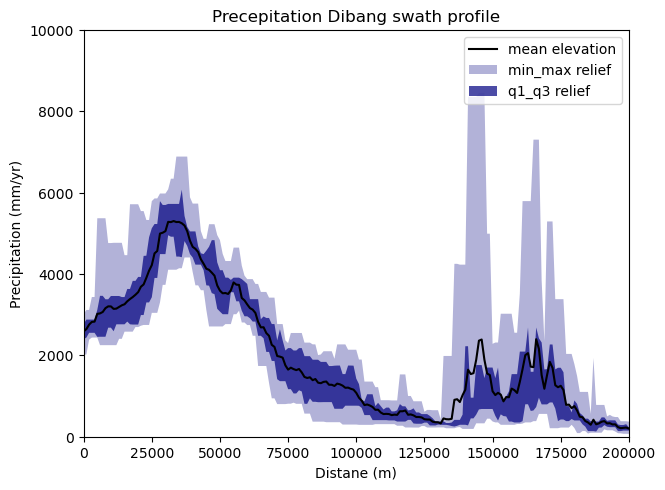

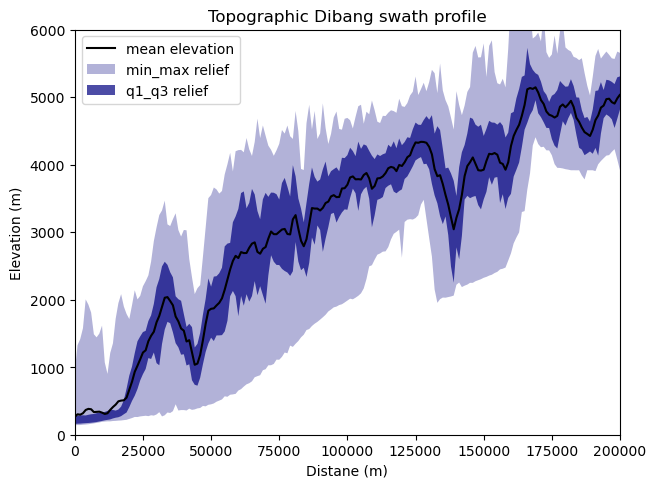

In [25]:
#--------------------------------------Prcipitation-----------------
shape= 'dibang_swath.shp'
TRMM = 'TRMM_subn_Dibang.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/QGIS work space/TRMM/Subanshiri_Dibang/'+TRMM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_precip, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_precip)
plt.xlim(xlim_topo)

plt.ylabel('Precipitation (mm/yr)')
plt.xlabel('Distane (m)')
plt.title('Precepitation Dibang swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/dibang-precipitation.pdf')


# -----------------------------------------Topography---------------------
shape= 'dibang_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_topo)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic Dibang swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/dibang_topography.pdf')


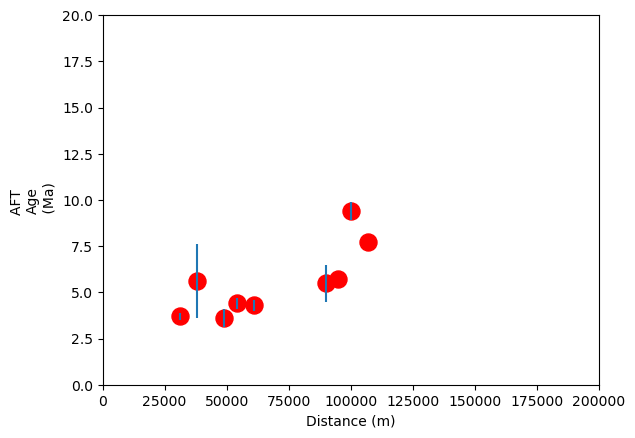

In [38]:
AFT = pd.read_csv("/home/biraj/Dropbox/Mechuka/Figure_Map_Table/Table/swath_dibang_AFT.csv")
plt.scatter(AFT.distance_km*1000, AFT.Age, s =150, c= 'red')
plt.errorbar(AFT.distance_km*1000, AFT.Age, AFT.erro, fmt =' ')
plt.xlim(xlim_topo)
plt.ylim(ylim_AFT)
plt.ylabel('AFT \nAge\n (Ma)')
plt.xlabel('Distance (m)')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/dibang_AFT.pdf')

Processing: [#########################] 2208 of 2208 lineSteps

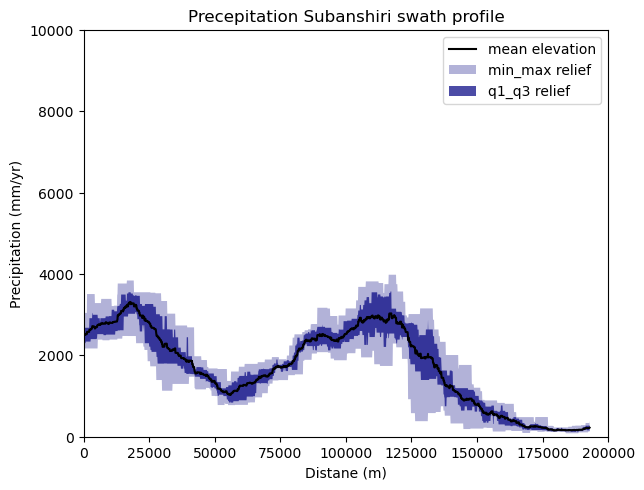

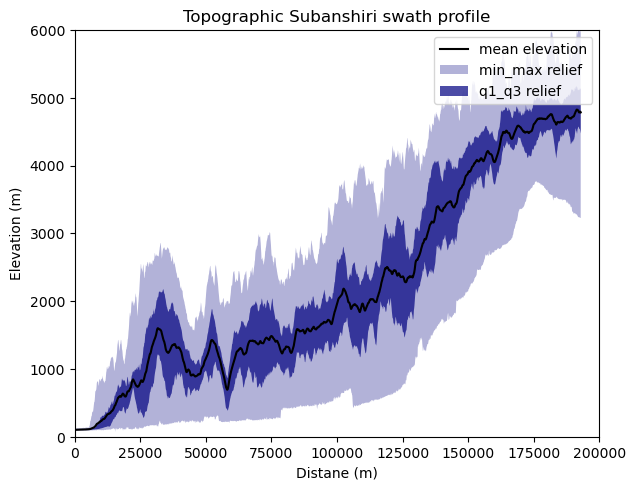

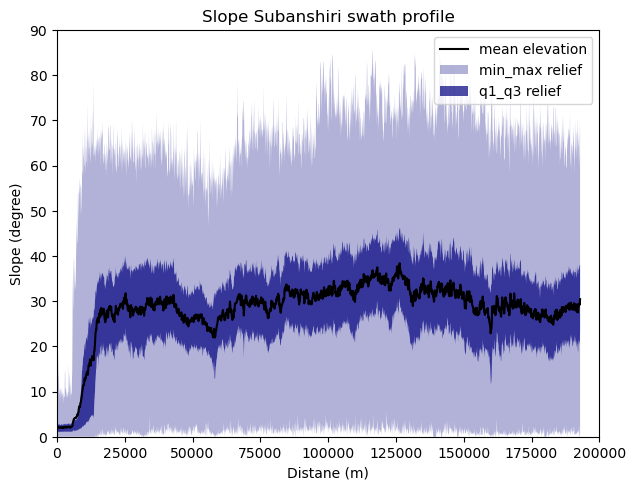

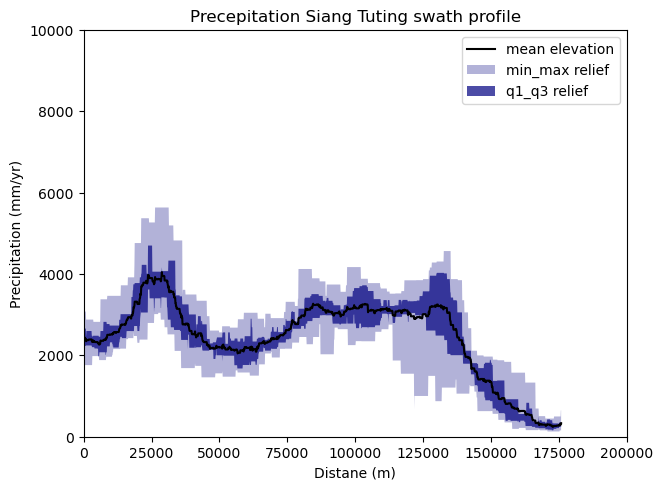

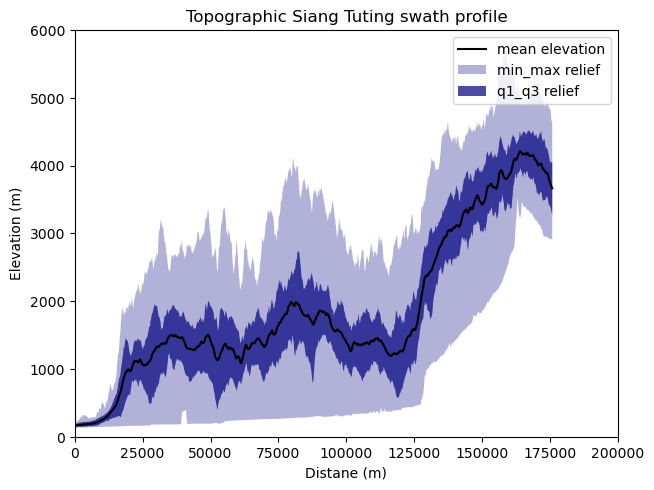

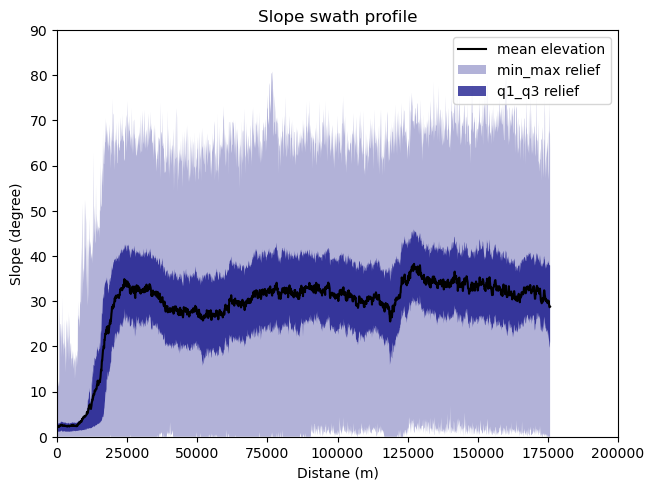

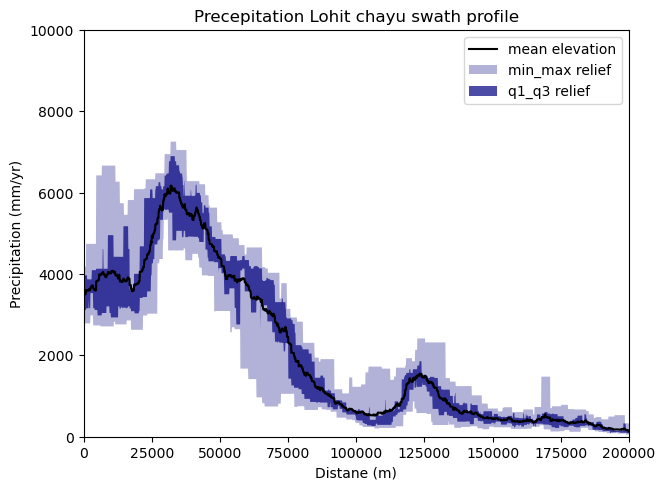

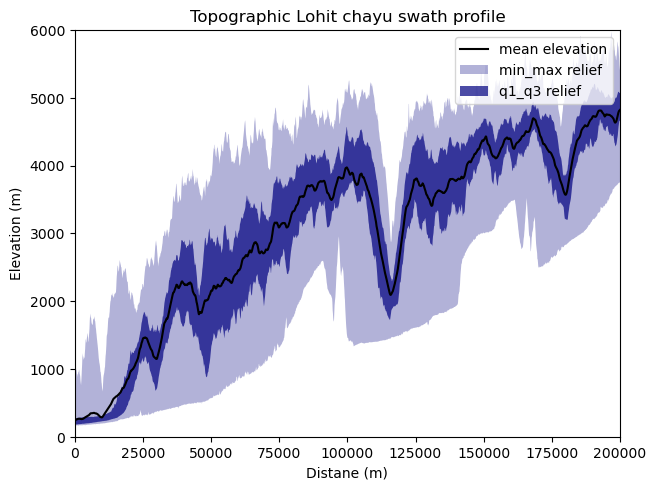

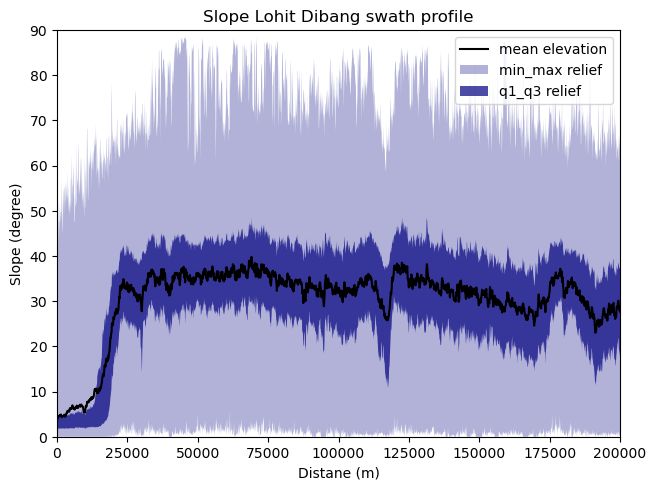

In [28]:
# nrows = 3
# ncols = 3
# plotnumber = 1
# fig = plt.figure()
# fig.set_size_inches(8.25,11.75) # A4 size
# fig.subplots_adjust(hspace=0.25, wspace= 0.05)

# plt.subplot(nrows, ncols, plotnumber)
# plotnumber = plotnumber +1

############## ------------------------------Subanshiri--------------------------------###
#-------------------------------------------Precipitation
shape = 'subanshiri.shp'
TRMM = 'TRMM_subn_Dibang.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/QGIS work space/TRMM/Subanshiri_Dibang/'+TRMM
orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_precip, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_precip)
plt.xlim(xlim_topo)
plt.ylabel('Precipitation (mm/yr)')
plt.xlabel('Distane (m)')
plt.title('Precepitation Subanshiri swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/subanshiri_precipitation.pdf')

# -----------------------------------------Topography
shape= 'subanshiri.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_topo)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic Subanshiri swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/subanshiri_topography.pdf')

###-------------------------------------Slope---------------------------
shape= 'subanshiri.shp'
DEM = 'slope_projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_slope)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Slope (degree)')
plt.title('Slope Subanshiri swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/subanshiri_slope.pdf')

############---------------------------Siang Tuting--------------------#######
# plt.subplot(nrows, ncols, plotnumber)
# plotnumber = plotnumber +2

#####-------------------------------Prcipitation-----------------

shape= 'siang_tuting.shp'
TRMM = 'TRMM_subn_Dibang.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/QGIS work space/TRMM/Subanshiri_Dibang/'+TRMM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_precip, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_precip)
plt.xlim(xlim_topo)
plt.ylabel('Precipitation (mm/yr)')
plt.xlabel('Distane (m)')
plt.title('Precepitation Siang Tuting swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/siang-tuting_precipitation.pdf')
# -----------------------------------------Topography---------------------
shape= 'siang_tuting.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_topo)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic Siang Tuting swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/siang-tuting_topography.pdf')
# -----------------------------------------Slope---------------------
shape= 'siang_tuting.shp'
DEM = 'slope_projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_slope)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Slope (degree)')
plt.title('Slope swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/siang-tuting_slope.pdf')

############---------------------------Lohit-Dibang--------------------#######
# plt.subplot(nrows, ncols, plotnumber)
# plotnumber = plotnumber +3

#--------------------------------------Prcipitation-----------------
shape= 'Lohit_swath.shp'
TRMM = 'TRMM_subn_Dibang.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/QGIS work space/TRMM/Subanshiri_Dibang/'+TRMM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_precip, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_precip)
plt.xlim(xlim_topo)

plt.ylabel('Precipitation (mm/yr)')
plt.xlabel('Distane (m)')
plt.title('Precepitation Lohit chayu swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/lohit-dibang-precipitation.pdf')


# -----------------------------------------Topography---------------------
shape= 'Lohit_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_topo)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic Lohit chayu swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/lohit-dibang_topography.pdf')

# -----------------------------------------Slope---------------------
shape= 'Lohit_swath.shp'
DEM = 'slope_projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_slope)
plt.xlim(xlim_topo)

plt.xlabel('Distane (m)')
plt.ylabel('Slope (degree)')
plt.title('Slope Lohit Dibang swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/lohit-dibag_slope.pdf')



# Subanshiri

### Topography swath profile

Processing: [#########################] 97 of 97 lineSteps

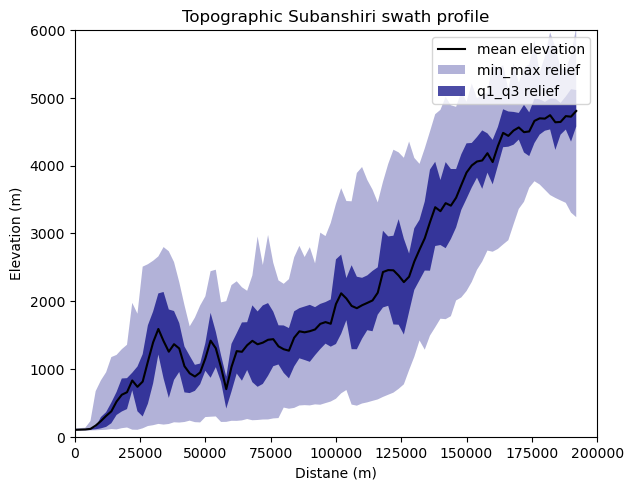

In [6]:
shape= 'subanshiri.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_topo)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic Subanshiri swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/subanshiri_topography.pdf')

### Precipitation

Processing: [#########################] 1930 of 1930 lineSteps

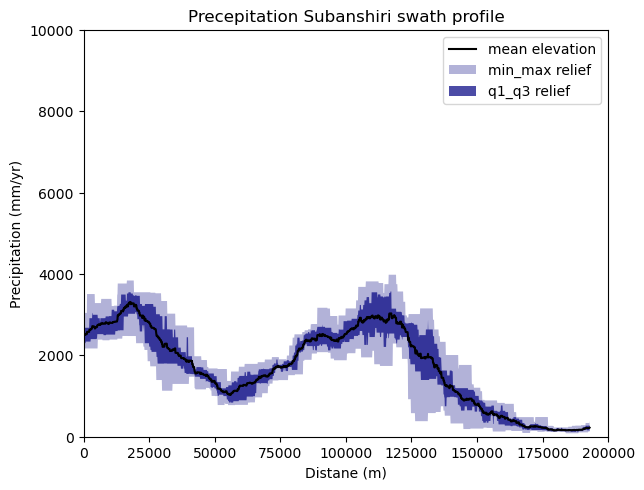

In [20]:
shape = 'subanshiri.shp'
TRMM = 'TRMM_subn_Dibang.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/QGIS work space/TRMM/Subanshiri_Dibang/'+TRMM
orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_precip, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_precip)
plt.xlim(xlim_topo)
plt.ylabel('Precipitation (mm/yr)')
plt.xlabel('Distane (m)')
plt.title('Precepitation Subanshiri swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/subanshiri_precititation.pdf')

### Slope

Processing: [#########################] 193 of 193 lineSteps

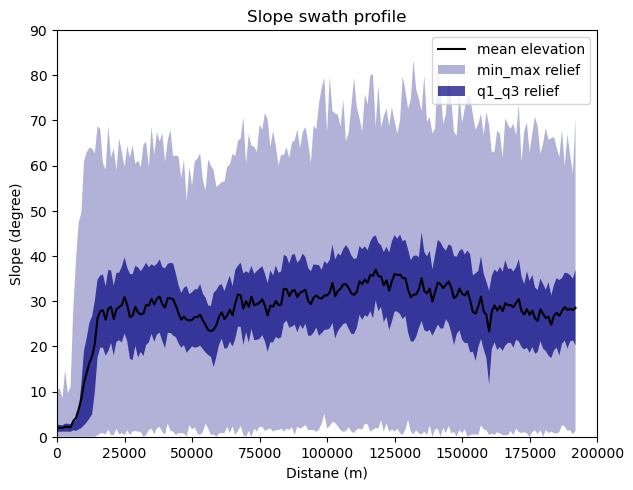

In [22]:
shape= 'subanshiri.shp'
DEM = 'slope_projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_slope)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Slope (degree)')
plt.title('Slope Subanshiri swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/Subanshiri_Slope.pdf')

# Lohit-Dibang valley

### Topography swath


Processing: [#########################] 221 of 221 lineSteps

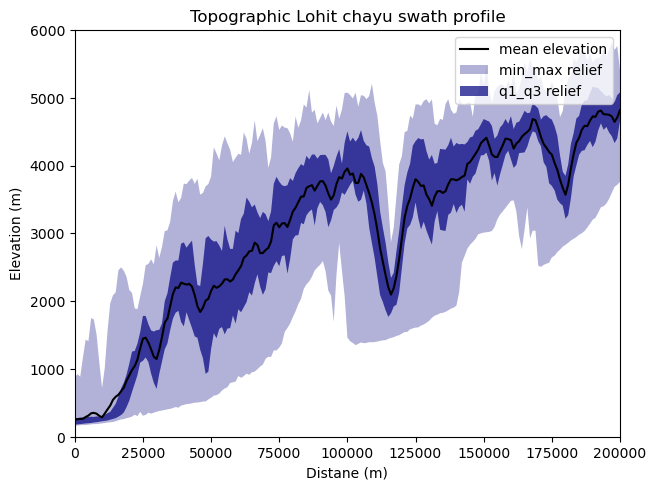

In [13]:
shape= 'Lohit_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_topo)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic Lohit chayu swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/Lohit_Topography.pdf')

### Precipitation

Processing: [#########################] 221 of 221 lineSteps

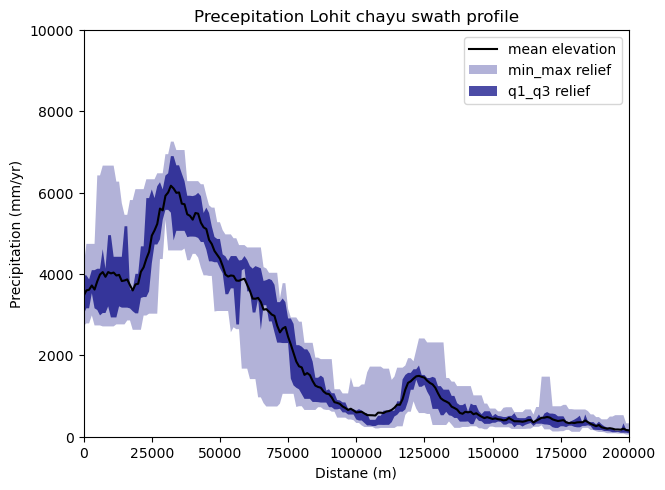

In [6]:
shape= 'Lohit_swath.shp'
TRMM = 'TRMM_subn_Dibang.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/QGIS work space/TRMM/Subanshiri_Dibang/'+TRMM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_precip, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_precip)
plt.xlim(xlim_topo)

plt.ylabel('Precipitation (mm/yr)')
plt.xlabel('Distane (m)')
plt.title('Precepitation Lohit chayu swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/Lohit_precipititation.pdf')

### Slope

Processing: [#########################] 2208 of 2208 lineSteps

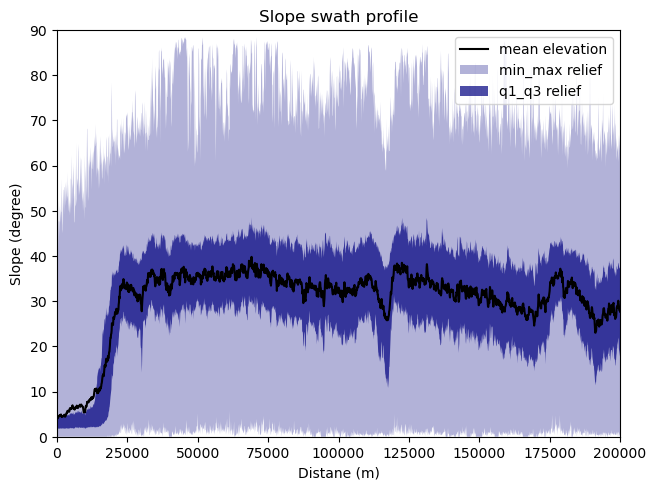

In [7]:
shape= 'Lohit_swath.shp'
DEM = 'slope_projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_slope)
plt.xlim(xlim_topo)

plt.xlabel('Distane (m)')
plt.ylabel('Slope (degree)')
plt.title('Slope Lohit Dibang swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/Lohit_Slope.pdf')

# Siang Mechuka Topography

### Topography swath

Processing: [#########################] 96 of 96 lineSteps

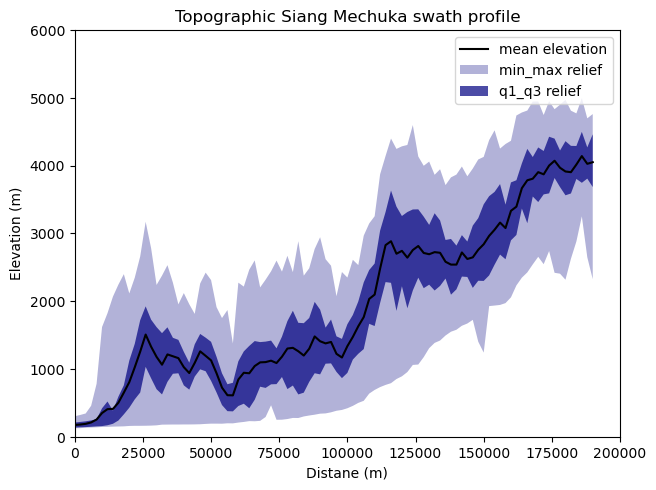

In [8]:
shape= 'siang_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_topo)
plt.xlim(xlim_topo)

plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic Siang Mechuka swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/Siang_Mechuka_Topography.pdf')

Processing: [#########################] 96 of 96 lineSteps

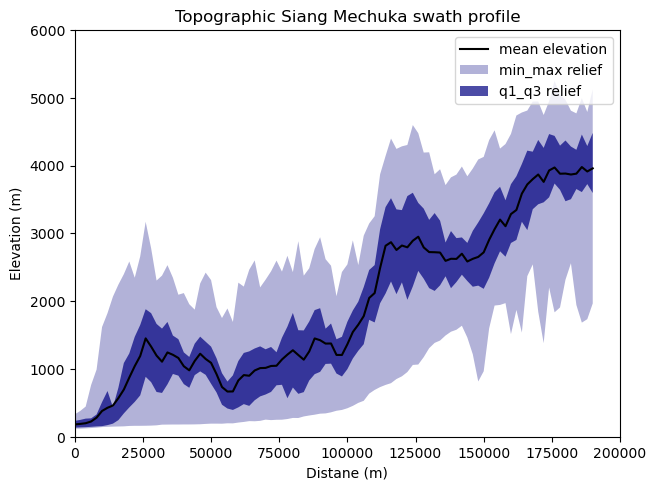

In [9]:
shape= 'siang_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_topo)
plt.xlim(xlim_topo)

plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic Siang Mechuka swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/Siang_Mechuka_Topography.pdf')

In [ ]:
slope = pyosp.Slope_curv(baseline, raster, width=100,
                         min_slope=1,
                         line_stepsize=30, cross_stepsize=None)

Processing: [-------------------------] 2 of 6361 lineSteps

### Precipitation

Processing: [#########################] 1909 of 1909 lineSteps

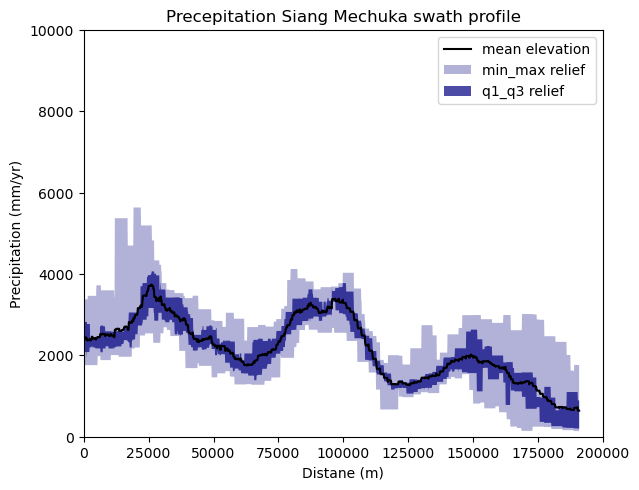

In [21]:
shape= 'siang_swath.shp'
TRMM = 'TRMM_subn_Dibang.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/QGIS work space/TRMM/Subanshiri_Dibang/'+TRMM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_precip, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_precip)
plt.xlim(xlim_topo)

plt.ylabel('Precipitation (mm/yr)')
plt.xlabel('Distane (m)')
plt.title('Precepitation Siang Mechuka swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/Siang_Mechuka_precititation.pdf')

### Slope

Processing: [#########################] 1909 of 1909 lineSteps

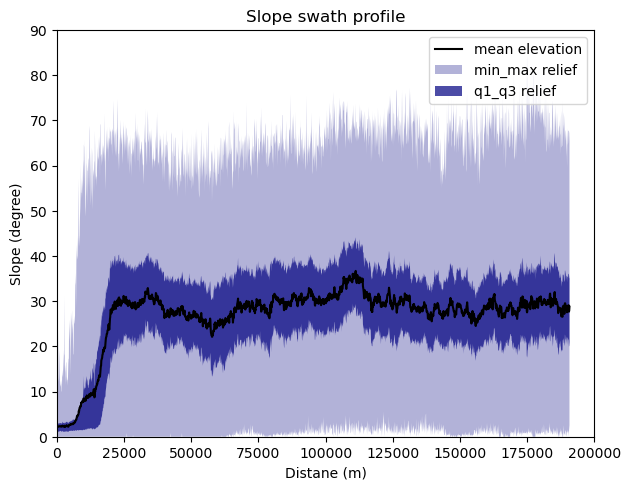

In [10]:
shape= 'siang_swath.shp'
DEM = 'slope_projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_slope)
plt.xlim(xlim_topo)

plt.xlabel('Distane (m)')
plt.ylabel('Slope (degree)')
plt.title('Slope Siang Mechuka swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/Siang_Mechuka_Slope.pdf')

# Bhutan 

Processing: [#########################] 269 of 269 lineSteps

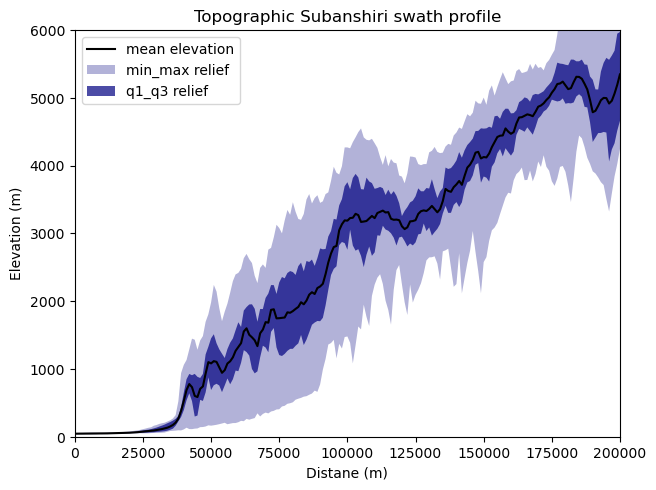

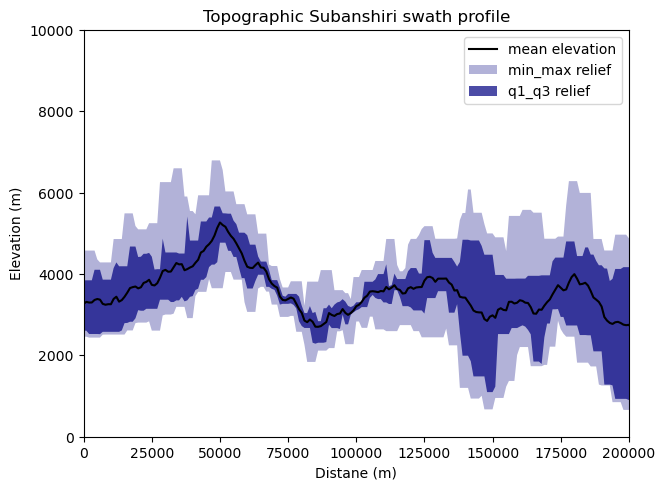

In [12]:
shape= 'bhutan_BS.shp'
DEM = 'bhutan_whole_projected.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Bhutan_DEM/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_topo)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic Bhutan swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/bhutan_BS_topography.pdf')

shape= 'bhutan_BS.shp'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
TRMM = 'TRMM_subn_Dibang.tif'
raster = '/home/biraj/Dropbox/GitHub/QGIS work space/TRMM/Subanshiri_Dibang/'+TRMM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_precip, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_precip)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Precipitation Bhutan swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/bhutan_BS_precipitation.pdf')

# Dibang valley

### Topographic swath profile

In [ ]:
shape= 'dibang_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_topo)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic Dibang swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/Dibang_Topography.pdf')

### Precipitation

Processing: [#########################] 2316 of 2316 lineSteps

Text(0.5, 1.0, 'Precepitation Dibang swath profile')

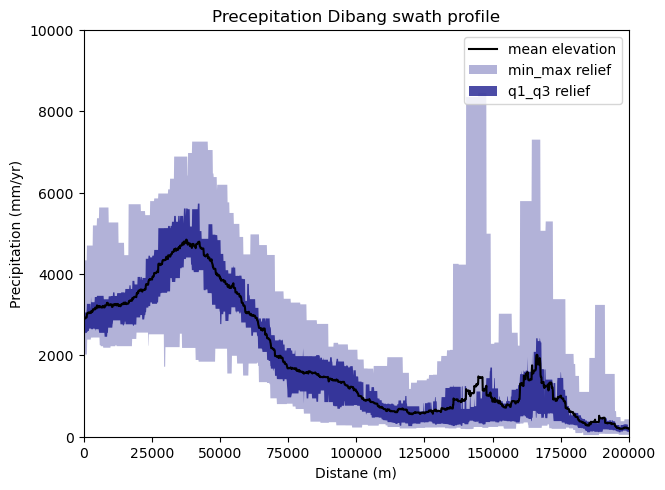

In [11]:
shape= 'dibang_swath.shp'
TRMM = 'TRMM_subn_Dibang.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/QGIS work space/TRMM/Subanshiri_Dibang/'+TRMM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_precip, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_precip)
plt.xlim(xlim_topo)
plt.ylabel('Precipitation (mm/yr)')
plt.xlabel('Distane (m)')
plt.title('Precepitation Dibang swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/Dibang_Topography.pdf')

### Slope

In [ ]:
shape= 'dibang_swath.shp'
DEM = 'slope_projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_slope)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Slope (degree)')
plt.title('Slope swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/Dibang_Slope.pdf')

# Kameng topography

### Topography

Processing: [#########################] 2107 of 2107 lineSteps

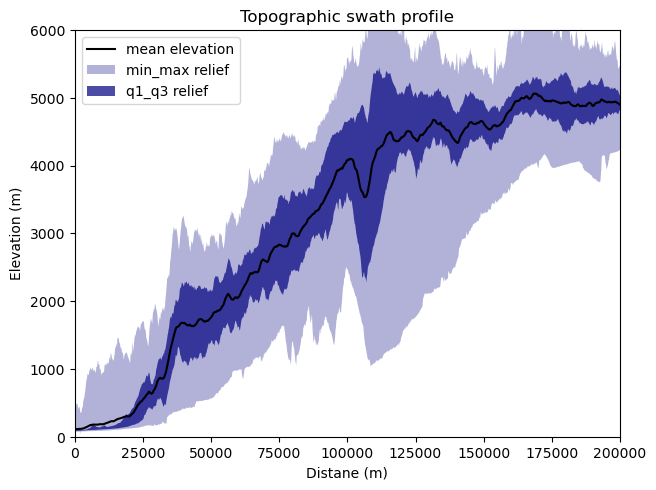

In [19]:
shape= 'kameng_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_topo)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic Kameng swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/kameng_Topography.pdf')

### Precipitation

Processing: [#########################] 211 of 211 lineSteps

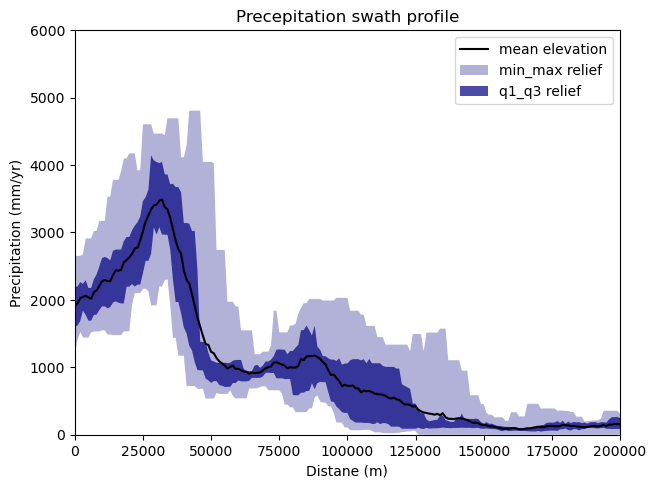

In [18]:
shape= 'kameng_swath.shp'
TRMM = 'TRMM_subn_Dibang.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/QGIS work space/TRMM/Subanshiri_Dibang/'+TRMM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_precip, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_precip)
plt.xlim(xlim_topo)
plt.ylabel('Precipitation (mm/yr)')
plt.xlabel('Distane (m)')
plt.title('Precepitation Kameng swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/kamen_Precipitation.pdf')

## Slope

Processing: [#########################] 2107 of 2107 lineSteps

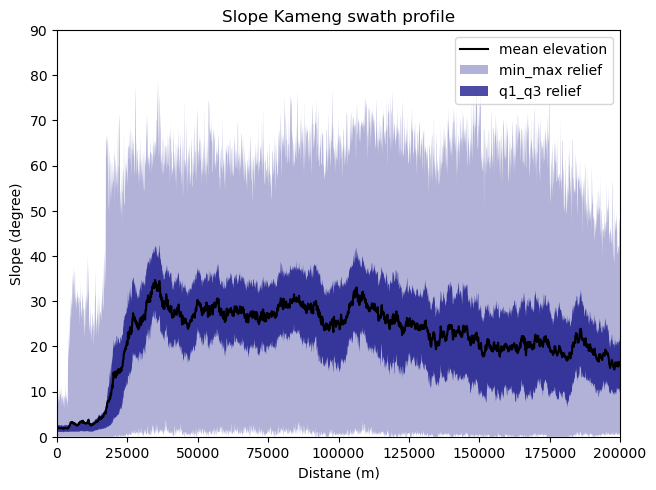

In [11]:
shape= 'kameng_swath.shp'
DEM = 'slope_projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_slope)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Slope (degree)')
plt.title('Slope Kameng swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/Kameng_Slope.pdf')

# Siang Tuting

### Topography

Processing: [#########################] 88 of 88 lineSteps

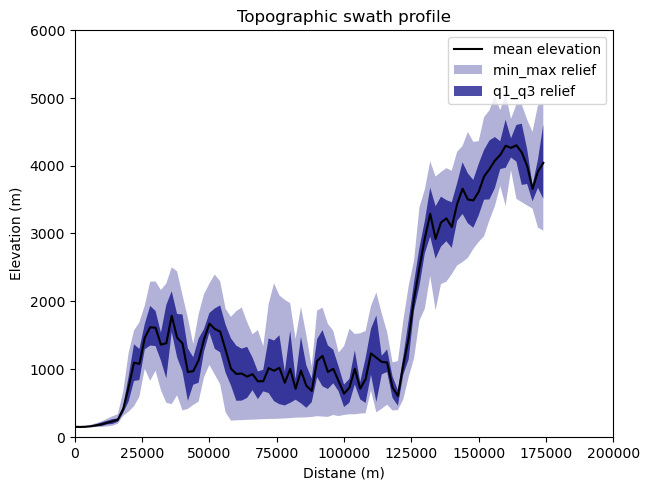

In [21]:
shape= 'siang_tuting.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_topo)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic Siang Tuting swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/Siang_Tuting_Topography.pdf')

### Precipitation

Processing: [#########################] 88 of 88 lineSteps

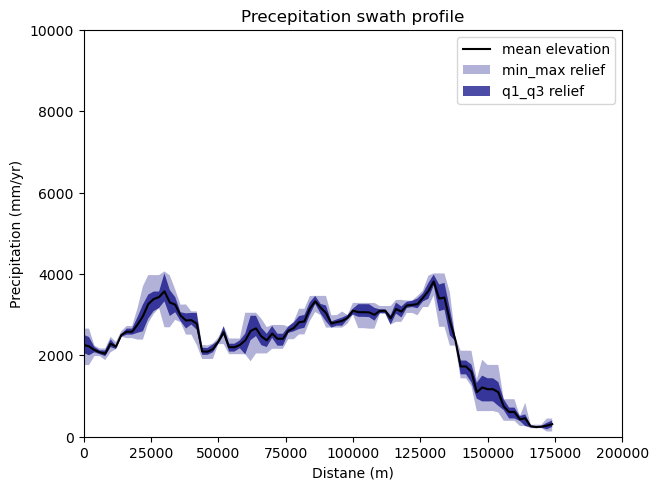

In [22]:
shape= 'siang_tuting.shp'
TRMM = 'TRMM_subn_Dibang.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/QGIS work space/TRMM/Subanshiri_Dibang/'+TRMM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_precip, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_precip)
plt.xlim(xlim_topo)
plt.ylabel('Precipitation (mm/yr)')
plt.xlabel('Distane (m)')
plt.title('Precepitation Siang Tuting swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/siang_tuting_Precipitation.pdf')

### Slope

Processing: [#########################] 1759 of 1759 lineSteps

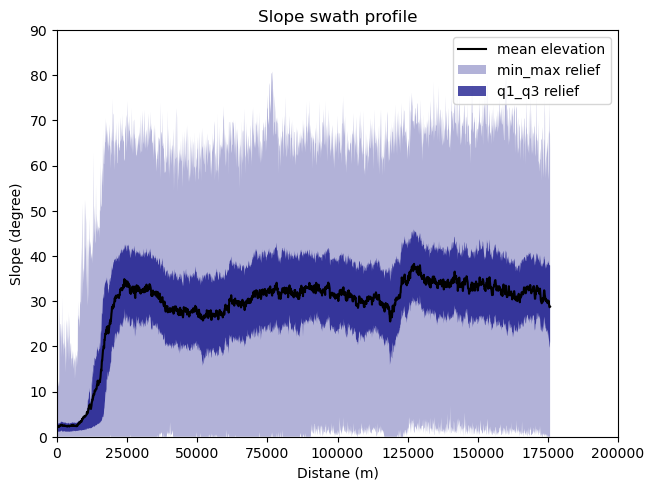

In [24]:
shape= 'siang_tuting.shp'
DEM = 'slope_projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width= width_topo,
                       line_stepsize= line_stepsize_topo, cross_stepsize=None)
orig.profile_plot()
plt.ylim(ylim_slope)
plt.xlim(xlim_topo)
plt.xlabel('Distane (m)')
plt.ylabel('Slope (degree)')
plt.title('Slope swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/siang_tuting_Slope.pdf')

# Testing different combinations of steps and width

Processing: [#########################] 106 of 106 lineSteps

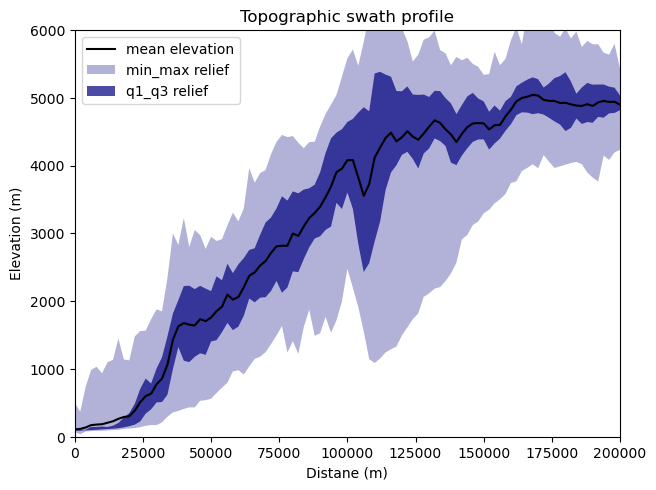

In [21]:
shape= 'kameng_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width=100000,
                       line_stepsize=2000, cross_stepsize=None)
orig.profile_plot()
plt.ylim([0,6000])
plt.xlim([0,200000])
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/kameng_Topography.pdf')

Processing: [#########################] 211 of 211 lineSteps

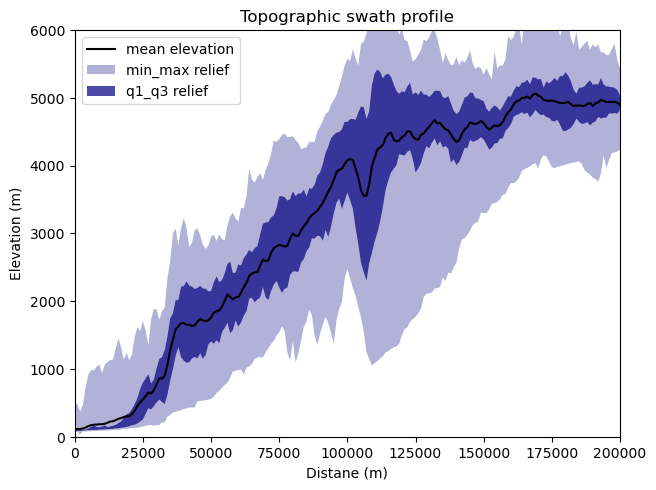

In [22]:
shape= 'kameng_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width=100000,
                       line_stepsize=1000, cross_stepsize=None)
orig.profile_plot()
plt.ylim([0,6000])
plt.xlim([0,200000])
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/kameng_Topography.pdf')

Processing: [#########################] 422 of 422 lineSteps

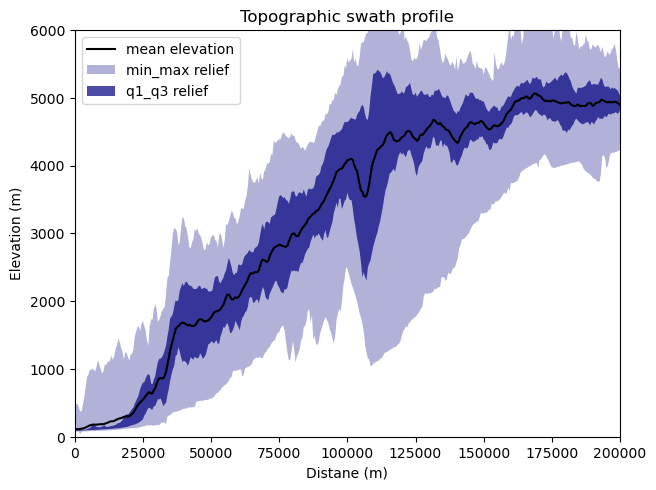

In [23]:
shape= 'kameng_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width=100000,
                       line_stepsize=500, cross_stepsize=None)
orig.profile_plot()
plt.ylim([0,6000])
plt.xlim([0,200000])
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/kameng_Topography.pdf')

Processing: [#########################] 1054 of 1054 lineSteps

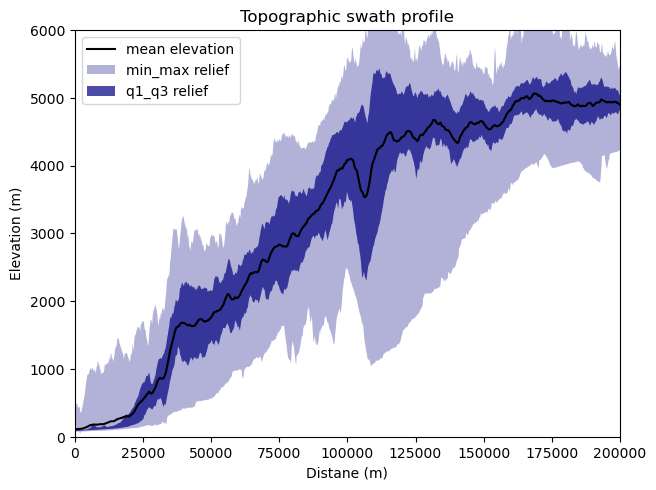

In [24]:
shape= 'kameng_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width=100000,
                       line_stepsize=200, cross_stepsize=None)
orig.profile_plot()
plt.ylim([0,6000])
plt.xlim([0,200000])
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/kameng_Topography.pdf')

Processing: [#########################] 2107 of 2107 lineSteps

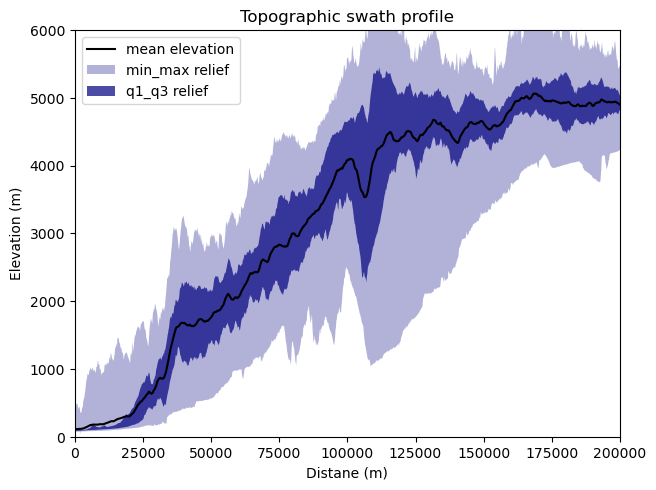

In [25]:
shape= 'kameng_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width=100000,
                       line_stepsize=100, cross_stepsize=None)
orig.profile_plot()
plt.ylim([0,6000])
plt.xlim([0,200000])
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/kameng_Topography.pdf')

Processing: [#########################] 106 of 106 lineSteps

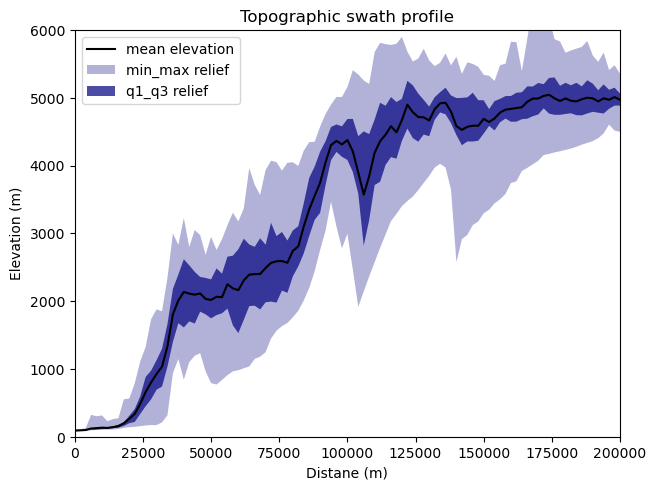

In [37]:
shape= 'kameng_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width=50000,
                       line_stepsize=2000, cross_stepsize=None)
orig.profile_plot()
plt.ylim([0,6000])
plt.xlim([0,200000])
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic kameng swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/kameng_Topography.pdf')

Processing: [#########################] 211 of 211 lineSteps

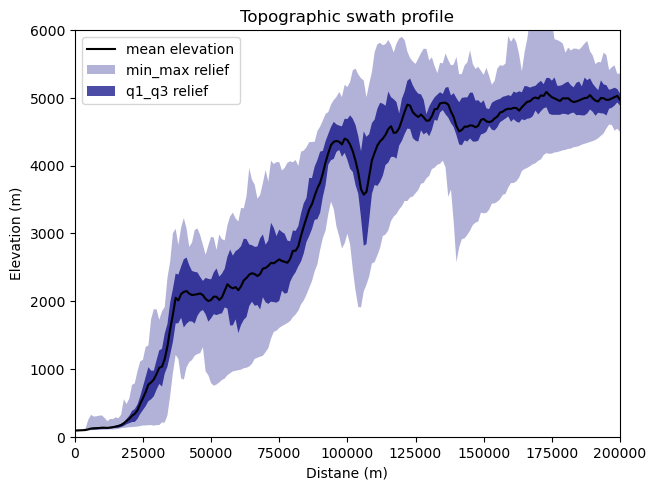

In [38]:
shape= 'kameng_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width=50000,
                       line_stepsize=1000, cross_stepsize=None)
orig.profile_plot()
plt.ylim([0,6000])
plt.xlim([0,200000])
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/kameng_Topography.pdf')

Processing: [#########################] 422 of 422 lineSteps

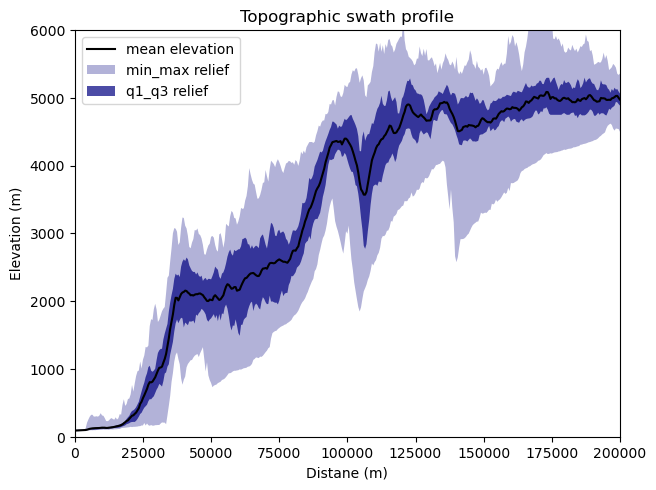

In [39]:
shape= 'kameng_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width=50000,
                       line_stepsize=500, cross_stepsize=None)
orig.profile_plot()
plt.ylim([0,6000])
plt.xlim([0,200000])
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/kameng_Topography.pdf')

Processing: [#########################] 1054 of 1054 lineSteps

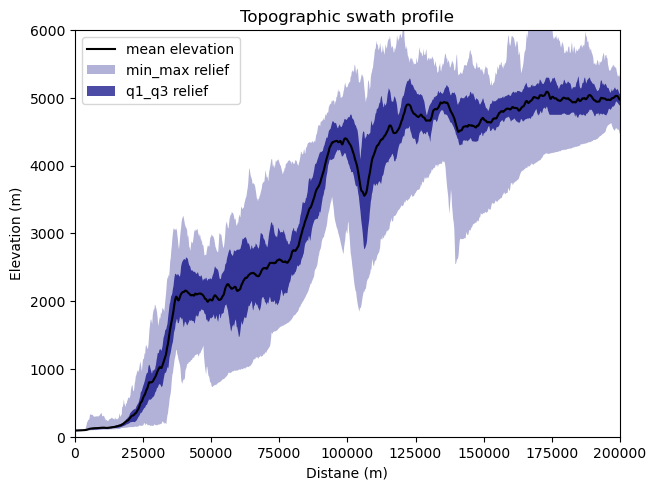

In [40]:
shape= 'kameng_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width=50000,
                       line_stepsize=200, cross_stepsize=None)
orig.profile_plot()
plt.ylim([0,6000])
plt.xlim([0,200000])
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/kameng_Topography.pdf')

Processing: [#########################] 2107 of 2107 lineSteps

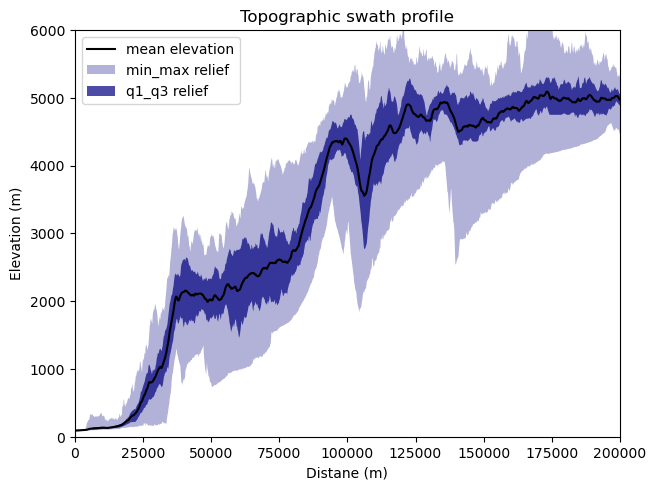

In [41]:
shape= 'kameng_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width=50000,
                       line_stepsize=100, cross_stepsize=None)
orig.profile_plot()
plt.ylim([0,6000])
plt.xlim([0,200000])
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/kameng_Topography.pdf')

Processing: [#########################] 106 of 106 lineSteps

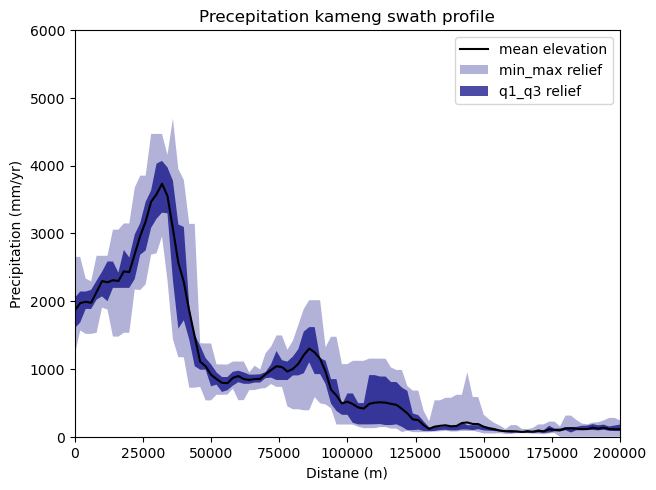

In [42]:
shape= 'kameng_swath.shp'
TRMM = 'TRMM_subn_Dibang.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/QGIS work space/TRMM/Subanshiri_Dibang/'+TRMM

orig = pyosp.Orig_curv(baseline, raster, width=50000,
                       line_stepsize=2000,  cross_stepsize=None)
orig.profile_plot()
plt.ylim([0,6000])
plt.xlim([0,200000])
plt.ylabel('Precipitation (mm/yr)')
plt.xlabel('Distane (m)')
plt.title('Precepitation kameng swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/kamen_Precipitation.pdf')

Processing: [#########################] 211 of 211 lineSteps

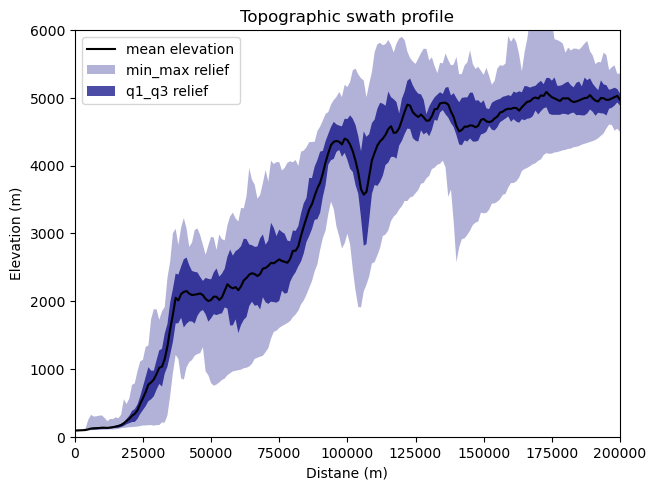

In [43]:
shape= 'kameng_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width=50000,
                       line_stepsize=1000, cross_stepsize=None)
orig.profile_plot()
plt.ylim([0,6000])
plt.xlim([0,200000])
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/kameng_Topography.pdf')

Processing: [#########################] 422 of 422 lineSteps

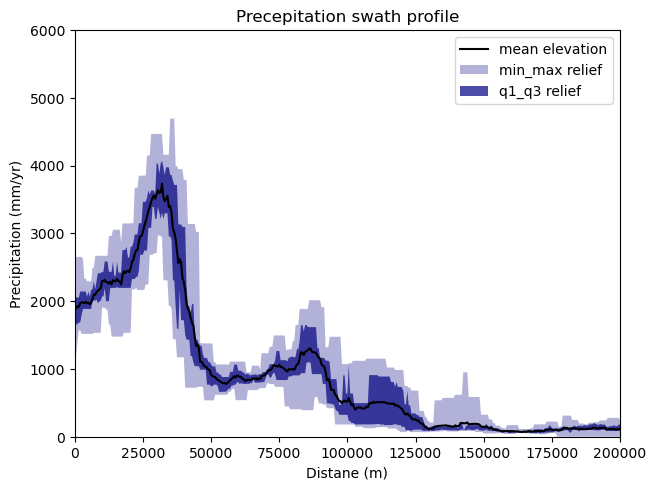

In [44]:
shape= 'kameng_swath.shp'
TRMM = 'TRMM_subn_Dibang.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/QGIS work space/TRMM/Subanshiri_Dibang/'+TRMM

orig = pyosp.Orig_curv(baseline, raster, width=50000,
                       line_stepsize=500,  cross_stepsize=None)
orig.profile_plot()
plt.ylim([0,6000])
plt.xlim([0,200000])
plt.ylabel('Precipitation (mm/yr)')
plt.xlabel('Distane (m)')
plt.title('Precepitation swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/kamen_Precipitation.pdf')

Processing: [#########################] 1054 of 1054 lineSteps

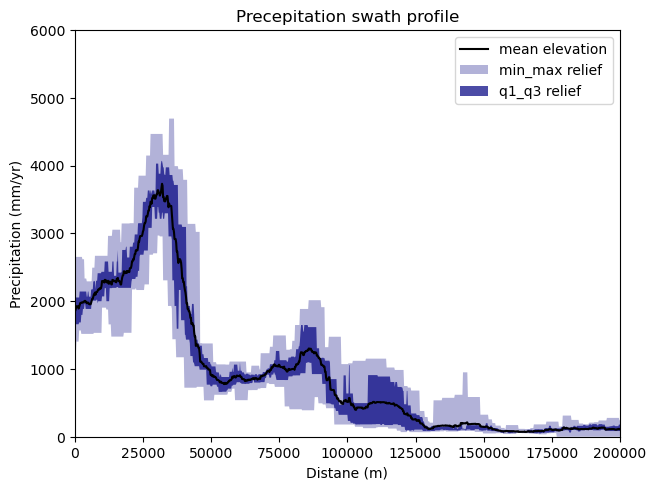

In [45]:
shape= 'kameng_swath.shp'
TRMM = 'TRMM_subn_Dibang.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/QGIS work space/TRMM/Subanshiri_Dibang/'+TRMM

orig = pyosp.Orig_curv(baseline, raster, width=50000,
                       line_stepsize=200,  cross_stepsize=None)
orig.profile_plot()
plt.ylim([0,6000])
plt.xlim([0,200000])
plt.ylabel('Precipitation (mm/yr)')
plt.xlabel('Distane (m)')
plt.title('Precepitation swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/kamen_Precipitation.pdf')

# Slope

Processing: [#########################] 211 of 211 lineSteps

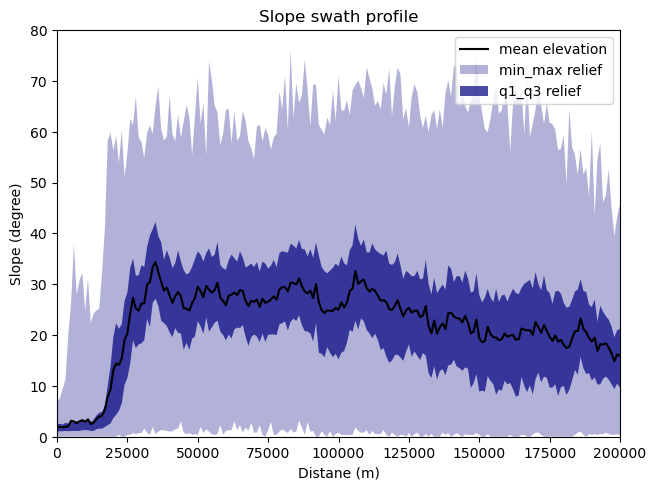

In [16]:
shape= 'kameng_swath.shp'
DEM = 'slope_projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM

orig = pyosp.Orig_curv(baseline, raster, width=50000,
                       line_stepsize=1000, cross_stepsize=None)
orig.profile_plot()
plt.ylim([0,80])
plt.xlim([0,200000])
plt.xlabel('Distane (m)')
plt.ylabel('Slope (degree)')
plt.title('Slope swath profile')
plt.savefig('/home/biraj/Dropbox/Mechuka/Figure_Map_Table/kameng_Slope.pdf')

Text(0.5, 1.0, 'Topographic swath profile')

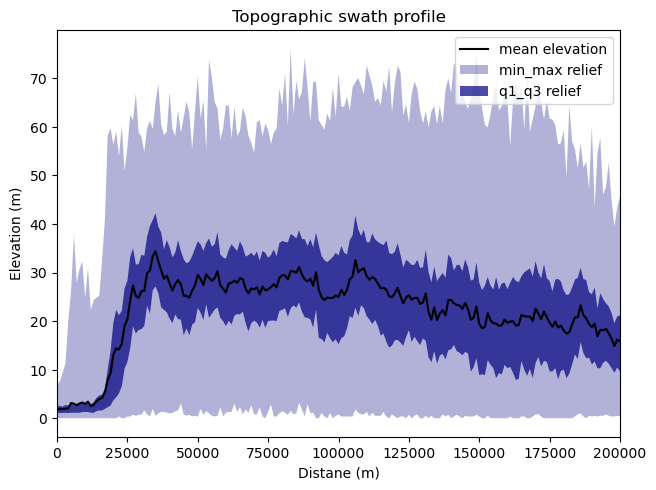

In [14]:
orig.profile_plot()
#plt.ylim([0,6000])
plt.xlim([0,200000])
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic swath profile')

# Bhutan BS 

Processing: [#########################] 269 of 269 lineSteps

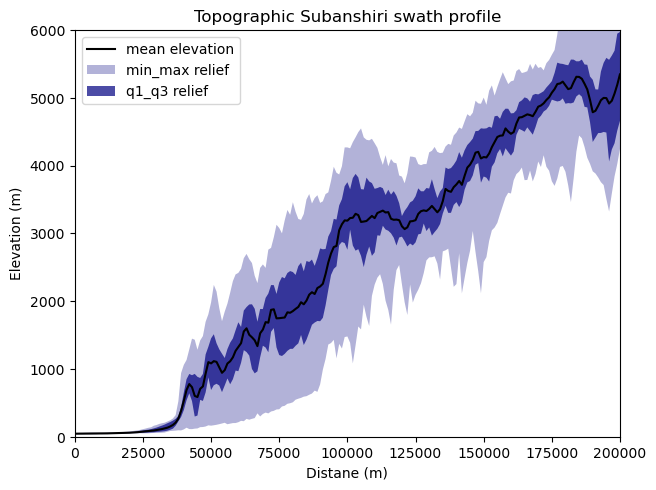

# Prcipitation

Processing: [#########################] 269 of 269 lineSteps

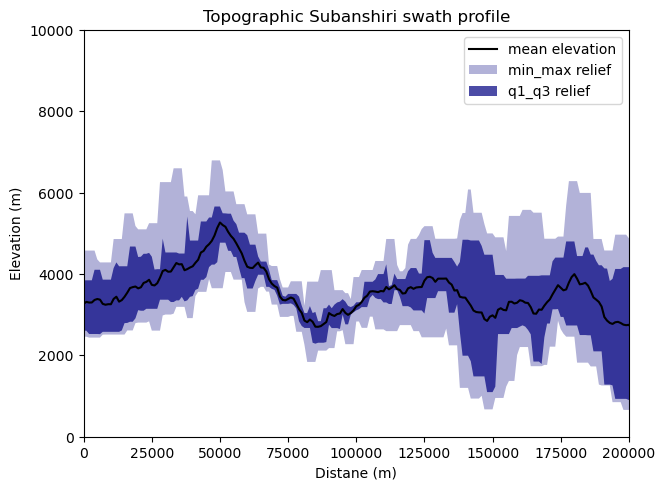

# Combine two plot

Processing: [#########################] 106 of 106 lineSteps

Text(0.5, 1.0, 'Topographic swath profile')

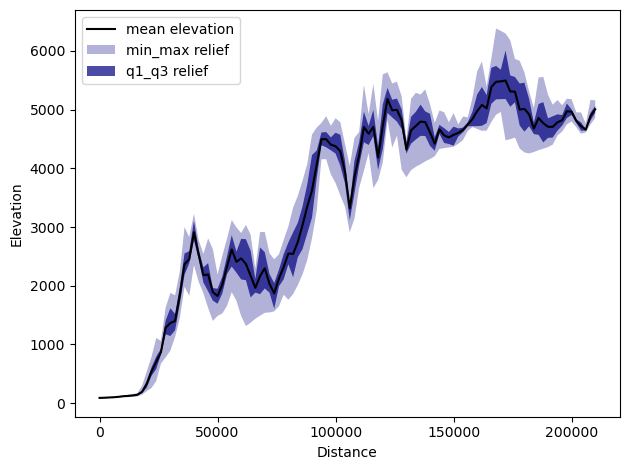

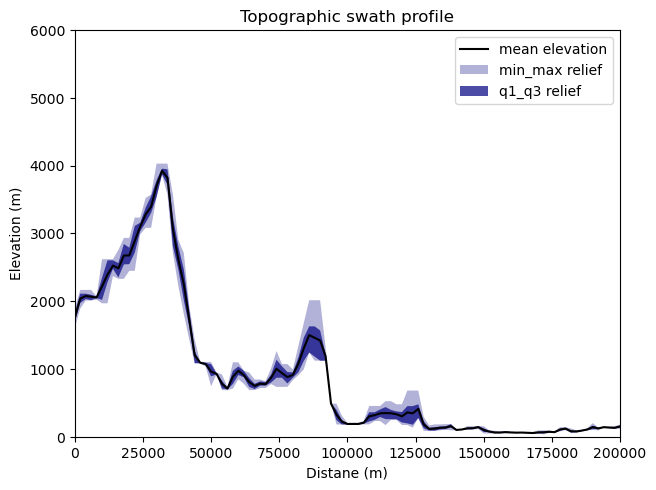

In [3]:
shape= 'kameng_swath.shp'
DEM = 'projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/'+DEM
#plt.subplot()
origx = pyosp.Orig_curv(baseline, raster, width=50000,
                       line_stepsize=2000, cross_stepsize=None)

origx.profile_plot()

shape= 'kameng_swath.shp'
TRMM = 'TRMM_subn_Dibang.tif'
baseline = '/home/biraj/Dropbox/GitHub/QGIS work space/Swath profiles/'+shape
raster = '/home/biraj/Dropbox/GitHub/QGIS work space/TRMM/Subanshiri_Dibang/'+TRMM


origy = pyosp.Orig_curv(baseline, raster, width=10000,
                       line_stepsize=2000, cross_stepsize=None)
origy.profile_plot()
plt.ylim([0,6000])
plt.xlim([0,200000])
plt.xlabel('Distane (m)')
plt.ylabel('Elevation (m)')
plt.title('Topographic swath profile')






# Slope crosssection

In [5]:
from osgeo import gdal
import subprocess
import os
#import richdem as rd
import matplotlib.pyplot as plt



In [9]:
os.chdir('/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/')
# using os, subprocess
cmd = "gdaldem slope projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif slope_projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif -compute_edges" # replace slope with aspect or hillshade
os.system(cmd)

0...10...20...30...40...50...60...70...80...90...100 - done.


0

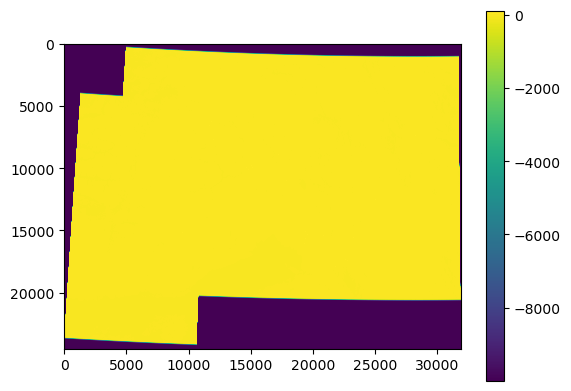

In [10]:
slp1 = gdal.Open("slope_projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif")
slp1Array = slp1.GetRasterBand(1).ReadAsArray()
# visualize (example)
plt.figure()
plt.imshow(slp1Array)
plt.colorbar()
plt.show()

In [ ]:
# using DEMProcessing
dem = gdal.Open("/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected/projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif")
slp2 = gdal.DEMProcessing("slope_projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif", dem, "slope",  computeEdges=True) # replace "slope" with "aspect" or "hillshade"
slp2Array = slp2.GetRasterBand(1).ReadAsArray()

In [7]:
pwd

'/home/biraj/Dropbox/GitHub/DEMs/Mossaic_SRTM30_QGIS/projected'

In [8]:
ls


projected_Eastern_Himalaya_Tibet_SRTM_30.tif
projected_Subanshiri_Eastern_Himalaya_Tibet_SRTM_30.tif
Project_Subanshiri_E_Tibet.tif.aux.xml


In [5]:
from pyosp import point_coords

elev = pyosp.Elev_curv(baseline, raster, width=150000,
                       min_elev=0.01,
                       line_stepsize=20000, cross_stepsize=None)

pointsPath = pyosp.datasets.get_path('/home/biraj/Dropbox/GitHub/QGIS work space/Shape files/Published Age Data points/Arunachal_AFT_all.shp')
elev.profile_plot(points=pointsPath)

Processing: [#########################] 10 of 10 lineSteps

ValueError: The dataset '/home/biraj/Dropbox/GitHub/QGIS work space/Shape files/Published Age Data points/Arunachal_AFT_all.shp' is not available. Available datasets are cross_data.txt, homo_baselineOffset.shx, crater.tif.ovr, homo_elev10.tfw, homo_start_end.sbn, center.dbf, checking_points.dbf, crater.tfw, center.shx, center.sbn, homo_elev10.tif.ovr, checking_points.shp, center.shp, homo_start_end.shp.xml, crater.tif.aux.xml, checking_points.CPG, homo_baseline.shp.xml, homo_start_end.shp, homo_baselineOffset.sbn, homo_baseline.sbn, homo_baseline.dbf, homo_start_end.shx, elev_valid.txt, homo_baselineOffset.shp, tpi_valid.txt, center.shp.xml, crater.tif.xml, checking_points.shx, homo_start_end.dbf, crater.tif, homo_baselineOffset.CPG, homo_baselineOffset.sbx, homo_baselineOffset.dbf, homo_start_end.sbx, homo_elev10.tif, checking_points.sbn, homo_baseline.shx, homo_start_end.CPG, checking_points.sbx, homo_baseline.CPG, center.sbx, homo_baseline.shp, slope_valid.txt, center.CPG, homo_mount.tif, homo_elev10.tif.aux.xml, homo_baseline.sbx, checking_points.shp.xml

In [6]:
'/home/biraj/Dropbox/GitHub/QGIS work space/Shape files/Published Age Data points/Arunachal_AFT_all.shp'

'/home/biraj/Dropbox/GitHub/QGIS work space/Shape files/Published Age Data points/Arunachal_AFT_all.shp'

In [10]:
ls

baseline.CPG  baseline.shp.xml  N44W111.hgt              new_layer.shp
baseline.dbf  baseline.shx      N44W111.SRTMGL1.hgt.zip  new_layer.shx
baseline.prj  DEMsubset.tif     N44W112.hgt              swath.ipynb
baseline.sbn  mosaic.vrt        new_layer.cpg            teton_dem.tif
baseline.sbx  N43W111.hgt       new_layer.dbf
baseline.shp  N43W112.hgt       new_layer.prj


In [12]:
baseline = 'baseline.shp'
raster = 'DEMsubset.tif'

TypeError: 'MultiLineString' object is not iterable

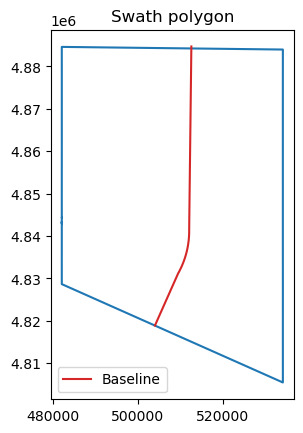

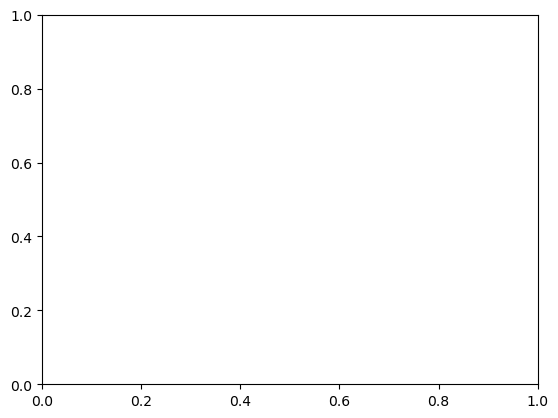

In [15]:
import matplotlib.pyplot as plt
from pyosp import read_shape

# read the baseline shape
line_shape = read_shape(baseline)
lx, ly = line_shape.xy

# Plot the swath polygon
fig, ax = plt.subplots()
swath_polygon = orig.out_polygon()
px, py = swath_polygon.exterior.xy
ax.plot(px, py)
ax.plot(lx, ly, color='C3', label="Baseline")
ax.set_aspect('equal', adjustable='box')
ax.set_title("Swath polygon")
ax.legend()

# Plot the swath profile lines
fig, ax = plt.subplots()
swath_polylines = orig.out_polylines()
for line in swath_polylines:
    x, y = line.xy
    ax.plot(x, y, color='C1')

ax.plot(lx, ly, color='C3', label="Baseline")
ax.set_aspect('equal', adjustable='box')
ax.set_title("Swath profile lines")
ax.legend()


In [13]:
orig = pyosp.Orig_curv(
    baseline,
    raster,
    width=100000,
    line_stepsize=1000,
    cross_stepsize=10
)

Processing: [#########################] 68 of 68 lineSteps

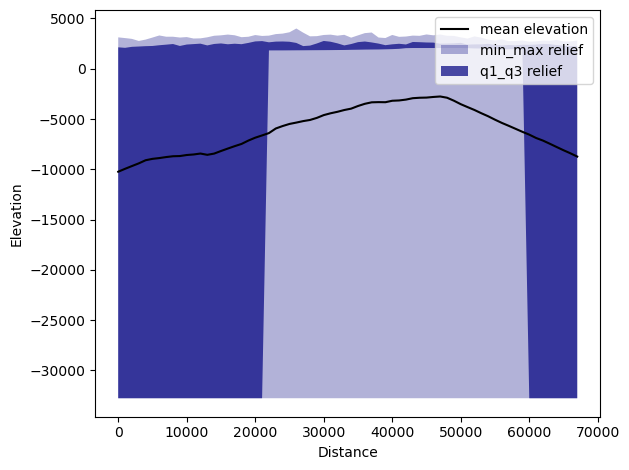

In [14]:
orig.profile_plot()

/home/biraj/anaconda3/envs/swath/lib/python3.11/site-packages/pyosp/_tpi.py:43: RuntimeWarning: divide by zero encountered in divide
  avg = (np.nansum(arr) - self.point_value()) / (np.sum(~np.isnan(arr)) - 1)


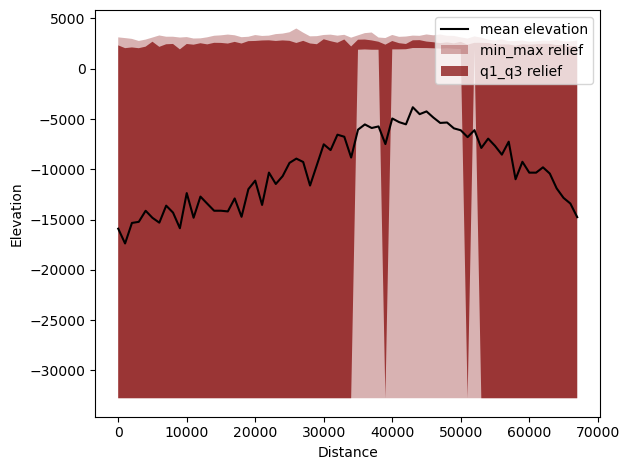

In [16]:
tpi_big = orig.post_tpi(radius=1000, min_val=0, color='maroon', swath_plot=True)


In [17]:
orig = pyosp.Orig_cir(
    baseline,
    raster,
    radius=370000,
    ng_stepsize=1,
    radial_stepsize=2000
)

tpi = pyosp.Tpi_cir(
    baseline,
    raster,
    radius=400000,
    ng_start=0,
    ng_end=360,
    tpi_radius=300000,
    min_tpi=0,
    ng_stepsize=1,
    radial_stepsize=2000
)


AttributeError: 'LineString' object has no attribute 'x'

In [20]:
orig = pyosp.Orig_curv(baseline, raster, width=1000,
                       line_stepsize=20, cross_stepsize=None)
orig.profile_plot()

Processing: [#########################] 3374 of 3374 lineSteps

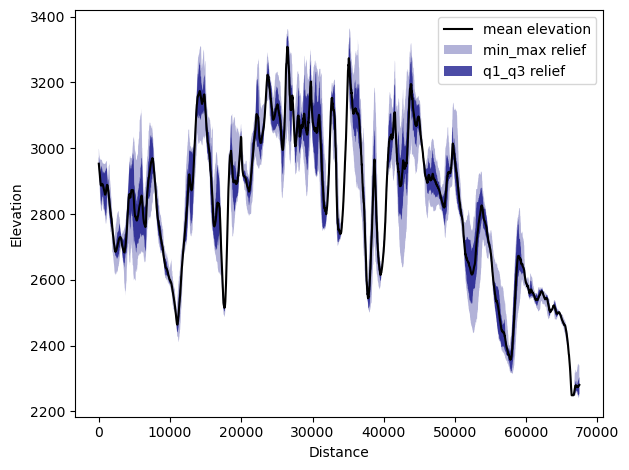

In [21]:
orig.profile_plot()


Processing: [#########################] 675 of 675 lineSteps

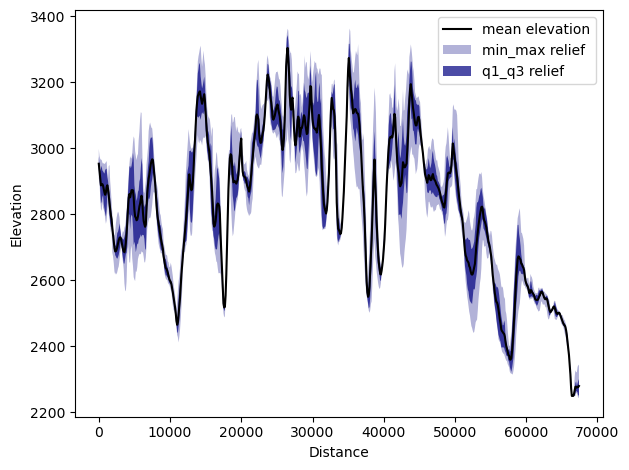

In [22]:
orig = pyosp.Orig_curv(baseline, raster, width=1000,
                       line_stepsize=100, cross_stepsize=None)
orig.profile_plot()

Processing: [#########################] 22489 of 22489 lineSteps

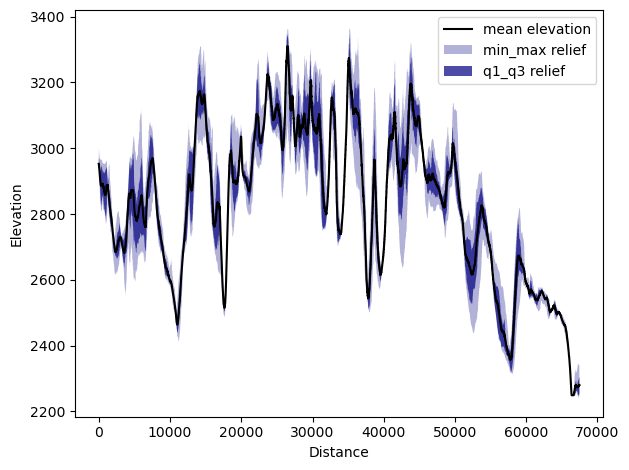

In [23]:
orig = pyosp.Orig_curv(baseline, raster, width=1000,
                       line_stepsize=3, cross_stepsize=None)
orig.profile_plot()

Processing: [#########################] 34 of 34 lineSteps

(0.0, 80000.0)

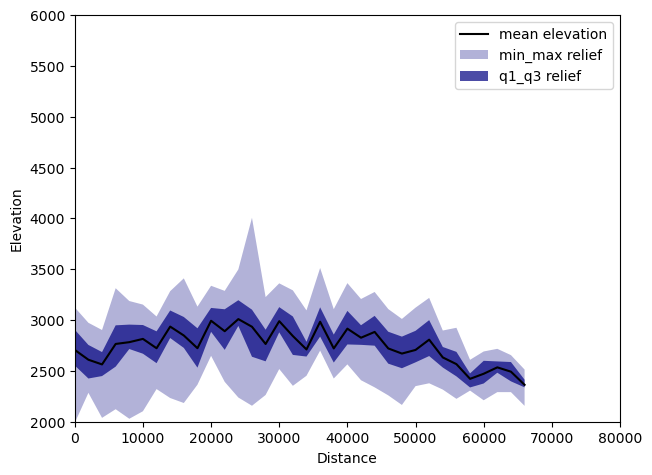

In [45]:
orig = pyosp.Orig_curv(baseline, raster, width=10000,
                       line_stepsize=2000, cross_stepsize=None)
orig.profile_plot()
plt.ylim([2000,6000])
plt.xlim([0,80000])

In [29]:
orig.distance

array([    0.,  2000.,  4000.,  6000.,  8000., 10000., 12000., 14000.,
       16000., 18000., 20000., 22000., 24000., 26000., 28000., 30000.,
       32000., 34000., 36000., 38000., 40000., 42000., 44000., 46000.,
       48000., 50000., 52000., 54000., 56000., 58000., 60000., 62000.,
       64000., 66000.])

In [34]:
orig.dat

[[2909.0,
  2916.0,
  2922.0,
  2928.0,
  2940.0,
  2947.0,
  2957.0,
  2968.0,
  2974.0,
  2977.0,
  2984.0,
  2993.0,
  2998.0,
  2998.0,
  2995.0,
  2987.0,
  2976.0,
  2950.0,
  2957.0,
  2948.0,
  2935.0,
  2941.0,
  2932.0,
  2942.0,
  2942.0,
  2939.0,
  2945.0,
  2944.0,
  2953.0,
  2948.0,
  2937.0,
  2935.0,
  2932.0],
 [2743.0,
  2741.0,
  2741.0,
  2738.0,
  2735.0,
  2735.0,
  2744.0,
  2750.0,
  2749.0,
  2745.0,
  2742.0,
  2746.0,
  2748.0,
  2744.0,
  2744.0,
  2739.0,
  2735.0,
  2729.0,
  2726.0,
  2722.0,
  2736.0,
  2740.0,
  2742.0,
  2754.0,
  2755.0,
  2765.0,
  2765.0,
  2754.0,
  2737.0,
  2720.0,
  2689.0,
  2677.0,
  2672.0],
 [2681.0,
  2672.0,
  2689.0,
  2672.0,
  2682.0,
  2675.0,
  2695.0,
  2701.0,
  2699.0,
  2719.0,
  2725.0,
  2737.0,
  2763.0,
  2783.0,
  2796.0,
  2794.0,
  2813.0,
  2821.0,
  2821.0,
  2831.0,
  2824.0,
  2829.0,
  2834.0,
  2828.0,
  2831.0,
  2830.0,
  2832.0,
  2832.0,
  2827.0,
  2836.0,
  2834.0,
  2840.0,
  2845.0],
 [2688.